In [55]:
import os,scipy
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import numpy as np
import seaborn as sns
import scanpy as sc
import gseapy
from datetime import datetime
from lifelines.utils import restricted_mean_survival_time
from lifelines.statistics import logrank_test,multivariate_logrank_test
from lifelines import KaplanMeierFitter
import lifelines 
import statsmodels
from scipy.stats import rankdata
import math
from sklearn.preprocessing import scale

from combat.pycombat import pycombat
from matplotlib.gridspec import GridSpec
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV, RepeatedKFold, cross_val_score, RepeatedStratifiedKFold, StratifiedKFold, cross_val_predict
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, LogisticRegression
from sklearn.svm import LinearSVR, SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import average_precision_score, roc_auc_score, precision_recall_fscore_support
from sklearn.metrics import confusion_matrix, auc, plot_roc_curve
from sklearn import svm
from mycolorpy import colorlist as mcp
scaler = StandardScaler()

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal as mvn

def get_km(k, X):
    km = KMeans(n_clusters=k, random_state=37)
    km.fit(X)
    return km

def get_bic_aic(k, X):
    gmm = GaussianMixture(n_components=k, init_params='kmeans')
    gmm.fit(X)
    return gmm.bic(X), gmm.aic(X)

def get_score(k, X, y):
    km = get_km(k, X)
    y_pred = km.predict(X)
    bic, aic = get_bic_aic(k, X)
    sil = silhouette_score(X, y_pred)
    db = davies_bouldin_score(X, y_pred)
    hom = homogeneity_score(y, y_pred)
    com = completeness_score(y, y_pred)
    vms = v_measure_score(y, y_pred)
    cal = calinski_harabasz_score(X, y_pred)
    return k, bic, aic, sil, db, hom, com, vms, cal


import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

plt.style.use('ggplot')

def plot_compare(df, y1, y2, x, fig, ax1):
    ax1.plot(df[x], df[y1], color='tab:red')
    ax1.set_title(f'{y1} and {y2}')
    ax1.set_xlabel(x)
    ax1.set_ylabel(y1, color='tab:red')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    ax2 = ax1.twinx()
    ax2.plot(df[x], df[y2], color='tab:blue')
    ax2.set_ylabel(y2, color='tab:blue')
    ax2.tick_params(axis='y', labelcolor='tab:blue')

def plot_contrast(df, y1, y2, x, fig, ax):
    a = np.array(df[y1])
    b = np.array(df[y2])

    r_min, r_max = df[y1].min(), df[y1].max()
    scaler = MinMaxScaler(feature_range=(r_min, r_max))
    b = scaler.fit_transform(b.reshape(-1, 1))[:,0]

    diff = np.abs(a - b)
    ax.plot(df[x], diff)
    ax.set_title('Scaled Absolute Difference')
    ax.set_xlabel(x)
    ax.set_ylabel('absolute difference')

def plot_result(df, y1, y2, x):
    fig, axes = plt.subplots(1, 1, figsize=(10, 3))
    plot_compare(df, y1, y2, x, fig, axes)
    #plot_contrast(df, y1, y2, x, fig, axes[1])
    plt.tight_layout()
    
# def plot_result(df, y1, y2, x):
#     fig, axes = plt.subplots(1, 2, figsize=(10, 3))
#     plot_compare(df, y1, y2, x, fig, axes[0])
#     plot_contrast(df, y1, y2, x, fig, axes[1])
#     plt.tight_layout()

import plotly
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram',custom_color=None):
    # maximum of 6 value cols -> 6 colors
    colorPalette=mcp.gen_color(cmap="Spectral",n=len(cat_cols))
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
    
    if not custom_color:
        # remove duplicates from labelList
        labelList = list(dict.fromkeys(labelList))
        # define colors based on number of levels
        colorList = []
        for idx, colorNum in enumerate(colorNumList):
            colorList = colorList + [colorPalette[idx]]*colorNum         
    else:
        labelList = list(custom_color.keys())
        colorList = list(custom_color.values())
        
        
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count'],
#           color = [
#                 px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)]
#                 for i in sourceTargetDf["sourceID"]
#             ],
                        
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 20
        )
        
    )
    
    fig = dict(data=[data], layout=layout, width=200, height=200)
    #print(data)  
    return fig

In [4]:
def multiclass_scorer(y_true, y_pred):
    score = np.nan
    try:
        score = roc_auc_score(y_true, y_pred, multi_class='ovr')
    except Exception: 
        pass

    return score
multi_auc = make_scorer(multiclass_scorer,needs_proba=True)


roc_auc_scoring = make_scorer(roc_auc_score, needs_proba=True, multiclass='ovr')

def classification_model_training(model, param_grid, X, y, title, n_splits=5, n_reapts=1, scoring=roc_auc_scoring):
    
    rkfold = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_reapts, random_state=123)
    gsearch = GridSearchCV(model, param_grid, cv=rkfold, scoring=multi_auc, verbose=True, 
                           return_train_score=True, n_jobs=4)
    gsearch.fit(X,y)
    print('Best Estimator')
    print(gsearch.best_estimator_)

    classifier = gsearch.best_estimator_        
    best_idx = gsearch.best_index_
    grid_results = pd.DataFrame(gsearch.cv_results_)
    print('cv score mean: {}'.format(grid_results.loc[best_idx,'mean_test_score']))
    print('=========================================')
    
    coef_df = pd.DataFrame(classifier.coef_, columns=X.columns)
    coef_df = coef_df == 0

    coeff_sum = coef_df.sum(axis=0)

    m = coeff_sum == 3
    selected_genes = coeff_sum[~m]
    print('selected_genes')
    print(selected_genes.sort_values(ascending=False))
    

    return gsearch.best_estimator_

sc.settings.set_figure_params(dpi=100)
sns.set_style("whitegrid", {'axes.grid' : False})

def km_plot_multi(df_info, category, os, event, title=''):
    
    kmf = lifelines.KaplanMeierFitter()
    plt.figure(figsize=(8,4))
    ax = plt.gca()
    category_vals = sorted(list(df_info[category].unique()))
    #val_str = '/'.join(category_vals)
    
    
    for val in category_vals:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        ax = kmf.plot_survival_function(ci_show=False, linewidth=3,)
        

    result = multivariate_logrank_test(df_info[os], df_info[category], df_info[event])
    p_val="{:.2e}".format(result.p_value)
    plt.text(0, 0.01, 'p-value: {}'.format(p_val), fontsize=15)
    if title=='':
        title = 'KM Plot - {}'.format(category)
        
    plt.title(title, fontsize=20)
    plt.xlabel('OS(month)',fontsize=15)
    plt.ylabel('Overall Survival',fontsize=15)
    plt.ylim(-0.1,1.1)
    plt.legend(fontsize=15)
    plt.grid()
    plt.show()
    return p_val



    

def km_plot_bi(df_info, category, os, event):
    category_vals = list(df_info[category].unique())
    
    for val in category_vals:
        kmf = lifelines.KaplanMeierFitter()
        plt.figure(figsize=(8,4))
        ax = plt.gca()
        
        m = df_info[category] == val
        T_test, E_test = df_info.loc[m,'OS'], df_info.loc[m,'death2']
        t_count = T_test.shape[0]
        T_control, E_control = df_info.loc[~m, 'OS'], df_info.loc[~m, 'death2']
        c_count = T_control.shape[0]
        
        kmf.fit(T_test, E_test, label='{} (n={})'.format(val, t_count))
        ax = kmf.plot_survival_function(ci_show=False, linewidth=3,)
        
        kmf.fit(T_control, E_control, label='Rest (n={})'.format(c_count))
        ax = kmf.plot_survival_function(ax=ax,ci_show=False, linewidth=3,)
        
        plt.legend(loc='upper right')
        t_res = logrank_test(T_test, T_control, event_observed_A=E_test, event_observed_B=E_control, alpha=.95)
        p_val="{:.2e}".format(t_res.p_value)
        
        
        plt.text(0, 0.01, 'p-value: {}'.format(p_val),fontsize=15)
        title = 'KM Plot - {} vs Rest'.format(val)
        plt.title(title, fontsize=20)
        plt.xlabel('OS(month)',fontsize=15)
        plt.ylabel('Overall Survival',fontsize=15)
        plt.legend(fontsize=15)
        plt.ylim(-0.1,1.1)
        plt.grid()
        plt.show()

def category_count_plot(df_mg,col_sel):
    val_counts_dict = dict()
    PC_clinical_data_sel = df_mg.loc[:,col_sel]
    for col in col_sel:
        counter = dict(Counter(PC_clinical_data_sel[col]).most_common())
        val_counts_dict[col] = counter
    
    print(val_counts_dict)
    
    sns.set(rc={'figure.figsize':(4,3), "figure.dpi":100, 'savefig.dpi':100})
    sns.set_style("ticks")

    titles = list(val_counts_dict.keys())
    

    for title in titles:
        labels = list(val_counts_dict[title].keys())
        fracs = list(val_counts_dict[title].values())
        
        
        #print(labels)
        
        if np.nan in labels:
            h_size = (len(labels)-1)*0.5
        else:
            h_size = len(labels)*0.5
        

        sns.set(rc={'figure.figsize':(4,h_size)})
        sns.set_style("ticks")
        sns.barplot(x=fracs,y=labels,palette=sns.color_palette("hls", 8))
        plt.title(title,fontsize=18)
        plt.yticks(fontsize=15)
        plt.xticks(fontsize=12)
        plt.show()
        
def scatter_plot(df, x, y, hue=None):
    pearsonr_res = scipy.stats.pearsonr(df[x], df[y])
    p_r,p_p = pearsonr_res[0],pearsonr_res[1]
    
    spearmanr_res = scipy.stats.spearmanr(df[x], df[y])
    s_r,s_p = spearmanr_res[0],spearmanr_res[1]
    
    text1 = 'Pearson:\n R={:.4f}, p-val={:.2e}'.format(p_r,p_p)
    text2 = 'Spearman:\n R={:.4f}, p-val={:.2e}'.format(s_r,s_p)
    
    sns.set(rc={'figure.figsize':(3,3), "figure.dpi":100, 'savefig.dpi':100})
    sns.set_style("ticks")
    sns.scatterplot(data=df, x=x, y=y, hue=hue, alpha=0.5, color='red')
    
    title = '{} and {}'.format(x, y)
    plt.title(title)
    diff = (df[x].max()-df[x].min())/10
    x_pos = df[x].min()+diff
    y_pos = df[y].min()
    plt.text(x_pos, y_pos, text1,fontsize=10)
    #plt.text(8, 0.7, text2,fontsize=10)
    
    plt.show()


def Count2TPM(df):
    all_sum = df.sum()
    multi = 1000000/all_sum
    return df*multi
def idx_mapping(x):
    return 'Patient{}'.format(x)
def str_replace(x):
    return x.replace('_',' ')


def km_plot_multi_p(df_info, category, os, event, title=''):
    
    kmf = lifelines.KaplanMeierFitter()
    #plt.figure(figsize=(8,4))
    #ax = plt.gca()
    category_vals = sorted(list(df_info[category].unique()))
    #val_str = '/'.join(category_vals)
        

    result = multivariate_logrank_test(df_info[os], df_info[category], df_info[event])
    return result.p_value

def add_suffx(x):
    return 'Subtype_'+str(x)

def get_medtime(df_info, category, os, event):
    i=0
    kmf = lifelines.KaplanMeierFitter()
    #plt.figure(figsize=(8,4))
    #ax = plt.gca()
    m = ~df_info[category].isna()
    df_info = df_info[m]
    category_vals = list(df_info[category].unique())
    
    if len(category_vals) > 6:
        colormap=mcp.gen_color(cmap="Set2",n=len(category_vals))
    else:
        colormap=mcp.gen_color(cmap="Set2",n=6)
    
    
    median_os = df_info[os].median()
    group_os = dict()
    for val in category_vals:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        time = kmf.predict(median_os)
        group_os[val]=time

    m_survival = pd.DataFrame.from_dict(group_os, orient='index', columns=['m_survival']).sort_values(by='m_survival', ascending=False)
    return m_survival

def km_plot(df_info, category, os, event, title='', order=None, Pos=None, color=None):
    i=0
    kmf = lifelines.KaplanMeierFitter()
    #plt.figure(figsize=(8,4))
    #ax = plt.gca()
    m = ~df_info[category].isna()
    df_info = df_info[m]
    category_vals = list(df_info[category].unique())
    if color:
        colormap = color
    else:
        if len(category_vals) > 6:
            colormap=mcp.gen_color(cmap="Set2",n=len(category_vals))
        else:
            colormap=mcp.gen_color(cmap="Set2",n=6)
         
    median_os = df_info[os].median()
    group_os = dict()
    for val in category_vals:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        time = kmf.predict(median_os)
        group_os[val]=time

    m_survival = pd.DataFrame.from_dict(group_os, orient='index', columns=['m_survival']).sort_values(by='m_survival', ascending=True)
    sorted_category = list(m_survival.index)
    
    if order:
        sorted_category = order
    
    for val in sorted_category:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        kmf.plot_survival_function(ci_show=False, linewidth=3, show_censors=False, color=colormap[i])
        i+=1
        

    result = multivariate_logrank_test(df_info[os], df_info[category], df_info[event])
    p_val="{:.2e}".format(result.p_value)
    if Pos:
        plt.text(Pos[0], Pos[1], 'p-value: {}'.format(p_val), fontsize=15)
    else:
        plt.text(0, 0.05, 'p-value: {}'.format(p_val), fontsize=15)
    
    if title:
        plt.title(title, fontsize=20)
        
    plt.xlabel('Time (month)',fontsize=15)
    plt.ylabel('Overall Survival',fontsize=15)
    plt.ylim((0,1.03))
    plt.show()
    return p_val


def km_plot_s(df_info, category, os, event, colormap, order=None, Pos=None):
    i=0
    kmf = lifelines.KaplanMeierFitter()
    #plt.figure(figsize=(8,4))
    #ax = plt.gca()
    m = ~df_info[category].isna()
    df_info = df_info[m]
    category_vals = list(df_info[category].unique())
    
    
    median_os = df_info[os].median()
    group_os = dict()
    for val in category_vals:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        time = kmf.predict(median_os)
        group_os[val]=time

    m_survival = pd.DataFrame.from_dict(group_os, orient='index', columns=['m_survival']).sort_values(by='m_survival', ascending=True)
    sorted_category = list(m_survival.index)
    
    if order:
        sorted_category = order
    
    for val in sorted_category:
        m = df_info[category] == val
        count = sum(m)
        label = "{}".format(val)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        kmf.plot_survival_function(ci_show=False, linewidth=3, show_censors=False, color=colormap[i])
        i+=1
        

    result = multivariate_logrank_test(df_info[os], df_info[category], df_info[event])
    p_val="{:.2e}".format(result.p_value)
    
    
    plt.title(None)
    plt.xlabel('Months',fontsize=15)
    plt.ylabel('OS',fontsize=15)
    plt.ylim((0,1.03))
    plt.grid(True)
    plt.show()
    return p_val


def get_medtime(df_info, category, os, event):
    i=0
    kmf = lifelines.KaplanMeierFitter()
    #plt.figure(figsize=(8,4))
    #ax = plt.gca()
    m = ~df_info[category].isna()
    df_info = df_info[m]
    category_vals = list(df_info[category].unique())
    
    if len(category_vals) > 6:
        colormap=mcp.gen_color(cmap="Set2",n=len(category_vals))
    else:
        colormap=mcp.gen_color(cmap="Set2",n=6)
    
    
    median_os = df_info[os].median()
    group_os = dict()
    for val in category_vals:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        time = kmf.predict(median_os)
        group_os[val]=time

    m_survival = pd.DataFrame.from_dict(group_os, orient='index', columns=['m_survival']).sort_values(by='m_survival', ascending=True)
    return m_survival

def survival_order(df_info, category, os, event):
    i=0
    kmf = lifelines.KaplanMeierFitter()
    #plt.figure(figsize=(8,4))
    #ax = plt.gca()
    m = ~df_info[category].isna()
    df_info = df_info[m]
    category_vals = list(df_info[category].unique())
    
    if len(category_vals) > 6:
        colormap=mcp.gen_color(cmap="Set2",n=len(category_vals))
    else:
        colormap=mcp.gen_color(cmap="Set2",n=6)
    
    
    median_os = df_info[os].median()
    group_os = dict()
    for val in category_vals:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        time = kmf.predict(median_os)
        group_os[val]=time

    m_survival = pd.DataFrame.from_dict(group_os, orient='index', columns=['m_survival']).sort_values(by='m_survival', ascending=False)
    return '-'.join(list(m_survival.index))

In [3]:
# update = sc.read_h5ad('/mnt/HDD1/Work_SNU_JoongHo/1.ClinicalData_Cleaning/SNU_AnnDataForm_20221222.h5ad')
# update_obs = update.obs.copy()
# update_obs

# SNU_adata = sc.read_h5ad('SNU_AnnDataForm.h5ad')
# SNU_adata_obs = SNU_adata.obs.copy()
# common_cols = set(update_obs.columns)&set(SNU_adata_obs.columns)
# common_cols
# SNU_adata_obs

# SNU_adata_obs.loc[:,common_cols] = update_obs.loc[:,common_cols]
# SNU_adata_obs

# SNU_adata.obs = SNU_adata_obs
# SNU_adata.write('SNU_AnnDataForm.h5ad')

In [5]:
SNU_adata = sc.read_h5ad('SNU_AnnDataForm.h5ad')
SNU_adata.obs['Dataset'] = 'SNUBH'
sc.pp.log1p(SNU_adata)

TCGA_adata = sc.read_h5ad('TCGA_AnnDataForm.h5ad')
TCGA_adata.obs['Dataset'] = 'TCGA'
OS_STATUS_dict = dict()
OS_STATUS_dict['0:LIVING']=0
OS_STATUS_dict['1:DECEASED']=1
TCGA_adata.obs['OS_event'] = TCGA_adata.obs['OS_STATUS'].map(OS_STATUS_dict)
TCGA_adata.obs['OS_F'] = TCGA_adata.obs['OS_MONTHS']
sc.pp.log1p(TCGA_adata)

Bailey_adata = sc.read_h5ad('Bailey_AnnDataForm.h5ad')
Bailey_adata.obs['Dataset'] = 'Bailey'
Bailey_STATUS_dict = dict()
Bailey_STATUS_dict['Deceased - Of Disease']=1
Bailey_STATUS_dict['Alive - Without Disease']=0
Bailey_STATUS_dict['Alive - With Disease']=0
Bailey_STATUS_dict['Deceased - Of Other Cause']=1
Bailey_STATUS_dict['Deceased - Of Unknown Cause']=1
Bailey_adata.obs['OS_event'] = Bailey_adata.obs['Status'].map(Bailey_STATUS_dict)
Bailey_adata.obs['OS_F'] = Bailey_adata.obs['Length of Follow Up (months)']

SNU_annot = SNU_adata.obs.copy()
TCGA_annot = TCGA_adata.obs.copy()
Bailey_annot = Bailey_adata.obs.copy()

In [6]:
cols = ['Tumor Subtype', 'TME Subtype', 'Moffitt Subtype', 'Bailey Subtype', 'Chan-Seng-Yue Subtype']
SNU_adata.obs.loc[:,cols].to_csv('SNUBH_Annotation.csv')

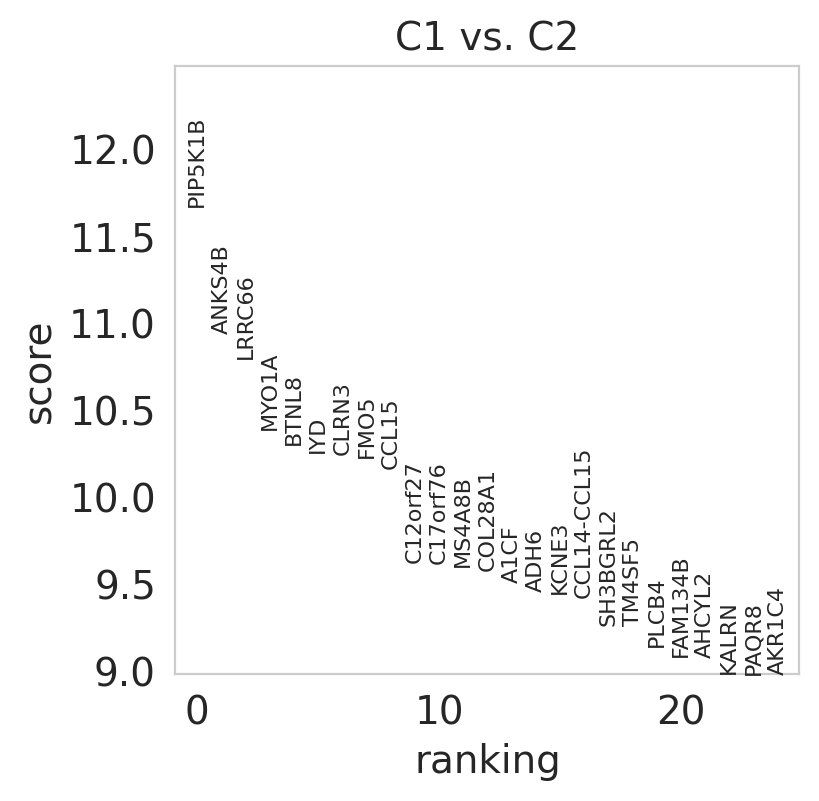

total genes: 671


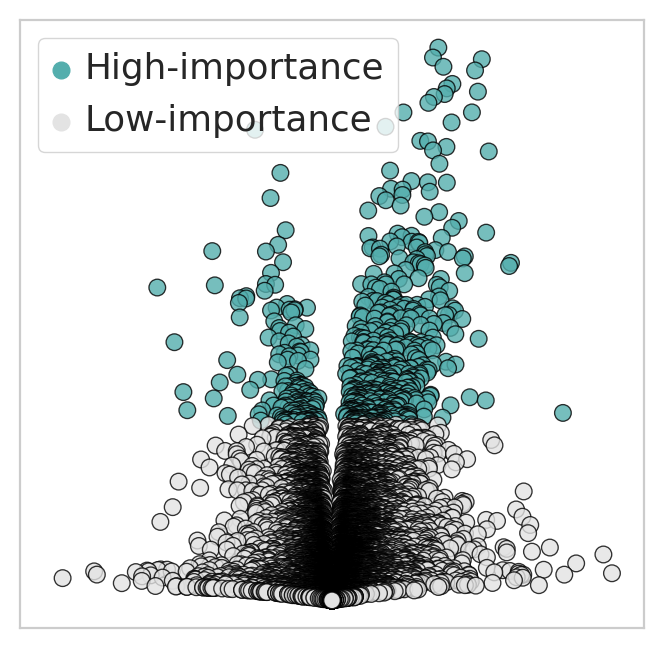

In [7]:
bx = Bailey_adata.to_df()
bx_min = bx.min().min()
bx = bx-bx_min
b_adata = sc.AnnData(bx)
b_adata.obs = Bailey_annot

target_adata = TCGA_adata.copy()


test_method = 't-test' # wilcoxon / t-test
target_group = 'Tumor Subtype'

test = 'C1'
control = 'C2'
sc.tl.rank_genes_groups(target_adata, target_group, groups=[test], reference=control, method=test_method)
sc.pl.rank_genes_groups(target_adata, n_genes=25, sharey=False, ncols=2, wspace=0.5)

result = target_adata.uns['rank_genes_groups']
df_deg = pd.DataFrame(index = result['names'][test] )
for key in ['logfoldchanges', 'pvals', 'pvals_adj', 'scores']:
    df_deg[key] = result[key][test]
#df_wilcoxon.columns = ['logfoldchanges', 'wilcoxon-pvals', 'wilcoxon-pvals_adj', 'wilcoxon-scores']
df_deg = df_deg.sort_values(by='pvals')

threshold = 0.0001
m = df_deg['pvals_adj'] < threshold
df_deg_sel = df_deg[m]
total_unique = list(df_deg_sel.index)
print('total genes: {}'.format(len(total_unique)))

df_deg['Marker'] = 'Low-importance'
m = df_deg.index.isin(total_unique)
df_deg.loc[m,'Marker'] = 'High-importance'
df_deg['negative log(p-value)'] = -df_deg['pvals'].map(np.log)
df_deg

xlim = df_deg['logfoldchanges'].abs().max()+0.5

cmap = mcp.gen_color(cmap="Spectral",n=7)
c1 = cmap[1]
c2 = cmap[2]
c3 = cmap[5]
sns.color_palette(cmap)

b_dict = dict()
b_dict['High-importance'] = c1
b_dict['Low-importance'] = '#e3e3e3'

s_dict = dict()
s_dict['High-importance'] = c2
s_dict['Low-importance'] = '#e3e3e3'

t_dict = dict()
t_dict['High-importance'] = c3
t_dict['Low-importance'] = '#e3e3e3'

ax = sns.scatterplot(data=df_deg, x='logfoldchanges', y='negative log(p-value)', 
                     hue='Marker', palette=t_dict, edgecolor="black", alpha=0.8)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xlim(left=-7, right=7)
ax.legend(title=None)
plt.show()

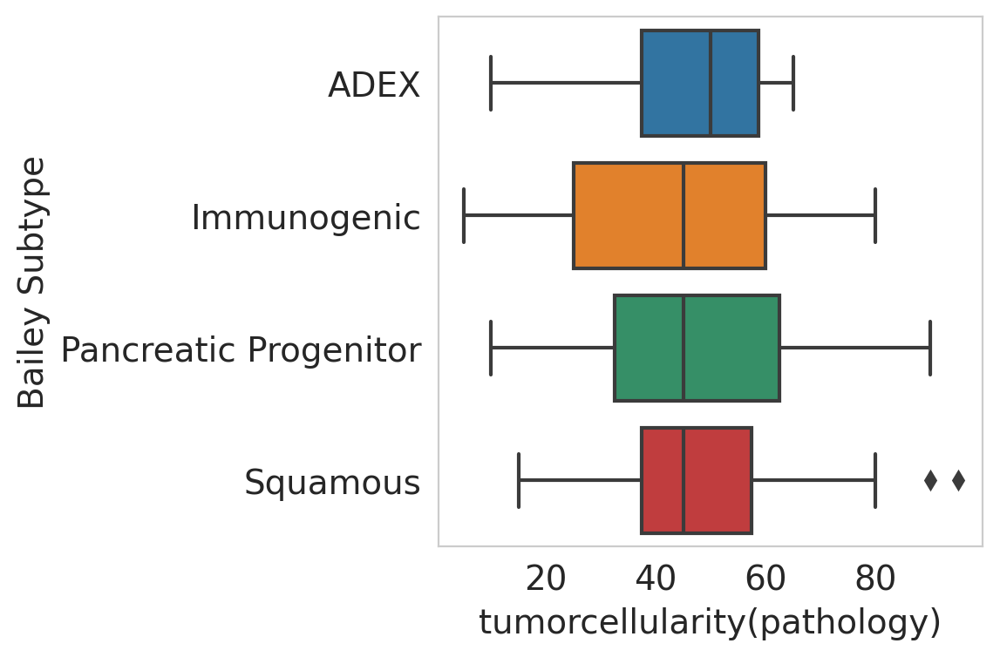

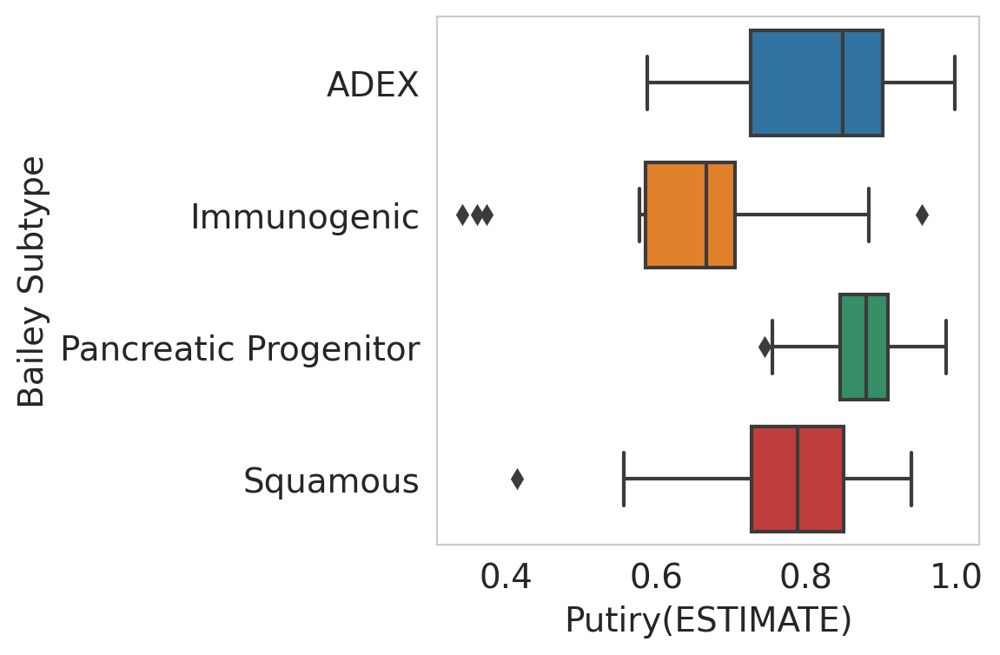

In [8]:
purity = pd.read_csv('/mnt/HDD1/Work_SNU_JoongHo/4.CopyNum_TumorPurity/Subtype_AND_TumorPurity.csv',index_col=0)
SNU_annot['Putiry(ESTIMATE)'] = purity['TumorPurity']
SNU_annot['tumorcellularity(pathology)']=SNU_annot['tumorcellularity(pathology)'].astype(float)
sns.boxplot(data=SNU_annot, x='tumorcellularity(pathology)', y='Bailey Subtype')
plt.show()
sns.boxplot(data=SNU_annot, x='Putiry(ESTIMATE)', y='Bailey Subtype')
plt.show()

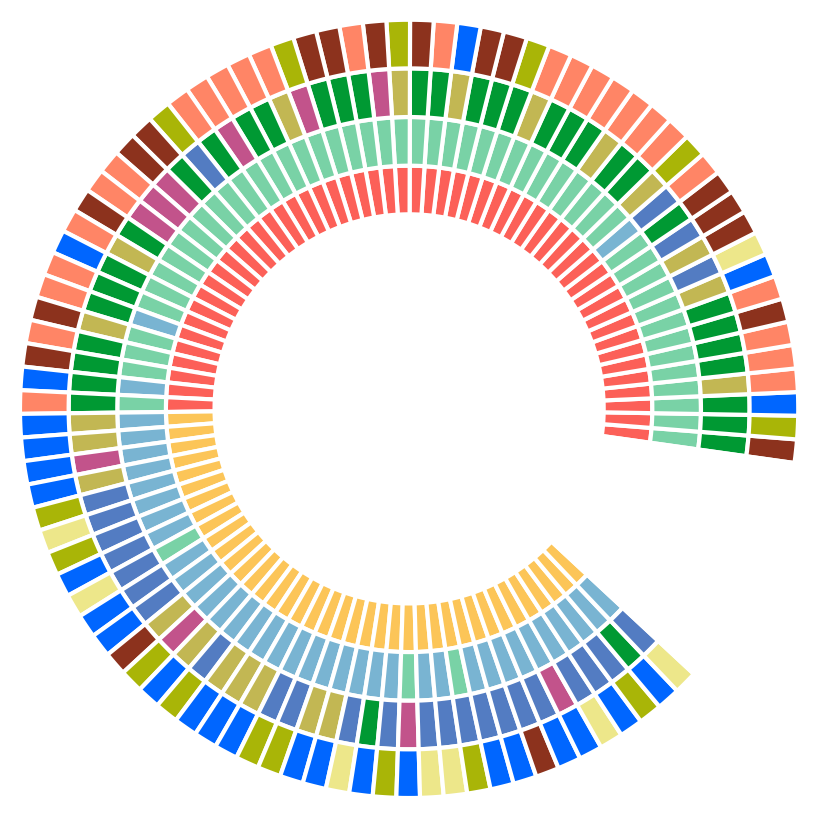

In [9]:
annot = SNU_annot.sort_values(by='Tumor Subtype')
dummy1 = pd.DataFrame(columns = annot.columns, index = list(range(10)))
annot = pd.concat([annot,dummy1])
annot

c_dict = dict()
c_dict['a']='#e35fc4'
c_dict['b']='#5f7ce3'
c_dict['tmp']='#e3755f'

startangle = -8

fig, ax = plt.subplots()
width = 0.2
radius = 1
ax.axis('equal')
group_size = [1]*annot.shape[0]

labels = list(annot['Tumor Subtype'])
c_dict['C1']='#fc6058'
c_dict['C2']='#fcc558'
colors = list(annot['Tumor Subtype'].map(c_dict))
colors = ['#ffffff' if pd.isna(x) else x for x in colors]

mypie, _ = ax.pie(group_size, radius=radius, labels=None, colors=colors, startangle=startangle)
plt.setp(mypie, width=width, edgecolor='white', linewidth=1.5)


labels = list(annot['Moffitt Subtype'])
c_dict['Classical'] = '#79d2a6'
c_dict['BasalLike'] = '#79b4d2'
colors = list(annot['Moffitt Subtype'].map(c_dict))
colors = ['#ffffff' if pd.isna(x) else x for x in colors]
mypie2, _ = ax.pie(group_size, radius=radius + width, labels=None, colors=colors, startangle=startangle)
plt.setp(mypie2, width=width, edgecolor='white', linewidth=1.5)


labels = list(annot['Bailey Subtype'])
c_dict['Pancreatic Progenitor'] = '#009933'
c_dict['Immunogenic'] = '#c2b753'
c_dict['ADEX'] = '#c2538b'
c_dict['Squamous'] = '#537cc2'
colors = list(annot['Bailey Subtype'].map(c_dict))
colors = ['#ffffff' if pd.isna(x) else x for x in colors]
mypie3, _ = ax.pie(group_size, radius=radius + width*2, labels=None, colors=colors, startangle=startangle)
plt.setp(mypie3, width=width, edgecolor='white', linewidth=1.5)

labels = list(annot['Chan-Seng-Yue Subtype'])
c_dict['Classical-A']='#8c321d'
c_dict['Classical-B']='#ff8566'
c_dict['BasalLike-A']='#a9b507'
c_dict['BasalLike-B']='#ede78a'
c_dict['Hybrid']='#0066ff'
colors = list(annot['Chan-Seng-Yue Subtype'].map(c_dict))
colors = ['#ffffff' if pd.isna(x) else x for x in colors]
mypie4, _ = ax.pie(group_size, radius=radius + width*3, labels=None, colors=colors, startangle=startangle)
plt.setp(mypie4, width=width, edgecolor='white', linewidth=1.5)

plt.show()

# Classical&C1&Pancreatic Progenitor

In [8]:
# annot = SNU_annot.sort_values(by='Tumor Subtype')

# annot['explode'] = 'tmp'
# m1 = annot['Tumor Subtype'] == 'C1'
# m2 = annot['Moffitt Subtype'] == 'Classical'
# m3 = annot['Bailey Subtype'] == 'Pancreatic Progenitor'
# m=m1&m2&m3
# annot.loc[m,'explode'] = 'a'

# m1 = annot['Tumor Subtype'] == 'C2'
# m2 = annot['Moffitt Subtype'] == 'BasalLike'
# m3 = annot['Bailey Subtype'] == 'Squamous'
# m=m1&m2&m3
# annot.loc[m,'explode'] = 'b'
# annot = annot.sort_values(by='explode')
# df_list = []
# for key,df in annot.groupby('explode'):
#     df_list.append(df)

# dummy1 = pd.DataFrame(columns = annot.columns, index = list(range(5)))
# dummy2 = pd.DataFrame(columns = annot.columns, index = list(range(10)))

# annot = pd.concat([df_list[0],dummy1,df_list[1],dummy1,df_list[2],dummy2])
# annot

# labels = list(annot['explode'])
# c_dict = dict()
# c_dict['a']='#e35fc4'
# c_dict['b']='#5f7ce3'
# c_dict['tmp']='#e3755f'
# # explode = [0.2]*annot['explode'].value_counts()['a']
# # explode = explode+[0.3]*annot['explode'].value_counts()['b']
# # explode = explode+[0]*annot['explode'].value_counts()['tmp']
# # explode = explode+[0]*(annot.shape[0]-len(explode))


# fig, ax = plt.subplots()
# width = 0.2
# radius = 1

# ax.axis('equal')

# group_size = [1]*annot.shape[0]

# labels = list(annot['Tumor Subtype'])
# c_dict['C1']='#fc6058'
# c_dict['C2']='#fcc558'
# colors = list(annot['Tumor Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]

# mypie, _ = ax.pie(group_size, radius=radius, labels=None, colors=colors, startangle=10)
# plt.setp(mypie, width=width, edgecolor='white', linewidth=1.5)


# labels = list(annot['Moffitt Subtype'])
# c_dict['Classical'] = '#79d2a6'
# c_dict['BasalLike'] = '#79b4d2'
# colors = list(annot['Moffitt Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]

# mypie2, _ = ax.pie(group_size, radius=radius + width, labels=None, colors=colors, startangle=10)
# plt.setp(mypie2, width=width, edgecolor='white', linewidth=1.5)



# labels = list(annot['Bailey Subtype'])
# c_dict['Pancreatic Progenitor'] = '#009933'
# c_dict['Immunogenic'] = '#c2b753'
# c_dict['ADEX'] = '#c2538b'
# c_dict['Squamous'] = '#537cc2'
# colors = list(annot['Bailey Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]

# mypie3, _ = ax.pie(group_size, radius=radius + width*2, labels=None, colors=colors, startangle=10)
# plt.setp(mypie3, width=width, edgecolor='white', linewidth=1.5)


# labels = list(annot['Chan-Seng-Yue Subtype'])
# c_dict['Classical-A']='#8c321d'
# c_dict['Classical-B']='#ff8566'
# c_dict['BasalLike-A']='#a9b507'
# c_dict['BasalLike-B']='#ede78a'
# c_dict['Hybrid']='#0066ff'
# colors = list(annot['Chan-Seng-Yue Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]
# mypie4, _ = ax.pie(group_size, radius=radius + width*3, labels=None, colors=colors, startangle=10)
# plt.setp(mypie4, width=width, edgecolor='white', linewidth=1.5)


# colors = list(annot['explode'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]
# mypie4, _ = ax.pie(group_size, radius=radius + width*4, labels=None, 
#                   colors=colors, startangle=10)
# plt.setp(mypie4, width=width, edgecolor='white', linewidth=1.5)
# plt.show()


# Classical & C1

In [9]:
# annot = SNU_annot.sort_values(by='Tumor Subtype')

# annot['explode'] = 'tmp'
# m1 = annot['Tumor Subtype'] == 'C1'
# m2 = annot['Moffitt Subtype'] == 'Classical'
# m=m1&m2
# annot.loc[m,'explode'] = 'a'

# m1 = annot['Tumor Subtype'] == 'C2'
# m2 = annot['Moffitt Subtype'] == 'BasalLike'
# m=m1&m2
# annot.loc[m,'explode'] = 'b'
# annot = annot.sort_values(by='explode')
# df_list = []
# for key,df in annot.groupby('explode'):
#     df_list.append(df)

# dummy1 = pd.DataFrame(columns = annot.columns, index = list(range(5)))
# dummy2 = pd.DataFrame(columns = annot.columns, index = list(range(10)))

# annot = pd.concat([df_list[0],dummy1,df_list[1],dummy1,df_list[2],dummy2])
# annot

# labels = list(annot['explode'])
# c_dict = dict()
# c_dict['a']='#e35fc4'
# c_dict['b']='#5f7ce3'
# c_dict['tmp']='#e3755f'
# # explode = [0.2]*annot['explode'].value_counts()['a']
# # explode = explode+[0.3]*annot['explode'].value_counts()['b']
# # explode = explode+[0]*annot['explode'].value_counts()['tmp']
# # explode = explode+[0]*(annot.shape[0]-len(explode))


# fig, ax = plt.subplots()
# width = 0.2
# radius = 1

# ax.axis('equal')

# group_size = [1]*annot.shape[0]

# labels = list(annot['Tumor Subtype'])
# c_dict['C1']='#fc6058'
# c_dict['C2']='#fcc558'
# colors = list(annot['Tumor Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]

# mypie, _ = ax.pie(group_size, radius=radius, labels=None, colors=colors, startangle=10)
# plt.setp(mypie, width=width, edgecolor='white', linewidth=1.5)


# labels = list(annot['Moffitt Subtype'])
# c_dict['Classical'] = '#79d2a6'
# c_dict['BasalLike'] = '#79b4d2'
# colors = list(annot['Moffitt Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]

# mypie2, _ = ax.pie(group_size, radius=radius + width, labels=None, colors=colors, startangle=10)
# plt.setp(mypie2, width=width, edgecolor='white', linewidth=1.5)



# labels = list(annot['Bailey Subtype'])
# c_dict['Pancreatic Progenitor'] = '#009933'
# c_dict['Immunogenic'] = '#c2b753'
# c_dict['ADEX'] = '#c2538b'
# c_dict['Squamous'] = '#537cc2'
# colors = list(annot['Bailey Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]

# mypie3, _ = ax.pie(group_size, radius=radius + width*2, labels=None, colors=colors, startangle=10)
# plt.setp(mypie3, width=width, edgecolor='white', linewidth=1.5)


# labels = list(annot['Chan-Seng-Yue Subtype'])
# c_dict['Classical-A']='#8c321d'
# c_dict['Classical-B']='#ff8566'
# c_dict['BasalLike-A']='#a9b507'
# c_dict['BasalLike-B']='#ede78a'
# c_dict['Hybrid']='#0066ff'
# colors = list(annot['Chan-Seng-Yue Subtype'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]
# mypie4, _ = ax.pie(group_size, radius=radius + width*3, labels=None, colors=colors, startangle=10)
# plt.setp(mypie4, width=width, edgecolor='white', linewidth=1.5)


# colors = list(annot['explode'].map(c_dict))
# colors = ['#ffffff' if pd.isna(x) else x for x in colors]
# mypie4, _ = ax.pie(group_size, radius=radius + width*4, labels=None, 
#                   colors=colors, startangle=10)
# plt.setp(mypie4, width=width, edgecolor='white', linewidth=1.5)
# plt.show()


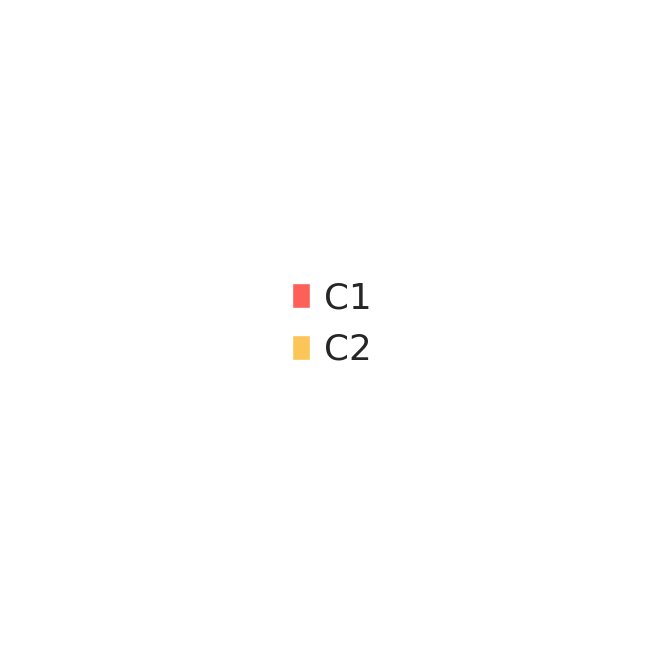

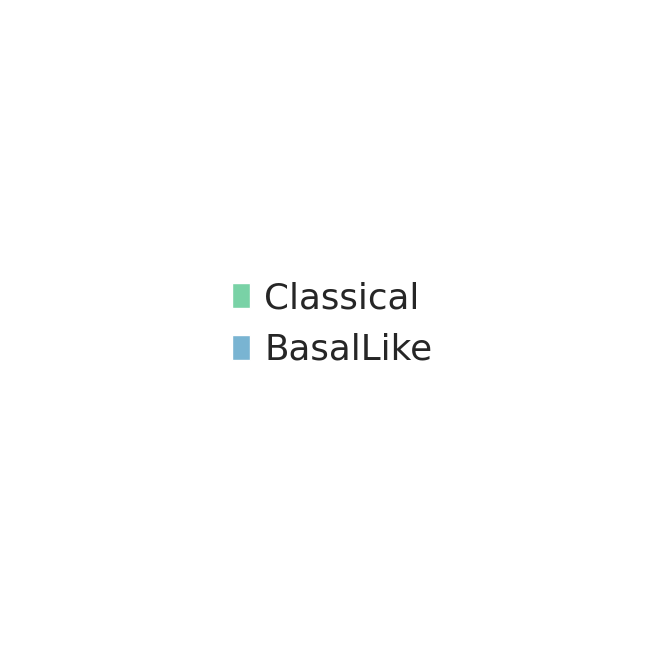

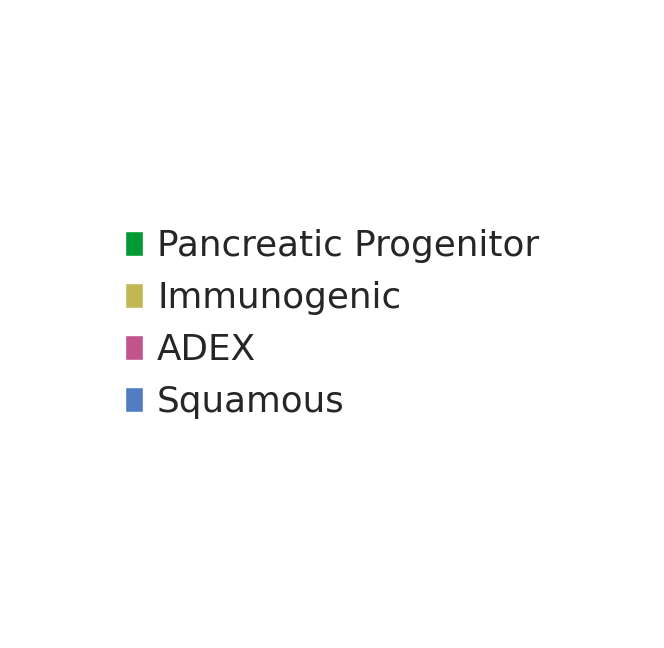

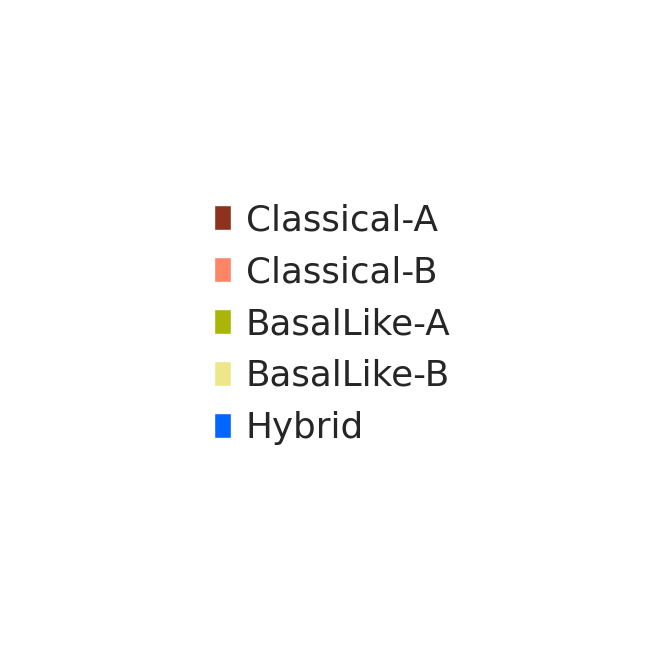

In [10]:
from matplotlib.patches import Patch
fig, ax = plt.subplots()
c_dict = dict()
c_dict['C1']='#fc6058'
c_dict['C2']='#fcc558'
handles=[mpatches.Patch(facecolor=c_dict[name]) for name in c_dict]
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_frame_on(False)
ax.legend(handles=handles, labels=c_dict.keys(), loc='center', frameon=False)
plt.show()

fig, ax = plt.subplots()
c_dict = dict()
c_dict['Classical'] = '#79d2a6'
c_dict['BasalLike'] = '#79b4d2'
handles=[mpatches.Patch(facecolor=c_dict[name]) for name in c_dict]
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_frame_on(False)
ax.legend(handles=handles, labels=c_dict.keys(), loc='center', frameon=False)
plt.show()

fig, ax = plt.subplots()
c_dict = dict()
c_dict['Pancreatic Progenitor'] = '#009933'
c_dict['Immunogenic'] = '#c2b753'
c_dict['ADEX'] = '#c2538b'
c_dict['Squamous'] = '#537cc2'
handles=[mpatches.Patch(facecolor=c_dict[name]) for name in c_dict]
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_frame_on(False)
ax.legend(handles=handles, labels=c_dict.keys(),loc='center', frameon=False)
plt.show()

fig, ax = plt.subplots()
c_dict = dict()
c_dict['Classical-A']='#8c321d'
c_dict['Classical-B']='#ff8566'
c_dict['BasalLike-A']='#a9b507'
c_dict['BasalLike-B']='#ede78a'
c_dict['Hybrid']='#0066ff'
handles=[mpatches.Patch(facecolor=c_dict[name]) for name in c_dict]
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_frame_on(False)
ax.legend(handles=handles, labels=c_dict.keys(), loc='center', frameon=False)
plt.show()

In [11]:
table_genes = pd.read_csv('Gene_table.csv',index_col=0)
table_genes

,Type,Gene
0,Tumor_Pos,TST
1,Tumor_Pos,SULT1B1
2,Tumor_Pos,GPR160
3,Tumor_Pos,CAPN6
4,Tumor_Pos,AHCYL2
...,...,...
46,TME_Neg,PTPRC
47,TME_Neg,HLA-DPA1
48,TME_Neg,FAP
49,TME_Neg,TLR1


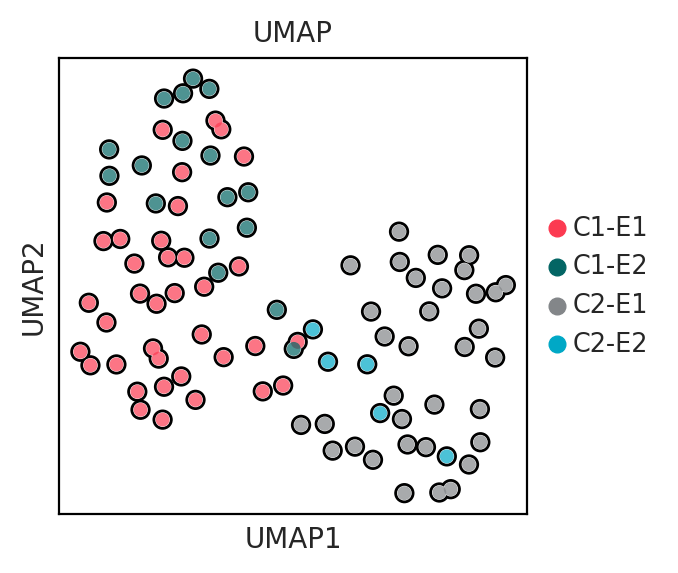

In [12]:
colormap = ['#FC3A51','#036564','#838689','#00A8C6']
features = list(table_genes['Gene'])

SNU_adata_tmp = SNU_adata[:,features]
sc.pp.highly_variable_genes(SNU_adata_tmp,n_top_genes=len(features))
SNU_adata_HVG = SNU_adata_tmp[:,SNU_adata_tmp.var.highly_variable]

sc.tl.pca(SNU_adata_HVG, svd_solver='arpack', n_comps = 15)
sc.pp.neighbors(SNU_adata_HVG, n_neighbors=9)

sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=10)
sc.tl.umap(SNU_adata_HVG,)
sc.pl.umap(SNU_adata_HVG, color=['Final Subtype'], s=100, wspace=0.4, title='UMAP', palette = colormap, add_outline=True, outline_width=(0.2, 0.03)
          ,)

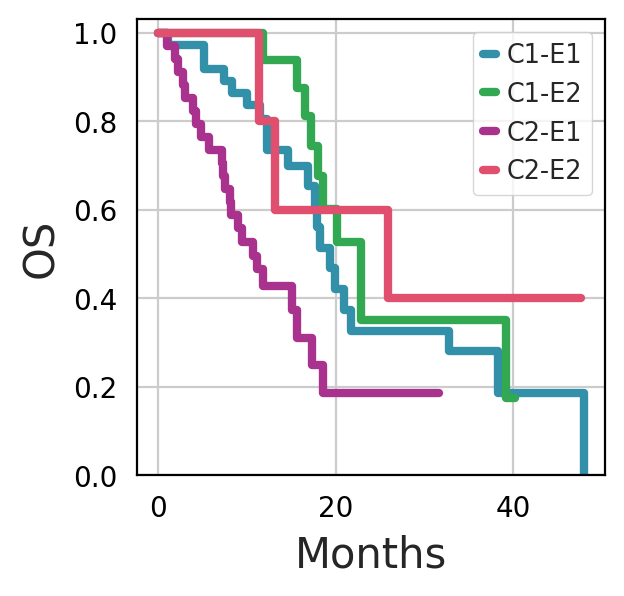

'1.56e-03'

In [13]:
colormap = ['#fcc558','#fc6058']
colormap = ['#5bb6eb','#5beba8']
colormap = ['#3290a8','#32a852','#a8328e','#e04f6e']
km_plot_s(SNU_annot, 'Final Subtype',  os='OS_F', event='OS_event', colormap=colormap, order=['C1-E1','C1-E2','C2-E1','C2-E2'], Pos=None)

# Tumor Subtype

## SNUBH

In [14]:
umap_color = ['#fc6058', '#fcc558']
m = table_genes['Type'].isin(['Tumor_Pos','Tumor_Neg'])
features = list(table_genes.loc[m,'Gene'])
len(features)

110

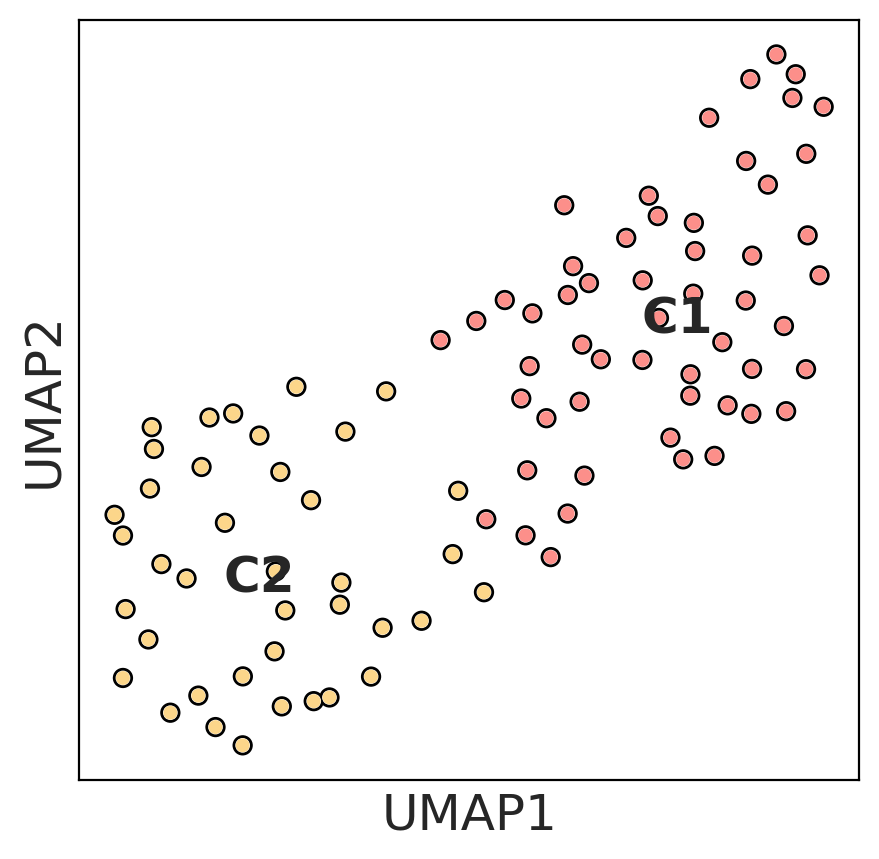

SNUBH data - SNUBH subtype


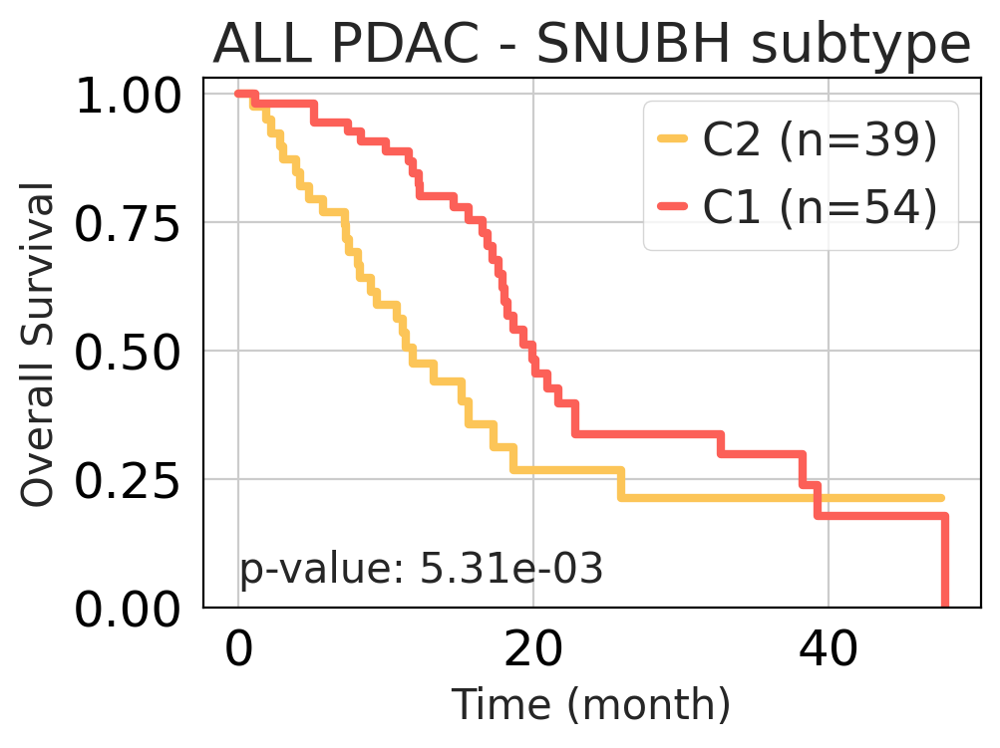

SNUBH data - Moffitt subtype


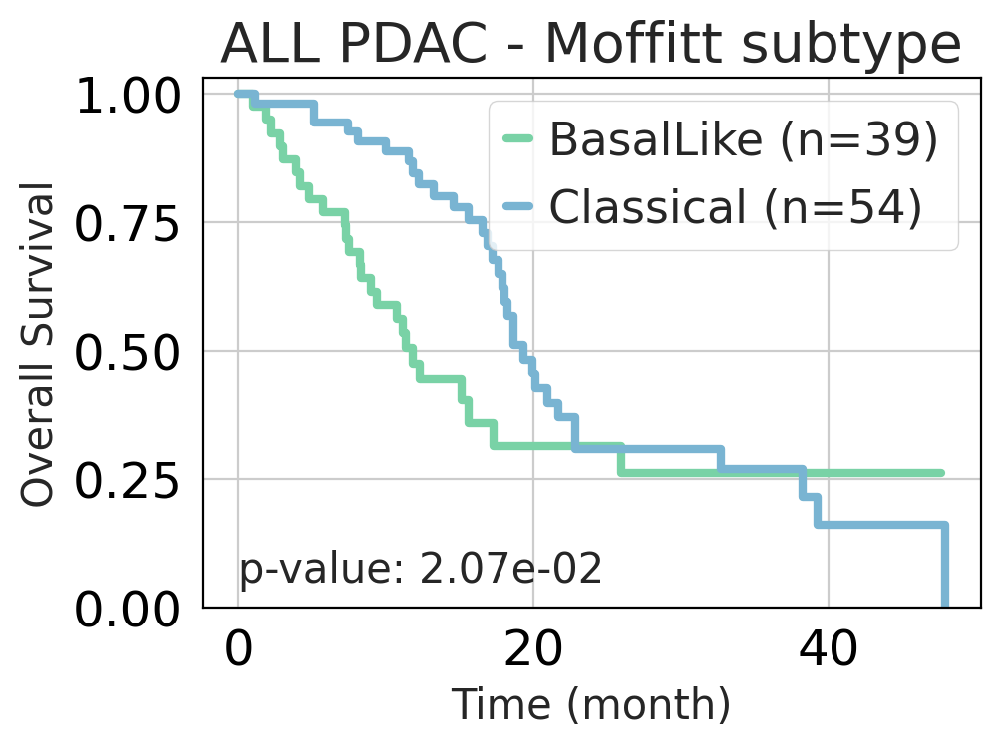

SNUBH data - stage_C


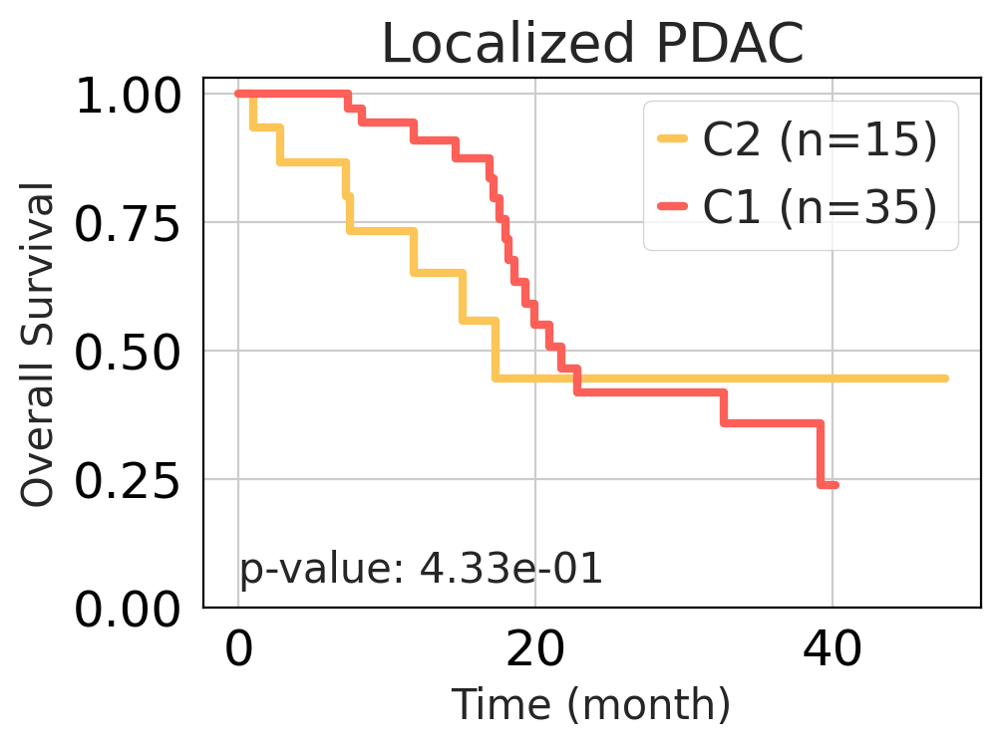

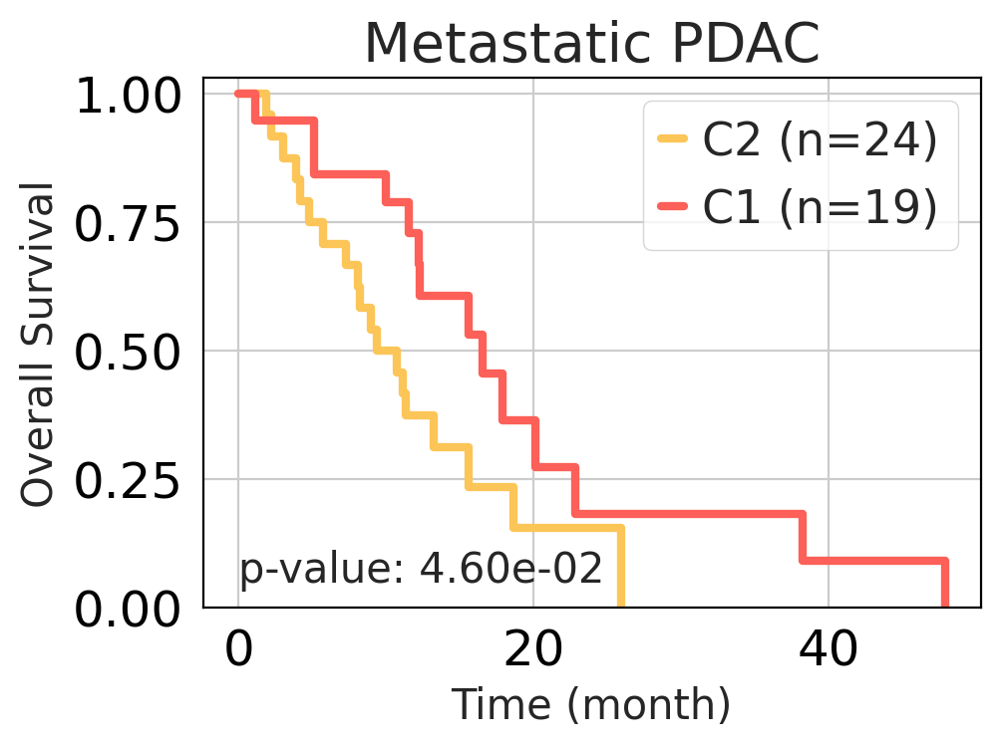

In [15]:
moffitt_color = ['#79d2a6','#79b4d2']
stage_color = ['#873c24', '#243087']
SNU_adata_tmp = SNU_adata[:,features]
sc.pp.highly_variable_genes(SNU_adata_tmp,n_top_genes=110)
SNU_adata_HVG = SNU_adata_tmp[:,SNU_adata_tmp.var.highly_variable]

sc.tl.pca(SNU_adata_HVG, svd_solver='arpack', n_comps = 16)
sc.pp.neighbors(SNU_adata_HVG, n_neighbors=10)

sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
sc.tl.umap(SNU_adata_HVG)
sc.pl.umap(SNU_adata_HVG, color=['Tumor Subtype'], s=100, wspace=0.4, title='', palette = umap_color, add_outline=True, outline_width=(0.2, 0.03)
          ,legend_loc='on data')
#sc.pl.umap(SNU_adata_HVG, color=['MoffittType'], s=50, wspace=0.4, title='', palette = umap_color, add_outline=True, outline_width=(0.2, 0.03))
df_clinical = SNU_adata_HVG.obs.copy()

sc.settings.set_figure_params(dpi=100, figsize=(5,3.5), fontsize=18)
print('SNUBH data - SNUBH subtype')
snu_p = km_plot(df_info=df_clinical, category='Tumor Subtype', os='OS_F', event='OS_event', title='ALL PDAC - SNUBH subtype',color=list(reversed(umap_color)))
print('SNUBH data - Moffitt subtype')
snu_p = km_plot(df_info=df_clinical, category='Moffitt Subtype', os='OS_F', event='OS_event', title='ALL PDAC - Moffitt subtype',color=list(moffitt_color))



print('SNUBH data - stage_C')
m = df_clinical['stage_C'] == 'Localized'
Localized = df_clinical[m]
Metastatic = df_clinical[~m]
snu_p = km_plot(df_info=Localized, category='Tumor Subtype', os='OS_F', event='OS_event', title='Localized PDAC', color=list(reversed(umap_color)))
snu_p = km_plot(df_info=Metastatic, category='Tumor Subtype', os='OS_F', event='OS_event', title='Metastatic PDAC', color=list(reversed(umap_color)))

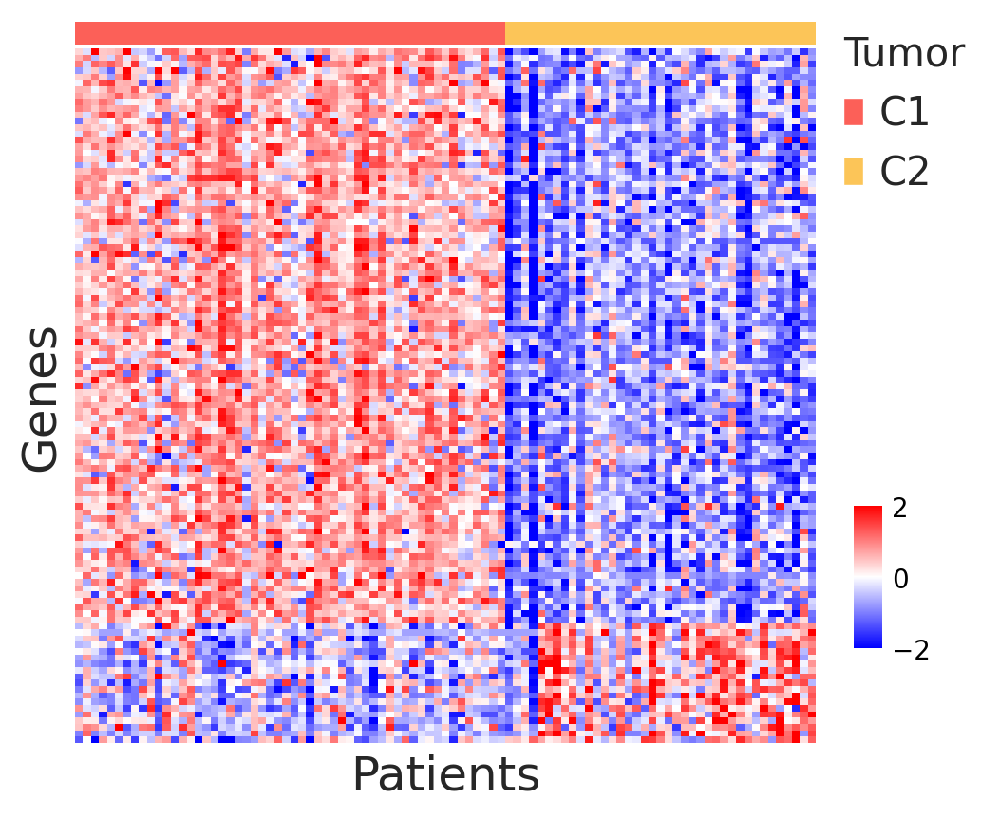

In [16]:
def int2color_dict(d1,d2):
    d = dict()
    for key in d1.keys():
        int_val = d1[key]
        d[int_val] = d2[key]
    return d


exp = SNU_adata.to_df().loc[:,features]

annot = SNU_annot.sort_values(by='Tumor Subtype')
order = list(annot.index)
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T

Annot_lut = dict()
Annot_lut['C1']='#fc6058'
Annot_lut['C2']='#fcc558'

Annot_int_map = dict(zip(annot['Tumor Subtype'].unique(),range(annot['Tumor Subtype'].nunique())))

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = annot['Tumor Subtype'].map(Annot_int_map).to_frame('TumorSubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TumorSubtype',:].unique())]

# ax=sns.heatmap(Annot, cmap=cmap, cbar=False)
# plt.show()
# sns.heatmap(scaled_df, cmap='bwr', vmin=2, vmax=-2)
# plt.show()


sc.settings.set_figure_params(fontsize=10)
fig = plt.figure(figsize=(5, 5), dpi= 100)
#plt.subplots_adjust(wspace = 0.2, hspace = 0.05)
widths = [1]
heights = [1,30]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.01, wspace=0.15, width_ratios=widths, height_ratios=heights)

ax0 = fig.add_subplot(gs[0, 0])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax0)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax0_legend = ax0.legend(handles, Annot_lut, bbox_to_anchor=(1.25, 2), frameon=False, 
                              fontsize=15, markerscale=4)
ax0_legend.set_title('Tumor',prop={'size':15})
ax0_legend._legend_box.align = "left"
ax0.set_xticks([])
ax0.set_xlabel('')
ax0.set_yticklabels('')
ax0.margins(0)

cbar_ax = fig.add_axes([1.0, 0.25, 0.03, 0.15], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0, )

ax1 = fig.add_subplot(gs[1, 0])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax1, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax1.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax1.set_xticks([])
ax1.set_xlabel('Patients', fontsize=18, )
ax1.set_ylabel('Genes', fontsize=18, )
plt.show()

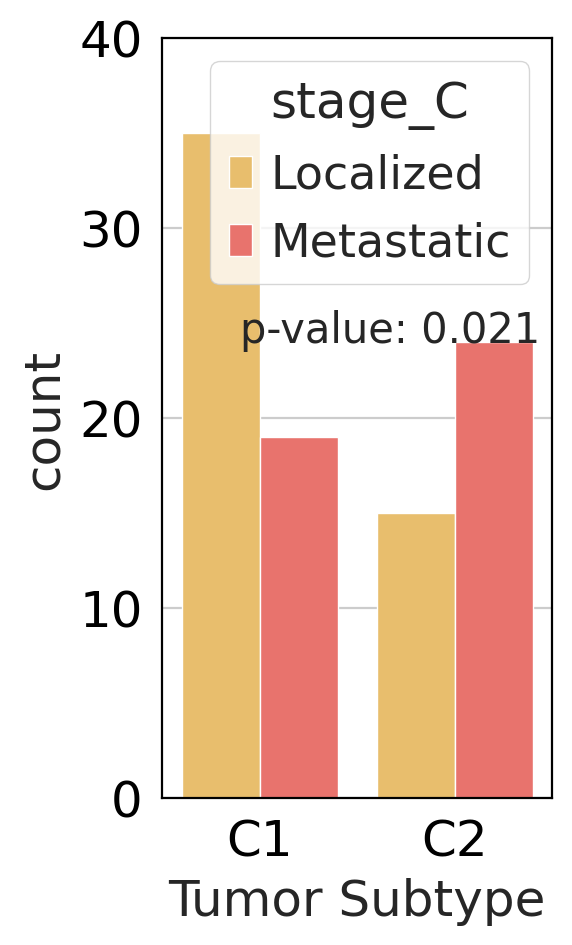

Localized     35
Metastatic    19
Name: stage_C, dtype: int64
Metastatic    24
Localized     15
Name: stage_C, dtype: int64


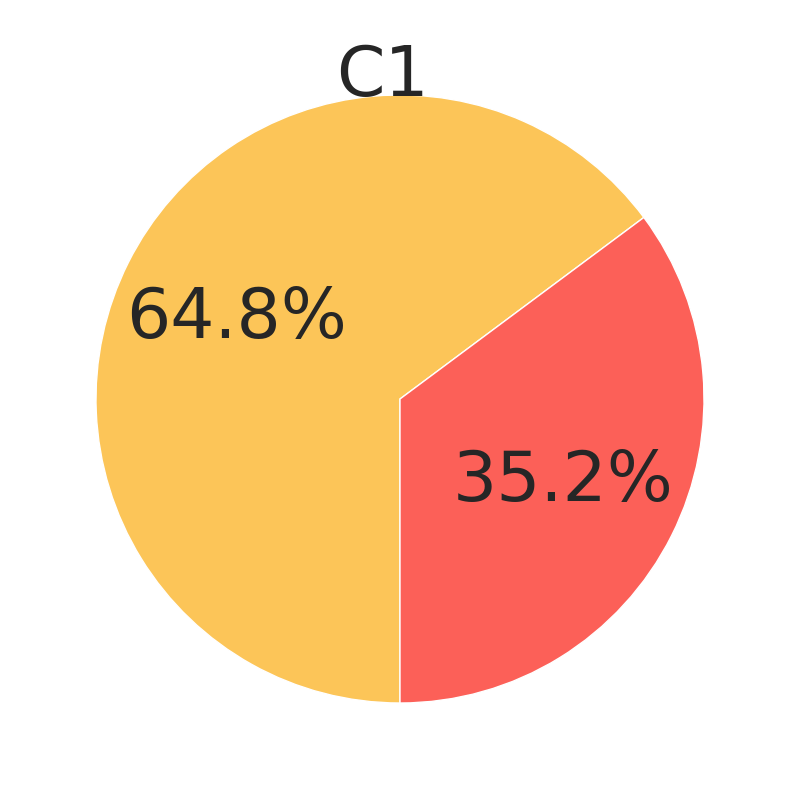

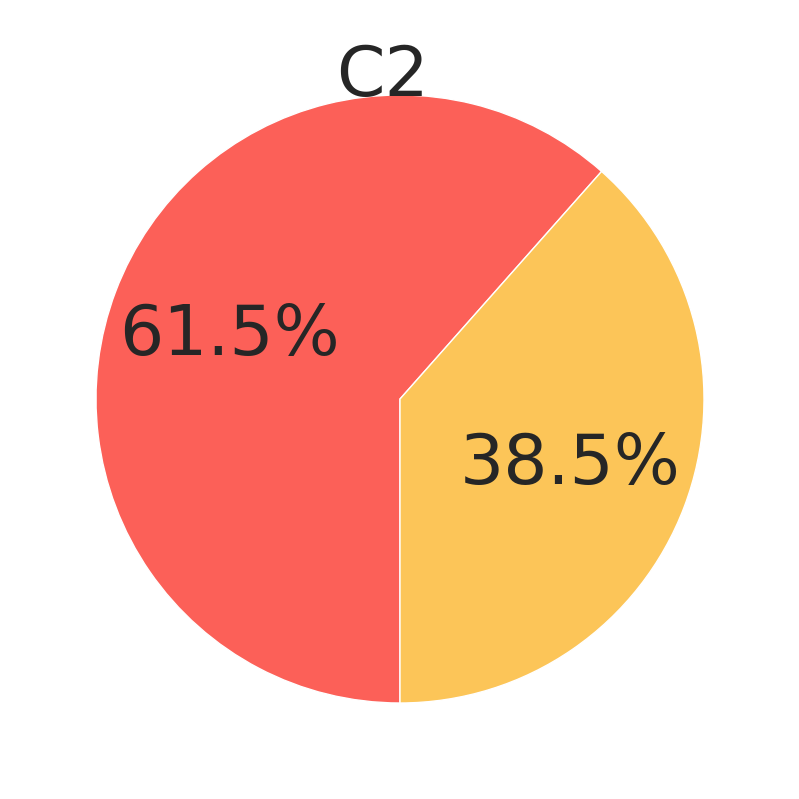

In [17]:
stage_palette = dict()
stage_palette['Localized']='#fcc558'
stage_palette['Metastatic']='#fc6058'

sc.settings.set_figure_params(dpi=100, figsize=(2.5,5), fontsize=18)
stage_a = SNU_annot.loc[:,['stage_A','Tumor Subtype']]
stage_c = SNU_annot.loc[:,['stage_C','Tumor Subtype']]

# g = sns.countplot(x="Tumor Subtype",  hue="stage_A", data=stage_a, palette=stage_palette)
# ct_table_ind=pd.crosstab(SNU_annot['Tumor Subtype'],SNU_annot['stage_A'])    
# chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
# p = np.round(p,3)
# plt.text(-0.1, 22, 'p-value: {}'.format(p), fontsize=15)
# plt.ylim((0,40))
# #plt.title('Stage_A')
# plt.show()

g = sns.countplot(x="Tumor Subtype",  hue="stage_C", data=stage_c, palette=stage_palette)
ct_table_ind=pd.crosstab(SNU_annot['Tumor Subtype'],SNU_annot['stage_C'])    
chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
p = np.round(p,3)
plt.text(-0.1, 24, 'p-value: {}'.format(p), fontsize=15)
#plt.title('Stage_C')
plt.ylim((0,40))
plt.show()



sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=25)

m1 = SNU_annot['Tumor Subtype'] == 'C1'
m2 = SNU_annot['Tumor Subtype'] == 'C2'

with_stage_sel1 = SNU_annot[m1]
print(with_stage_sel1['stage_C'].value_counts())
with_stage_sel2 = SNU_annot[m2]
print(with_stage_sel2['stage_C'].value_counts())

stage = with_stage_sel1['stage_C'].value_counts().to_frame('stage')
stage = stage/with_stage_sel1['stage_C'].value_counts().sum() *100
colors =[stage_palette[key] for key in list(stage.index)]
ratio = stage.values.reshape(-1)
stage2 = list(stage.index)
patches, texts, autotexts = plt.pie(ratio, labels=stage2, autopct='%.1f%%', startangle=270, counterclock=False, 
                                    colors=colors, labeldistance=None)
#plt.title('Tumor C1',position=(0.5, 0))
plt.text(-0.21, 1,'C1')
#plt.legend(bbox_to_anchor=(0.9, .85))
plt.show()

stage = with_stage_sel2['stage_C'].value_counts().to_frame('stage')
stage = stage/with_stage_sel2['stage_C'].value_counts().sum() *100
colors =[stage_palette[key] for key in list(stage.index)]
ratio = stage.values.reshape(-1)
stage2 = list(stage.index)
patches, texts, autotexts = plt.pie(ratio, labels=stage2, autopct='%.1f%%', startangle=270, counterclock=False, 
                                    colors=colors, labeldistance=None)
plt.text(-0.21, 1,'C2')
#plt.legend(bbox_to_anchor=(0.9, .85))
plt.show()

## Bailey

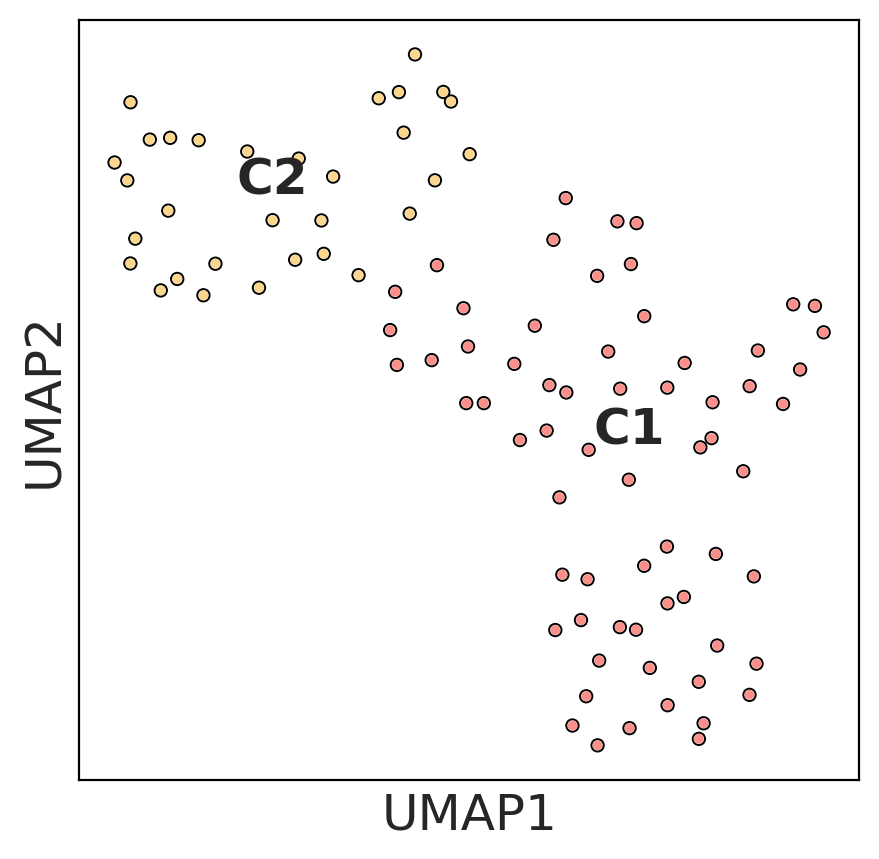

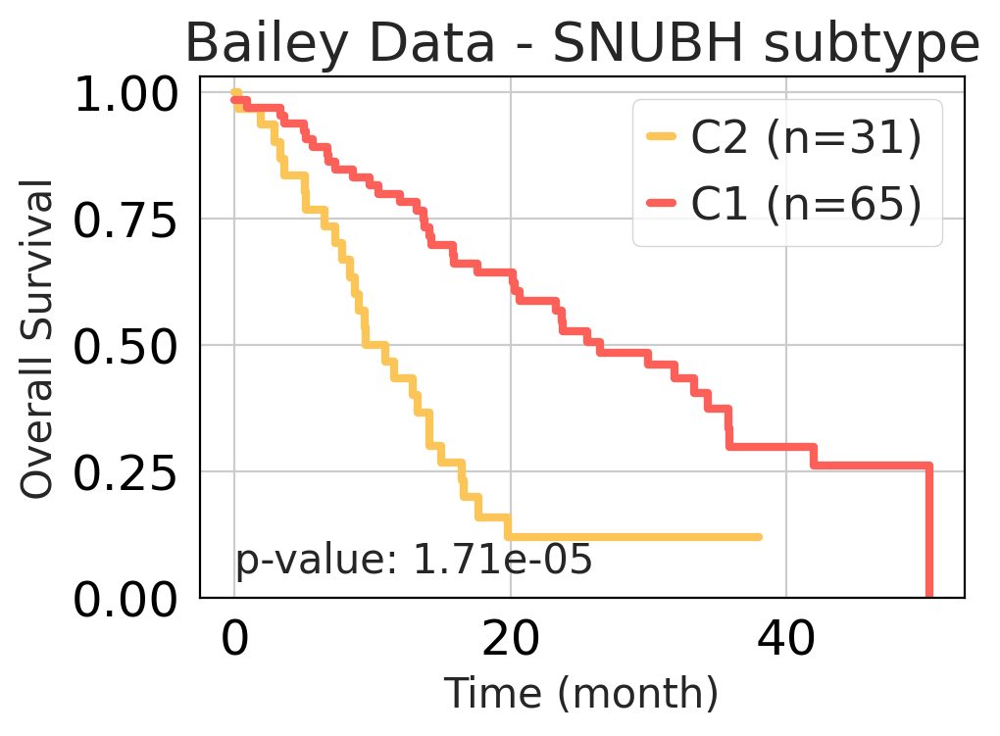

In [18]:
Bailey_adata_HVG = Bailey_adata[:,features]

sc.tl.pca(Bailey_adata_HVG, svd_solver='arpack', n_comps = 10)
sc.pp.neighbors(Bailey_adata_HVG, n_neighbors=6)

#Bailey_adata_HVG.obs['Tumor2Type_2nd'] = Bailey_annot['Tumor2Type_2nd']

sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
sc.tl.umap(Bailey_adata_HVG)
sc.pl.umap(Bailey_adata_HVG, color=['Tumor Subtype'], s=50, wspace=0.4, title='', palette = umap_color, add_outline=True, outline_width=(0.2, 0.03)
          ,legend_loc='on data')
df_clinical = Bailey_adata_HVG.obs.copy()
sc.settings.set_figure_params(dpi=100, figsize=(5,3.5), fontsize=18)
bailey_p = km_plot(df_info=df_clinical, category='Tumor Subtype', os='OS_F', event='OS_event', title='Bailey Data - SNUBH subtype', color=list(reversed(umap_color)))

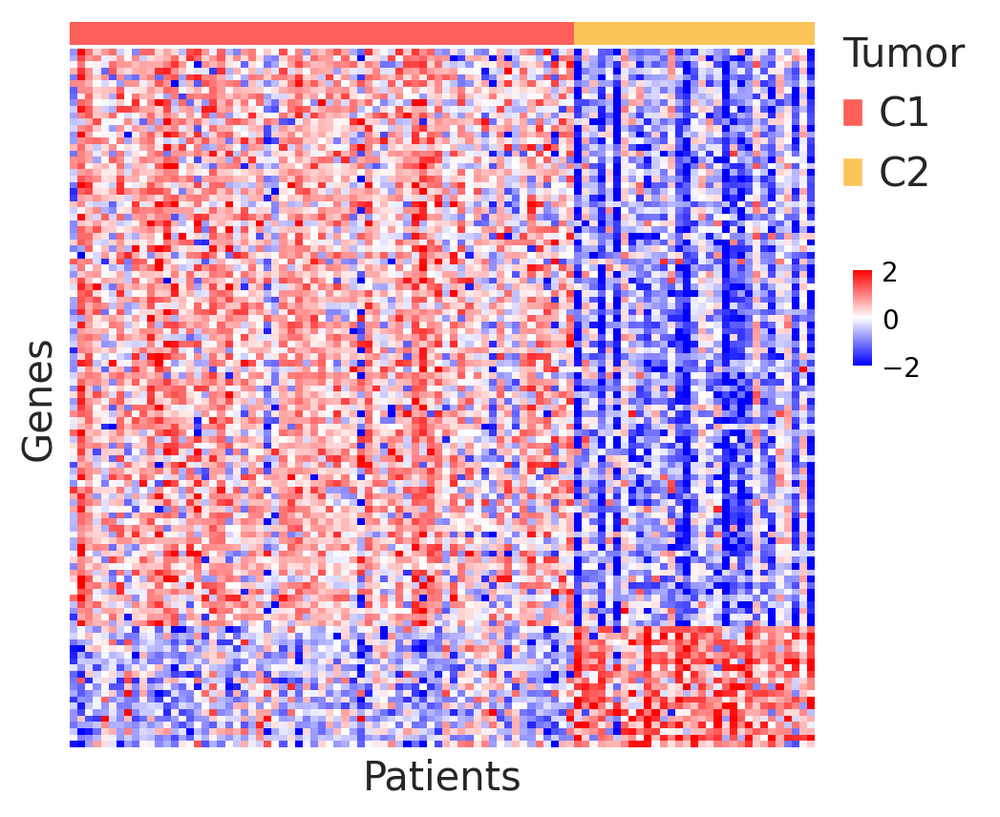

In [19]:
exp = Bailey_adata_HVG.to_df()
#annot = pd.read_csv('Bailey_TumorType.csv',index_col=0).sort_values(by='Tumor2Type_1st')
Bailey_annot = Bailey_annot.sort_values(by='Tumor Subtype')
Bailey_annot
order = list(Bailey_annot.index)
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T

Annot_lut = dict()
Annot_int_map = dict(zip(Bailey_annot['Tumor Subtype'].unique(),range(Bailey_annot['Tumor Subtype'].nunique())))
Annot_lut['C1']='#fc6058'
Annot_lut['C2']='#fcc558'
Annot = Bailey_annot['Tumor Subtype'].map(Annot_int_map).to_frame('TumorSubtype').T.astype(float)
Annot

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = Bailey_annot['Tumor Subtype'].map(Annot_int_map).to_frame('TumorSubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TumorSubtype',:].unique())]



sc.settings.set_figure_params(fontsize=10)
fig = plt.figure(figsize=(5, 5), dpi= 100)

widths = [1]
heights = [1,30]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.01, wspace=0.15, width_ratios=widths, height_ratios=heights)

ax0 = fig.add_subplot(gs[0, 0])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax0)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax0_legend = ax0.legend(handles, Annot_lut, bbox_to_anchor=(1.25, 2), frameon=False, 
                              fontsize=15, markerscale=4)
ax0_legend.set_title('Tumor',prop={'size':15})
ax0_legend._legend_box.align = "left"
ax0.set_xticks([])
ax0.set_xlabel('')
ax0.set_yticklabels('')
ax0.margins(0)

cbar_ax = fig.add_axes([1.0, 0.55, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax1 = fig.add_subplot(gs[1, 0])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax1, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax1.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax1.set_xticks([])
ax1.set_xlabel('Patients', fontsize=15,)
ax1.set_ylabel('Genes', fontsize=15,)
plt.show()

## TCGA

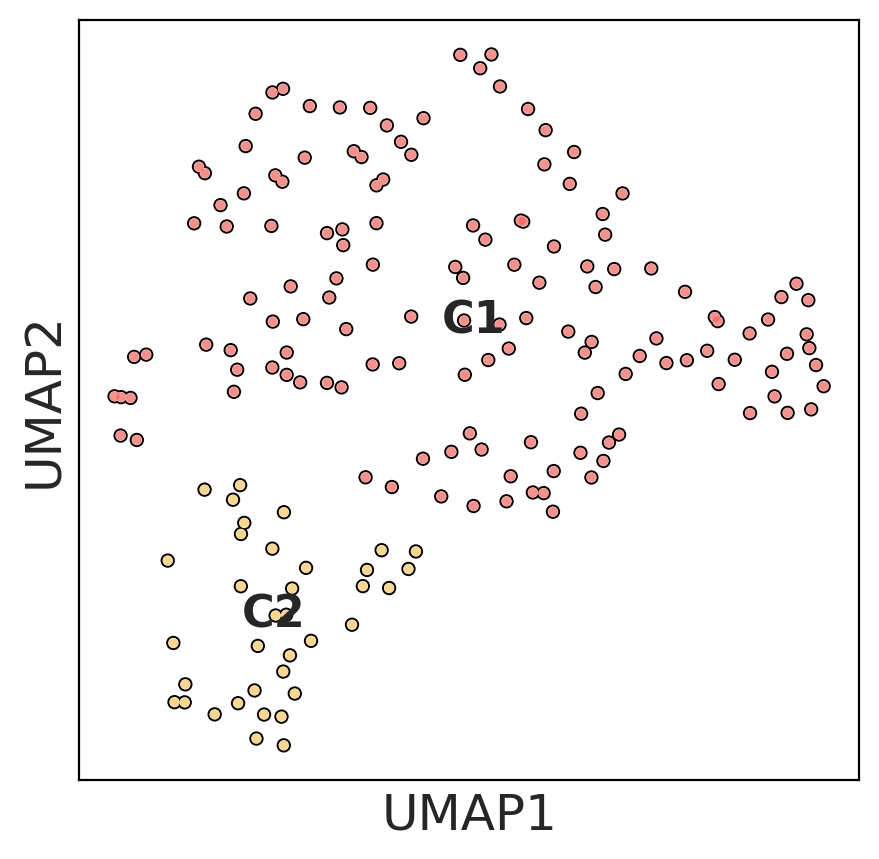

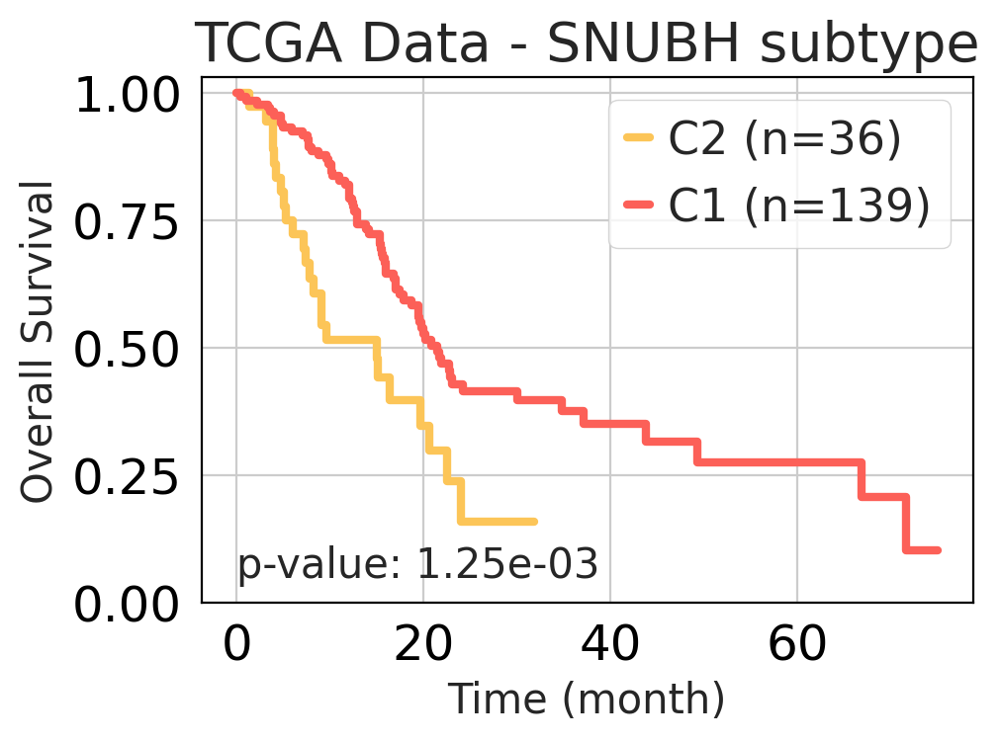

In [20]:
TCGA_adata_HVG = TCGA_adata[:,features]

sc.tl.pca(TCGA_adata_HVG, svd_solver='arpack', n_comps = 4)
sc.pp.neighbors(TCGA_adata_HVG, n_neighbors=10)

TCGA_adata_HVG.obs['Tumor Subtype'] = TCGA_annot['Tumor Subtype']


sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
sc.tl.umap(TCGA_adata_HVG)
sc.pl.umap(TCGA_adata_HVG, color=['Tumor Subtype'], s=50, wspace=0.4, legend_fontsize = 16, title='', palette = umap_color, add_outline=True, outline_width=(0.2, 0.03)
          ,legend_loc='on data')
df_clinical = TCGA_adata_HVG.obs.copy()
sc.settings.set_figure_params(figsize=(6, 6), facecolor='white')
sc.settings.set_figure_params(dpi=100, figsize=(5,3.5), fontsize=18)
tcga_p = km_plot(df_info=df_clinical, category='Tumor Subtype', os='OS_F', event='OS_event', title='TCGA Data - SNUBH subtype', color=list(reversed(umap_color)))


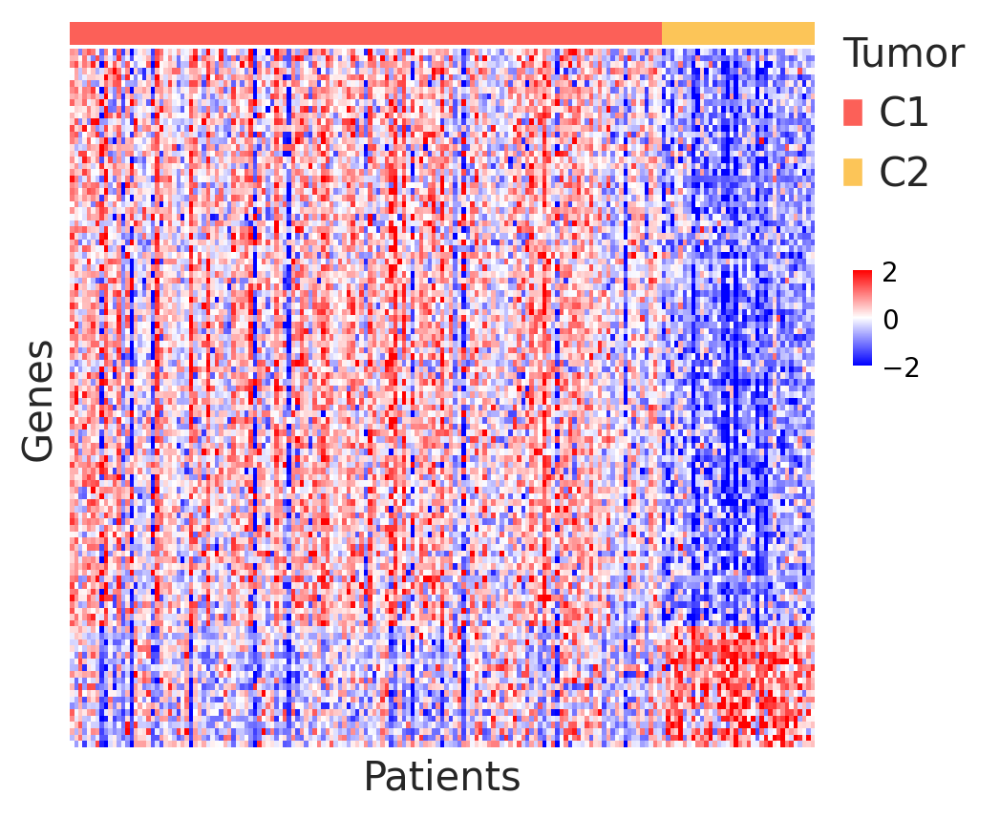

In [21]:
exp = TCGA_adata_HVG.to_df().loc[:,features]
#annot = pd.read_csv('Bailey_TumorType.csv',index_col=0).sort_values(by='Tumor2Type_1st')
TCGA_annot = TCGA_annot.sort_values(by='Tumor Subtype')
TCGA_annot
order = list(TCGA_annot.index)
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T


Annot_lut = dict()
Annot_int_map = dict(zip(TCGA_annot['Tumor Subtype'].unique(),range(TCGA_annot['Tumor Subtype'].nunique())))
Annot_lut['C1']='#fc6058'
Annot_lut['C2']='#fcc558'
Annot = TCGA_annot['Tumor Subtype'].map(Annot_int_map).to_frame('TumorSubtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = TCGA_annot['Tumor Subtype'].map(Annot_int_map).to_frame('TumorSubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TumorSubtype',:].unique())]

sc.settings.set_figure_params(fontsize=10)
fig = plt.figure(figsize=(5, 5), dpi= 100)
widths = [1]
heights = [1,30]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.01, wspace=0.15, width_ratios=widths, height_ratios=heights)

ax0 = fig.add_subplot(gs[0, 0])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax0)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax0_legend = ax0.legend(handles, Annot_lut, bbox_to_anchor=(1.25, 2), frameon=False, 
                              fontsize=15, markerscale=4)
ax0_legend.set_title('Tumor',prop={'size':15})
ax0_legend._legend_box.align = "left"
ax0.set_xticks([])
ax0.set_xlabel('')
ax0.set_yticklabels('')
ax0.margins(0)

cbar_ax = fig.add_axes([1.0, 0.55, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax1 = fig.add_subplot(gs[1, 0])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax1, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax1.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax1.set_xticks([])
ax1.set_xlabel('Patients', fontsize=15)
ax1.set_ylabel('Genes', fontsize=15)
plt.show()

# Tumor subtype ssGSEA

In [23]:
files_tumor = ['MSigDB_Hallmark_2020-TumorType-ssGSEA.csv',
         'KEGG_2021_Human-TumorType-ssGSEA.csv',
         'GO_Biological_Process_2021-TumorType-ssGSEA.csv',
         'Reactome_2016-TumorType-ssGSEA.csv',
        ]
files_tme = ['MSigDB_Hallmark_2020-TMEType-ssGSEA.csv',
         'KEGG_2021_Human-TMEType-ssGSEA.csv',
         'GO_Biological_Process_2021-TMEType-ssGSEA.csv',
         'Reactome_2016-TMEType-ssGSEA.csv',
        ]


tumor_lut = dict()
tumor_lut['C1']='#fc6058'
tumor_lut['C2']='#fcc558'

tme_lut = dict()
tme_lut['E1']='#5bb6eb'
tme_lut['E2']='#5beba8'

genetype_lut = dict()
genetype_lut['Tumor_Pos']='#93c4f5'
genetype_lut['Tumor_Neg']='#f59393'
genetype_lut['TME_Neg']='#f5c693'

# FFX_lut = dict()
# FFX_lut['non-responder'] = '#b52b0b'
# FFX_lut['NA'] = '#ebe8e8'
# FFX_lut['responder'] = '#2e1dcc'

annotation = SNU_annot.sort_values(by='Tumor Subtype')
order = list(annotation.index)


tumor_df = []
for file in files_tumor:
    df_ = pd.read_csv(file,index_col=0)
    tumor_df.append(df_)
tumor_score=pd.concat(tumor_df,axis=0).T.loc[order,:]


tme_df = []
for file in files_tme:
    df_ = pd.read_csv(file,index_col=0)
    tme_df.append(df_)
tme_score=pd.concat(tme_df,axis=0).T.loc[order,:]


EMT = [
    'epithelial to mesenchymal transition (GO:0001837)',
    'positive regulation of epithelial to mesenchymal transition (GO:0010718)',
    'Epithelial Mesenchymal Transition' 
]

Junction_Org = [
    'Cell-cell junction organization Homo sapiens R-HSA-421270',
    'Cell junction organization Homo sapiens R-HSA-446728',
]

TGFB = [
    'TGF-beta Signaling'
]

Angiogenesis = [
    'positive regulation of blood vessel endothelial cell migration (GO:0043536)',
    'Signaling by VEGF Homo sapiens R-HSA-194138',
    'VEGFA-VEGFR2 Pathway Homo sapiens R-HSA-4420097',
    'VEGF signaling pathway',
]


# WNT = [
#     'non-canonical Wnt signaling pathway (GO:0035567)',
#     'Beta-catenin independent WNT signaling Homo sapiens R-HSA-3858494',
#     'Signaling by WNT in cancer Homo sapiens R-HSA-4791275',
# ]
scaler = StandardScaler()
tumor = pd.DataFrame(scaler.fit_transform(tumor_score), columns=tumor_score.columns, index=tumor_score.index).T
Tumor_Features = EMT+Junction_Org+TGFB+Angiogenesis
tumor = tumor.loc[Tumor_Features,:]

Treg = [
    'negative regulation of T cell activation (GO:0050868)',
    'negative regulation of T cell proliferation (GO:0042130)',
    'IL-2/STAT5 Signaling'
]

PDL1 = [
    'PD-1 signaling Homo sapiens R-HSA-389948',
    'PD-L1 expression and PD-1 checkpoint pathway in cancer'  
]
cellcycle = [
    'E2F Targets',
    'Mitotic G1-G1/S phases Homo sapiens R-HSA-453279',
    'G1/S Transition Homo sapiens R-HSA-69206',
    'G2-M Checkpoint'
]
neutrophil = [
    'neutrophil mediated immunity (GO:0002446)',
    'neutrophil degranulation (GO:0043312)',
    'neutrophil activation involved in immune response (GO:0002283)',
    'Neutrophil extracellular trap formation',
]



#df_tme_score.loc[Innate_Immune,:].sort_values(by='scores',ascending=False)

tme = pd.DataFrame(scaler.fit_transform(tme_score), columns=tme_score.columns, index=tme_score.index).T
TME_Features = Treg+PDL1+cellcycle+neutrophil
tme = tme.loc[TME_Features,:]

ssGSEA = pd.concat([tumor,tme],axis=0)
ssGSEA


tumor_sig = ['EMT']*len(EMT)
tumor_sig = tumor_sig+['Cell junction organization']*len(Junction_Org)
tumor_sig = tumor_sig+['TGF-beta']*len(TGFB)
tumor_sig = tumor_sig+['Angiogenesis']*len(Angiogenesis)


tme_sig = ['Treg']*len(Treg)
tme_sig = tme_sig+['Immune Checkpoint']*len(PDL1)
tme_sig = tme_sig+['Cellcycle']*len(cellcycle)
tme_sig = tme_sig+['Neutrophil']*len(neutrophil)

signatures = tumor_sig+tme_sig

tumor_len = len(Tumor_Features)
tme_len = len(TME_Features)

sig_df = pd.DataFrame(signatures,columns=['Signature'])
sig_int_map = dict(zip(sig_df['Signature'].unique(),range(sig_df['Signature'].nunique())))
sigtype = sig_df['Signature'].map(sig_int_map).to_frame('Signature')


sig_color = mcp.gen_color(cmap="tab10",n=sig_df['Signature'].nunique())
sig_color = ['#eb4034','#eb9934','#2cd14d','#2c47d1','#eb4034','#eb9934','#2cd14d','#2c47d1']

sigtype_lut = dict(zip(sig_df['Signature'].unique(), sig_color))


tumor_sigtype = sigtype.iloc[:tumor_len,:]
tumor_lut = { key: sigtype_lut[key] for key in sorted(set(tumor_sig), key=tumor_sig.index) }

tme_sigtype = sigtype.iloc[tumor_len:,:]
tme_lut = { key: sigtype_lut[key] for key in sorted(set(tme_sig), key=tme_sig.index) }


import textwrap
def idx_rename(x):
    if x.find('GO') != -1 or x.find('R-HSA') != -1:
        x_parse = x.split(' ')
        ret =  ' '.join(x_parse[:-1])
        ret = textwrap.fill(ret, 40)
        return ret
    else:
        ret = textwrap.fill(x, 40)
        return ret
    
    
        
ssGSEA.index = ssGSEA.index.map(idx_rename)

tumor.index = tumor.index.map(idx_rename)
tme.index = tme.index.map(idx_rename)


In [35]:
# annotation.to_csv('annotatio_csv.csv')

In [36]:
# sig_color = mcp.gen_color(cmap="Spectral",n=sig_df['Signature'].nunique())
# sns.color_palette(sig_color)

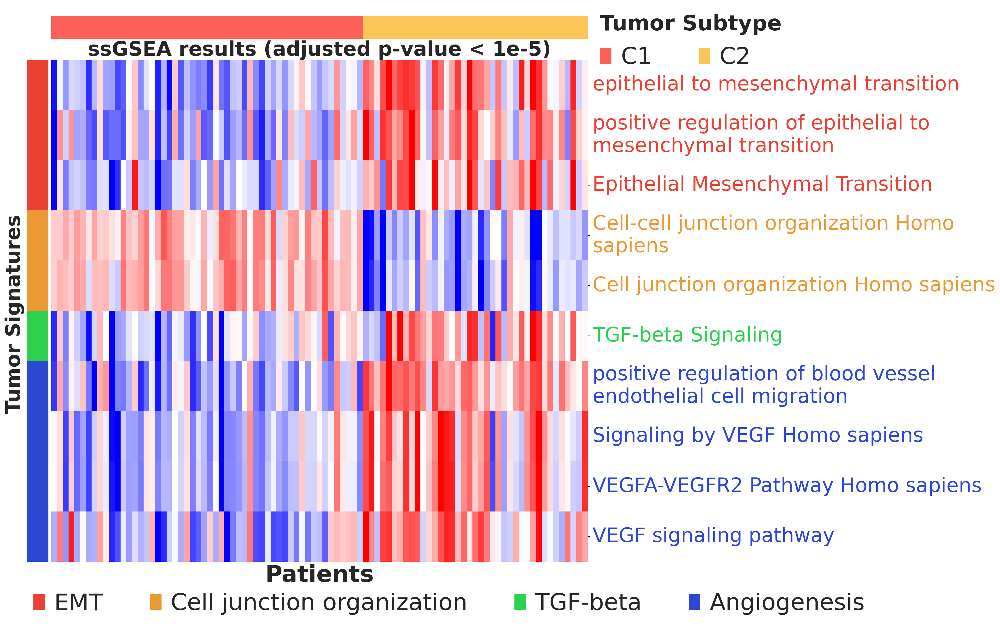

In [24]:
fig = plt.figure(figsize=(15, 15), dpi= 100)
widths = [1,25]
heights = [1,22]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.08, wspace=0.01, width_ratios=widths, height_ratios=heights)

Annot_lut = dict()
Annot_int_map = dict(zip(annotation['Tumor Subtype'].unique(),range(annotation['Tumor Subtype'].nunique())))
Annot_lut['C1']='#fc6058'
Annot_lut['C2']='#fcc558'
Annot = annotation['Tumor Subtype'].map(Annot_int_map).to_frame('TumorSubtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = annotation['Tumor Subtype'].map(Annot_int_map).to_frame('TumorSubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TumorSubtype',:].unique())]

ax = fig.add_subplot(gs[0, 1])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax_legend = ax.legend(handles, Annot_lut, bbox_to_anchor=(1.4, 2),
                              fontsize=35, markerscale=20, frameon=False, ncol=2)
ax_legend.set_title('Tumor Subtype',prop={'size':32, 'weight':'bold'})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticks([])
ax.set_yticklabels([])
#ax.set_ylabel('Subtype',fontdict={'fontsize':25,'weight':'bold'})
ax.margins(0)


plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = False



ax = fig.add_subplot(gs[1, 0])
sns.heatmap(tumor_sigtype, cmap=list(tumor_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=tumor_lut[name]) for name in tumor_lut]
ax_legend = ax.legend(handles, tumor_lut, bbox_to_anchor=(40, -0.02), frameon=False, 
                              fontsize=35, markerscale=3, ncol=4)

#ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_ylabel('Tumor Signatures ',fontdict={'fontsize':30,'weight':'bold'})
ax.margins(0)

# cbar_ax = fig.add_axes([1.2, 0.15, 0.02, 0.05], frameon=False, xticklabels=[], yticklabels=[])
# cbar_ax.tick_params(axis=u'both', which=u'both',length=0, labelsize=20)

ax = fig.add_subplot(gs[1, 1])
sns.heatmap(tumor, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
#ax.set_xlabel('Patients', fontsize=20, fontdict=dict(weight='bold'))
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=30)
ax.set_title('ssGSEA results (adjusted p-value < 1e-5)',fontdict={'fontsize':30,'weight':'bold'})
ax.set_xlabel('Patients',fontdict=dict(weight='bold',fontsize=35))

for i, tick_label in enumerate(ax.axes.get_yticklabels()):
    color_idx = tumor_sigtype.iloc[i,0]
    tick_label.set_color(list(tumor_lut.values())[color_idx])


plt.show()
plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

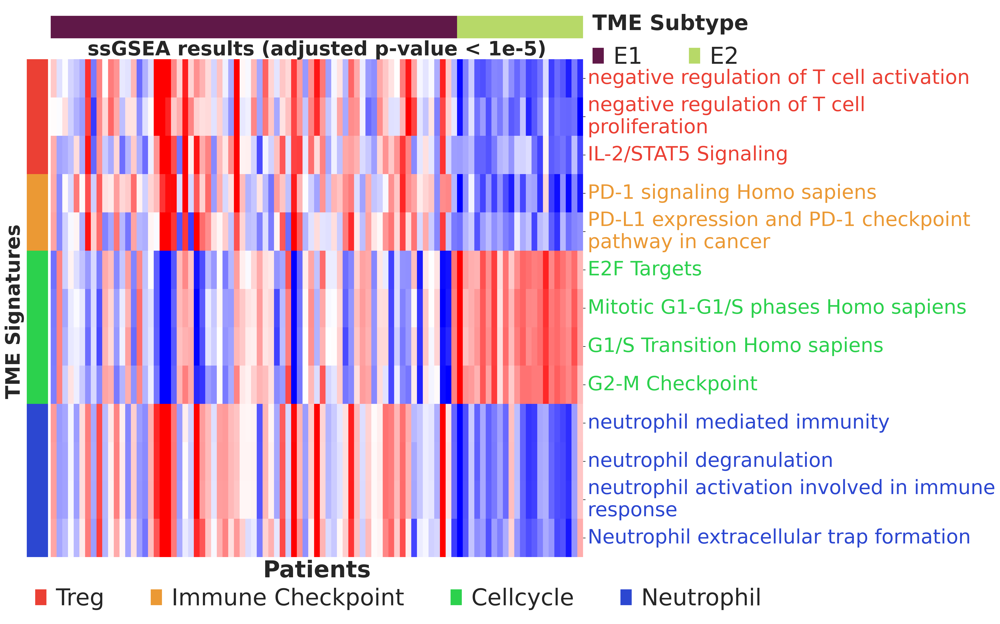

In [25]:
annotation = SNU_annot.sort_values(by='TME Subtype')
order = list(annotation.index)
tme = tme.loc[:,order]
tme

fig = plt.figure(figsize=(15, 15), dpi= 150)
widths = [1,25]
heights = [1,22]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.08, wspace=0.01, width_ratios=widths, height_ratios=heights)


Annot_lut = dict()
Annot_int_map = dict(zip(annotation['TME Subtype'].unique(),range(annotation['TME Subtype'].nunique())))
Annot_lut['E1']='#601848'
Annot_lut['E2']='#B7D968'
Annot = annotation['TME Subtype'].map(Annot_int_map).to_frame('TME Subtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = annotation['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TMESubtype',:].unique())]

ax = fig.add_subplot(gs[0, 1])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax_legend = ax.legend(handles, Annot_lut, bbox_to_anchor=(1.35, 2),
                              fontsize=35, markerscale=20, frameon=False, ncol=2)
ax_legend.set_title('TME Subtype',prop={'size':32, 'weight':'bold'})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticks([])
ax.set_yticklabels([])
#ax.set_ylabel('Subtype',fontdict={'fontsize':25,'weight':'bold'})
ax.margins(0)




plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = False







ax = fig.add_subplot(gs[1, 0])
sns.heatmap(tme_sigtype, cmap=list(tme_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=tme_lut[name]) for name in tme_lut]
ax_legend = ax.legend(handles, tme_lut, bbox_to_anchor=(35.5, -0.02), frameon=False, 
                              fontsize=35, markerscale=3, ncol=4)

#ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_ylabel('TME Signatures ',fontdict={'fontsize':30,'weight':'bold'})
ax.margins(0)

# cbar_ax = fig.add_axes([1, 0.08, 0.02, 0.06], frameon=False, xticklabels=[], yticklabels=[])
# cbar_ax.tick_params(axis=u'both', which=u'both',length=0, labelsize=25)

ax = fig.add_subplot(gs[1, 1])
sns.heatmap(tme, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=30)
ax.set_title('ssGSEA results (adjusted p-value < 1e-5)',fontdict={'fontsize':30,'weight':'bold'})
ax.set_xlabel('Patients',fontdict=dict(weight='bold',fontsize=35))


for i, tick_label in enumerate(ax.axes.get_yticklabels()):
    color_idx = tme_sigtype.iloc[i,0] - len(set(tumor_sig))
    tick_label.set_color(list(tme_lut.values())[color_idx])


plt.show()
plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

# TME Subtype

In [26]:
umap_color = dict()
umap_color['E1'] = '#601848'
umap_color['E2'] = '#B7D968'

m = table_genes['Type'].isin(['TME_Neg'])
features = list(table_genes.loc[m,'Gene'])
len(features)

51

## SNUBH

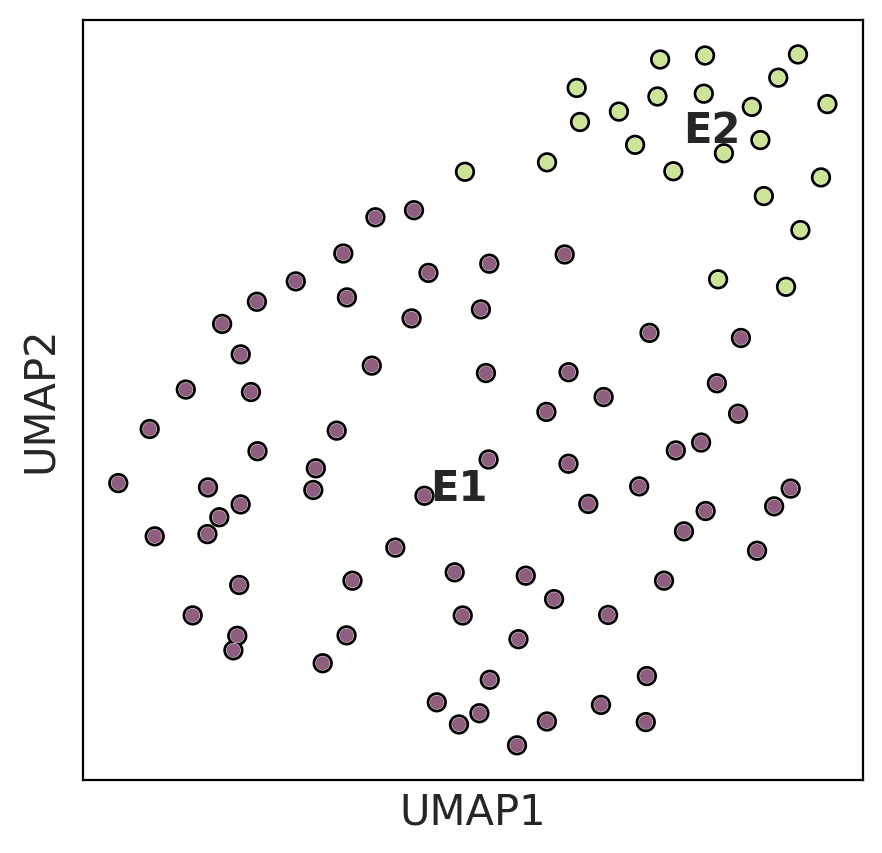

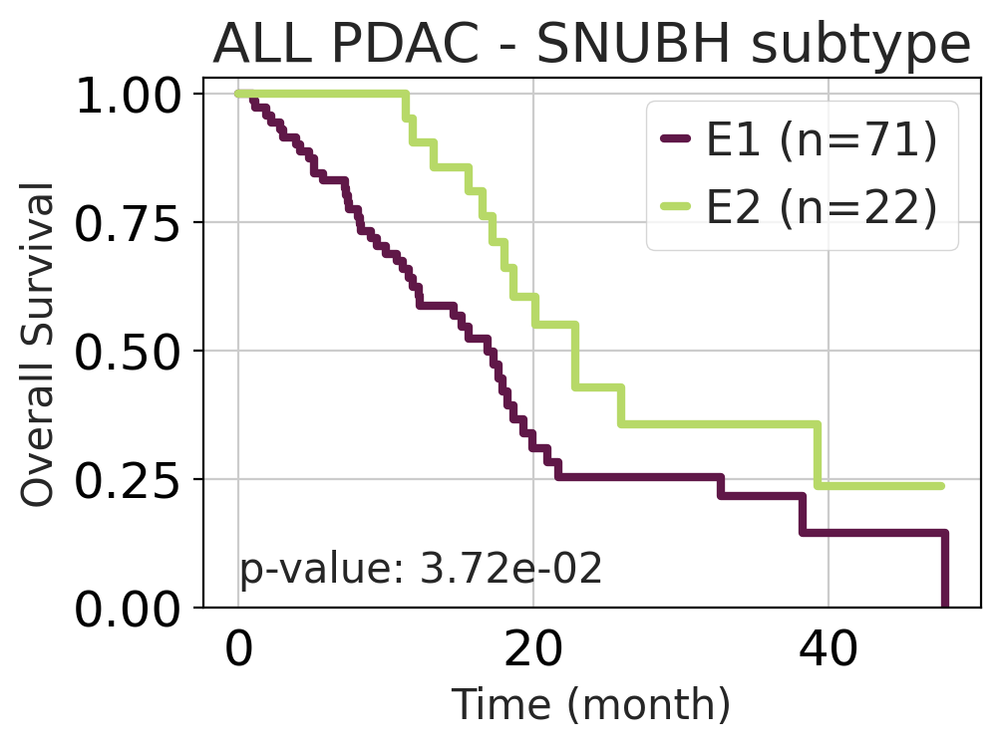

In [27]:

n_comps = 2
n_neighbors = 13


# n_comps = 2
# n_neighbors = 5
# resolution = 0.07
#n_top_genes=45
SNU_adata_HVG = SNU_adata[:,features]
# sc.pp.highly_variable_genes(SNU_adata_HVG,n_top_genes=n_top_genes)
# SNU_adata_HVG = SNU_adata_HVG[:,SNU_adata_HVG.var.highly_variable]

sc.tl.pca(SNU_adata_HVG, svd_solver='arpack', n_comps = n_comps)
sc.pp.neighbors(SNU_adata_HVG, n_neighbors=n_neighbors)



sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=15)
sc.tl.umap(SNU_adata_HVG)
sc.pl.umap(SNU_adata_HVG, color=['TME Subtype'], s=100, wspace=0.4, title='', palette = umap_color, add_outline=True, outline_width=(0.2, 0.03)
          ,legend_loc='on data')
df_clinical = SNU_adata_HVG.obs.copy()
sc.settings.set_figure_params(dpi=100, figsize=(5,3.5), fontsize=18)
SNU_p = km_plot(df_info=df_clinical, category='TME Subtype', os='OS_F', event='OS_event', title='ALL PDAC - SNUBH subtype', color=['#601848','#B7D968'])



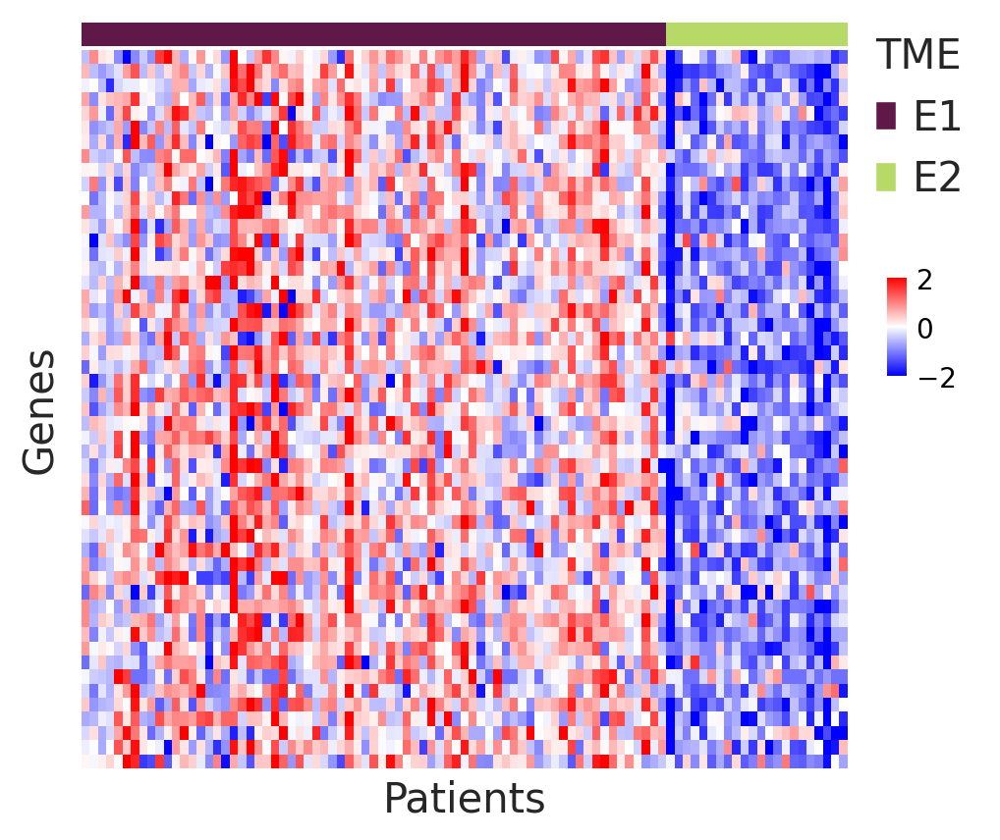

In [28]:
exp = SNU_adata_HVG.to_df()
SNU_annot = SNU_annot.sort_values(by='TME Subtype')
SNU_annot
order = list(SNU_annot.index)
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T


Annot_lut = dict()
Annot_int_map = dict(zip(SNU_annot['TME Subtype'].unique(),range(SNU_annot['TME Subtype'].nunique())))
Annot_lut['E1']='#601848'
Annot_lut['E2']='#B7D968'
Annot = SNU_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = SNU_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TMESubtype',:].unique())]


sc.settings.set_figure_params(fontsize=10)
fig = plt.figure(figsize=(5, 5), dpi= 100)
#plt.subplots_adjust(wspace = 0.2, hspace = 0.05)
widths = [1]
heights = [1,30]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.01, wspace=0.15, width_ratios=widths, height_ratios=heights)

ax0 = fig.add_subplot(gs[0, 0])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax0)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax0_legend = ax0.legend(handles, Annot_lut, bbox_to_anchor=(1.2, 2), frameon=False, 
                              fontsize=15, markerscale=4)
ax0_legend.set_title('TME',prop={'size':15})
ax0_legend._legend_box.align = "left"
ax0.set_xticks([])
ax0.set_xlabel('')
ax0.set_yticklabels('')
ax0.margins(0)

cbar_ax = fig.add_axes([1.0, 0.55, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax1 = fig.add_subplot(gs[1, 0])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax1, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax1.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax1.set_xticks([])
ax1.set_xlabel('Patients', fontsize=15, )
ax1.set_ylabel('Genes', fontsize=15, )
plt.show()

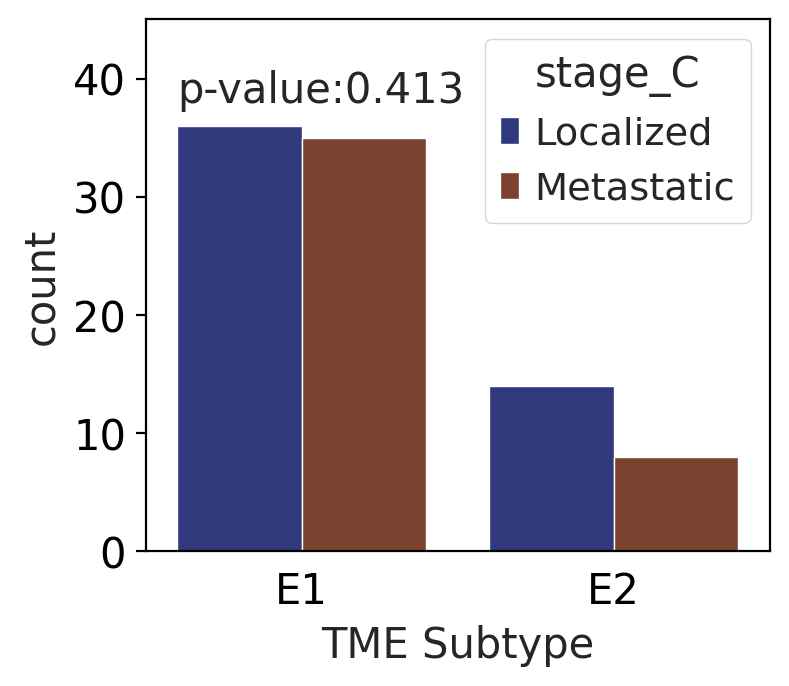

Localized     36
Metastatic    35
Name: stage_C, dtype: int64
Localized     14
Metastatic     8
Name: stage_C, dtype: int64


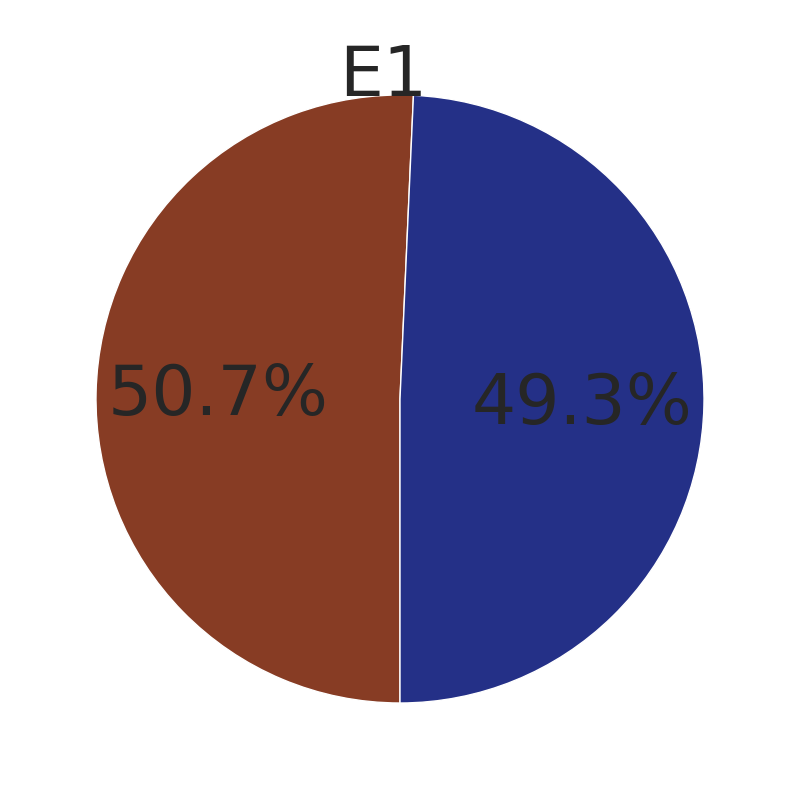

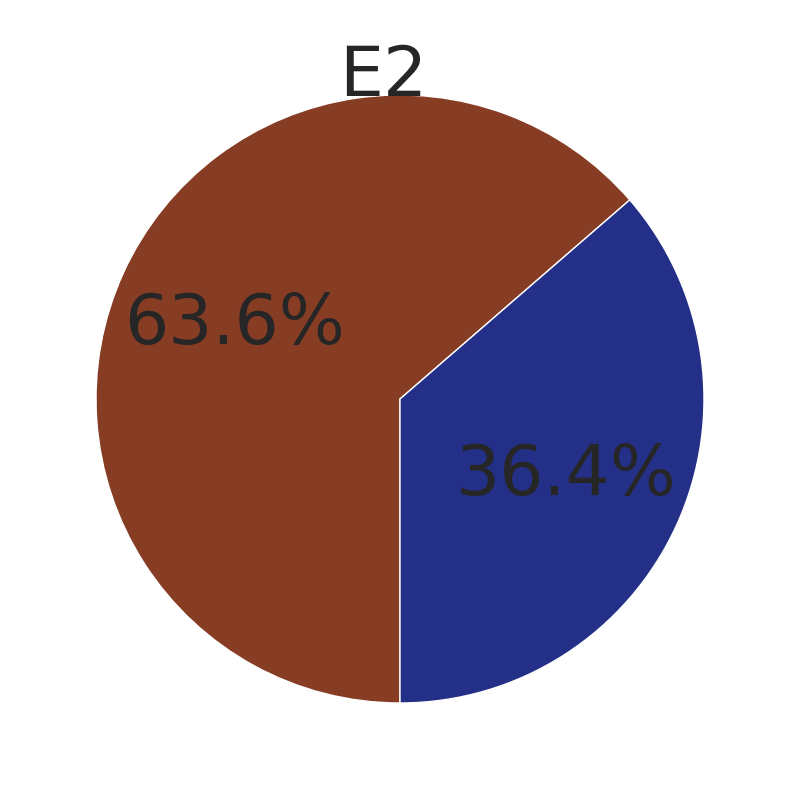

In [29]:
stage_palette = dict()
stage_palette['Localized']='#243087'
stage_palette['Metastatic']='#873c24'
sc.settings.set_figure_params(dpi=100, figsize=(4,3.5), fontsize=15)
stage_a = SNU_annot.loc[:,['stage_A','TME Subtype']]
stage_c = SNU_annot.loc[:,['stage_C','TME Subtype']]
# g = sns.countplot(x="TME Subtype",  hue="stage_A", data=stage_a, palette=stage_palette)
# ct_table_ind=pd.crosstab(SNU_annot['TME Subtype'],SNU_annot['stage_A'])    
# chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
# p = np.round(p,3)
# plt.text(-0.1, 22, 'p-value: {}'.format(p), fontsize=15)
# plt.ylim((0,45))
# #plt.title('Stage_A')
# plt.show()

g = sns.countplot(x="TME Subtype",  hue="stage_C", data=stage_c, palette=stage_palette)
ct_table_ind=pd.crosstab(SNU_annot['TME Subtype'],SNU_annot['stage_C'])    
chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
p = np.round(p,3)
plt.text(-0.4, 38, 'p-value:{}'.format(p), fontsize=15)
#plt.title('Stage_C')
plt.ylim((0,45))
plt.grid(False)
plt.show()


sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=25)

# mets_dict = dict()
# mets_dict['Mets_liver_C']='Liver'
# mets_dict['Mets_lung_C']='Lung'
# mets_dict['Mets_PS_C']='Peritoneal'


m1 = SNU_annot['TME Subtype'] == 'E1'
m2 = SNU_annot['TME Subtype'] == 'E2'

with_stage_sel1 = SNU_annot[m1]
print(with_stage_sel1['stage_C'].value_counts())
with_stage_sel2 = SNU_annot[m2]
print(with_stage_sel2['stage_C'].value_counts())

stage = with_stage_sel1['stage_C'].value_counts().to_frame('stage')
stage = stage/with_stage_sel1['stage_C'].value_counts().sum() *100
colors =['#873c24', '#243087'] 
ratio = stage.values.reshape(-1)
stage2 = list(stage.index)
patches, texts, autotexts = plt.pie(ratio, labels=stage2, autopct='%.1f%%', startangle=270, counterclock=False, 
                                    colors=colors, labeldistance=None)

plt.text(-0.2, 1,'E1')
#plt.legend(bbox_to_anchor=(0.9, .85))
plt.show()

stage = with_stage_sel2['stage_C'].value_counts().to_frame('stage')
stage = stage/with_stage_sel2['stage_C'].value_counts().sum() *100
colors =['#873c24', '#243087'] 
ratio = stage.values.reshape(-1)
stage2 = list(stage.index)
patches, texts, autotexts = plt.pie(ratio, labels=stage2, autopct='%.1f%%', startangle=270, counterclock=False, 
                                    colors=colors, labeldistance=None)
plt.text(-0.2, 1,'E2')
#plt.legend(bbox_to_anchor=(0.9, .85))
plt.show()


In [30]:
def col_rename(x):
    x = x.replace('X','')
    x = x.replace('.','-')
    return x


os.listdir('deconv_res')
epic = pd.read_csv('deconv_res/epic_deconv_SNU.csv', index_col='cell_type').drop('Unnamed: 0',axis=1)
quantiseq = pd.read_csv('deconv_res/quantiseq_deconv_SNU.csv', index_col='cell_type').drop('Unnamed: 0',axis=1)
mcp_counter = pd.read_csv('deconv_res/mcp_counter_deconv_SNU.csv', index_col='cell_type').drop('Unnamed: 0',axis=1)
xcell = pd.read_csv('deconv_res/xcell_deconv_SNU.csv', index_col='cell_type').drop('Unnamed: 0',axis=1)
epic.columns = epic.columns.map(col_rename)
quantiseq.columns = quantiseq.columns.map(col_rename)
mcp_counter.columns = mcp_counter.columns.map(col_rename)
xcell.columns = xcell.columns.map(col_rename)

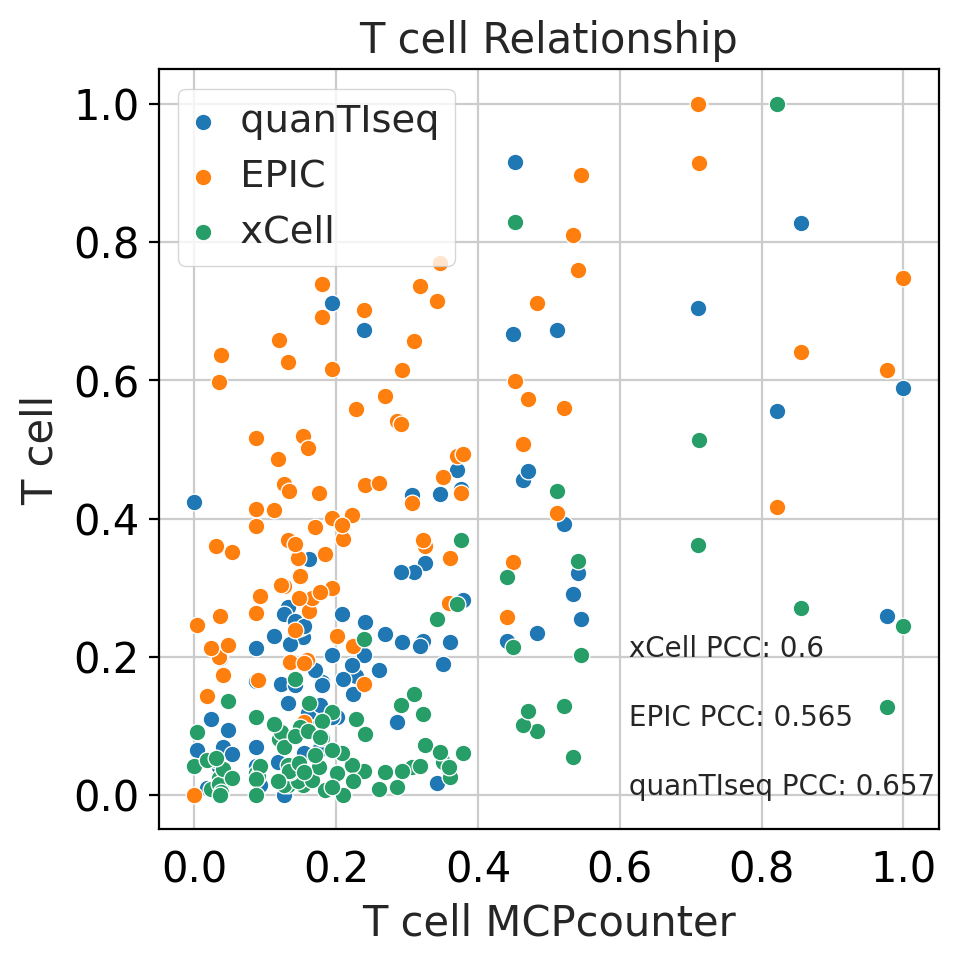

In [31]:
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=15)

mcp_counter = pd.read_csv('mcpcounter_LineageType.csv',index_col=0)
epic = pd.read_csv('epic_LineageType.csv',index_col=0)
quantiseq = pd.read_csv('quantiseq_LineageType.csv',index_col=0)
xcell = pd.read_csv('xcell_LineageType.csv',index_col=0)

mcp_counter.index = mcp_counter.index+' MCPcounter'
quantiseq.index = quantiseq.index+' quanTIseq'
epic.index = epic.index+' EPIC'
xcell.index = xcell.index+' xCell'

lineagetype = pd.concat([mcp_counter, quantiseq, epic, xcell],axis=0)
scaler = MinMaxScaler()
scaled = pd.DataFrame(scaler.fit_transform(lineagetype.T), columns=lineagetype.index, index=lineagetype.columns).T

target_cell = 'T cell'
ref = ' MCPcounter'
ref_cell = target_cell+ref
target_groups = [' quanTIseq',' EPIC',' xCell']
text_ypos = 0.0
text_xpos = 0.6
spacing = 0.1
i=0
for group in target_groups:
    cell = target_cell+group
    if cell in lineagetype.index:
        sns.scatterplot(x=scaled.loc[ref_cell,:],y=scaled.loc[cell,:], label=group)
        corr = np.round(np.corrcoef(scaled.loc[ref_cell,:],scaled.loc[cell,:])[0,1],3)
        corr = '{} PCC: {}'.format(group,corr)
        plt.text(text_xpos, text_ypos+i*spacing, corr, fontsize=10)
        i+=1
          
plt.ylabel('{}'.format(target_cell))
plt.title('{} Relationship'.format(target_cell))
plt.show()    



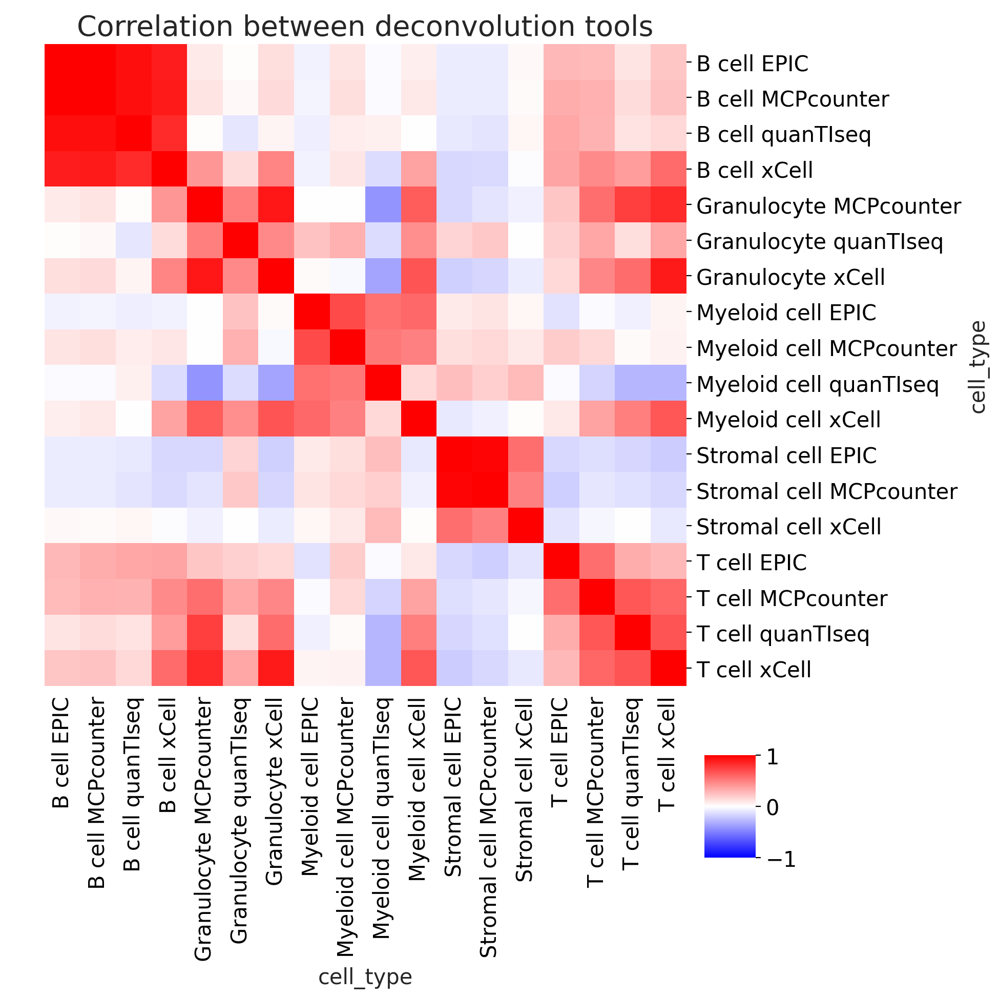

In [32]:
tmp = lineagetype.T.corr()
ordered = sorted(tmp.columns)
tmp = tmp.loc[ordered,ordered]
g=sns.clustermap(tmp,method='ward',row_cluster=False,col_cluster=False,
               dendrogram_ratio=0.05,cbar_pos=(0.7, 0.15, 0.05, 0.1),cmap="bwr", vmin=-1, vmax=1)
g.ax_heatmap.set_title('Correlation between deconvolution tools',fontsize=20)
plt.show()

In [33]:
order = list(SNU_annot.index)

scaler = StandardScaler()
#scaler = MinMaxScaler()
mcp_counter = pd.read_csv('mcpcounter_LineageType.csv',index_col=0)
mcp_counter = pd.DataFrame(scaler.fit_transform(mcp_counter.loc[:,order].T), columns=mcp_counter.index, index=mcp_counter.columns).T

epic = pd.read_csv('epic_LineageType.csv',index_col=0)
epic = pd.DataFrame(scaler.fit_transform(epic.loc[:,order].T), columns=epic.index, index=epic.columns).T
quantiseq = pd.read_csv('quantiseq_LineageType.csv',index_col=0)
quantiseq = pd.DataFrame(scaler.fit_transform(quantiseq.loc[:,order].T), columns=quantiseq.index, index=quantiseq.columns).T
xcell = pd.read_csv('xcell_LineageType.csv',index_col=0)
xcell = pd.DataFrame(scaler.fit_transform(xcell.loc[:,order].T), columns=xcell.index, index=xcell.columns).T

In [38]:
sig_dict = dict()
sig_genes = pd.read_csv('SigGenes.csv',index_col=0)
sig_genes
common_genes = list(set(SNU_adata.to_df().columns) & set(sig_genes.index))
m = sig_genes.index.isin(common_genes)
sig_genes = sig_genes[m]
sig_genes.to_csv('Signature_Genes.csv')


sig_keys = list(sig_genes['Signarutre'].unique())
snu_exp = SNU_adata.to_df()
zscore = snu_exp.copy()
#zscore = pd.DataFrame(scaler.fit_transform(snu_exp), columns=snu_exp.columns, index=snu_exp.index)

score_list = []
for key in sig_keys:
    m = sig_genes['Signarutre'] == key
    gene_set = list(sig_genes[m].index)
    sig_score = zscore.loc[:,gene_set]
    sig_score = sig_score.sum(axis=1).to_frame(name=key)
    score_list.append(sig_score)
    #print(key)
sig_gene_score = pd.concat(score_list, axis=1)
sig_gene_score

scaler = StandardScaler()
#scaler = MinMaxScaler()

sig_gene_score_std = pd.DataFrame(scaler.fit_transform(sig_gene_score.loc[order,:]), columns=sig_gene_score.columns, index=sig_gene_score.index).T
sig_gene_score_std

Snubh_TB,20-T00330_FO-01,19-T00062_FO-01,20-T00814_FT-01,19-T00201_FO-01,19-T00505_FO-01,20-T00764_FT-01,20-T00577_FT-01,21-T00687_FT-01,21-T00771_FT-01,18-01500_FO-01,...,19-T00380_FO-01,19-T00573_FO-01,20-T00105_FO-01,21-T00511_FT-01,22-T00038_FT-01,21-T00576_FT-01,19-T00620_FO-01,19-T00413_FO-01,20-T00073_FO-01,19-T00119_FO-01
Treg,0.605731,1.008736,0.556780,-0.156992,-0.431930,-0.686374,0.009143,-0.520917,0.276189,-0.068840,...,-0.919843,-1.014388,-1.193366,-1.967252,-0.683388,-1.038763,-2.163225,-1.132557,-1.086248,-0.966432
MDSC,-0.015782,1.236364,0.076439,-0.658662,-0.296325,-0.686377,-0.151526,-0.198810,-0.123624,0.440922,...,-0.657263,-1.638272,-1.145767,-0.913528,-1.114378,-1.960976,-2.289387,-0.708108,-0.641992,0.399732
Immune Suppression Factors,0.738136,0.602823,-0.481764,0.354536,-0.537517,-1.214300,0.317645,0.103197,2.652811,-0.041917,...,-0.749057,-0.467612,-1.467575,-1.169971,-1.381104,-1.299046,-2.423042,-1.367592,-0.155768,-0.513235
Tumor-associated Macrophages,-0.283428,-0.043349,-0.949669,0.261534,0.136981,-0.294969,1.478990,-0.779524,1.024883,-0.011850,...,-0.691521,-0.510981,-0.514623,-0.932916,-0.478485,-0.680824,-2.616100,-1.251988,-2.089607,-0.969623


In [35]:
def rep(x):
    x = x.replace('X','')
    return x.replace('.','-')

scaler = StandardScaler()
#scaler = MinMaxScaler()
mcp_counter = pd.read_csv('/mnt/HDD1/Work_Paper/RNAseq_Analysis/deconv_res/mcp_counter_deconv_SNU.csv',index_col=0)
mcp_counter.columns = mcp_counter.columns.map(rep)
mcp_counter = mcp_counter.set_index('cell_type')
mcp_counter = pd.DataFrame(scaler.fit_transform(mcp_counter.loc[:,order].T), columns=mcp_counter.index, index=mcp_counter.columns).T

In [36]:
mcp_order = ['T cell', 'T cell CD8+', 'NK cell',
             'Monocyte', 'Macrophage/Monocyte', 'Myeloid dendritic cell', 'Neutrophil', 
             'Cancer associated fibroblast', 'Endothelial cell', 'B cell']

mcp_counter = mcp_counter.loc[mcp_order, :]

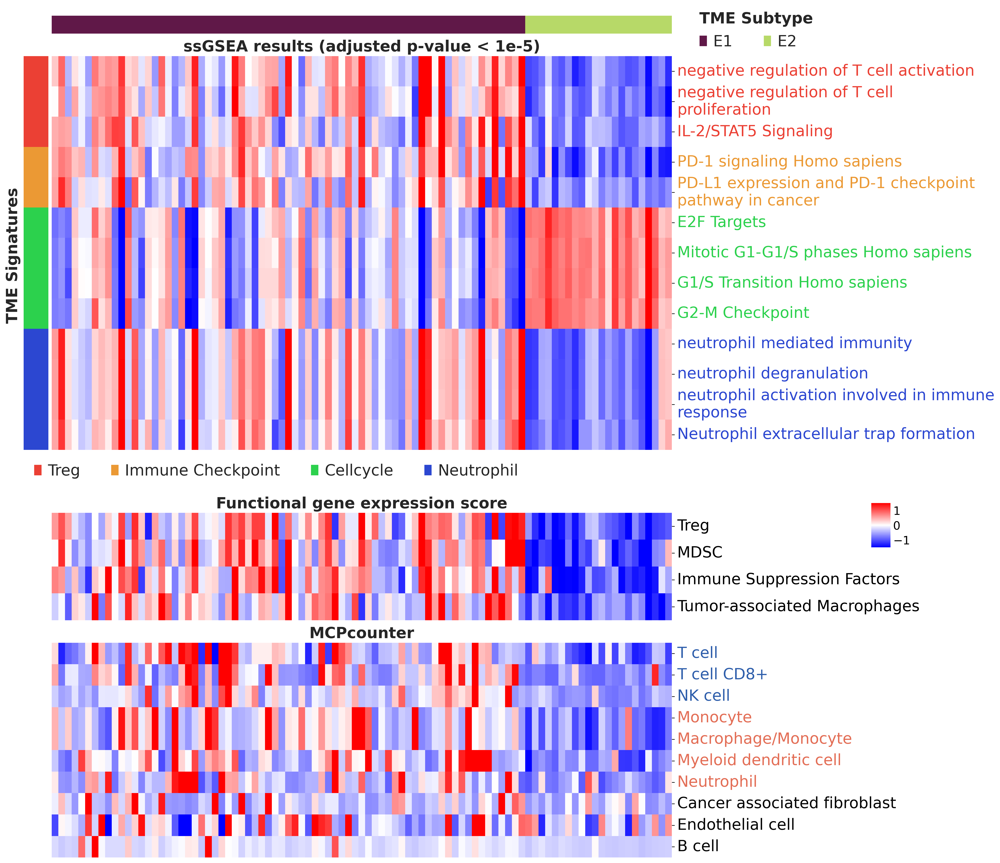

In [39]:
annotation = SNU_annot.sort_values(by='TME Subtype')
order = list(annotation.index)
tme = tme.loc[:,order]
tme

fig = plt.figure(figsize=(15, 20), dpi= 150)
widths = [1,25]
heights = [1,22,1,6,12]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.15, wspace=0.01, width_ratios=widths, height_ratios=heights)


Annot_lut = dict()
Annot_int_map = dict(zip(annotation['TME Subtype'].unique(),range(annotation['TME Subtype'].nunique())))
Annot_lut['E1']='#601848'
Annot_lut['E2']='#B7D968'
Annot = annotation['TME Subtype'].map(Annot_int_map).to_frame('TME Subtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = annotation['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TMESubtype',:].unique())]

ax = fig.add_subplot(gs[0, 1])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax_legend = ax.legend(handles, Annot_lut, bbox_to_anchor=(1.25, 2),
                              fontsize=20, markerscale=20, frameon=False, ncol=2)
ax_legend.set_title('TME Subtype',prop={'size':20, 'weight':'bold'})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticks([])
ax.set_yticklabels([])
#ax.set_ylabel('Subtype',fontdict={'fontsize':25,'weight':'bold'})
ax.margins(0)

plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = False

ax = fig.add_subplot(gs[1, 0])
sns.heatmap(tme_sigtype, cmap=list(tme_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=tme_lut[name]) for name in tme_lut]
ax_legend = ax.legend(handles, tme_lut, bbox_to_anchor=(20.5, 0), frameon=False, 
                              fontsize=20, markerscale=3, ncol=4)

#ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_ylabel('TME Signatures ',fontdict={'fontsize':20,'weight':'bold'})
ax.margins(0)

# cbar_ax = fig.add_axes([1, 0.08, 0.02, 0.06], frameon=False, xticklabels=[], yticklabels=[])
# cbar_ax.tick_params(axis=u'both', which=u'both',length=0, labelsize=25)

ax = fig.add_subplot(gs[1, 1])
sns.heatmap(tme, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=20)
ax.set_title('ssGSEA results (adjusted p-value < 1e-5)',fontdict={'fontsize':20,'weight':'bold'})
#ax.set_xlabel('Patients',fontdict=dict(weight='bold',fontsize=35))


for i, tick_label in enumerate(ax.axes.get_yticklabels()):
    color_idx = tme_sigtype.iloc[i,0] - len(set(tumor_sig))
    tick_label.set_color(list(tme_lut.values())[color_idx])


ax = fig.add_subplot(gs[3, 1])
sns.heatmap(sig_gene_score_std, cmap='bwr', vmin=-1.5, vmax=1.5, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
#sns.heatmap(sig_gene_score_std, cmap='bwr', vmin=0, vmax=1, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
ax.set_ylabel('')
ax.set_xlabel('')
ax.tick_params(axis='y', labelsize=20)
ax.set_title('Functional gene expression score',fontdict={'fontsize':20, 'weight':'bold'})
plt.yticks(rotation=0)



cbar_ax = fig.add_axes([1.2, 0.43, 0.023, 0.04], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax = fig.add_subplot(gs[4, 1])
sns.heatmap(mcp_counter, cmap='bwr', vmin=-1.5, vmax=1.5, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=20)
ax.set_title('MCPcounter',fontdict={'fontsize':20, 'weight':'bold'})
plt.yticks(rotation=0)


MCP_colors = ['#2e5eab','#2e5eab','#2e5eab','#e36e56','#e36e56','#e36e56','#e36e56','#050505','#050505','#050505']
MCP_Sig = dict()
MCP_Sig['Lymphoid']='#2e5eab'
MCP_Sig['Myeloid']='#e36e56'
#MCP_Sig['The others']='#050505'


for i, tick_label in enumerate(ax.axes.get_yticklabels()):
    tick_label.set_color(MCP_colors[i])


# handles = [mpatches.Patch(facecolor=MCP_Sig[name]) for name in MCP_Sig]
# ax_legend = ax.legend(handles, MCP_Sig, bbox_to_anchor=(0.55, 0), frameon=False, 
#                               fontsize=20, markerscale=3, ncol=3)


plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True
plt.show()


In [40]:
handles = [mpatches.Patch(facecolor=tme_lut[name]) for name in tme_lut]
ax_legend = ax.legend(handles, tme_lut, bbox_to_anchor=(20.5, 0), frameon=False, 
                              fontsize=20, markerscale=3, ncol=4)

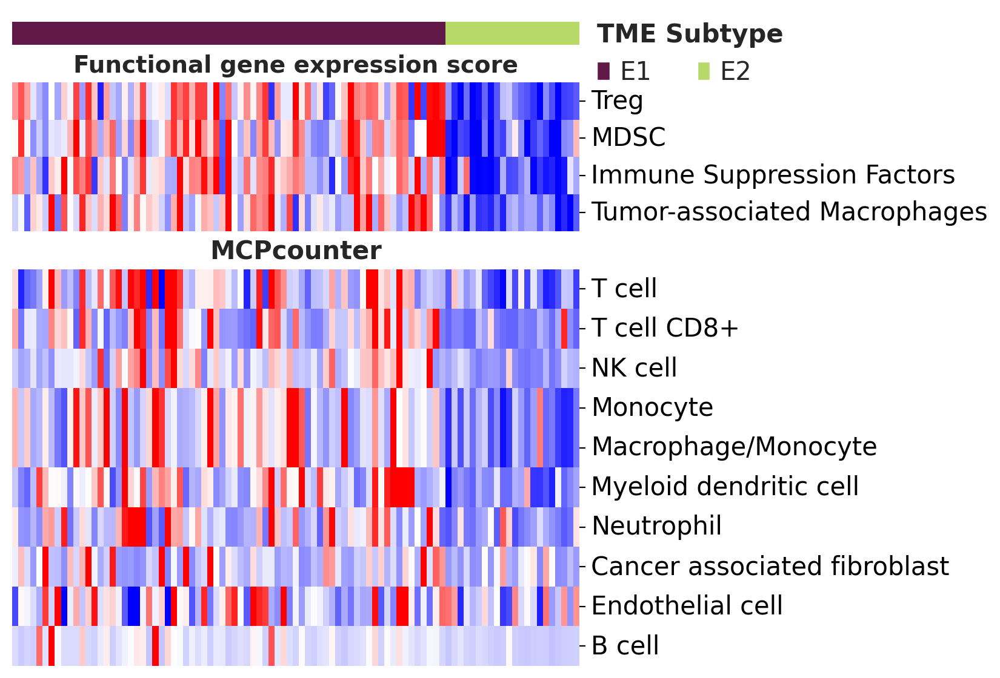

In [41]:
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=10)

fig = plt.figure(figsize=(6, 7), dpi= 100)
widths = [1]
heights = [0.23,1.5,4]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.2, wspace=0.01, width_ratios=widths, height_ratios=heights)

Annot_lut = dict()
Annot_int_map = dict(zip(SNU_annot['TME Subtype'].unique(),range(SNU_annot['TME Subtype'].nunique())))
Annot_lut['E1']='#601848'
Annot_lut['E2']='#B7D968'
Annot = SNU_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = SNU_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TMESubtype',:].unique())]
ax = fig.add_subplot(gs[0, 0])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax)

handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax_legend = ax.legend(handles, Annot_lut, bbox_to_anchor=(1.4, 2),
                              fontsize=15, markerscale=2, frameon=False, ncol=2, columnspacing=1.8)
ax_legend.set_title('TME Subtype',prop={'size':15,'weight':'bold'})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels([])
ax.set_yticks([])
ax.set_ylabel('')
ax.margins(0)


plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = False


ax = fig.add_subplot(gs[1, 0])
sns.heatmap(sig_gene_score_std, cmap='bwr', vmin=-1.5, vmax=1.5, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
#sns.heatmap(sig_gene_score_std, cmap='bwr', vmin=0, vmax=1, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
ax.set_ylabel('')
ax.set_xlabel('')
ax.tick_params(axis='y', labelsize=15)
ax.set_title('Functional gene expression score',fontdict={'fontsize':14, 'weight':'bold'})
plt.yticks(rotation=0)



# cbar_ax = fig.add_axes([1.2, 0.55, 0.023, 0.05], frameon=False, xticklabels=[], yticklabels=[])
# cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax = fig.add_subplot(gs[2, 0])
sns.heatmap(mcp_counter, cmap='bwr', vmin=-1.5, vmax=1.5, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=15)
ax.set_title('MCPcounter',fontdict={'fontsize':15, 'weight':'bold'})
plt.yticks(rotation=0)


plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True
plt.show()

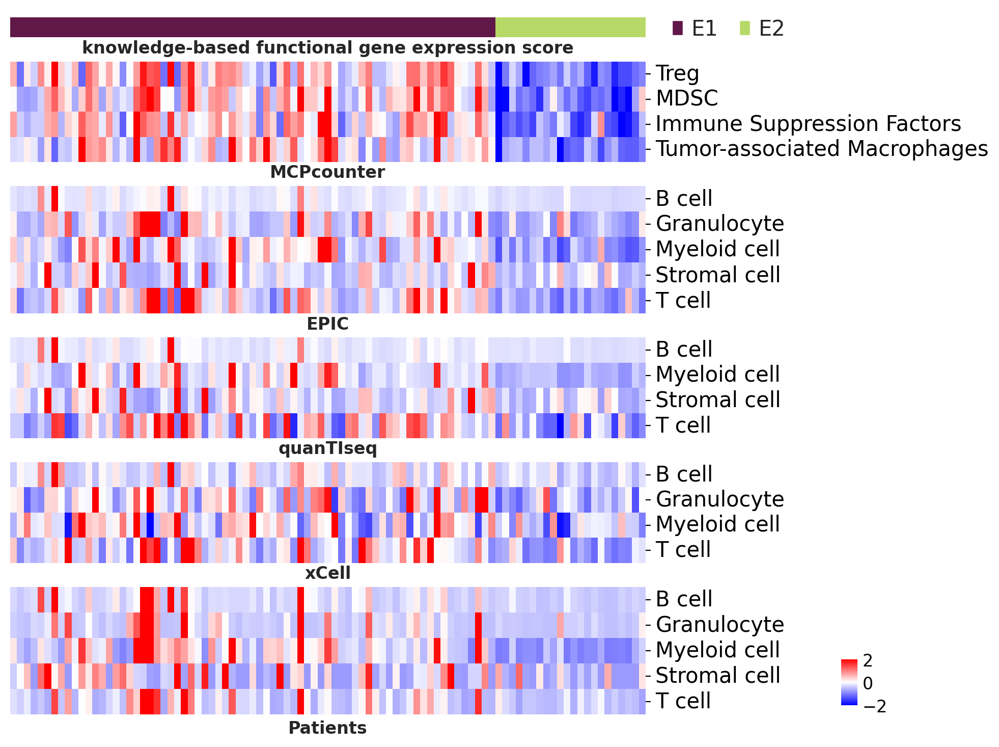

In [93]:
# sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=12)

# fig = plt.figure(figsize=(8, 9), dpi= 100)
# widths = [1]
# heights = [0.3,1.5,1.9,1.5,1.5,1.9]
# gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.25, wspace=0.01, width_ratios=widths, height_ratios=heights)


# Annot_lut = dict()
# Annot_int_map = dict(zip(SNU_annot['TME Subtype'].unique(),range(SNU_annot['TME Subtype'].nunique())))
# Annot_lut['E1']='#601848'
# Annot_lut['E2']='#B7D968'
# Annot = SNU_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)

# cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
# Annot = SNU_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)
# cmap = [cmap_dict[val] for val in list(Annot.loc['TMESubtype',:].unique())]
# ax = fig.add_subplot(gs[0, 0])
# sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax)


# handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
# ax_legend = ax.legend(handles, Annot_lut, bbox_to_anchor=(1.25, 1.9),
#                               fontsize=15, markerscale=2, frameon=False, ncol=2, columnspacing=1)
# #ax_legend.set_title('TME Subtype',prop={'size':14})
# ax_legend._legend_box.align = "left"
# ax.set_xticks([])
# ax.set_xlabel('')
# ax.set_yticklabels([])
# ax.set_yticks([])
# ax.set_ylabel('')
# ax.margins(0)


# plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = True
# plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = False


# ax = fig.add_subplot(gs[1, 0])
# sns.heatmap(sig_gene_score_std, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
# #sns.heatmap(sig_gene_score_std, cmap='bwr', vmin=0, vmax=1, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
# ax.set_xticks([])
# ax.set_ylabel('')
# ax.set_xlabel('')
# ax.tick_params(axis='y', labelsize=15)
# ax.set_title('knowledge-based functional gene expression score',fontdict={'fontsize':12, 'weight':'bold'})
# plt.yticks(rotation=0)


# ax = fig.add_subplot(gs[2, 0])
# sns.heatmap(mcp_counter, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
# ax.set_xticks([])
# ax.set_ylabel('')
# ax.tick_params(axis='y', labelsize=15)
# ax.set_title('MCPcounter',fontdict={'fontsize':12, 'weight':'bold'})
# plt.yticks(rotation=0)


# ax = fig.add_subplot(gs[3, 0])
# sns.heatmap(epic, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
# ax.set_xticks([])
# ax.set_ylabel('')
# ax.tick_params(axis='y', labelsize=15)
# ax.set_title('EPIC',fontdict={'fontsize':12, 'weight':'bold'})
# plt.yticks(rotation=0)


# ax = fig.add_subplot(gs[4, 0])
# sns.heatmap(quantiseq, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
# ax.set_xticks([])
# ax.set_ylabel('')
# ax.tick_params(axis='y', labelsize=15)
# ax.set_title('quanTIseq',fontdict={'fontsize':12, 'weight':'bold'})
# plt.yticks(rotation=0)


# cbar_ax = fig.add_axes([1.2, 0.16, 0.02, 0.05], frameon=False, xticklabels=[], yticklabels=[])
# cbar_ax.tick_params(axis=u'both', which=u'both',length=0)
# ax = fig.add_subplot(gs[5, 0])
# sns.heatmap(xcell, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
# ax.set_xticks([])
# ax.set_ylabel('')
# ax.tick_params(axis='y', labelsize=15)
# ax.set_title('xCell',fontdict={'fontsize':12, 'weight':'bold'})
# plt.yticks(rotation=0)
# ax.set_xlabel('Patients',fontdict={'fontsize':12, 'weight':'bold'})




# plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
# plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True
# plt.show()

## Bailey

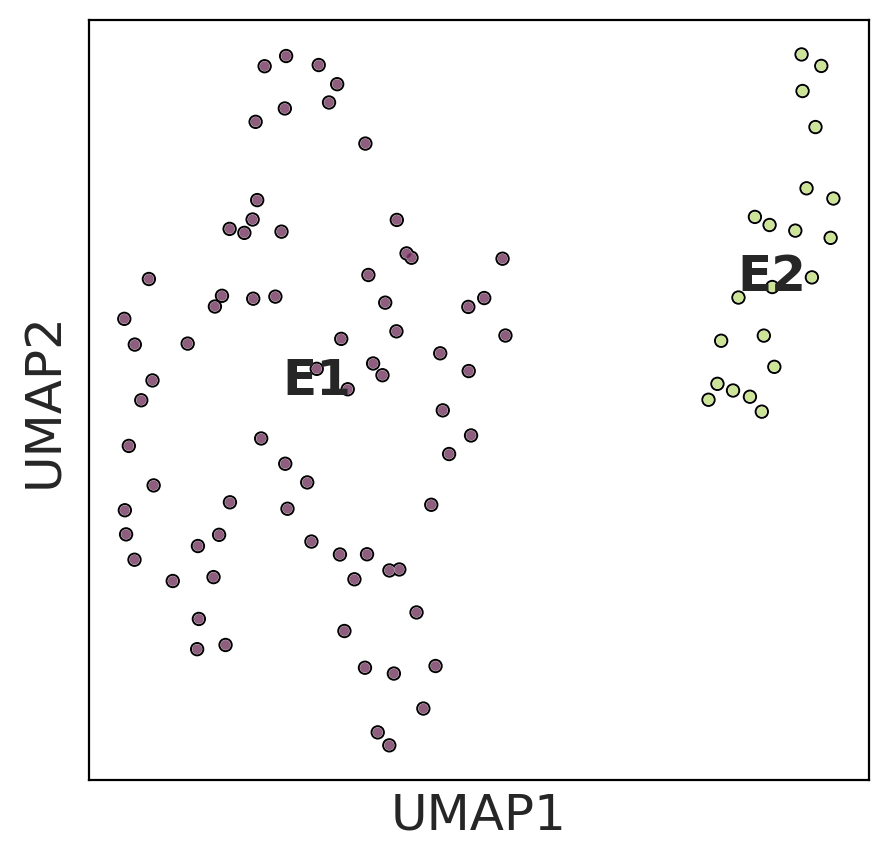

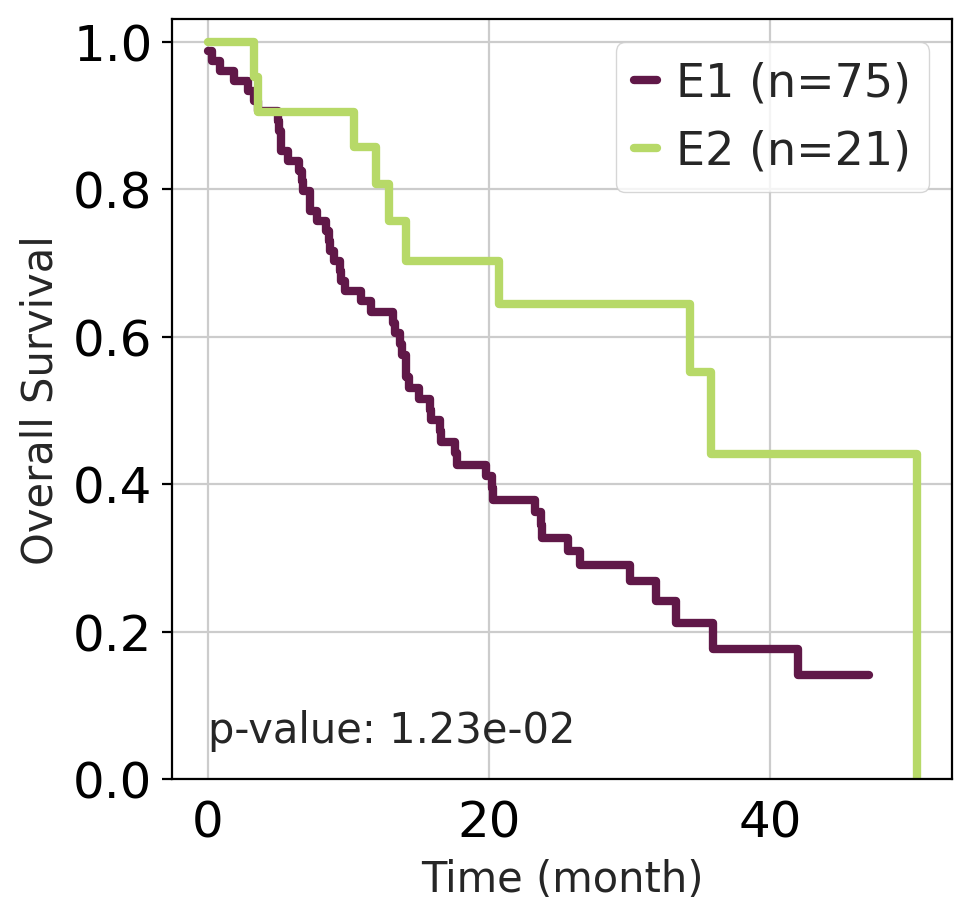

In [42]:
Bailey_adata_HVG = Bailey_adata[:,features]

sc.tl.pca(Bailey_adata_HVG, svd_solver='arpack', n_comps = 3)
sc.pp.neighbors(Bailey_adata_HVG, n_neighbors=6)

Bailey_adata_HVG.obs['TME Subtype'] = Bailey_annot['TME Subtype']
#print(mg_adata_bec_HVG.obs['leiden'].value_counts())

sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
sc.tl.umap(Bailey_adata_HVG)
sc.pl.umap(Bailey_adata_HVG, color=['TME Subtype'], s=50, wspace=0.4, title='', palette = umap_color, add_outline=True, outline_width=(0.2, 0.03)
          ,legend_loc='on data')
df_clinical = Bailey_adata_HVG.obs.copy()
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
bailey_p = km_plot(df_info=df_clinical, category='TME Subtype', os='OS_F', event='OS_event', title='', color=['#601848','#B7D968'])

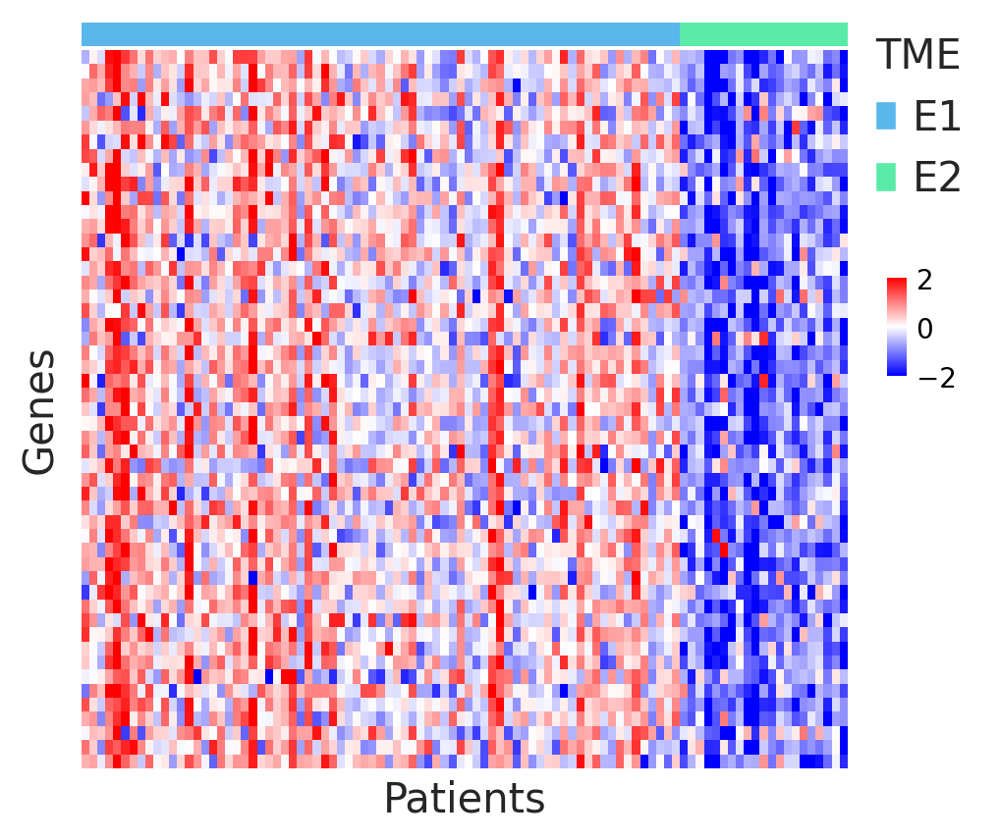

In [43]:
exp = Bailey_adata_HVG.to_df()
#annot = pd.read_csv('Bailey_TumorType.csv',index_col=0).sort_values(by='Tumor2Type_1st')
Bailey_annot = Bailey_annot.sort_values(by='TME Subtype')
Bailey_annot
order = list(Bailey_annot.index)
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T

Annot_lut = dict()
Annot_int_map = dict(zip(Bailey_annot['TME Subtype'].unique(),range(Bailey_annot['TME Subtype'].nunique())))
Annot_lut['E1']='#5bb6eb'
Annot_lut['E2']='#5beba8'
Annot = Bailey_annot['TME Subtype'].map(Annot_int_map).to_frame('TME Subtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = Bailey_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TMESubtype',:].unique())]


sc.settings.set_figure_params(fontsize=10)
fig = plt.figure(figsize=(5, 5), dpi= 100)
widths = [1]
heights = [1,30]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.01, wspace=0.15, width_ratios=widths, height_ratios=heights)

ax0 = fig.add_subplot(gs[0, 0])
sns.heatmap(Annot, cmap=cmap, cbar=False, ax=ax0)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax0_legend = ax0.legend(handles, Annot_lut, bbox_to_anchor=(1.2, 2), frameon=False, 
                              fontsize=15, markerscale=4)
ax0_legend.set_title('TME',prop={'size':15})
ax0_legend._legend_box.align = "left"
ax0.set_xticks([])
ax0.set_xlabel('')
ax0.set_yticklabels('')
ax0.margins(0)

cbar_ax = fig.add_axes([1.0, 0.55, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax1 = fig.add_subplot(gs[1, 0])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax1, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax1.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax1.set_xticks([])
ax1.set_xlabel('Patients', fontsize=15, )
ax1.set_ylabel('Genes', fontsize=15, )
plt.show()

## TCGA 

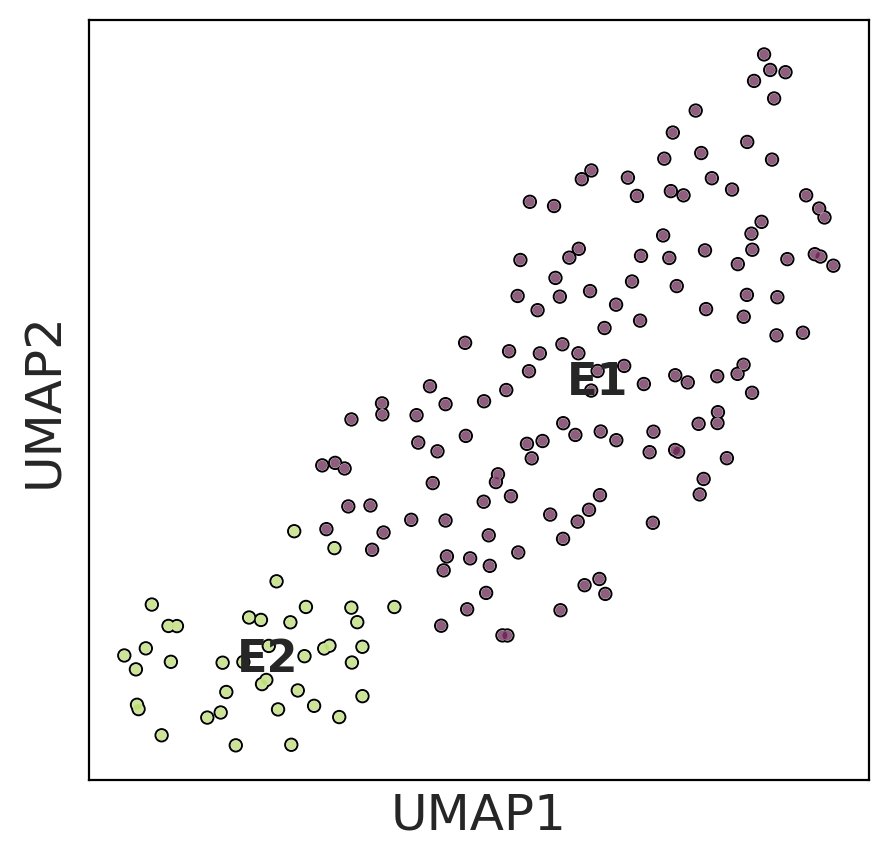

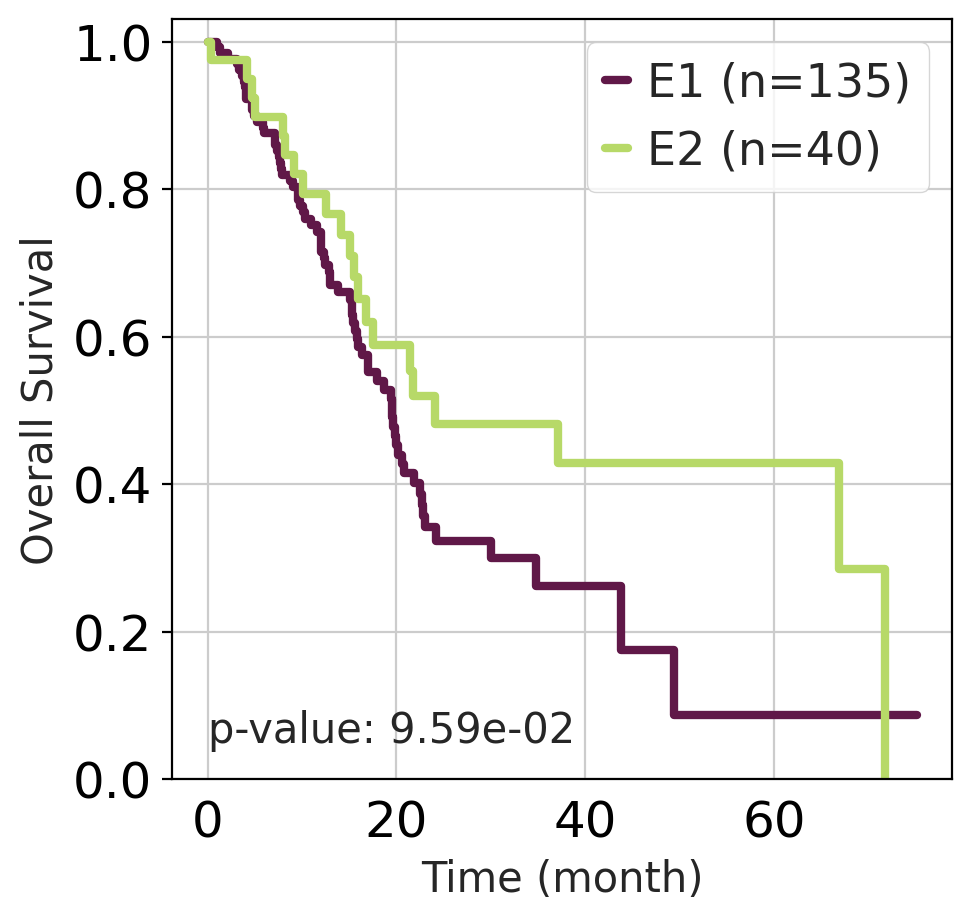

In [44]:
TCGA_adata_HVG = TCGA_adata[:,features]
sc.tl.pca(TCGA_adata_HVG, svd_solver='arpack', n_comps = 8)
sc.pp.neighbors(TCGA_adata_HVG, n_neighbors=10)
TCGA_adata_HVG.obs['TME Subtype']=TCGA_annot['TME Subtype']

sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
sc.tl.umap(TCGA_adata_HVG)
sc.pl.umap(TCGA_adata_HVG, color=['TME Subtype'], s=50, wspace=0.4, legend_fontsize = 16, title='', palette = umap_color, add_outline=True, outline_width=(0.2, 0.03)
          ,legend_loc='on data')
df_clinical = TCGA_adata_HVG.obs.copy()
sc.settings.set_figure_params(figsize=(6, 6), facecolor='white')
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
tcga_p = km_plot(df_info=df_clinical, category='TME Subtype', os='OS_F', event='OS_event', title='', color=['#601848','#B7D968'])

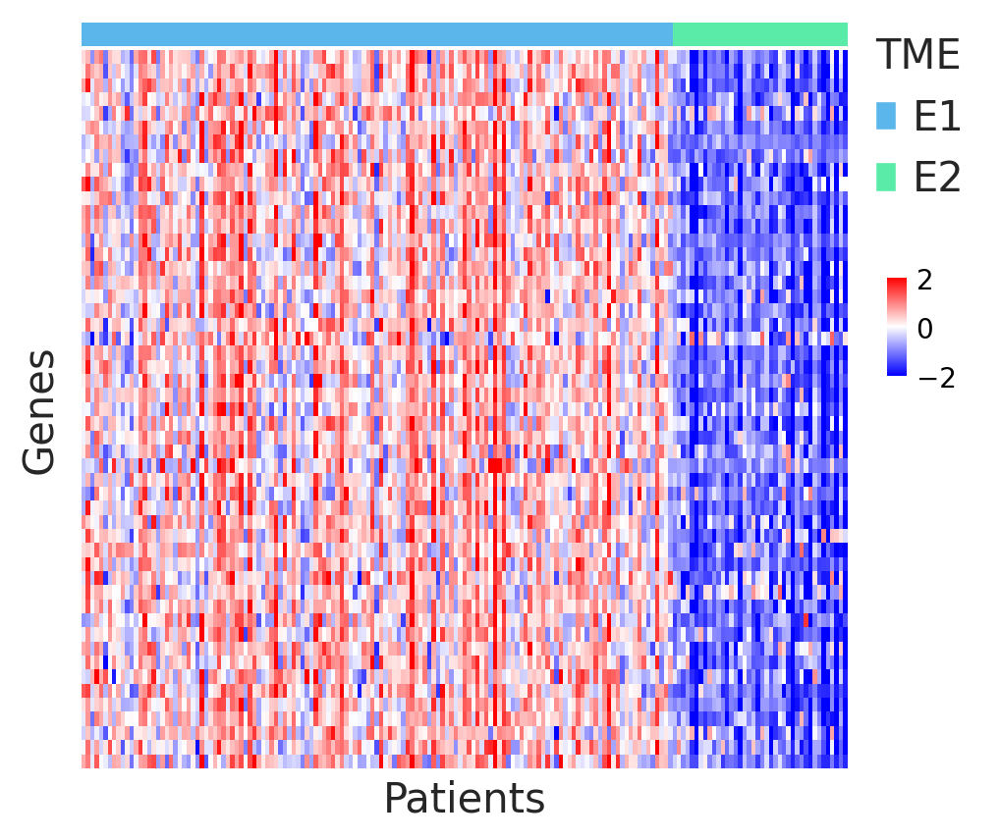

In [45]:
exp = TCGA_adata_HVG.to_df()
#annot = pd.read_csv('Bailey_TumorType.csv',index_col=0).sort_values(by='Tumor2Type_1st')
#TCGA_annot = TCGA_annot.loc[m,:]
TCGA_annot = TCGA_annot.sort_values(by='TME Subtype')
TCGA_annot
order = list(TCGA_annot.index)
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T


Annot_lut = dict()
Annot_int_map = dict(zip(TCGA_annot['TME Subtype'].unique(),range(TCGA_annot['TME Subtype'].nunique())))
Annot_lut['E1']='#5bb6eb'
Annot_lut['E2']='#5beba8'
Annot = TCGA_annot['TME Subtype'].map(Annot_int_map).to_frame('TME Subtype').T.astype(float)

cmap_dict = int2color_dict(Annot_int_map, Annot_lut)
Annot = TCGA_annot['TME Subtype'].map(Annot_int_map).to_frame('TMESubtype').T.astype(float)
cmap = [cmap_dict[val] for val in list(Annot.loc['TMESubtype',:].unique())]


sc.settings.set_figure_params(fontsize=10)
fig = plt.figure(figsize=(5, 5), dpi= 100)
widths = [1]
heights = [1,30]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.01, wspace=0.15, width_ratios=widths, height_ratios=heights)

ax0 = fig.add_subplot(gs[0, 0])
sns.heatmap(Annot, cmap=list(Annot_lut.values()), cbar=False, ax=ax0)
handles = [mpatches.Patch(facecolor=Annot_lut[name]) for name in Annot_lut]
ax0_legend = ax0.legend(handles, Annot_lut, bbox_to_anchor=(1.2, 2), frameon=False, 
                              fontsize=15, markerscale=4)
ax0_legend.set_title('TME',prop={'size':15})
ax0_legend._legend_box.align = "left"
ax0.set_xticks([])
ax0.set_xlabel('')
ax0.set_yticklabels('')
ax0.margins(0)

cbar_ax = fig.add_axes([1.0, 0.55, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax1 = fig.add_subplot(gs[1, 0])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax1, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax1.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax1.set_xticks([])
ax1.set_xlabel('Patients', fontsize=15, )
ax1.set_ylabel('Genes', fontsize=15, )
plt.show()

# Tumor/TME Relation (MCnemar)

TME Type    E2  E1
Tumor Type        
C1          17  37
C2           5  34
1.7235135468062268e-06


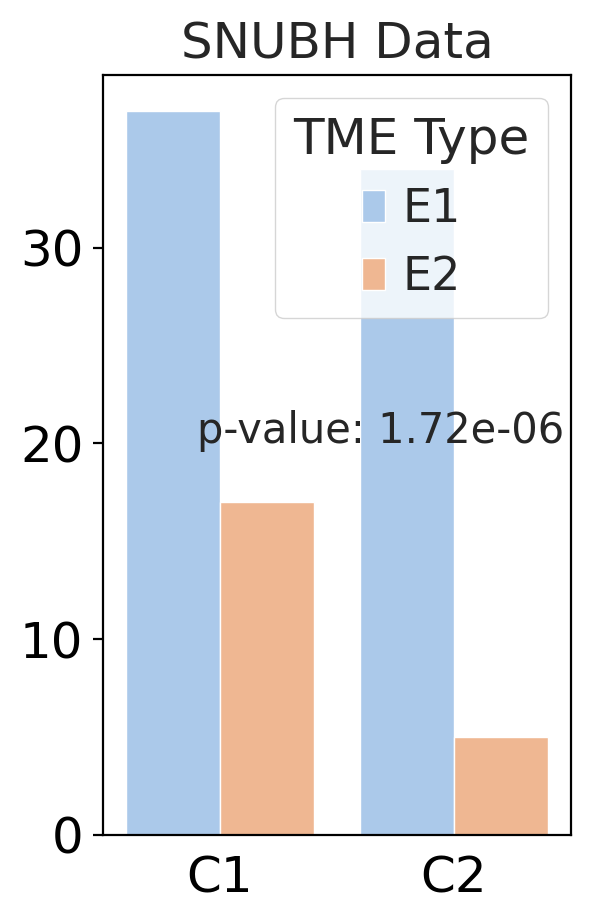

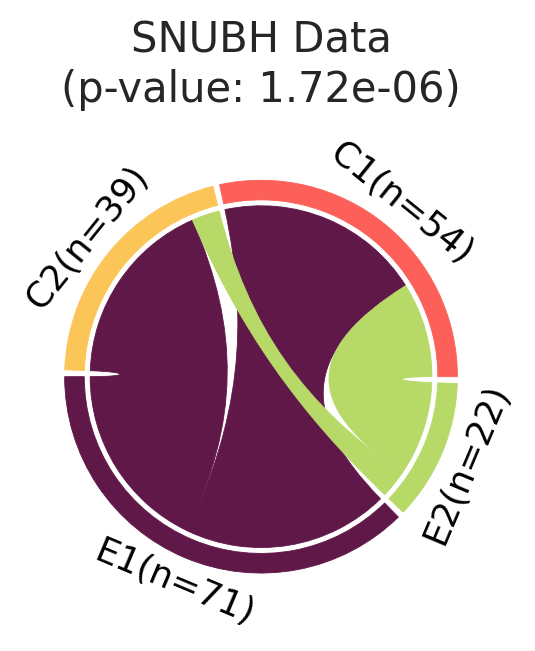

In [46]:
from statsmodels.stats.contingency_tables import mcnemar
sc.settings.set_figure_params(dpi=100, figsize=(3,5), fontsize=18)
tmp = SNU_annot.loc[:,['Tumor Subtype','TME Subtype']]
tmp.columns = ['Tumor Type', 'TME Type']
sns.countplot(x="Tumor Type", hue="TME Type", data=tmp, palette='pastel')
ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type']).loc[:,['E2','E1']] 
ct_table_ind
p = mcnemar(ct_table_ind.values, exact=False).pvalue
p_val="{:.2e}".format(p)
print(ct_table_ind)
print(p)
plt.text(-0.1, 20, 'p-value: {}'.format(p_val), fontsize=15)
plt.title('SNUBH Data')
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

from mpl_chord_diagram import chord_diagram
ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type']).loc[:,['E1','E2']] 
matrix = ct_table_ind.values
zeros = np.zeros((4,4))
zeros[:2,2:] = matrix
zeros[2:,:2] = matrix.T
mat = zeros
def ret(df):
    return '{}(n={})'.format(df['Tumor Type'], df['counts'])
c_count = tmp.loc[:,['Tumor Type']].value_counts().to_frame(name='counts')
e_count = tmp.loc[:,['TME Type']].value_counts().to_frame(name='counts')
df_count = pd.concat([c_count,e_count],axis=0).loc[['C1','C2','E1','E2'],:]
df_count = df_count.reset_index(level=[0])
names = list(df_count.apply(ret,axis=1))
chord_diagram(mat,names=names,colors=['#fc6058','#fcc558','#601848','#B7D968'],alpha=1)
plt.title('SNUBH Data\n(p-value: {})'.format(p_val),fontsize=15, y=1.1)
plt.show()

TME Type    E2  E1
Tumor Type        
C1          18  47
C2           3  28
1.1934717937220412e-09


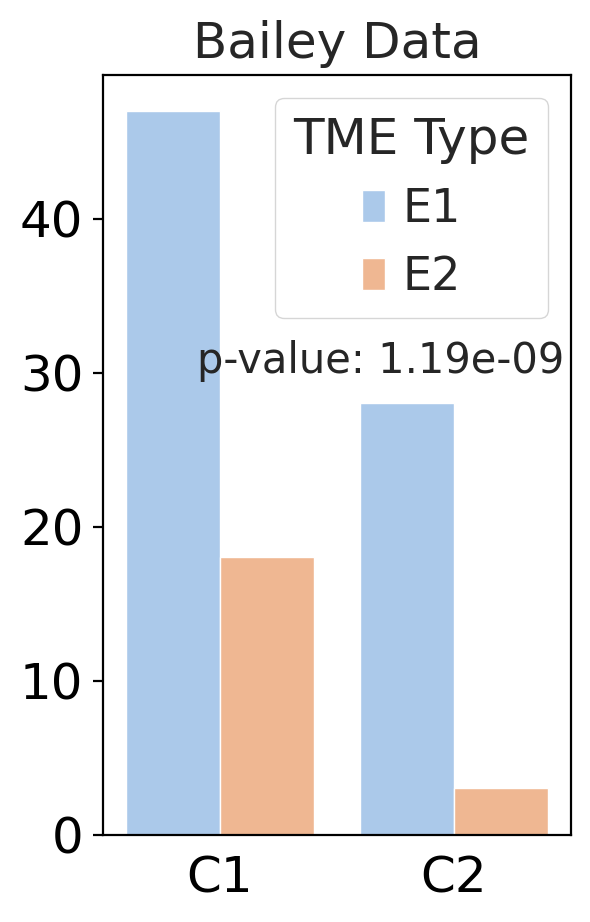

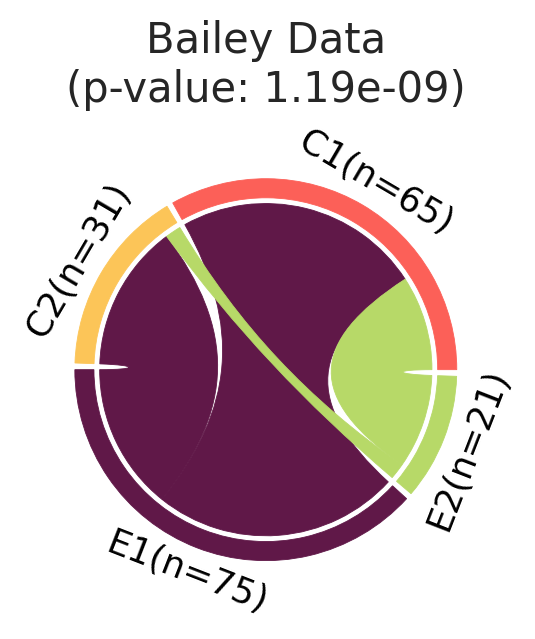

In [47]:
sc.settings.set_figure_params(dpi=100, figsize=(3,5), fontsize=18)
tmp = Bailey_annot.loc[:,['Tumor Subtype','TME Subtype']]
tmp.columns = ['Tumor Type', 'TME Type']
sns.countplot(x="Tumor Type", hue="TME Type", data=tmp, palette='pastel')

ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type']).loc[:,['E2','E1']]    
p = mcnemar(ct_table_ind.values, exact=False).pvalue
p_val="{:.2e}".format(p)
print(ct_table_ind)
print(p)
plt.text(-0.1, 30, 'p-value: {}'.format(p_val), fontsize=15)
plt.title('Bailey Data')
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

from mpl_chord_diagram import chord_diagram
ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type']).loc[:,['E1','E2']] 
matrix = ct_table_ind.values
zeros = np.zeros((4,4))
zeros[:2,2:] = matrix
zeros[2:,:2] = matrix.T
mat = zeros
def ret(df):
    return '{}(n={})'.format(df['Tumor Type'], df['counts'])
c_count = tmp.loc[:,['Tumor Type']].value_counts().to_frame(name='counts')
e_count = tmp.loc[:,['TME Type']].value_counts().to_frame(name='counts')
df_count = pd.concat([c_count,e_count],axis=0).loc[['C1','C2','E1','E2'],:]
df_count = df_count.reset_index(level=[0])
names = list(df_count.apply(ret,axis=1))
chord_diagram(mat,names=names,colors=['#fc6058','#fcc558','#601848','#B7D968'],alpha=1)
plt.title('Bailey Data\n(p-value: {})'.format(p_val),fontsize=15, y=1.1)
plt.show()

In [48]:
mat

array([[ 0.,  0., 47., 18.],
       [ 0.,  0., 28.,  3.],
       [47., 28.,  0.,  0.],
       [18.,  3.,  0.,  0.]])

TME Type    E2   E1
Tumor Type         
C1          32  107
C2           8   28
6.329695245890931e-20


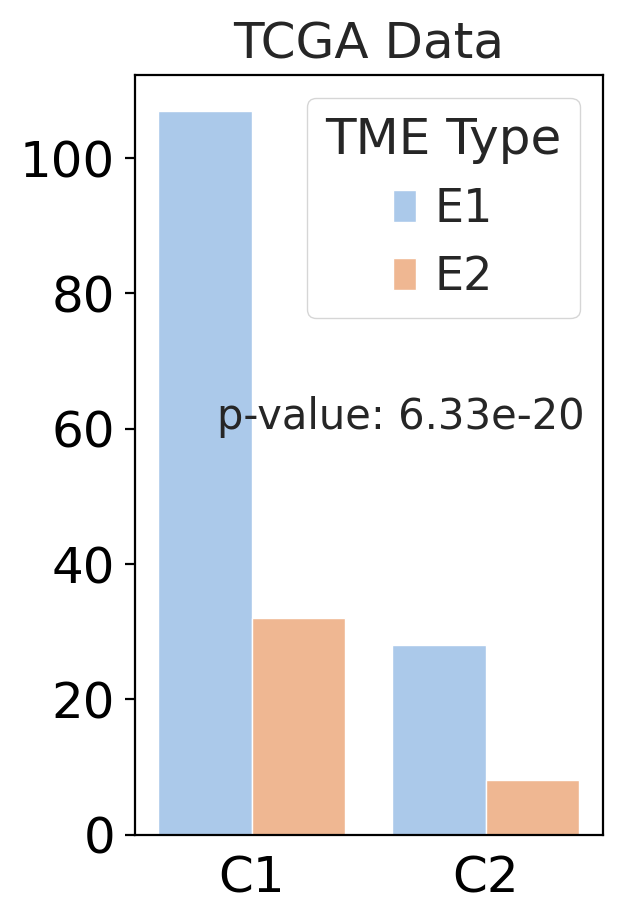

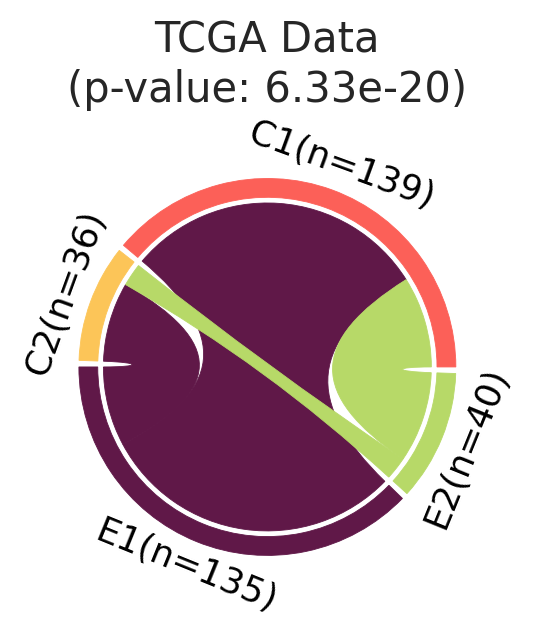

In [213]:
sc.settings.set_figure_params(dpi=100, figsize=(3,5), fontsize=18)
tmp = TCGA_annot.loc[:,['Tumor Subtype','TME Subtype']]
tmp.columns = ['Tumor Type', 'TME Type']
sns.countplot(x="Tumor Type", hue="TME Type", data=tmp, palette='pastel')

ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type']).loc[:,['E2','E1']]    
p = mcnemar(ct_table_ind.values, exact=False).pvalue
p_val="{:.2e}".format(p)
print(ct_table_ind)
print(p)
plt.text(-0.15, 60, 'p-value: {}'.format(p_val), fontsize=15)
plt.title('TCGA Data')
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.show()

from mpl_chord_diagram import chord_diagram
ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type']).loc[:,['E1','E2']] 
matrix = ct_table_ind.values
zeros = np.zeros((4,4))
zeros[:2,2:] = matrix
zeros[2:,:2] = matrix.T
mat = zeros
def ret(df):
    return '{}(n={})'.format(df['Tumor Type'], df['counts'])
c_count = tmp.loc[:,['Tumor Type']].value_counts().to_frame(name='counts')
e_count = tmp.loc[:,['TME Type']].value_counts().to_frame(name='counts')
df_count = pd.concat([c_count,e_count],axis=0).loc[['C1','C2','E1','E2'],:]
df_count = df_count.reset_index(level=[0])
names = list(df_count.apply(ret,axis=1))
chord_diagram(mat,names=names,colors=['#fc6058','#fcc558','#601848','#B7D968'],alpha=1)
plt.title('TCGA Data\n(p-value: {})'.format(p_val),fontsize=15, y=1.1)
plt.show()


In [49]:
matrix

array([[47, 18],
       [28,  3]])

In [52]:
mat

array([[ 0.,  0., 47., 18.],
       [ 0.,  0., 28.,  3.],
       [47., 28.,  0.,  0.],
       [18.,  3.,  0.,  0.]])

In [51]:
tmp
# ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type']).loc[:,['E1','E2']] 
# matrix = ct_table_ind.values
# zeros = np.zeros((4,4))
# zeros[:2,2:] = matrix
# zeros[2:,:2] = matrix.T
# mat = zeros

,Tumor Type,TME Type
icgc_id,,
ICGC_0006,C1,E1
ICGC_0025,C2,E1
ICGC_0026,C2,E1
ICGC_0067,C2,E1
ICGC_0313,C2,E1
...,...,...
ICGC_0507,C1,E2
ICGC_0365,C1,E2
ICGC_0502,C1,E2


In [50]:
mat

array([[ 0.,  0., 47., 18.],
       [ 0.,  0., 28.,  3.],
       [47., 28.,  0.,  0.],
       [18.,  3.,  0.,  0.]])

In [133]:
?chord_diagram

# Tumor/TME Relation (chi-square)

TME Type    E1  E2
Tumor Type        
C1          37  17
C2          34   5
0.06542218679825419


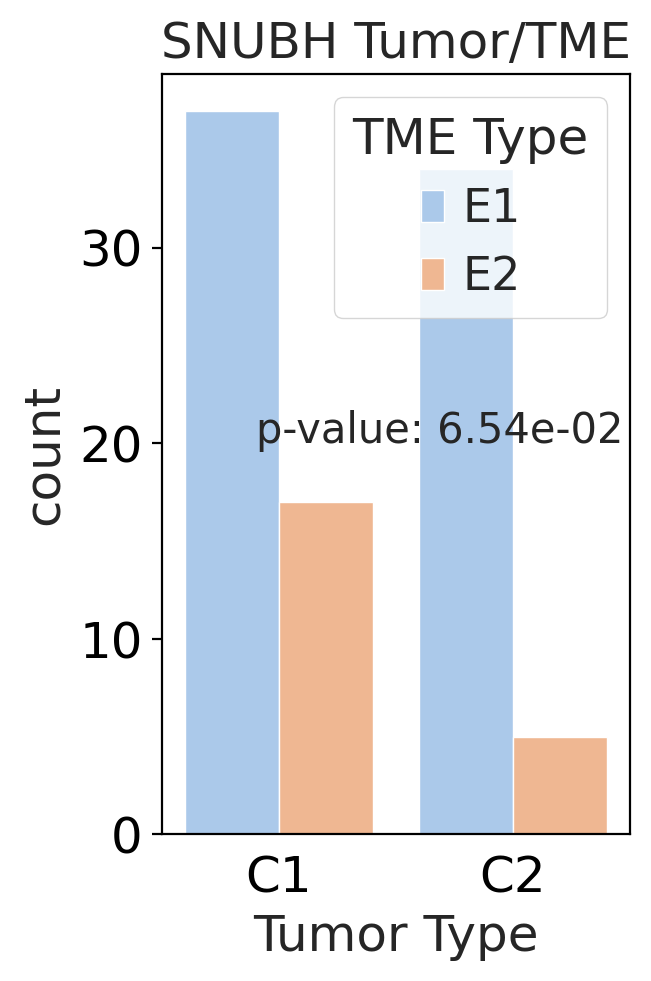

In [423]:
sc.settings.set_figure_params(dpi=100, figsize=(3,5), fontsize=18)
tmp = SNU_annot.loc[:,['Tumor Subtype','TME Subtype']]
tmp.columns = ['Tumor Type', 'TME Type']
sns.countplot(x="Tumor Type", hue="TME Type", data=tmp, palette='pastel')

ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type'])    
chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
p_val="{:.2e}".format(p)
print(ct_table_ind)
print(p)
plt.text(-0.1, 20, 'p-value: {}'.format(p_val), fontsize=15)
plt.title('SNUBH Tumor/TME')
plt.grid(False)
plt.show()


TME Type    E1  E2
Tumor Type        
C1          47  18
C2          28   3
0.08318803833006078


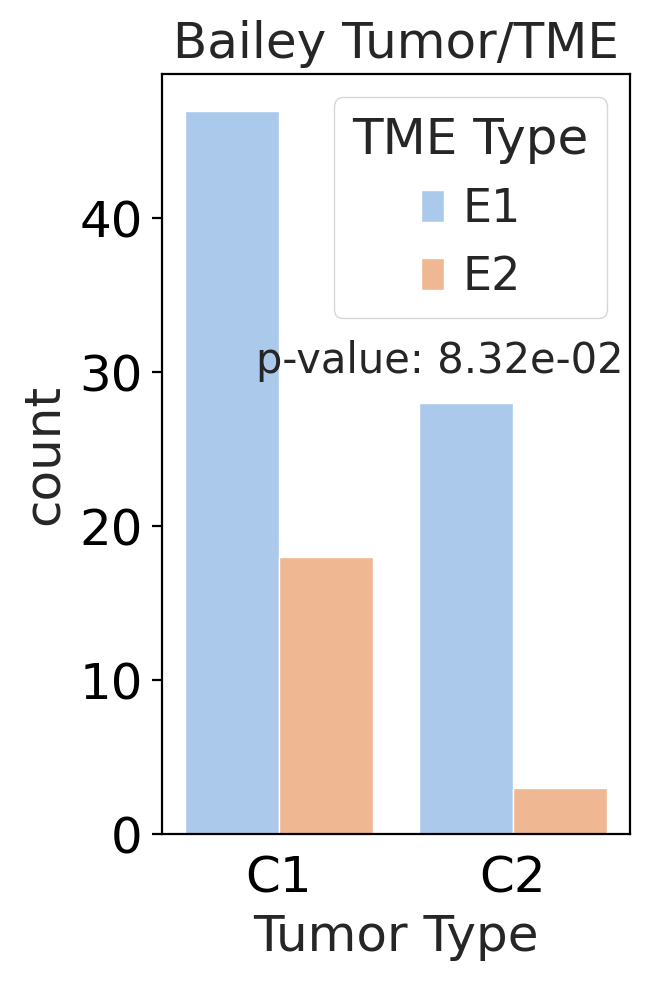

In [424]:
sc.settings.set_figure_params(dpi=100, figsize=(3,5), fontsize=18)
tmp = Bailey_annot.loc[:,['Tumor Subtype','TME Subtype']]
tmp.columns = ['Tumor Type', 'TME Type']
sns.countplot(x="Tumor Type", hue="TME Type", data=tmp, palette='pastel')

ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type'])    
chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
p_val="{:.2e}".format(p)
print(ct_table_ind)
print(p)
plt.text(-0.1, 30, 'p-value: {}'.format(p_val), fontsize=15)
plt.title('Bailey Tumor/TME')
plt.grid(False)
plt.show()


TME Type     E1  E2
Tumor Type         
C1          107  32
C2           28   8
1.0


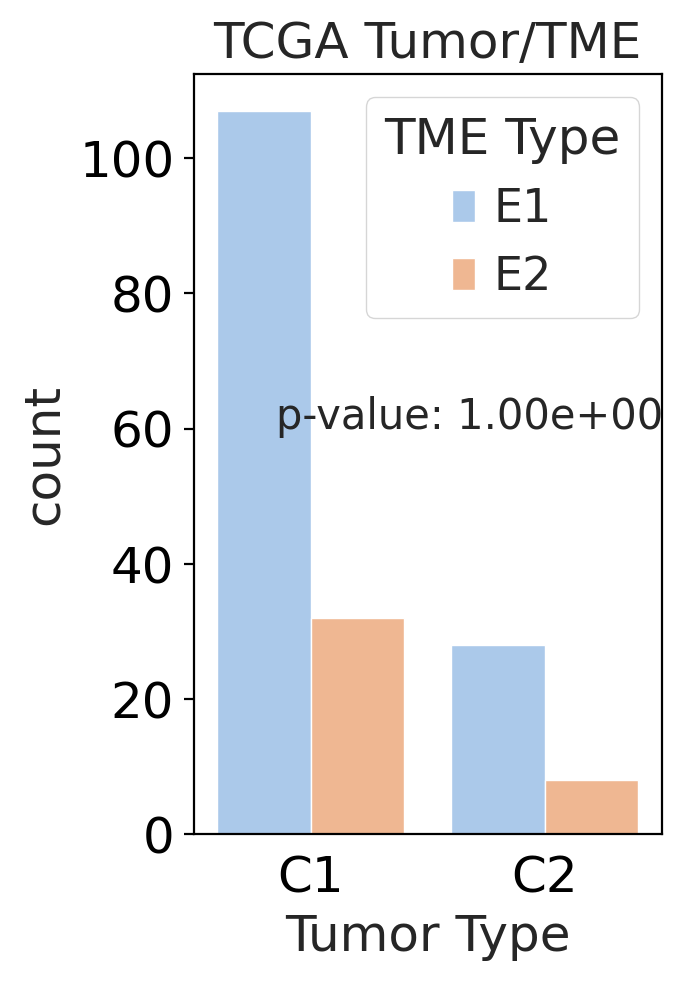

In [425]:
sc.settings.set_figure_params(dpi=100, figsize=(3,5), fontsize=18)
tmp = TCGA_annot.loc[:,['Tumor Subtype','TME Subtype']]
tmp.columns = ['Tumor Type', 'TME Type']
sns.countplot(x="Tumor Type", hue="TME Type", data=tmp, palette='pastel')

ct_table_ind=pd.crosstab(tmp['Tumor Type'],tmp['TME Type'])    
chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
p_val="{:.2e}".format(p)
print(ct_table_ind)
print(p)
plt.text(-0.15, 60, 'p-value: {}'.format(p_val), fontsize=15)
plt.title('TCGA Tumor/TME')
plt.grid(False)
plt.show()


# Tumor/TME subtype ssGSEA

In [613]:
features = list(table_genes['Gene'])

final_lut = dict()
# final_lut['C1-E1']='#3290a8'
# final_lut['C1-E2']='#32a852'
# final_lut['C2-E1']='#a8328e'
# final_lut['C2-E2']='#e04f6e'

final_lut['C1-E1']='#FC3A51'
final_lut['C1-E2']='#036564'
final_lut['C2-E1']='#838689'
final_lut['C2-E2']='#00A8C6'

final_lut['S1']='#FC3A51'
final_lut['S2']='#036564'
final_lut['S3']='#838689'
final_lut['S4']='#00A8C6'


tumor_lut = dict()
tumor_lut['C1']='#fc6058'
tumor_lut['C2']='#fcc558'

tme_lut = dict()
tme_lut['E1']='#5bb6eb'
tme_lut['E2']='#5beba8'

genetype_lut = dict()
genetype_lut['Tumor_Pos']='#93c4f5'
genetype_lut['Tumor_Neg']='#f59393'
genetype_lut['TME_Neg']='#f5c693'

# FFX_lut = dict()
# FFX_lut['non-responder'] = '#b52b0b'
# FFX_lut['NA'] = '#ebe8e8'
# FFX_lut['responder'] = '#2e1dcc'

In [614]:
annotation = SNU_annot.sort_values(by='Final Subtype')
annotation['Bailey_Mixed'] = annotation['Bailey P/S'].astype(str)+'-'+annotation['Bailey A/I'].astype(str)
order = list(annotation.index)

In [715]:
repl_dict = dict()
repl_dict['C1-E1'] = 'S1'
repl_dict['C1-E2'] = 'S2'
repl_dict['C2-E1'] = 'S3'
repl_dict['C2-E2'] = 'S4'

annotation['Final Subtype'] = annotation['Final Subtype'].map(repl_dict)
annotation

,N0,PID,dateA,Snubh_BB,pathology_number,tumorcellularity(pathology),DNA_RNA,methylSeq,metagenomic,liquid_number,...,stage_2,Tumor Subtype,TME Subtype,Moffitt Subtype,Bailey Subtype,Chan-Seng-Yue Subtype,Bailey P/S,Bailey A/I,Final Subtype,Dataset
Snubh_TB,,,,,,,,,,,,,,,,,,,,,
20-T00330_FO-01,sb2441,32644755,2020-05-15,20-B01156_EB-03,S 200019390,25,DNA+RNA,NaN,NaN,R167,...,NaN,C2,E1,BasalLike,Squamous,BasalLike-B,Squamous,Immunogenic,S3,SNUBH
19-T00506_FO-01,sb2302,31662990,2019-09-09,19-B02082_EB-03,S 190043899,10,DNA+RNA,NaN,NaN,R075,...,NaN,C1,E1,BasalLike,Pancreatic Progenitor,Hybrid,Pancreatic Progenitor,Immunogenic,S1,SNUBH
21-T00771_FT-01,NaN,10306990,2021-09-23,NaN,S 210042993,90,RNA,NaN,NaN,NaN,...,NaN,C2,E1,BasalLike,Squamous,Hybrid,Squamous,Immunogenic,S3,SNUBH
19-T00062_FO-01,sb1947,10108754,2019-03-18,19-B00635_EB-03,S 190013089,45,DNA+RNA,NaN,NaN,NaN,...,NaN,C2,E1,BasalLike,ADEX,BasalLike-A,Squamous,ADEX,S3,SNUBH
20-T00814_FT-01,sb2669,33563897,2020-12-16,20-B04522_EB-04,S 200053444,35,DNA+RNA,NaN,NaN,R201,...,NaN,C1,E1,BasalLike,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,ADEX,S1,SNUBH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19-T00201_FO-01,sb2097,24118798,2019-05-27,NaN,S 190025387,75,RNA,NaN,NaN,R017,...,NaN,C2,E2,BasalLike,Squamous,Hybrid,Squamous,Immunogenic,S4,SNUBH
20-T00577_FT-01,sb2582,33167509,2020-09-21,20-B03125_EB-04,S 200039363,60,DNA+RNA,NaN,NaN,NaN,...,NaN,C1,E2,Classical,Pancreatic Progenitor,Classical-A,Pancreatic Progenitor,Immunogenic,S2,SNUBH
18-02904_FO-01,sb1904,30311136,2018-12-19,18-02904_EB-02,S 180058106,35,DNA+RNA,NaN,NaN,NaN,...,NaN,C2,E2,BasalLike,Squamous,Hybrid,Squamous,Immunogenic,S4,SNUBH


In [17]:
files_tumor = ['MSigDB_Hallmark_2020-TumorType-ssGSEA.csv',
         'KEGG_2021_Human-TumorType-ssGSEA.csv',
         'GO_Biological_Process_2021-TumorType-ssGSEA.csv',
         'Reactome_2016-TumorType-ssGSEA.csv',
        ]
files_tme = ['MSigDB_Hallmark_2020-TMEType-ssGSEA.csv',
         'KEGG_2021_Human-TMEType-ssGSEA.csv',
         'GO_Biological_Process_2021-TMEType-ssGSEA.csv',
         'Reactome_2016-TMEType-ssGSEA.csv',
        ]

tumor_df = []
for file in files_tumor:
    df_ = pd.read_csv(file,index_col=0)
    tumor_df.append(df_)
tumor_score=pd.concat(tumor_df,axis=0).T.loc[order,:]


tme_df = []
for file in files_tme:
    df_ = pd.read_csv(file,index_col=0)
    tme_df.append(df_)
tme_score=pd.concat(tme_df,axis=0).T.loc[order,:]


In [18]:
EMT = [
    'epithelial to mesenchymal transition (GO:0001837)',
    'positive regulation of epithelial to mesenchymal transition (GO:0010718)',
    'Epithelial Mesenchymal Transition' 
]

Junction_Org = [
    'Cell-cell junction organization Homo sapiens R-HSA-421270',
    'Cell junction organization Homo sapiens R-HSA-446728',
]

TGFB = [
    'TGF-beta Signaling'
]

Angiogenesis = [
    'positive regulation of blood vessel endothelial cell migration (GO:0043536)',
    'Signaling by VEGF Homo sapiens R-HSA-194138',
    'VEGFA-VEGFR2 Pathway Homo sapiens R-HSA-4420097',
    'VEGF signaling pathway',
]


# WNT = [
#     'non-canonical Wnt signaling pathway (GO:0035567)',
#     'Beta-catenin independent WNT signaling Homo sapiens R-HSA-3858494',
#     'Signaling by WNT in cancer Homo sapiens R-HSA-4791275',
# ]
scaler = StandardScaler()
tumor = pd.DataFrame(scaler.fit_transform(tumor_score), columns=tumor_score.columns, index=tumor_score.index).T
Tumor_Features = EMT+Junction_Org+TGFB+Angiogenesis
tumor = tumor.loc[Tumor_Features,:]

Treg = [
    'negative regulation of T cell activation (GO:0050868)',
    'negative regulation of T cell proliferation (GO:0042130)',
    'IL-2/STAT5 Signaling'
]

PDL1 = [
    'PD-1 signaling Homo sapiens R-HSA-389948',
    'PD-L1 expression and PD-1 checkpoint pathway in cancer'  
]
cellcycle = [
    'E2F Targets',
    'Mitotic G1-G1/S phases Homo sapiens R-HSA-453279',
    'G1/S Transition Homo sapiens R-HSA-69206',
    'G2-M Checkpoint'
]
neutrophil = [
    'neutrophil mediated immunity (GO:0002446)',
    'neutrophil degranulation (GO:0043312)',
    'neutrophil activation involved in immune response (GO:0002283)',
    'Neutrophil extracellular trap formation',
]



#df_tme_score.loc[Innate_Immune,:].sort_values(by='scores',ascending=False)

tme = pd.DataFrame(scaler.fit_transform(tme_score), columns=tme_score.columns, index=tme_score.index).T
TME_Features = Treg+PDL1+cellcycle+neutrophil
tme = tme.loc[TME_Features,:]

ssGSEA = pd.concat([tumor,tme],axis=0)
ssGSEA


tumor_sig = ['EMT']*len(EMT)
tumor_sig = tumor_sig+['Cell junction organization']*len(Junction_Org)
tumor_sig = tumor_sig+['TGF-beta']*len(TGFB)
tumor_sig = tumor_sig+['Angiogenesis']*len(Angiogenesis)


tme_sig = ['Treg']*len(Treg)
tme_sig = tme_sig+['Immune Checkpoint']*len(PDL1)
tme_sig = tme_sig+['Cellcycle']*len(cellcycle)
tme_sig = tme_sig+['Neutrophil']*len(neutrophil)

signatures = tumor_sig+tme_sig

tumor_len = len(Tumor_Features)
tme_len = len(TME_Features)

sig_df = pd.DataFrame(signatures,columns=['Signature'])
sig_int_map = dict(zip(sig_df['Signature'].unique(),range(sig_df['Signature'].nunique())))
sigtype = sig_df['Signature'].map(sig_int_map).to_frame('Signature')
sig_color = mcp.gen_color(cmap="Spectral",n=sig_df['Signature'].nunique())
sigtype_lut = dict(zip(sig_df['Signature'].unique(), sig_color))



tumor_sigtype = sigtype.iloc[:tumor_len,:]
tumor_lut = { key: sigtype_lut[key] for key in sorted(set(tumor_sig), key=tumor_sig.index) }
tme_sigtype = sigtype.iloc[tumor_len:,:]
tme_lut = { key: sigtype_lut[key] for key in sorted(set(tme_sig), key=tme_sig.index) }


import textwrap
def idx_rename(x):
    if x.find('GO') != -1 or x.find('R-HSA') != -1:
        x_parse = x.split(' ')
        ret =  ' '.join(x_parse[:-1])
        ret = textwrap.fill(ret, 40)
        return ret
    else:
        ret = textwrap.fill(x, 40)
        return ret
    
    
        
ssGSEA.index = ssGSEA.index.map(idx_rename)

tumor.index = tumor.index.map(idx_rename)
tme.index = tme.index.map(idx_rename)

In [20]:
tumor.to_csv('Sample_csv.csv')

In [702]:
tumor_lut

{'EMT': '#9e0142',
 'Cell junction organization': '#e2514a',
 'TGF-beta': '#fca55d',
 'Angiogenesis': '#fee999'}

In [703]:
tme_lut

{'Treg': '#edf8a3',
 'Immune Checkpoint': '#a2d9a4',
 'Cellcycle': '#47a0b3',
 'Neutrophil': '#5e4fa2'}

In [705]:
fig = plt.figure(figsize=(25, 30), dpi= 150)
widths = [1,25]
heights = [1,22,22]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.08, wspace=0.01, width_ratios=widths, height_ratios=heights)


final_int_map = dict(zip(annotation['Final Subtype'].unique(),range(annotation['Final Subtype'].nunique())))
final = annotation['Final Subtype'].map(final_int_map).to_frame('Final Subtype').T.astype(float)
ax = fig.add_subplot(gs[0, 1])
sns.heatmap(final, cmap=list(final_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=final_lut[name]) for name in final_lut]
ax_legend = ax.legend(handles, final_lut, bbox_to_anchor=(1.25, 1.55),
                              fontsize=30, markerscale=2, frameon=False, ncol=2)
#ax_legend.set_title('Subtype',prop={'size':25})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels([])
#ax.set_ylabel('Subtype',fontdict={'fontsize':25,'weight':'bold'})
ax.margins(0)


plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = False



ax = fig.add_subplot(gs[1, 0])
sns.heatmap(tumor_sigtype, cmap=list(tumor_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=tumor_lut[name]) for name in tumor_lut]
ax_legend = ax.legend(handles, tumor_lut, bbox_to_anchor=(24, -1.05), frameon=False, 
                              fontsize=35, markerscale=3, ncol=4)

ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_ylabel('Tumor Signatures ',fontdict={'fontsize':30,'weight':'bold'})
ax.margins(0)

cbar_ax = fig.add_axes([1, 0.1, 0.02, 0.03], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)

ax = fig.add_subplot(gs[1, 1])
sns.heatmap(tumor, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
#ax.set_xlabel('Patients', fontsize=20, fontdict=dict(weight='bold'))
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=30)
ax.set_title('ssGSEA (adjusted p-value < 1e-5)',fontdict={'fontsize':30,'weight':'bold'})


ax = fig.add_subplot(gs[2, 0])
sns.heatmap(tme_sigtype, cmap=list(tme_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=tme_lut[name]) for name in tme_lut]
ax_legend = ax.legend(handles, tme_lut, bbox_to_anchor=(21.2, -0.08), frameon=False, 
                              fontsize=35, markerscale=3, ncol=4)

ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_ylabel('TME Signatures ',fontdict={'fontsize':30,'weight':'bold'})
ax.margins(0)


ax = fig.add_subplot(gs[2, 1])
sns.heatmap(tme, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_xticks([])
#ax.set_xlabel('Patients', fontsize=20, fontdict=dict(weight='bold'))
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=30)
ax.set_title('ssGSEA (adjusted p-value < 1e-5)',fontdict={'fontsize':30,'weight':'bold'})
plt.show()

plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

In [821]:
tumor_score_df = tumor_score.loc[:,Tumor_Features].T
tme_score_df = tme_score.loc[:,TME_Features].T
ssScore = pd.concat([tumor_score_df,tme_score_df],axis=0)
ssScore['Type'] = signatures
groupby_score = ssScore.groupby('Type').sum().T
groupby_score
groupby_score = pd.concat([groupby_score, annotation.loc[:,['Tumor Subtype', 'TME Subtype', 'Final Subtype']]], axis=1)
groupby_score

# groupby_score['Final Subtype'] = groupby_score['Final Subtype'].map(repl_dict)
# groupby_score

,Angiogenesis,Cell junction organization,Cellcycle,EMT,Immune Checkpoint,Neutrophil,TGF-beta,Treg,Tumor Subtype,TME Subtype,Final Subtype
20-T00330_FO-01,0.975715,0.470766,-0.063573,0.400547,0.298173,1.105878,0.431211,-0.018728,C2,E1,S3
19-T00506_FO-01,0.869546,0.575728,0.681702,0.393088,0.096213,1.004615,0.455894,0.107624,C1,E1,S1
21-T00771_FT-01,1.025431,0.469573,0.022103,0.700428,0.432358,1.518848,0.463301,0.132937,C2,E1,S3
19-T00062_FO-01,0.986307,0.456448,-0.145067,0.735033,0.350619,0.907100,0.492936,-0.174526,C2,E1,S3
20-T00814_FT-01,0.762381,0.640284,0.719465,0.242294,0.163321,0.719507,0.344962,-0.039870,C1,E1,S1
...,...,...,...,...,...,...,...,...,...,...,...
19-T00201_FO-01,0.862123,0.628971,1.344124,0.348381,-0.046155,0.375999,0.474643,-0.300879,C2,E2,S4
20-T00577_FT-01,0.703494,0.696020,0.653631,0.342532,0.025705,0.449327,0.447418,-0.306840,C1,E2,S2
18-02904_FO-01,0.893225,0.527349,1.025095,0.224404,0.100653,0.538972,0.427719,-0.326552,C2,E2,S4
18-02165_FO-01,0.737486,0.542846,0.883480,0.105958,0.117320,0.603143,0.340931,-0.181409,C1,E2,S2


In [57]:
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram',custom_color=None):
    # maximum of 6 value cols -> 6 colors
    colorPalette=mcp.gen_color(cmap="Spectral",n=len(cat_cols))
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
    
    if not custom_color:
        # remove duplicates from labelList
        labelList = list(dict.fromkeys(labelList))
        # define colors based on number of levels
        colorList = []
        for idx, colorNum in enumerate(colorNumList):
            colorList = colorList + [colorPalette[idx]]*colorNum         
    else:
        labelList = list(custom_color.keys())
        colorList = list(custom_color.values())
        
        
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    print(sourceTargetDf)
    
    link_color = ['#f0465b', '#036564', '#838689', '#00A8C6']
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count'],
          color = link_color
#           color = [
#                 px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)]
#                 for i in sourceTargetDf["sourceID"]
#             ],
                        
        )
      )
    
    layout =  dict(
        title = title,
        width=450,
        height=400,
        font = dict(
          size = 25
        )
        
    )
    
    fig = dict(data=[data], layout=layout)
    #print(data)  
    return fig

In [59]:
annotation

,N0,PID,dateA,Snubh_BB,pathology_number,tumorcellularity(pathology),DNA_RNA,methylSeq,metagenomic,liquid_number,...,Tumor Subtype,TME Subtype,Moffitt Subtype,Bailey Subtype,Chan-Seng-Yue Subtype,Bailey P/S,Bailey A/I,Final Subtype,Dataset,Putiry(ESTIMATE)
Snubh_TB,,,,,,,,,,,,,,,,,,,,,
20-T00330_FO-01,sb2441,32644755,2020-05-15,20-B01156_EB-03,S 200019390,25.0,DNA+RNA,NaN,NaN,R167,...,C2,E1,BasalLike,Squamous,BasalLike-B,Squamous,Immunogenic,C2-E1,SNUBH,0.727549
21-T00771_FT-01,NaN,10306990,2021-09-23,NaN,S 210042993,90.0,RNA,NaN,NaN,NaN,...,C2,E1,BasalLike,Squamous,Hybrid,Squamous,Immunogenic,C2-E1,SNUBH,0.557090
19-T00062_FO-01,sb1947,10108754,2019-03-18,19-B00635_EB-03,S 190013089,45.0,DNA+RNA,NaN,NaN,NaN,...,C2,E1,BasalLike,ADEX,BasalLike-A,Squamous,ADEX,C2-E1,SNUBH,0.588025
20-T00814_FT-01,sb2669,33563897,2020-12-16,20-B04522_EB-04,S 200053444,35.0,DNA+RNA,NaN,NaN,R201,...,C1,E1,BasalLike,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,ADEX,C1-E1,SNUBH,0.872663
19-T00505_FO-01,sb2298,31651231,2019-09-09,19-B02081_EB-03,S 190043830,50.0,DNA+RNA,NaN,NaN,R074,...,C1,E1,Classical,Pancreatic Progenitor,Hybrid,Pancreatic Progenitor,ADEX,C1-E1,SNUBH,0.845801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19-T00413_FO-01,sb2283,31464792,2019-08-06,19-B01826_EB-03,S 190038136,20.0,DNA+RNA,NaN,NaN,NaN,...,C1,E2,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,C1-E2,SNUBH,0.933126
21-T00311_FT-01,NaN,14190995,2021-04-14,21-B01495_EB-04,S 210016772,60.0,DNA+RNA,NaN,NaN,NaN,...,C1,E2,Classical,ADEX,Classical-A,Pancreatic Progenitor,Immunogenic,C1-E2,SNUBH,0.998309
19-T00050_FO-01,sb2166,30644780,2019-03-06,19-B00543_EB-03,S 190011159,70.0,DNA+RNA,NaN,NaN,NaN,...,C1,E2,Classical,Immunogenic,Classical-A,Pancreatic Progenitor,Immunogenic,C1-E2,SNUBH,0.954908


  source target  count sourceID targetID
0     C1     E1     37        0        2
1     C1     E2     17        0        3
2     C2     E1     34        1        2
3     C2     E2      5        1        3


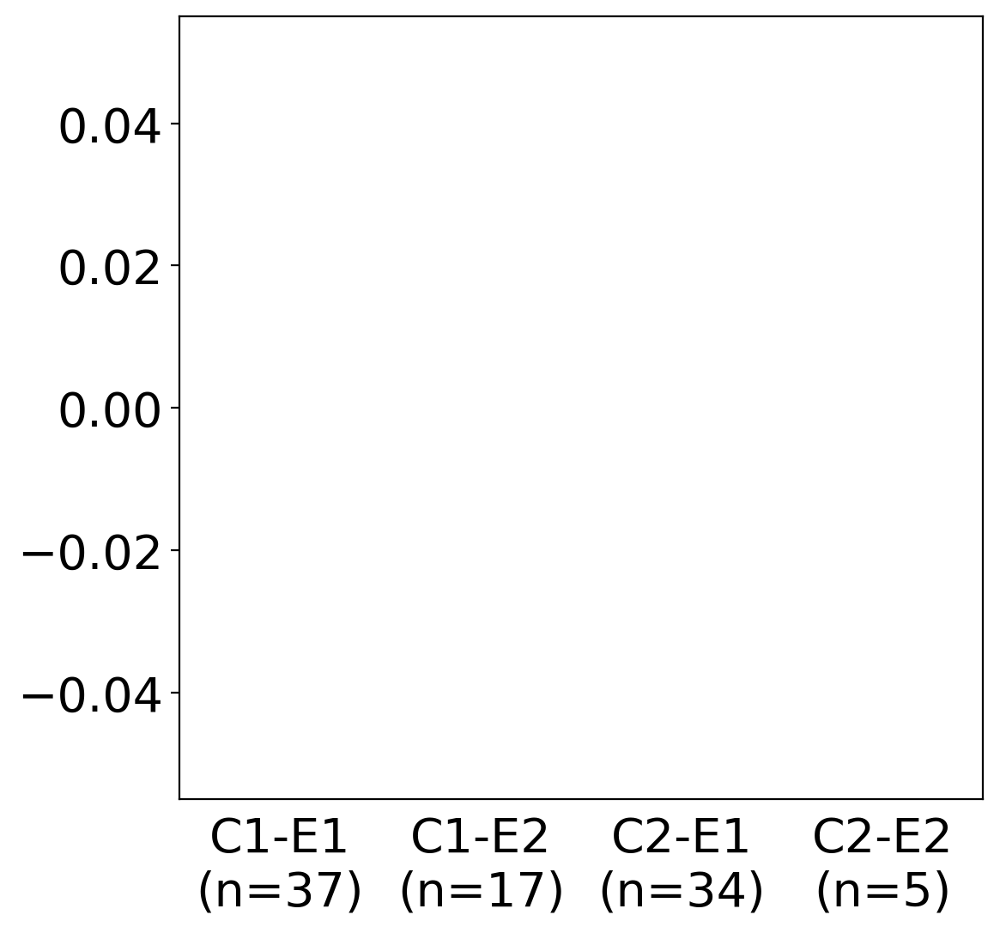

In [61]:
category = ['Tumor Subtype','TME Subtype','Final Subtype']
category = ['Tumor Subtype','TME Subtype']
to_sankey = annotation.groupby(category).size().reset_index(name='counts')
to_sankey
sankey_col = dict()
sankey_col['C1']='#fc6058'
sankey_col['C2']='#fcc558'
sankey_col['E1']='#5bb6eb'
sankey_col['E2']='#5beba8'





fig = genSankey(to_sankey,cat_cols=category,value_cols='counts',title='',custom_color=sankey_col)
iplot(fig, validate=False)

sc.settings.set_figure_params(dpi=100, figsize=(6,6), fontsize=20)

sankey_col['S1']='#FC3A51'
sankey_col['S2']='#036564'
sankey_col['S3']='#838689'
sankey_col['S4']='#00A8C6'

tmp=annotation['Final Subtype'].value_counts().to_frame(name='counts').sort_index()

xticks = [val+'\n(n={})'.format(tmp.loc[val,'counts']) for val in tmp.index]
xticks
ax=sns.countplot(data=annotation, x="Final Subtype",palette=sankey_col, order=['S1','S2','S3','S4'])
ax.set_ylabel('')
ax.set_xlabel('')
ax.set_xticklabels(xticks)
plt.grid(False)
plt.show()

In [60]:
to_sankey

,Tumor Subtype,TME Subtype,counts
0,C1,E1,37
1,C1,E2,17
2,C2,E1,34
3,C2,E2,5


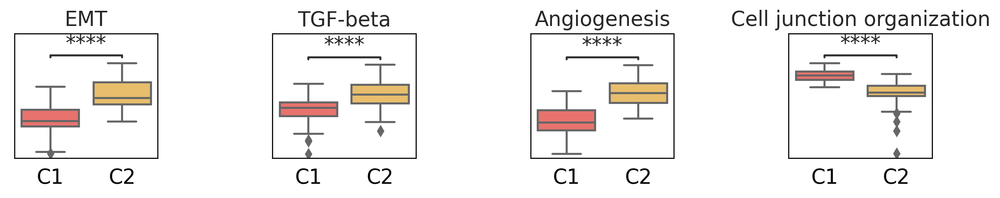

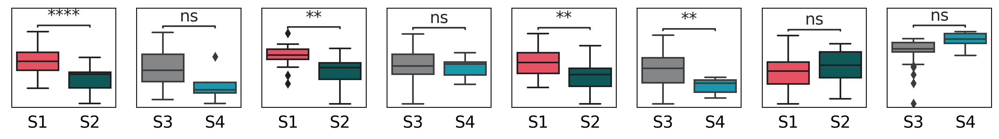

In [905]:
import seaborn as sns
from statannot import add_stat_annotation
sc.settings.set_figure_params(dpi=100, figsize=(6,5), fontsize=15)
#?add_stat_annotation
tumor_sig = ['EMT','TGF-beta','Angiogenesis','Cell junction organization']

fig = plt.figure(figsize=(12, 4), dpi= 100)
widths = [1,1,1,1]
heights = [1,1]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.4, wspace=0.8, width_ratios=widths, height_ratios=heights)

i=0
j=0
for sigtype in tumor_sig:
    ax = fig.add_subplot(gs[j, i])
    x = "Tumor Subtype"
    y = sigtype
    order = ['C1', 'C2']
    title='{}'.format(sigtype)
    ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, ax=ax, palette=['#fc6058', '#fcc558'])
    ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    ax.set_title(title)
    test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order,
                                       box_pairs=[('C1', 'C2')],
                                       test='t-test_welch', text_format='star', comparisons_correction=None,
                                       loc='inside', verbose=0)
    
    if i < len(widths)-1:
        i+=1
    else:
        j+=1
        i=0
    
plt.show()        

fig = plt.figure(figsize=(16, 4), dpi= 100)
widths = [1,1,1,1,1,1,1,1]
heights = [1,1]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.4, wspace=0.2, width_ratios=widths, height_ratios=heights)

i=0
j=0
for sigtype in tumor_sig:
    ax = fig.add_subplot(gs[j, i])
    x = "Final Subtype"
    y = sigtype
    order = ['S1', 'S2']
    title='{}'.format(sigtype)
    ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, ax=ax, palette=['#FC3A51', '#036564'])
    ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    #ax.set_title(title)
    test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order,
                                       box_pairs=[('S1', 'S2')],
                                       test='t-test_welch', text_format='star', comparisons_correction=None,
                                       loc='inside', verbose=0)
    
    i+=1
    ax = fig.add_subplot(gs[j, i])
    order = ['S3', 'S4']
    title='{}'.format(sigtype)
    ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, ax=ax, palette=['#838689', '#00A8C6'])
    ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    #ax.set_title(title)
    test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order,
                                       box_pairs=[('S3', 'S4')],
                                       test='t-test_welch', text_format='star', comparisons_correction=None,
                                       loc='inside', verbose=0)
    
    if i < len(widths)-1:
        i+=1
    else:
        j+=1
        i=0
    
plt.show()        
        
    


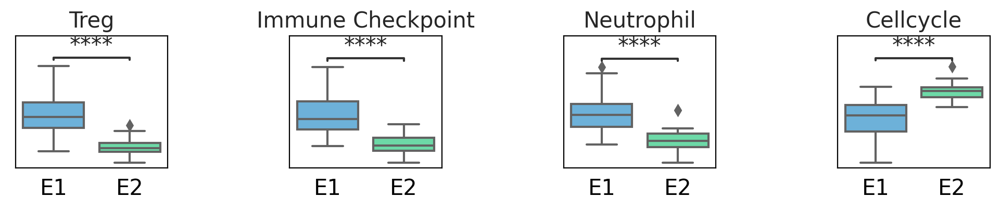

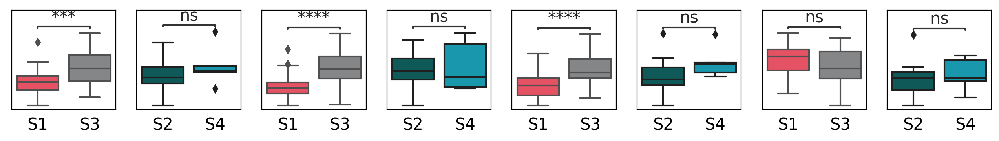

In [908]:
tme_sig = ['Treg','Immune Checkpoint','Neutrophil','Cellcycle']

fig = plt.figure(figsize=(12, 4), dpi= 100)
widths = [1,1,1,1]
heights = [1,1]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.4, wspace=0.8, width_ratios=widths, height_ratios=heights)

i=0
j=0
for sigtype in tme_sig:
    ax = fig.add_subplot(gs[j, i])
    x = "TME Subtype"
    y = sigtype
    order = ['E1', 'E2']
    title='{}'.format(sigtype)
    ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, ax=ax, palette=['#5bb6eb', '#5beba8'])
    ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    ax.set_title(title)
    test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order,
                                       box_pairs=[('E1', 'E2')],
                                       test='t-test_welch', text_format='star', comparisons_correction=None,
                                       loc='inside', verbose=0)
    
    if i < len(widths)-1:
        i+=1
    else:
        j+=1
        i=0
    
plt.show()        

fig = plt.figure(figsize=(16, 4), dpi= 100)
widths = [1,1,1,1,1,1,1,1]
heights = [1,1]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.4, wspace=0.2, width_ratios=widths, height_ratios=heights)

i=0
j=0
for sigtype in tme_sig:
    ax = fig.add_subplot(gs[j, i])
    x = "Final Subtype"
    y = sigtype
    order = ['S1', 'S3']
    title='{}'.format(sigtype)
    ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, ax=ax, palette=['#FC3A51', '#838689'])
    ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    #ax.set_title(title)
    test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order,
                                       box_pairs=[('S1', 'S3')],
                                       test='t-test_welch', text_format='star', comparisons_correction=None,
                                       loc='inside', verbose=0)
    
    i+=1
    ax = fig.add_subplot(gs[j, i])
    order = ['S2', 'S4']
    title='{}'.format(sigtype)
    ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, ax=ax, palette=['#036564', '#00A8C6'])
    ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    #ax.set_title(title)
    test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order,
                                       box_pairs=[('S2', 'S4')],
                                       test='t-test_welch', text_format='star', comparisons_correction=None,
                                       loc='inside', verbose=0)
    
    if i < len(widths)-1:
        i+=1
    else:
        j+=1
        i=0
    
plt.show()       

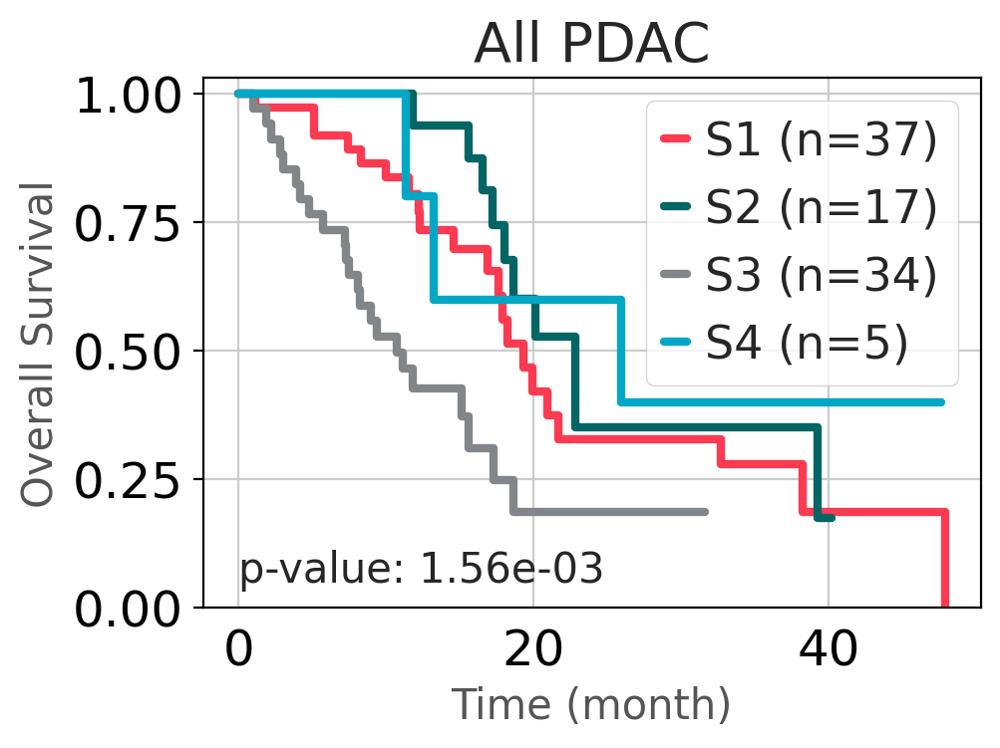

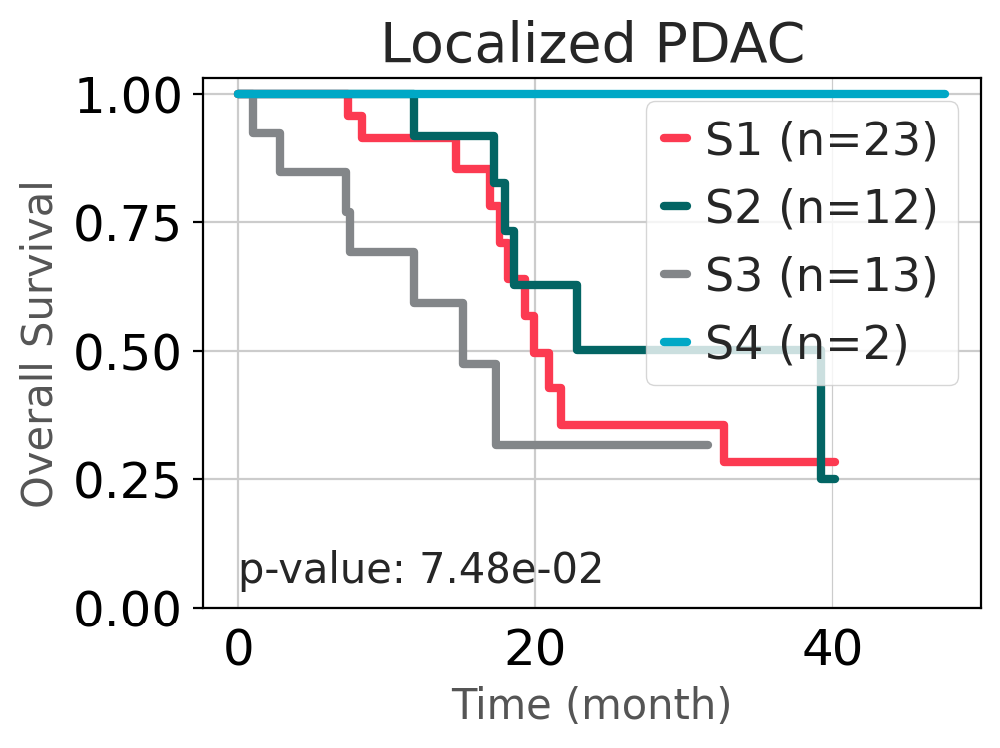

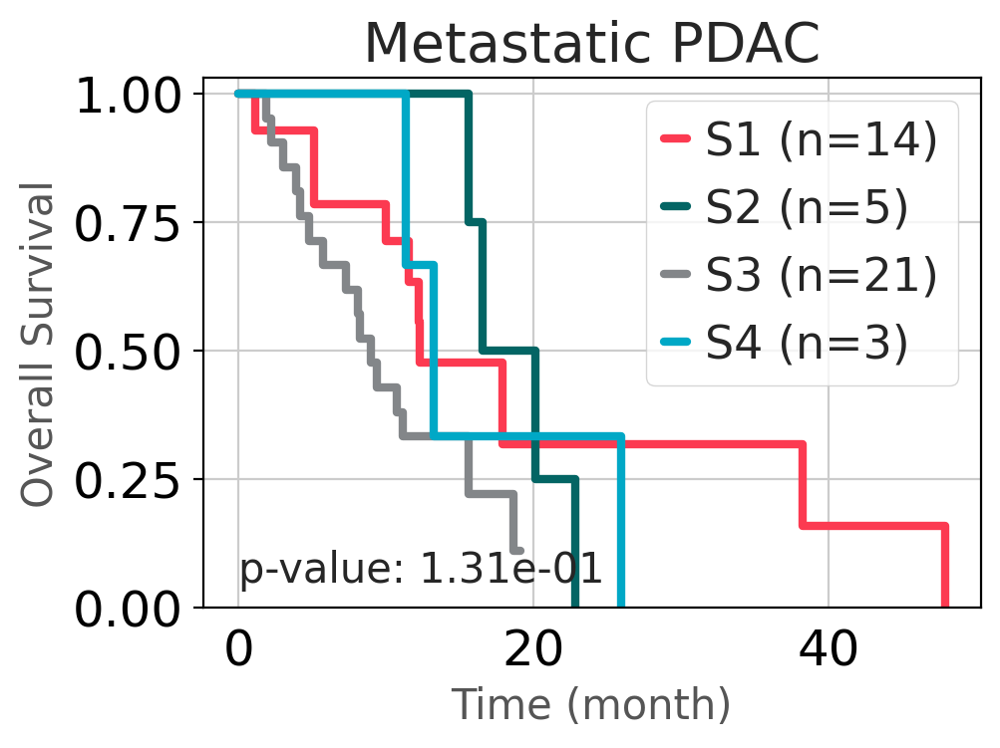

'1.31e-01'

In [912]:
color = ['#FC3A51', '#036564', '#838689', '#00A8C6']

m = annotation['stage_C'] == 'Localized'
annotation_L = annotation[m]
annotation_M = annotation[~m]
order=['S1', 'S2', 'S3', 'S4']
sc.settings.set_figure_params(dpi=100, figsize=(5,3.5), fontsize=18)
km_plot(df_info=annotation, category='Final Subtype', os='OS_F', event='OS_event', title='All PDAC', order=order, color=color)
sc.settings.set_figure_params(dpi=100, figsize=(5,3.5), fontsize=18)
km_plot(df_info=annotation_L, category='Final Subtype', os='OS_F', event='OS_event', title='Localized PDAC', order=order, color=color)
km_plot(df_info=annotation_M, category='Final Subtype', os='OS_F', event='OS_event', title='Metastatic PDAC', order=order, color=color)


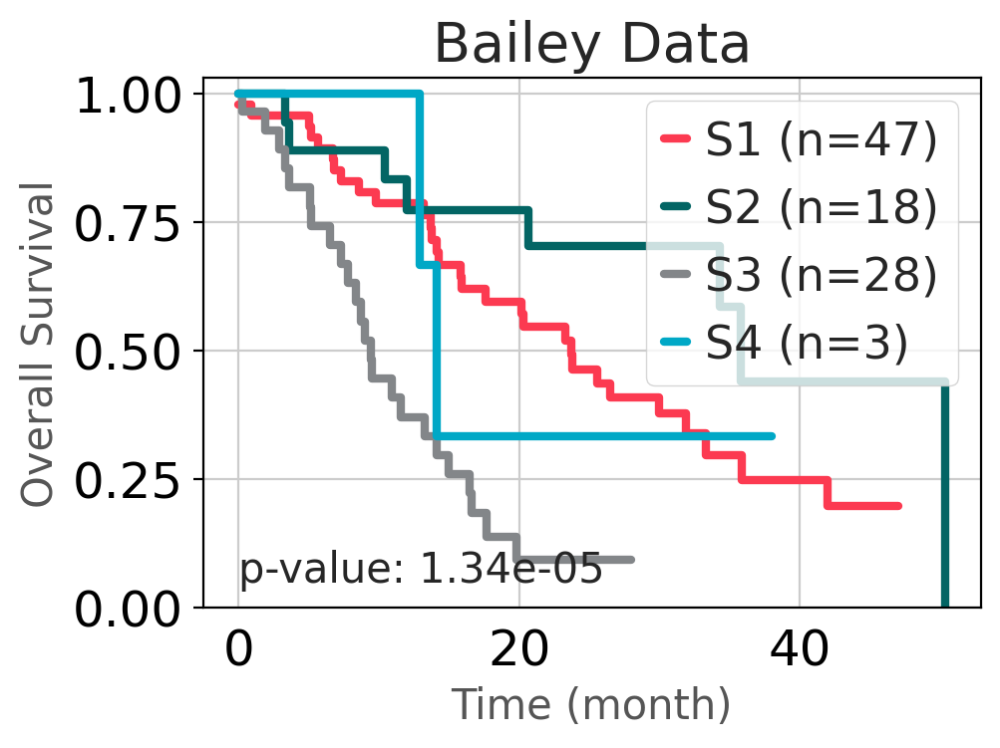

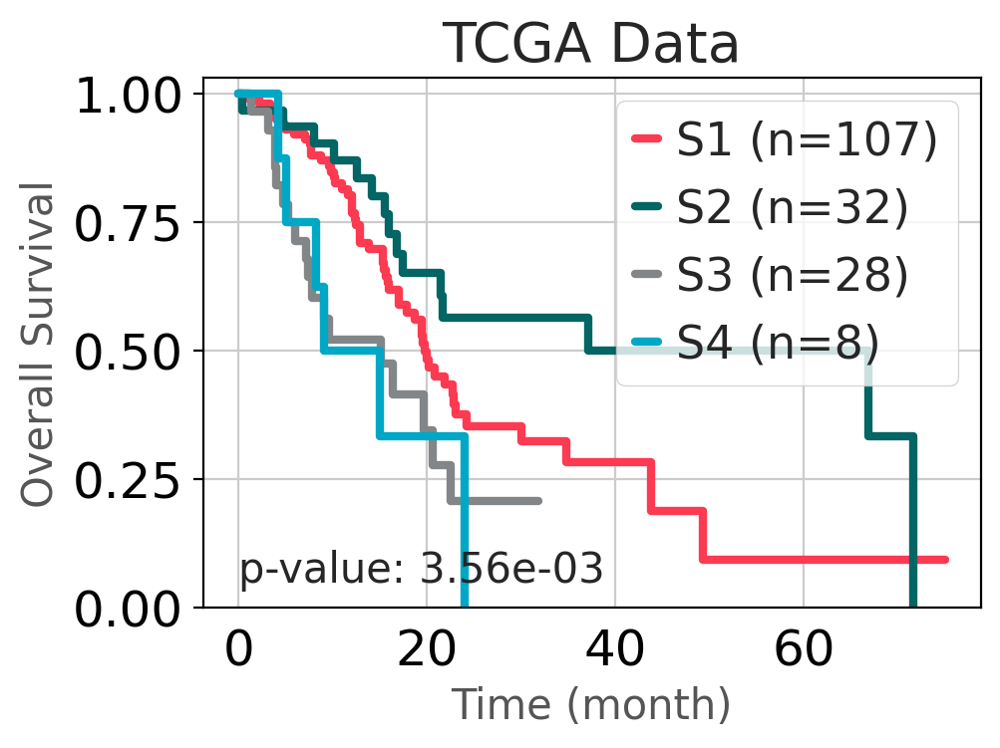

'3.56e-03'

In [913]:
sc.settings.set_figure_params(dpi=100, figsize=(5,3.5), fontsize=18)
color = ['#FC3A51', '#036564', '#838689', '#00A8C6']
order=['S1', 'S2', 'S3', 'S4']
Bailey_annot = Bailey_adata.obs.copy()
Bailey_annot['Final Subtype'] = Bailey_annot['Final Subtype'].map(repl_dict)
km_plot(df_info=Bailey_annot, category='Final Subtype', os='OS_F', event='OS_event', title='Bailey Data', order=order, color=color)

TCGA_annot = TCGA_adata.obs.copy()
TCGA_annot['Final Subtype'] = TCGA_annot['Final Subtype'].map(repl_dict)
km_plot(df_info=TCGA_annot, category='Final Subtype', os='OS_F', event='OS_event', title='TCGA Data', order=order, color=color)

In [ ]:
sc.settings.set_figure_params(dpi=100, figsize=(5,2.5), fontsize=15)
color = ['#FC3A51', '#036564', '#838689', '#00A8C6']
order=['S1', 'S2', 'S3', 'S4']


In [838]:
# tme_sig = ['Treg','Immune Checkpoint','Neutrophil','Cellcycle']

# fig = plt.figure(figsize=(18, 8), dpi= 150)
# widths = [1,1,1,1]
# heights = [1,1]
# gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.4, wspace=0.2, width_ratios=widths, height_ratios=heights)



# i=0
# j=0

# for sigtype in tme_sig:
#     ax = fig.add_subplot(gs[j, i])
    
#     x = "Final Subtype"
#     y = sigtype
#     order = ['S1', 'S2', 'S3', 'S4']
#     title='{}'.format(sigtype)
#     ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, palette=list(final_lut.values()),ax=ax)
#     ax.set_yticks([])
#     ax.set_ylabel('')
#     ax.set_xlabel('')
#     ax.set_title(title)
    
#     test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order, 
#                                        box_pairs=[('S1', 'S3'), ('S2', 'S4')],
#                                        test='t-test_welch', text_format='simple', comparisons_correction=None,
#                                        loc='inside', verbose=0)
#     if i < len(widths)-1:
#         i+=1
#     else:
#         j+=1
#         i=0
    
# plt.show()

# Bailey Pancreatic Progenitor and Tumor C1

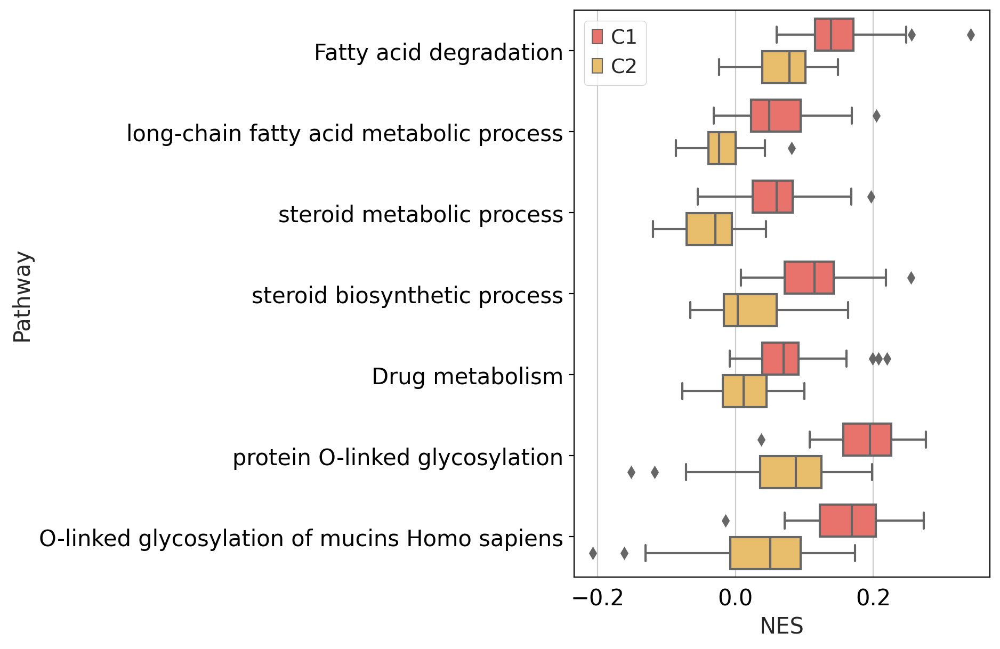

In [630]:
def idx_rename(x):
    if x.find('GO') != -1 or x.find('R-HSA') != -1:
        x_parse = x.split(' ')
        ret =  ' '.join(x_parse[:-1])
        ret = textwrap.fill(ret, 60)
        return ret
    else:
        ret = textwrap.fill(x, 60)
        return ret



FattyAcid = [
    'Fatty acid degradation',
    'long-chain fatty acid metabolic process (GO:0001676)',
]

Steroid = [
    'steroid metabolic process (GO:0008202)',
    'steroid biosynthetic process (GO:0006694)',
]

Drug = [
    'Drug metabolism'
]

Glycosylation = [
    'protein O-linked glycosylation (GO:0006493)',
    'O-linked glycosylation of mucins Homo sapiens R-HSA-913709',
]


# WNT = [
#     'non-canonical Wnt signaling pathway (GO:0035567)',
#     'Beta-catenin independent WNT signaling Homo sapiens R-HSA-3858494',
#     'Signaling by WNT in cancer Homo sapiens R-HSA-4791275',
# ]
scaler = StandardScaler()
tumor = pd.DataFrame(scaler.fit_transform(tumor_score), columns=tumor_score.columns, index=tumor_score.index).T
pp_features = FattyAcid+Steroid+Drug+Glycosylation
tumor_score_df = tumor_score.loc[:,pp_features].T
tumor_score_df.index = tumor_score_df.index.map(idx_rename)
tumor_score_df


groupby_score = tumor_score_df.copy().T
groupby_score = pd.concat([groupby_score, annotation.loc[:,['Tumor Subtype']]], axis=1)
groupby_score

tumor.index = tumor.index.map(idx_rename)


labels = list(groupby_score.columns[:-1])
df_td = pd.melt(groupby_score, id_vars='Tumor Subtype', 
        value_vars=list(groupby_score.columns[:-1]), var_name='Pathway', value_name='NES')

fig = plt.figure(figsize=(5, 7), dpi= 100)
ax = sns.boxplot(data=df_td, y='Pathway', x='NES', hue='Tumor Subtype', order=labels, palette=['#fc6058', '#fcc558'])
#ax.set_xticklabels(labels, rotation=275)
plt.legend()
#plt.title('Bailey Pancreatic Progenitor Features')
plt.show()


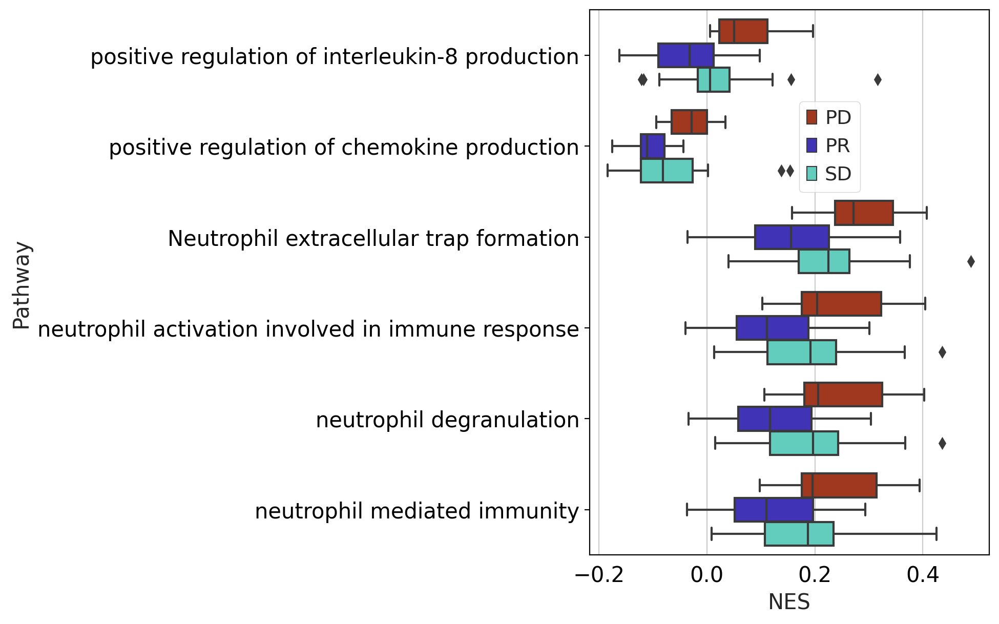

In [664]:
def idx_rename(x):
    if x.find('GO') != -1 or x.find('R-HSA') != -1:
        x_parse = x.split(' ')
        ret =  ' '.join(x_parse[:-1])
        ret = textwrap.fill(ret, 60)
        return ret
    else:
        ret = textwrap.fill(x, 60)
        return ret

FFX_Features = [
    'positive regulation of interleukin-8 production (GO:0032757)',
    'positive regulation of chemokine production (GO:0032722)',
    'Neutrophil extracellular trap formation',
    'neutrophil activation involved in immune response (GO:0002283)',
    'neutrophil degranulation (GO:0043312)',
    'neutrophil mediated immunity (GO:0002446)',
]


FFX_ssScore_df = tme_score.loc[:,FFX_Features]
FFX_ssScore_df.columns = FFX_ssScore_df.columns.map(idx_rename)
groupby_score = pd.concat([FFX_ssScore_df, annotation.loc[:,['CTx_response_FFX']]], axis=1)
ffx_features = groupby_score.columns[:-1]
groupby_score

df_td = pd.melt(groupby_score, id_vars='CTx_response_FFX', 
        value_vars=ffx_features, var_name='Pathway', value_name='NES')

fig = plt.figure(figsize=(5, 7), dpi= 100)
ax = sns.boxplot(data=df_td, y='Pathway', x='NES', hue='CTx_response_FFX',  palette=FFX_lut)
#ax.set_xticklabels(labels, rotation=275)
plt.legend(bbox_to_anchor=(0.5,0.85))
#plt.title('Bailey Pancreatic Progenitor Features')
#plt.yticks([])
#plt.ylabel('')
plt.show()

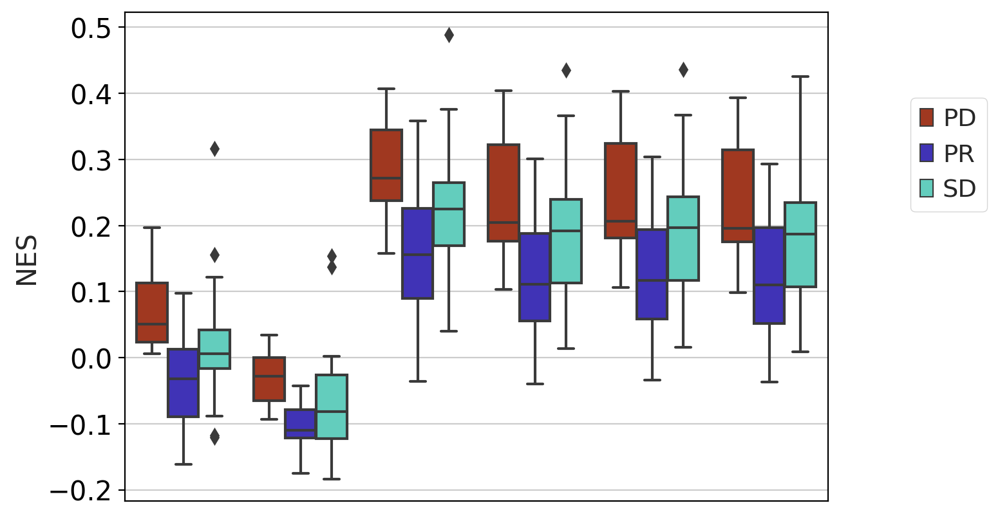

In [665]:
def idx_rename(x):
    if x.find('GO') != -1 or x.find('R-HSA') != -1:
        x_parse = x.split(' ')
        ret =  ' '.join(x_parse[:-1])
        ret = textwrap.fill(ret, 60)
        return ret
    else:
        ret = textwrap.fill(x, 60)
        return ret

FFX_Features = [
    'positive regulation of interleukin-8 production (GO:0032757)',
    'positive regulation of chemokine production (GO:0032722)',
    'Neutrophil extracellular trap formation',
    'neutrophil activation involved in immune response (GO:0002283)',
    'neutrophil degranulation (GO:0043312)',
    'neutrophil mediated immunity (GO:0002446)',
]


FFX_ssScore_df = tme_score.loc[:,FFX_Features]
FFX_ssScore_df.columns = FFX_ssScore_df.columns.map(idx_rename)
groupby_score = pd.concat([FFX_ssScore_df, annotation.loc[:,['CTx_response_FFX']]], axis=1)
ffx_features = groupby_score.columns[:-1]
groupby_score

df_td = pd.melt(groupby_score, id_vars='CTx_response_FFX', 
        value_vars=ffx_features, var_name='Pathway', value_name='NES')

fig = plt.figure(figsize=(7, 5), dpi= 100)
ax = sns.boxplot(data=df_td, x='Pathway', y='NES', hue='CTx_response_FFX',  palette=FFX_lut)
#ax.set_xticklabels(labels, rotation=275)
plt.legend(bbox_to_anchor=(1.1,0.85))
#plt.title('Bailey Pancreatic Progenitor Features')
plt.xticks([])
plt.xlabel('')
#plt.ylabel('')
plt.show()

In [666]:
groupby_score['CTx_response_FFX'].value_counts()

PR    21
SD    18
PD     7
Name: CTx_response_FFX, dtype: int64

In [847]:
annotation['CTx_response_GNP_1L']

Snubh_TB
20-T00330_FO-01    NaN
19-T00506_FO-01    NaN
21-T00771_FT-01    NaN
19-T00062_FO-01    NaN
20-T00814_FT-01    NaN
                  ... 
19-T00201_FO-01    1.0
20-T00577_FT-01    NaN
18-02904_FO-01     NaN
18-02165_FO-01     NaN
19-T00119_FO-01    NaN
Name: CTx_response_GNP_1L, Length: 93, dtype: float64

In [848]:
GNP_dict = dict()
GNP_dict['1.0'] = 'PR'
GNP_dict['2.0'] = 'PD'
GNP_dict['3.0'] = 'SD'
GNP_dict['4.0'] = np.nan
GNP_dict['5.0'] = 'SD'
GNP_dict['6.0'] = 'SD'
annotation['CTx_response_GNP_1L'] = annotation['CTx_response_GNP_1L'].astype(str).map(GNP_dict)


# FFX

C1    54
C2    39
Name: Tumor Subtype, dtype: int64

Tumor Subtype  CTx_response_FFX
C1             PR                  16
               SD                  14
               PD                   4
C2             PR                   5
               SD                   4
               PD                   3
Name: CTx_response_FFX, dtype: int64


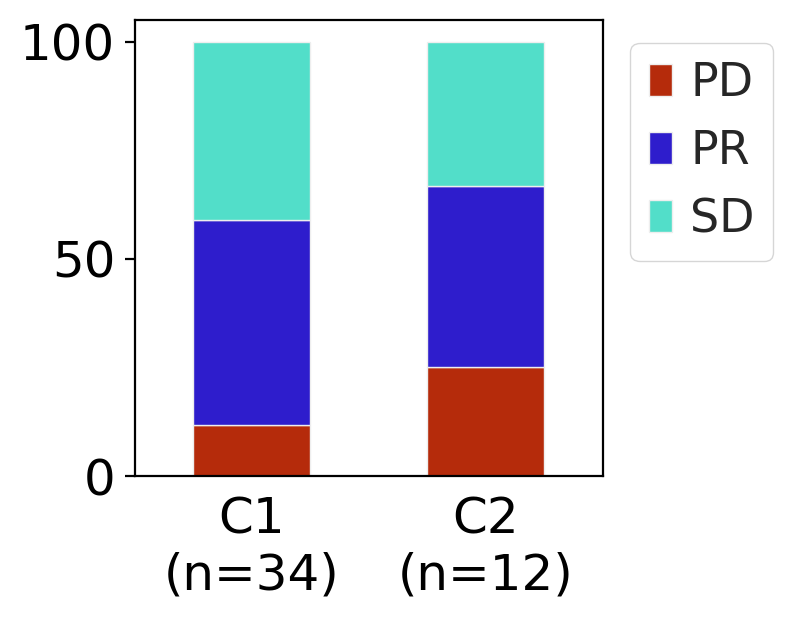

In [914]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_FFX'].value_counts())


g = annotation.groupby(target)['CTx_response_FFX'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_FFX')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_FFX'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

E1    71
E2    22
Name: TME Subtype, dtype: int64

TME Subtype  CTx_response_FFX
E1           PR                  15
             SD                  14
             PD                   7
E2           PR                   6
             SD                   4
             PD                   0
Name: CTx_response_FFX, dtype: int64


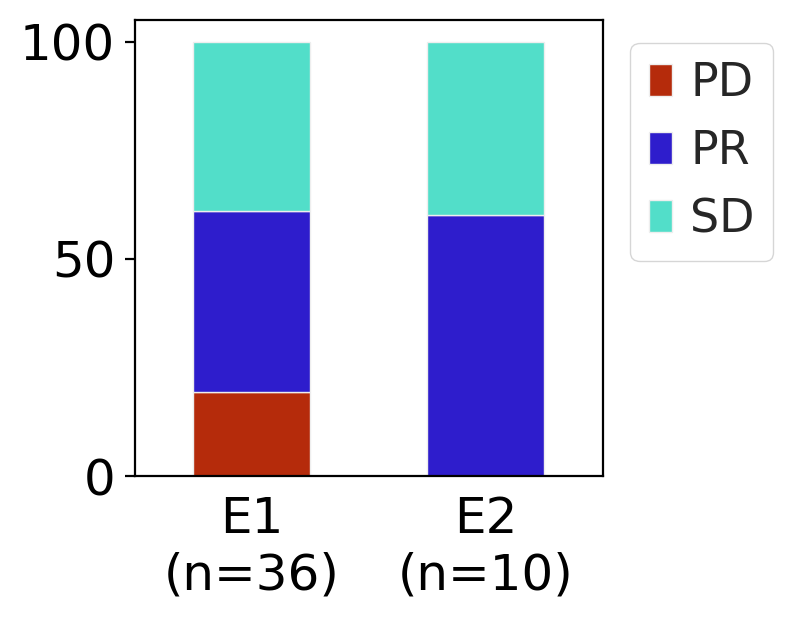

In [915]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_FFX'].value_counts())
g = annotation.groupby(target)['CTx_response_FFX'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_FFX')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_FFX'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

S1    37
S3    34
S2    17
S4     5
Name: Final Subtype, dtype: int64

Final Subtype  CTx_response_FFX
S1             PR                  10
               SD                  10
               PD                   4
S2             PR                   6
               SD                   4
               PD                   0
S3             PR                   5
               SD                   4
               PD                   3
S4             PD                   0
               PR                   0
               SD                   0
Name: CTx_response_FFX, dtype: int64


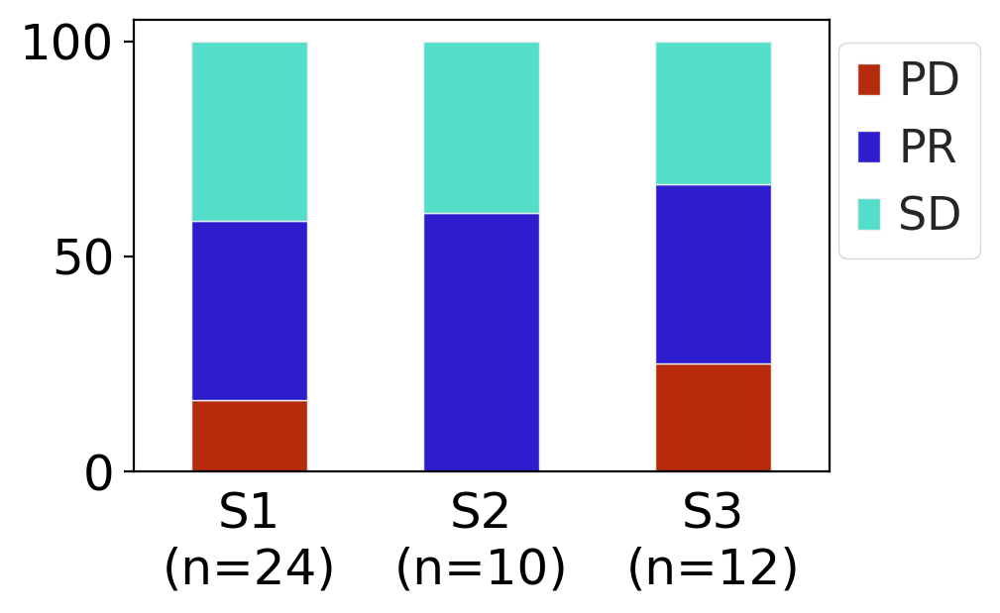

In [920]:
sc.settings.set_figure_params(dpi=100, figsize=(4.5,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_FFX'].value_counts())
g = annotation.groupby(target)['CTx_response_FFX'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_FFX')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_FFX'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)
g_pct.drop('S4', axis=0,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.25,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

# GNP

C1    54
C2    39
Name: Tumor Subtype, dtype: int64

Tumor Subtype  CTx_response_GNP_1L
C1             PR                     4
               SD                     2
C2             PR                     4
               PD                     2
               SD                     1
Name: CTx_response_GNP_1L, dtype: int64


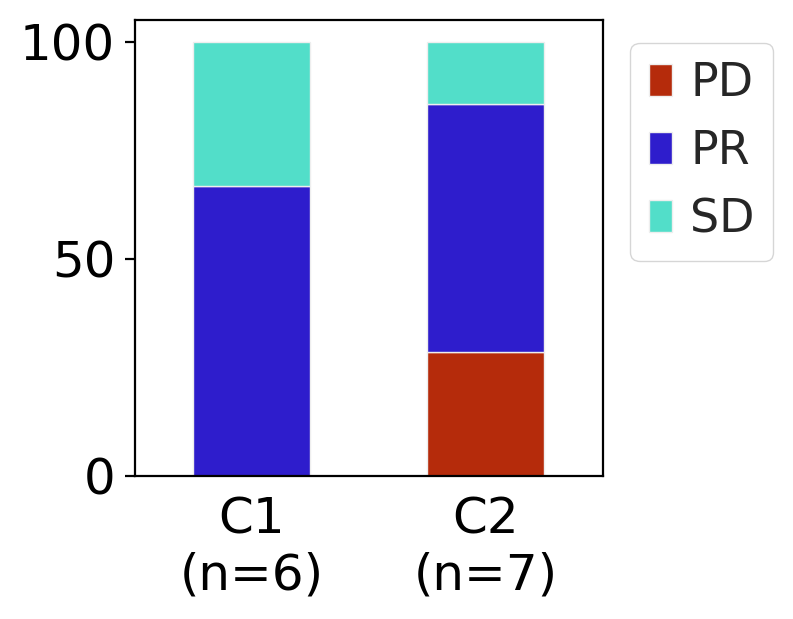

In [917]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_GNP_1L'].value_counts())
g = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_GNP_1L')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

E1    71
E2    22
Name: TME Subtype, dtype: int64

TME Subtype  CTx_response_GNP_1L
E1           PR                     5
             PD                     2
             SD                     2
E2           PR                     3
             SD                     1
Name: CTx_response_GNP_1L, dtype: int64


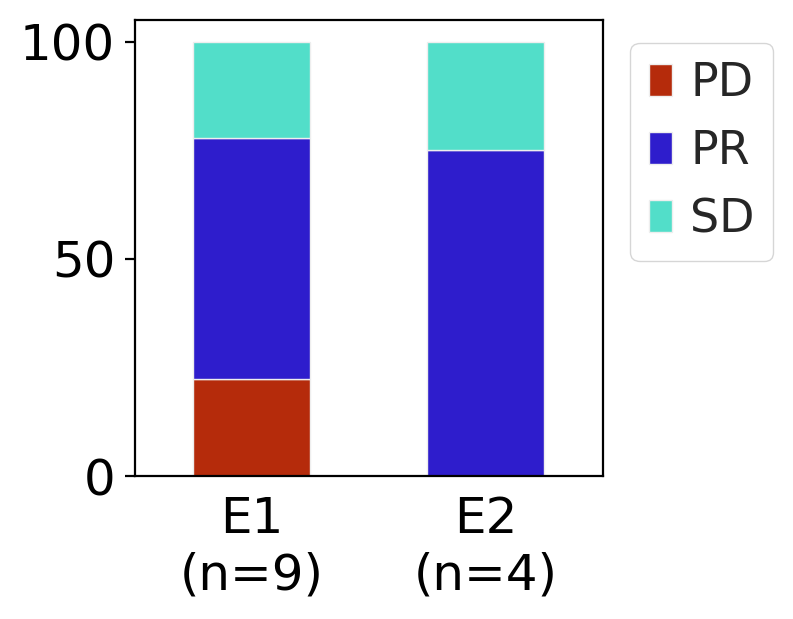

In [918]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_GNP_1L'].value_counts())
g = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_GNP_1L')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

S1    37
S3    34
S2    17
S4     5
Name: Final Subtype, dtype: int64

Final Subtype  CTx_response_GNP_1L
S1             PR                     2
               SD                     1
S2             PR                     2
               SD                     1
S3             PR                     3
               PD                     2
               SD                     1
S4             PR                     1
Name: CTx_response_GNP_1L, dtype: int64


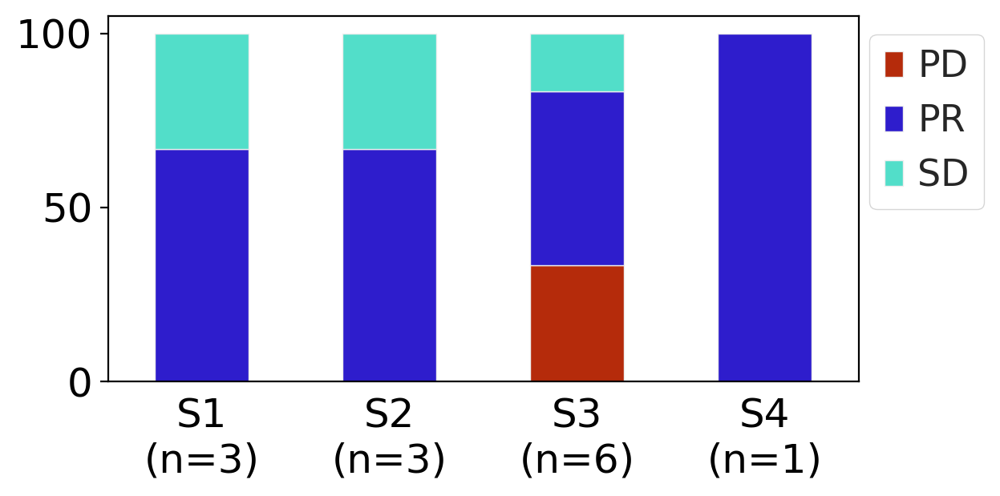

In [921]:
sc.settings.set_figure_params(dpi=100, figsize=(6,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_GNP_1L'].value_counts())
g = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_GNP_1L')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(0.99,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

In [352]:
# sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=15)

# for sigtype in ffx_features:
#     x = "CTx_response_FFX"
#     y = sigtype
#     order = ['responder', 'non-responder']
#     title='{}'.format(sigtype)
#     ax = sns.boxplot(data=groupby_score, x=x, y=y, order=order, palette=['#2e1dcc','#b52b0b'])
#     ax.set_yticks([])
#     ax.set_ylabel('')
#     ax.set_xlabel('')
#     ax.set_title(title)
#     test_results = add_stat_annotation(ax, data=groupby_score, x=x, y=y, order=order,
#                                        box_pairs=[('responder', 'non-responder')],
#                                        test='t-test_ind', text_format='simple', comparisons_correction=None,
#                                        loc='inside', verbose=0)
#     plt.show()
   

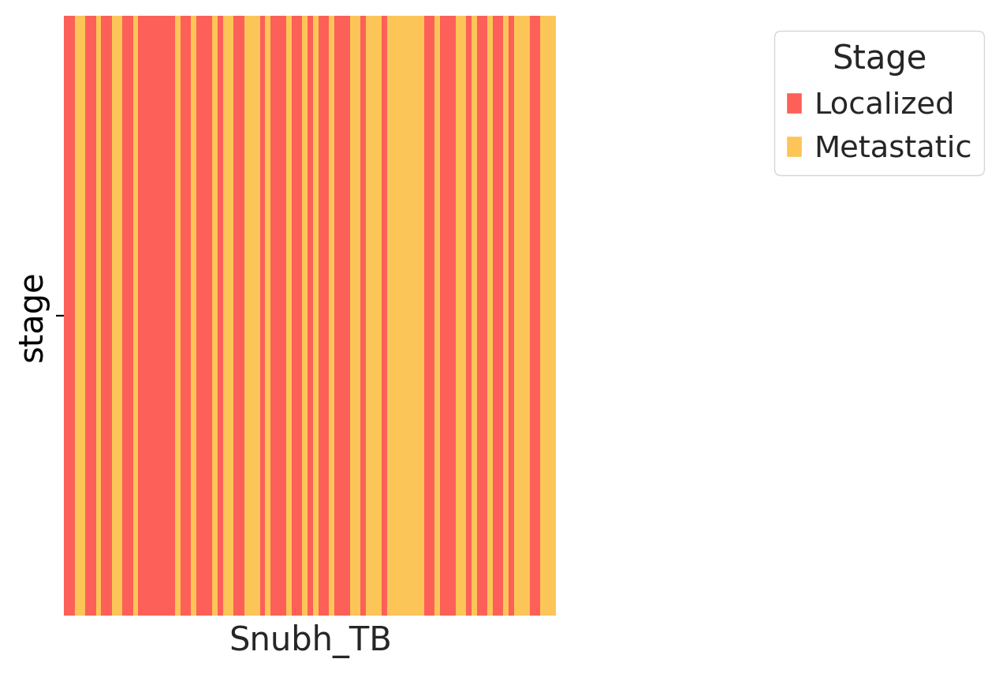

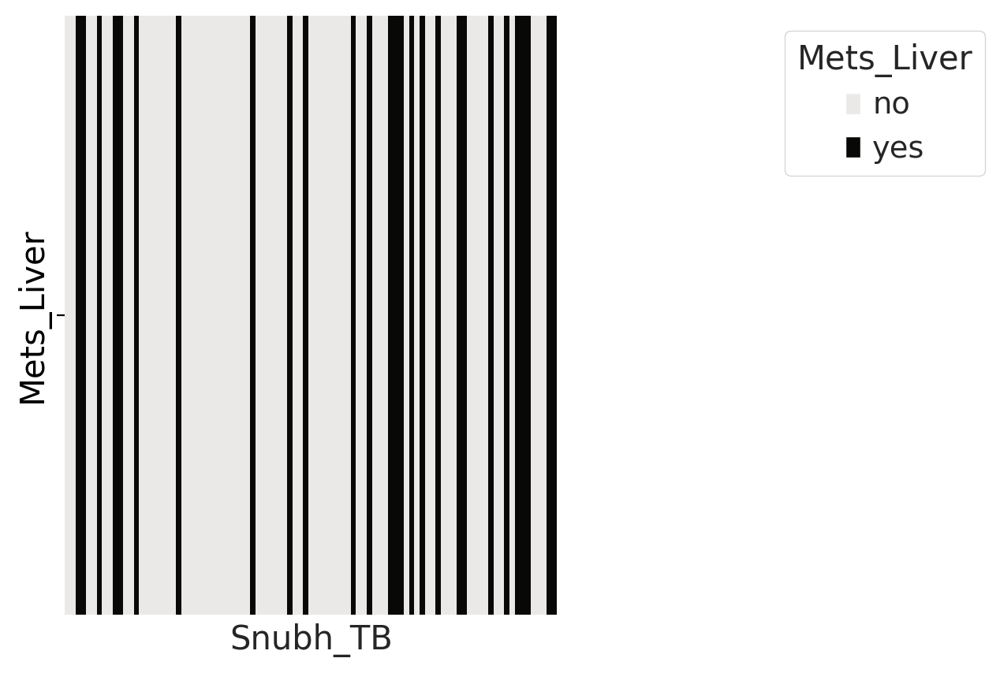

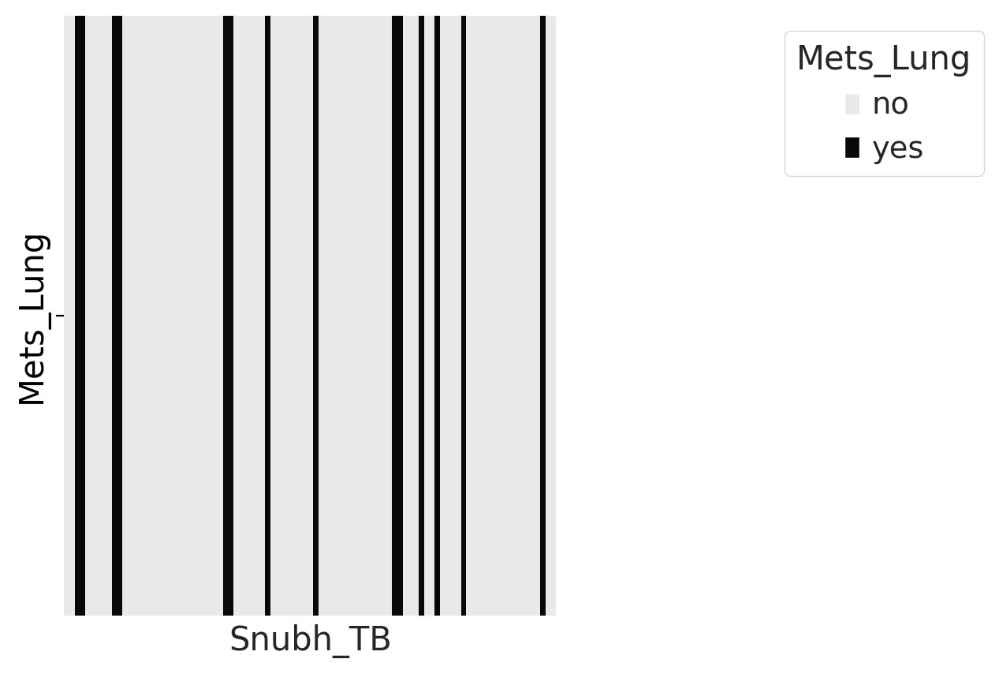

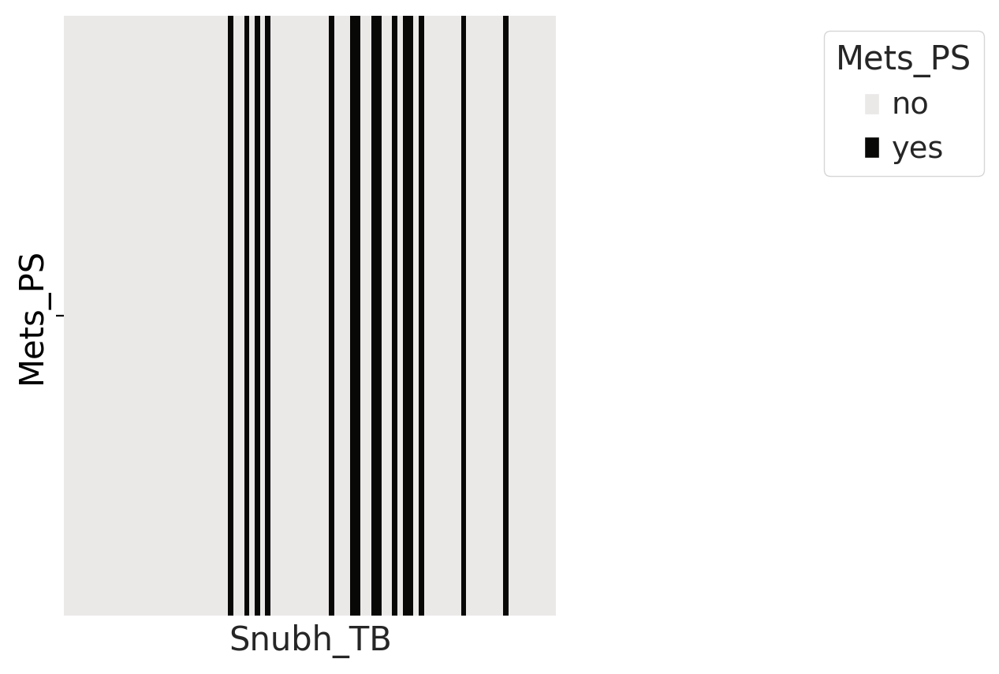

In [436]:
order = list(annotation.index)
with_stage = annotation.copy()
with_stage = with_stage.loc[order,:]
with_stage.loc[:,['Mets_liver_C','Mets_lung_C','Mets_PS_C']] = with_stage.loc[:,['Mets_liver_C','Mets_lung_C','Mets_PS_C']].astype(str)
with_stage = with_stage.replace('nan','no')

stage_map = dict(zip(with_stage['stage_C'].unique(),range(with_stage['stage_C'].nunique())))
stage_color = ['#fc6058','#fcc558']
stage_lut = dict(zip(with_stage['stage_C'].unique(), stage_color))
stage = with_stage['stage_C'].map(stage_map).astype(int).to_frame('stage').T
ax=sns.heatmap(stage, cmap=stage_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=stage_lut[name]) for name in stage_lut]
ax.legend(handles4, stage_lut, title='Stage',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

liver_map = dict(zip(with_stage['Mets_liver_C'].unique(),range(with_stage['Mets_liver_C'].nunique())))
liver_color = ['#ebe8e8','#080807']
liver_lut = dict(zip(with_stage['Mets_liver_C'].unique(), liver_color))
liver_lut
liver = with_stage['Mets_liver_C'].map(liver_map).astype(int).to_frame('Mets_Liver').T
ax=sns.heatmap(liver, cmap=liver_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=liver_lut[name]) for name in liver_lut]
ax.legend(handles4, liver_lut, title='Mets_Liver',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

lung_map = dict(zip(with_stage['Mets_lung_C'].unique(),range(with_stage['Mets_lung_C'].nunique())))
lung_color = ['#ebe8e8','#080807']
lung_lut = dict(zip(with_stage['Mets_lung_C'].unique(), lung_color))

lung = with_stage['Mets_lung_C'].map(lung_map).astype(int).to_frame('Mets_Lung').T
ax=sns.heatmap(lung, cmap=lung_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=lung_lut[name]) for name in lung_lut]
ax.legend(handles4, lung_lut, title='Mets_Lung',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

ps_map = dict(zip(with_stage['Mets_PS_C'].unique(),range(with_stage['Mets_PS_C'].nunique())))
ps_color = ['#ebe8e8','#080807']
ps_lut = dict(zip(with_stage['Mets_PS_C'].unique(), ps_color))

ps = with_stage['Mets_PS_C'].map(ps_map).astype(int).to_frame('Mets_PS').T
ax=sns.heatmap(ps, cmap=ps_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=ps_lut[name]) for name in ps_lut]
ax.legend(handles4, ps_lut, title='Mets_PS',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

In [437]:
# fig = plt.figure(figsize=(25, 15), dpi= 150)
# widths = [1]
# heights = [1,1,1,1,1,1]
# gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.5, wspace=0.01, width_ratios=widths, height_ratios=heights)


# ax = fig.add_subplot(gs[1, 0])
# cmap = [FFX_lut[key] for key in list(FFX_map.keys())]
# sns.heatmap(FFX, cmap=cmap, cbar=False, ax=ax)
# handles = [mpatches.Patch(facecolor=FFX_lut[name]) for name in ['responder', 'non-responder', 'NA']]
# ax_legend = ax.legend(handles, {'responder':'#2e1dcc','non-responder':'#b52b0b','NA':'#ebe8e8'}, 
#                       bbox_to_anchor=(1.26, 1.5), frameon=False, 
#                               fontsize=30, markerscale=2, ncol=2, labelspacing=0.5, columnspacing=0.1)
# ax_legend.set_title('$\\bf{FFX}$',prop={'size':25})
# ax_legend._legend_box.align = "left"
# ax.set_xticks([])
# ax.set_xlabel('')
# ax.set_yticklabels('')
# #ax.set_ylabel('FFX',fontdict={'fontsize':25,'weight':'bold'})
# ax.margins(0)

# final_int_map = dict(zip(head['Final Subtype'].unique(),range(head['Final Subtype'].nunique())))
# final = head['Final Subtype'].map(final_int_map).to_frame('Final Subtype').T.astype(float)
# ax = fig.add_subplot(gs[0, 0])
# sns.heatmap(final, cmap=list(final_lut.values()), cbar=False, ax=ax)
# handles = [mpatches.Patch(facecolor=final_lut[name]) for name in final_lut]
# ax_legend = ax.legend(handles, final_lut, bbox_to_anchor=(1.24, 1.5),
#                               fontsize=30, markerscale=2, frameon=False, ncol=2)
# ax_legend.set_title('$\\bf{Subtype}$',prop={'size':25})
# ax_legend._legend_box.align = "left"
# ax.set_xticks([])
# ax.set_xlabel('')
# ax.set_yticklabels([])
# ax.set_ylabel('')
# ax.margins(0)

# # ax = fig.add_subplot(gs[2, 0])
# # sns.heatmap(stage, cmap=list(stage_lut.values()), cbar=False, ax=ax)
# # handles = [mpatches.Patch(facecolor=stage_lut[name]) for name in stage_lut]
# # ax_legend = ax.legend(handles, stage_lut, bbox_to_anchor=(1.17, 1.5),
# #                               fontsize=30, markerscale=2, frameon=False, ncol=1)
# # ax_legend.set_title('$\\bf{Stage}$',prop={'size':25})
# # ax_legend._legend_box.align = "left"
# # ax.set_xticks([])
# # ax.set_xlabel('')
# # ax.set_yticklabels([])
# # ax.margins(0)

# ax = fig.add_subplot(gs[2, 0])
# sns.heatmap(liver, cmap=list(liver_lut.values()), cbar=False, ax=ax)
# handles = [mpatches.Patch(facecolor=liver_lut[name]) for name in liver_lut]
# ax_legend = ax.legend(handles, liver_lut, bbox_to_anchor=(1.19, 1.3),
#                               fontsize=30, markerscale=2, frameon=False, ncol=2)
# ax_legend.set_title('$\\bf{MetsLiver}$',prop={'size':25})
# ax_legend._legend_box.align = "left"
# ax.set_xticks([])
# ax.set_xlabel('')
# ax.set_yticklabels([])
# ax.set_ylabel('')
# ax.margins(0)

# ax = fig.add_subplot(gs[3, 0])
# sns.heatmap(lung, cmap=list(lung_lut.values()), cbar=False, ax=ax)
# handles = [mpatches.Patch(facecolor=lung_lut[name]) for name in lung_lut]
# ax_legend = ax.legend(handles, lung_lut, bbox_to_anchor=(1.19, 1.3),
#                               fontsize=30, markerscale=2, frameon=False, ncol=2)
# ax_legend.set_title('$\\bf{MetsLung}$',prop={'size':25})
# ax_legend._legend_box.align = "left"
# ax.set_xticks([])
# ax.set_xlabel('')
# ax.set_yticklabels([])
# ax.set_ylabel('')
# ax.margins(0)

# ax = fig.add_subplot(gs[4, 0])
# sns.heatmap(ps, cmap=list(ps_lut.values()), cbar=False, ax=ax)
# handles = [mpatches.Patch(facecolor=ps_lut[name]) for name in ps_lut]
# ax_legend = ax.legend(handles, ps_lut, bbox_to_anchor=(1.19, 1.3),
#                               fontsize=30, markerscale=2, frameon=False, ncol=2)
# ax_legend.set_title('$\\bf{MetsPS}$',prop={'size':25})
# ax_legend._legend_box.align = "left"
# ax.set_xticks([])
# ax.set_xlabel('')
# ax.set_yticklabels([])
# ax.set_ylabel('')
# ax.margins(0)

# plt.show()

# 4 PDAC Subtype

## SNUBH 

In [302]:
features = list(table_genes['Gene'])

final_lut = dict()
final_lut['C1-E1']='#FC3A51'
final_lut['C1-E2']='#036564'
final_lut['C2-E1']='#838689'
final_lut['C2-E2']='#00A8C6'

final_lut['S1']='#FC3A51'
final_lut['S2']='#036564'
final_lut['S3']='#838689'
final_lut['S4']='#00A8C6'



tumor_lut = dict()
tumor_lut['C1']='#fc6058'
tumor_lut['C2']='#fcc558'

tme_lut = dict()
tme_lut['E1']='#5bb6eb'
tme_lut['E2']='#5beba8'

genetype_lut = dict()
genetype_lut['Tumor_Pos']='#93c4f5'
genetype_lut['Tumor_Neg']='#f59393'
genetype_lut['TME_Neg']='#f5c693'

FFX_lut = {'PR':'#2e1dcc','PD':'#b52b0b','NA':'#ebe8e8', 'SD':'#52dec9'}

NA    47
PR    21
SD    18
PD     7
Name: CTx_response_FFX, dtype: int64


[]

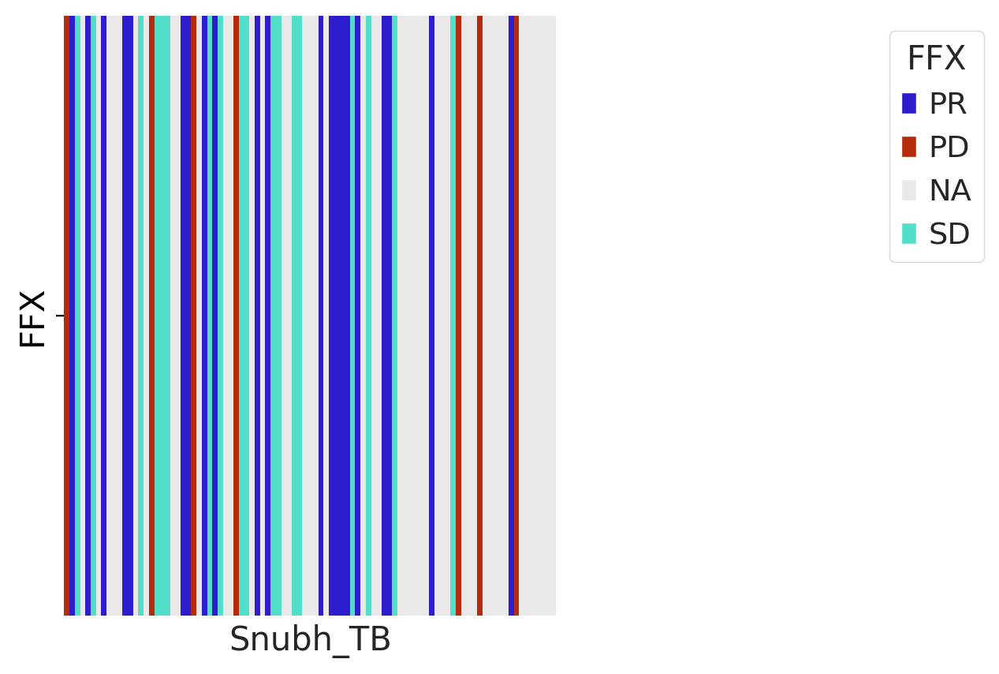

In [303]:
annotation = SNU_annot.sort_values(by='Final Subtype')
annotation['Bailey_Mixed'] = annotation['Bailey P/S'].astype(str)+'-'+annotation['Bailey A/I'].astype(str)

order = list(annotation.index)
snu_obs = SNU_annot.copy().loc[order,:]
snu_obs['CTx_response_FFX'] = snu_obs['CTx_response_FFX'].cat.add_categories('NA')
snu_obs['CTx_response_FFX'] = snu_obs['CTx_response_FFX'].fillna('NA')
print(snu_obs['CTx_response_FFX'].value_counts())

FFX_map = dict(zip(snu_obs['CTx_response_FFX'].unique(),range(snu_obs['CTx_response_FFX'].nunique())))

FFX = snu_obs['CTx_response_FFX'].map(FFX_map).to_frame('FFX').T.astype(float)
cmap_dict = int2color_dict(FFX_map, FFX_lut)
ffx_cmap = [cmap_dict[val] for val in list(FFX.loc['FFX',:].unique())]
ax=sns.heatmap(FFX, cmap=ffx_cmap, cbar=False)
handles4 = [mpatches.Patch(facecolor=FFX_lut[name]) for name in FFX_lut]
ax.legend(handles4, FFX_lut, title='FFX',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])

[]

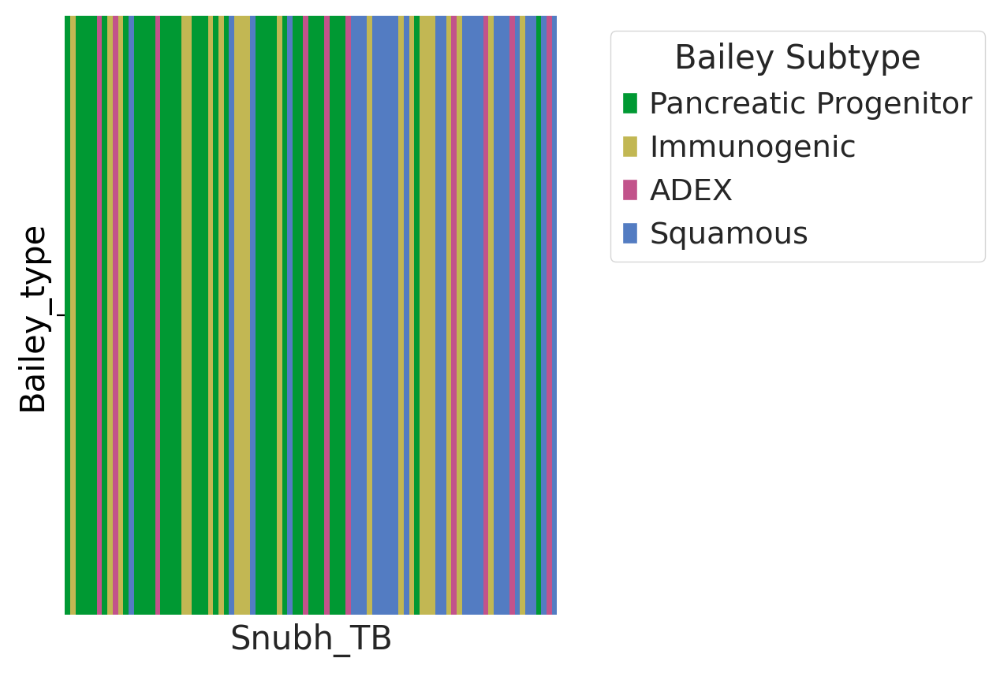

In [304]:
Bailey_map = dict(zip(annotation['Bailey Subtype'].unique(),range(annotation['Bailey Subtype'].nunique())))
Bailey_color = ['#009933','#c2b753','#c2538b', '#537cc2']
lut2 = dict(zip(annotation['Bailey Subtype'].unique(), Bailey_color))
Bailey_type = annotation['Bailey Subtype'].map(Bailey_map).astype(int).to_frame('Bailey_type').T


ax=sns.heatmap(Bailey_type, cmap=Bailey_color, cbar=False)


handles2 = [mpatches.Patch(facecolor=lut2[name]) for name in lut2]
ax.legend(handles2, lut2, title='Bailey Subtype',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])

[]

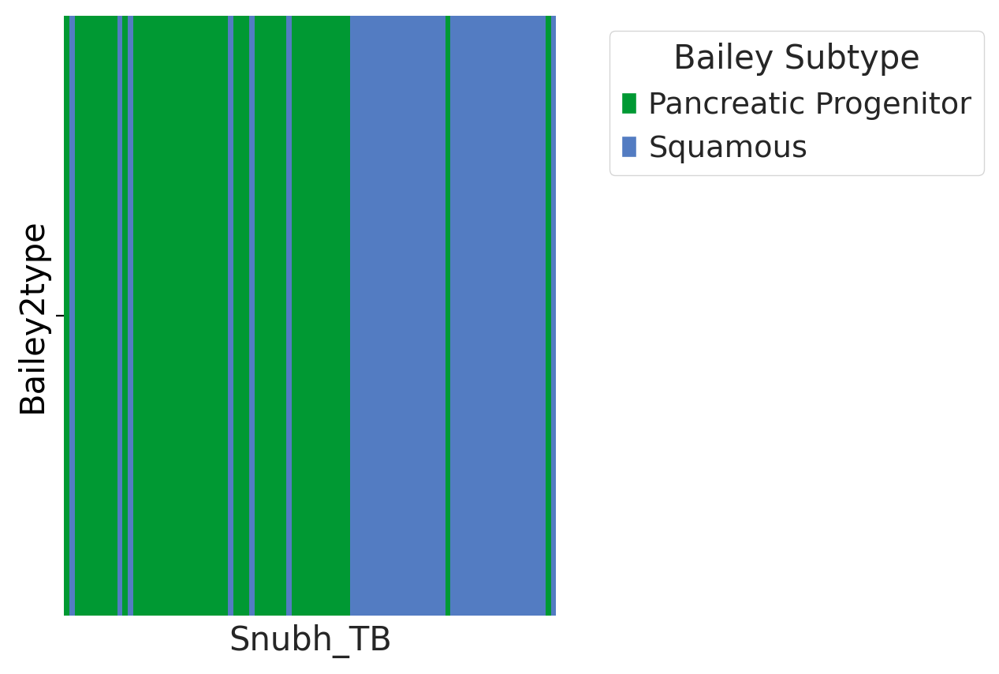

In [305]:
BaileyPS_map = dict(zip(annotation['Bailey P/S'].unique(),range(annotation['Bailey P/S'].nunique())))
BaileyPS_color = ['#009933','#537cc2']
BaileyPS_lut = dict(zip(annotation['Bailey P/S'].unique(), BaileyPS_color))
BaileyPS_type = annotation['Bailey P/S'].map(BaileyPS_map).astype(int).to_frame('Bailey2type').T
ax=sns.heatmap(BaileyPS_type, cmap=BaileyPS_color, cbar=False)

BaileyPS_handles = [mpatches.Patch(facecolor=BaileyPS_lut[name]) for name in BaileyPS_lut]
ax.legend(BaileyPS_handles, BaileyPS_lut, title='Bailey Subtype',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])

[]

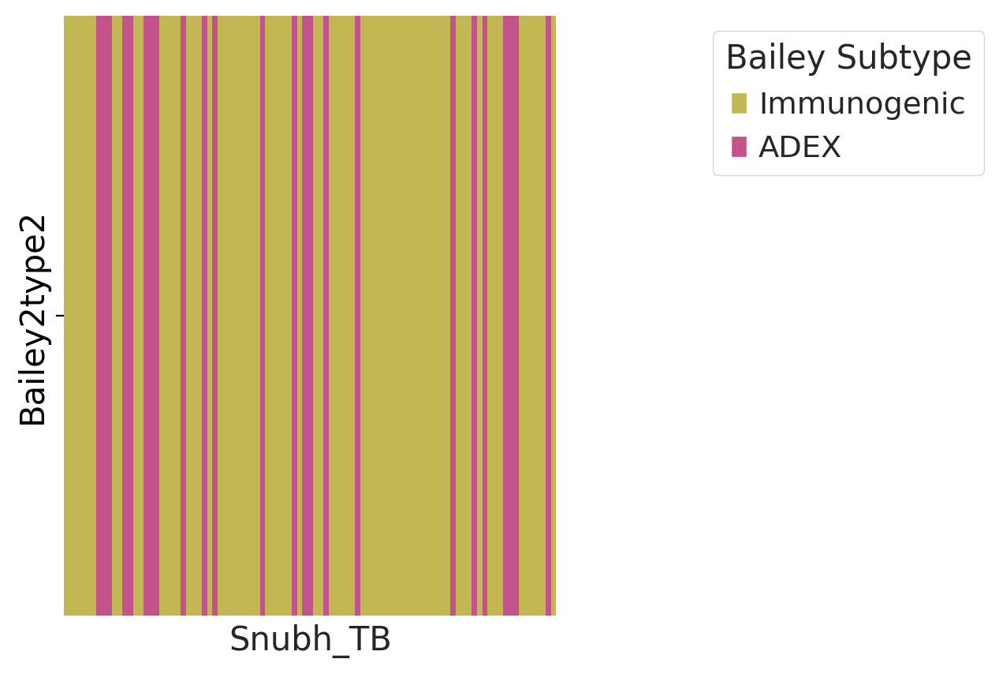

In [306]:
BaileyAI_map = dict(zip(annotation['Bailey A/I'].unique(),range(annotation['Bailey A/I'].nunique())))
BaileyAI_color = ['#c2b753','#c2538b']
BaileyAI_lut = dict(zip(annotation['Bailey A/I'].unique(), BaileyAI_color))
BaileyAI_type = annotation['Bailey A/I'].map(BaileyAI_map).astype(int).to_frame('Bailey2type2').T
ax=sns.heatmap(BaileyAI_type, cmap=BaileyAI_color, cbar=False)

BaileyAI_handles = [mpatches.Patch(facecolor=BaileyAI_lut[name]) for name in BaileyAI_lut]
ax.legend(BaileyAI_handles, BaileyAI_lut, title='Bailey Subtype',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])

[]

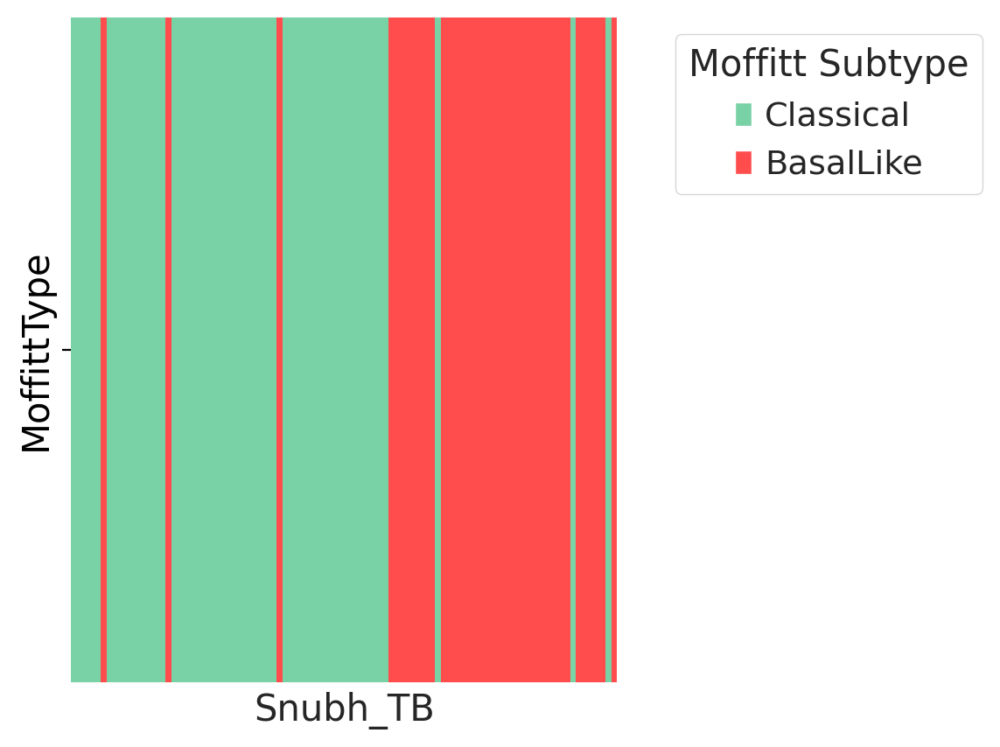

In [307]:
Moffitt_map = dict(zip(annotation['Moffitt Subtype'].unique(),range(annotation['Moffitt Subtype'].nunique())))
Moffitt_color = ['#79d2a6', '#ff4d4d']
lut3 = dict(zip(annotation['Moffitt Subtype'].unique(), Moffitt_color))
Moffitt_type = annotation['Moffitt Subtype'].map(Moffitt_map).astype(int).to_frame('MoffittType').T
ax=sns.heatmap(Moffitt_type, cmap=Moffitt_color, cbar=False)


handles3 = [mpatches.Patch(facecolor=lut3[name]) for name in lut3]
ax.legend(handles3, lut3, title='Moffitt Subtype',
           bbox_to_anchor=(1.7, 1))
ax.set_xticks([])

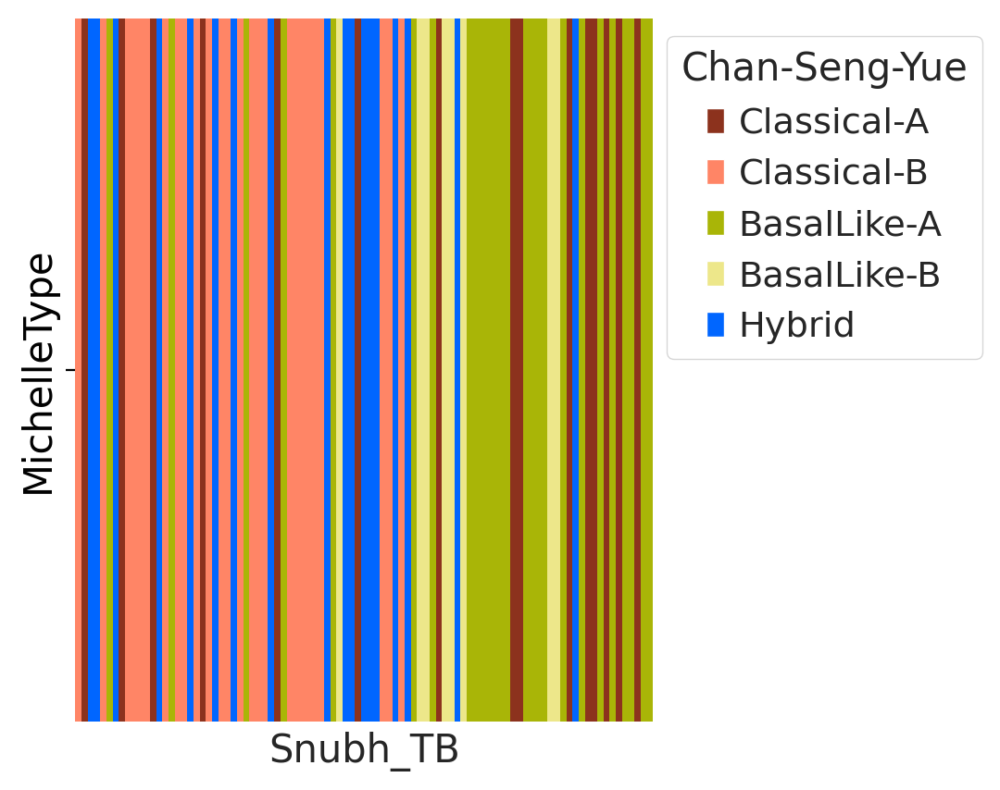

In [308]:
MichelleType_map = dict(zip(annotation['Chan-Seng-Yue Subtype'].unique(),range(5)))
MichelleType_map
MichelleType_color = ['#ff8566','#8c321d','#0066ff','#a9b507','#ede78a']
lut4 = dict(zip(annotation['Chan-Seng-Yue Subtype'].unique(), MichelleType_color))
lut4 = {'Classical-A': '#8c321d',
     'Classical-B': '#ff8566',
     'BasalLike-A': '#a9b507',
     'BasalLike-B': '#ede78a',
     'Hybrid': '#0066ff'
     }

MichelleType = annotation['Chan-Seng-Yue Subtype'].map(MichelleType_map).astype(int).to_frame('MichelleType').T
ax=sns.heatmap(MichelleType, cmap=MichelleType_color, cbar=False)


handles4 = [mpatches.Patch(facecolor=lut4[name]) for name in lut4]
ax.legend(handles4, lut4, title='Chan-Seng-Yue',bbox_to_anchor=(1.6, 1))
ax.set_xticks([])
plt.show()

In [313]:
SNU_annot['Final Subtype'] = SNU_annot['Final Subtype'].map(repl_dict)
SNU_annot

,N0,PID,dateA,Snubh_BB,pathology_number,tumorcellularity(pathology),DNA_RNA,methylSeq,metagenomic,liquid_number,...,Tumor Subtype,TME Subtype,Moffitt Subtype,Bailey Subtype,Chan-Seng-Yue Subtype,Bailey P/S,Bailey A/I,Final Subtype,Dataset,Bailey_Mixed
Snubh_TB,,,,,,,,,,,,,,,,,,,,,
20-T00330_FO-01,sb2441,32644755,2020-05-15,20-B01156_EB-03,S 200019390,25,DNA+RNA,NaN,NaN,R167,...,C2,E1,BasalLike,Squamous,BasalLike-B,Squamous,Immunogenic,S3,SNUBH,Squamous-Immunogenic
21-T00552_FT-01,NaN,34453568,2021-07-14,NaN,S 210031515,70,RNA,NaN,NaN,NaN,...,C1,E1,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,S1,SNUBH,Pancreatic Progenitor-Immunogenic
18-01476_FO-01,sb1766,29653157,2018-07-18,18-01476_EB-02,S 180032566,15,DNA+RNA,NaN,NaN,NaN,...,C1,E1,Classical,Pancreatic Progenitor,Classical-A,Pancreatic Progenitor,Immunogenic,S1,SNUBH,Pancreatic Progenitor-Immunogenic
19-T00342_FO-01,sb1983,11421551,2019-07-15,19-B01636_EB-03,S 190034167,40,DNA+RNA,NaN,NaN,R047,...,C1,E1,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,ADEX,S1,SNUBH,Pancreatic Progenitor-ADEX
20-T00823_FT-01,sb2674,33541121,2020-12-18,20-B04576_EB-04,S 200053903,65,DNA+RNA,NaN,NaN,R202,...,C1,E1,Classical,Immunogenic,Hybrid,Pancreatic Progenitor,Immunogenic,S1,SNUBH,Pancreatic Progenitor-Immunogenic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21-T00389_FT-01,NaN,14899223,2021-05-20,21-B02013_EB-02,S 210022757,55,DNA+RNA,NaN,NaN,NaN,...,C1,E2,Classical,Pancreatic Progenitor,Hybrid,Pancreatic Progenitor,Immunogenic,S2,SNUBH,Pancreatic Progenitor-Immunogenic
18-00394_FO-01,sb1666,28712231,2018-02-28,18-00394_EB-02,S 180010177,50,DNA+RNA,NaN,NaN,NaN,...,C1,E2,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,S2,SNUBH,Pancreatic Progenitor-Immunogenic
21-T00244_FT-01,NaN,13054128,2021-03-25,21-B01163_EB-04,S 210013484,70,DNA+RNA,NaN,NaN,NaN,...,C1,E2,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,S2,SNUBH,Pancreatic Progenitor-Immunogenic


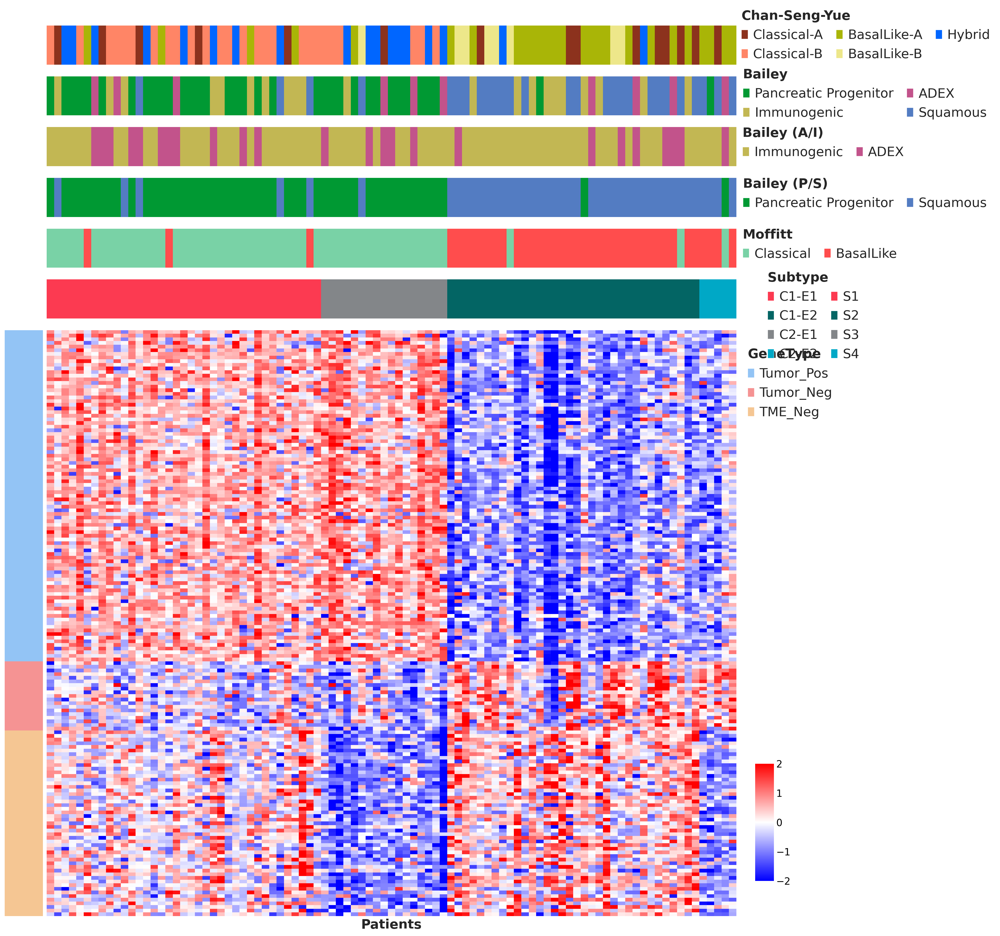

In [310]:
# final_lut['C1-E1']='#3290a8'
# final_lut['C1-E2']='#32a852'
# final_lut['C2-E1']='#a8328e'
# final_lut['C2-E2']='#e04f6e'


#annot = SNU_annot.sort_values(by='FinalType')
order = list(annotation.index)
exp = SNU_adata[:,features].to_df()
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T

final_int_map = dict(zip(annotation['Final Subtype'].unique(),range(annotation['Final Subtype'].nunique())))
genetype_int_map = dict(zip(table_genes['Type'].unique(),range(table_genes['Type'].nunique())))


final = annotation['Final Subtype'].map(final_int_map).to_frame('Final Subtype').T.astype(float)
genetype = table_genes['Type'].map(genetype_int_map).to_frame('GeneType')


fig = plt.figure(figsize=(20, 25), dpi= 100)
widths = [1,18]
heights = [1,1,1,1,1,1,15]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.1, wspace=0.01, width_ratios=widths, height_ratios=heights)


ax = fig.add_subplot(gs[6, 0])
sns.heatmap(genetype, cmap=list(genetype_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=genetype_lut[name]) for name in genetype_lut]
ax_legend = ax.legend(handles, genetype_lut, bbox_to_anchor=(21.9, .99), frameon=False, 
                              fontsize=20, markerscale=3)
ax_legend.set_title('$\\bf{GeneType}$',prop={'size':20})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_yticks([])
ax.margins(0)


ax = fig.add_subplot(gs[0, 1])
sns.heatmap(MichelleType, ax=ax, cmap=MichelleType_color, cbar=False)
#ax0.set_ylabel('Michelle', fontsize=18, fontdict=dict(weight='bold'))
ax.set_xlabel('')
ax.set_yticks([])
ax.set_xticks([])
ax.margins(0)
ax_legend = ax.legend(handles4, lut4, bbox_to_anchor=(1.385, 1.7), 
                      frameon=False, fontsize=20, ncol=3, columnspacing=1)
ax_legend.set_title('Chan-Seng-Yue',prop={'size':20, 'weight':'bold'})
ax_legend._legend_box.align = "left"


ax = fig.add_subplot(gs[1, 1])
sns.heatmap(Bailey_type, ax=ax, cmap=Bailey_color, cbar=False)
#ax1.set_ylabel('Bailey', fontsize=18, fontdict=dict(weight='bold'), rotation=90)
ax.set_xlabel('')
ax.set_yticks([])
ax.set_xticks([])
ax.margins(0)
ax_legend = ax.legend(handles2, lut2, bbox_to_anchor=(1.38, 1.5), 
                      frameon=False, fontsize=20,ncol=2, columnspacing=1)
ax_legend.set_title('Bailey',prop={'size':20, 'weight':'bold'})
ax_legend._legend_box.align = "left"


ax = fig.add_subplot(gs[2, 1])
sns.heatmap(BaileyAI_type, ax=ax, cmap=BaileyAI_color, cbar=False)
#ax1.set_ylabel('Bailey', fontsize=18, fontdict=dict(weight='bold'), rotation=90)
ax.set_xlabel('')
ax.set_yticks([])
ax.set_xticks([])
ax.margins(0)
ax_legend = ax.legend(BaileyAI_handles, BaileyAI_lut, bbox_to_anchor=(1.26, 1.3), 
                      frameon=False,fontsize=20, ncol=2, columnspacing=1)
ax_legend.set_title('Bailey (A/I)',prop={'size':20, 'weight':'bold'})
ax_legend._legend_box.align = "left"


ax = fig.add_subplot(gs[3, 1])
sns.heatmap(BaileyPS_type, ax=ax, cmap=BaileyPS_color, cbar=False)
#ax1.set_ylabel('Bailey', fontsize=18, fontdict=dict(weight='bold'), rotation=90)
ax.set_xlabel('')
ax.set_yticks([])
ax.set_xticks([])
ax.margins(0)
ax_legend = ax.legend(BaileyPS_handles, BaileyPS_lut, bbox_to_anchor=(1.38, 1.3), 
                      frameon=False, fontsize=20, ncol=2, columnspacing=1)
ax_legend.set_title('Bailey (P/S)',prop={'size':20, 'weight':'bold'})
ax_legend._legend_box.align = "left"


ax = fig.add_subplot(gs[4, 1])
sns.heatmap(Moffitt_type, ax=ax, cmap=Moffitt_color, cbar=False, )
#ax2.set_ylabel('Moffitt', fontsize=18, fontdict=dict(weight='bold'))
ax.set_xlabel('')
ax.set_yticks([])
ax.set_xticks([])
ax.margins(0)
ax_legend = ax.legend(handles3, lut3, bbox_to_anchor=(1.25, 1.3), 
                      frameon=False, fontsize=20, ncol=2, columnspacing=1)
ax_legend.set_title('Moffitt',prop={'size':20, 'weight':'bold'})
ax_legend._legend_box.align = "left"


ax = fig.add_subplot(gs[5, 1])
sns.heatmap(final, cmap=list(final_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=final_lut[name]) for name in final_lut]
ax_legend = ax.legend(handles, final_lut, bbox_to_anchor=(1.195, 1.5),
                    fontsize=20, markerscale=2.5, frameon=False, ncol=2, columnspacing=1)
ax_legend.set_title('Subtype',prop={'size':20, 'weight':'bold'})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_yticks([])
ax.margins(0)


cbar_ax = fig.add_axes([0.98, 0.18, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)
ax = fig.add_subplot(gs[6, 1])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax.set_xticks([])
ax.set_xlabel('Patients', fontsize=20, fontdict=dict(weight='bold'))
ax.set_ylabel('')
plt.show()


In [645]:
def km_plot2(df_info, category, os, event, title='', order=None, Pos=None):
    i=0
    kmf = lifelines.KaplanMeierFitter()
    #plt.figure(figsize=(8,4))
    #ax = plt.gca()
    m = ~df_info[category].isna()
    df_info = df_info[m]
    category_vals = list(df_info[category].unique())
    
    if len(category_vals) > 6:
        colormap=mcp.gen_color(cmap="Set2",n=len(category_vals))
    else:
        colormap=mcp.gen_color(cmap="Set2",n=6)
    
    
    median_os = df_info[os].median()
    group_os = dict()
    for val in category_vals:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        time = kmf.predict(median_os)
        group_os[val]=time

    m_survival = pd.DataFrame.from_dict(group_os, orient='index', columns=['m_survival']).sort_values(by='m_survival', ascending=True)
    sorted_category = list(m_survival.index)
    
    if order:
        sorted_category = order
    
    for val in sorted_category:
        m = df_info[category] == val
        count = sum(m)
        label = "{} (n={})".format(val,count)
        T_exp, E_exp = df_info.loc[m,os], df_info.loc[m,event]
        kmf.fit(T_exp, E_exp, label=label)
        kmf.plot_survival_function(ci_show=False, linewidth=3, show_censors=False, color=colormap[i])
        i+=1
        

    result = multivariate_logrank_test(df_info[os], df_info[category], df_info[event])
    p_val="{:.2e}".format(result.p_value)
    if Pos:
        plt.text(Pos[0], Pos[1], 'p-value: {}'.format(p_val), fontsize=15)
    else:
        plt.text(0, 0.05, 'p-value: {}'.format(p_val), fontsize=15)
    
    if title=='':
        title = 'KM Plot - {}'.format(category)
    plt.title(title, fontsize=20)
    plt.xlabel('Time (month)',fontsize=15)
    plt.ylabel('Overall Survival',fontsize=15)
    plt.ylim((0,1.03))
    plt.legend(loc='lower left', bbox_to_anchor=(-0.1, -0.6))
    plt.show()
    return p_val

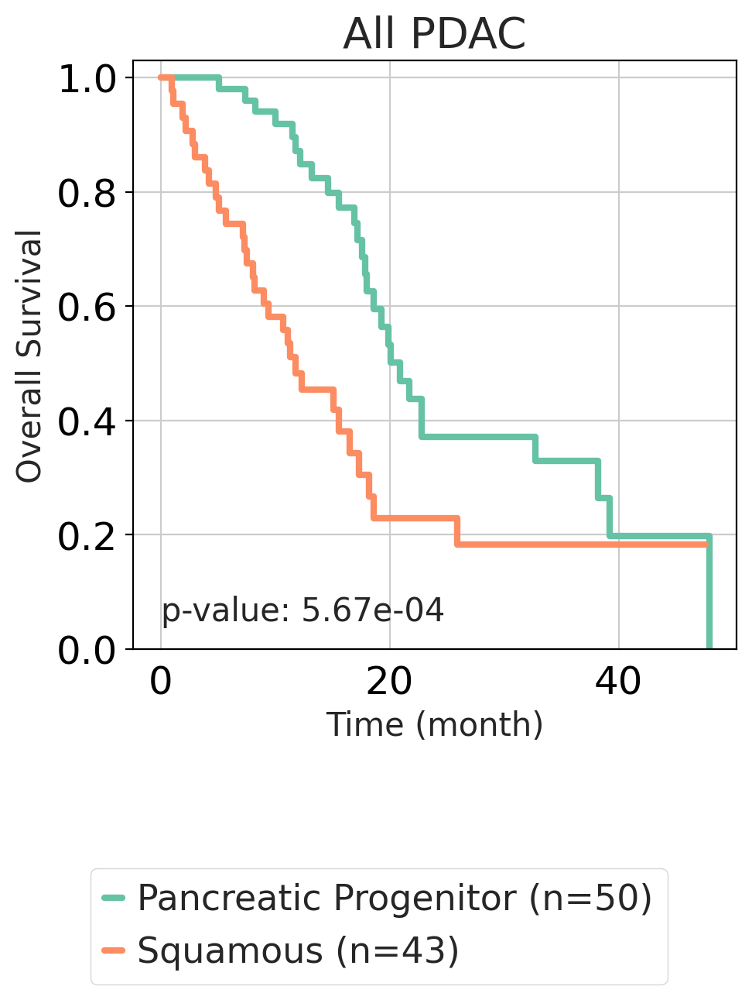

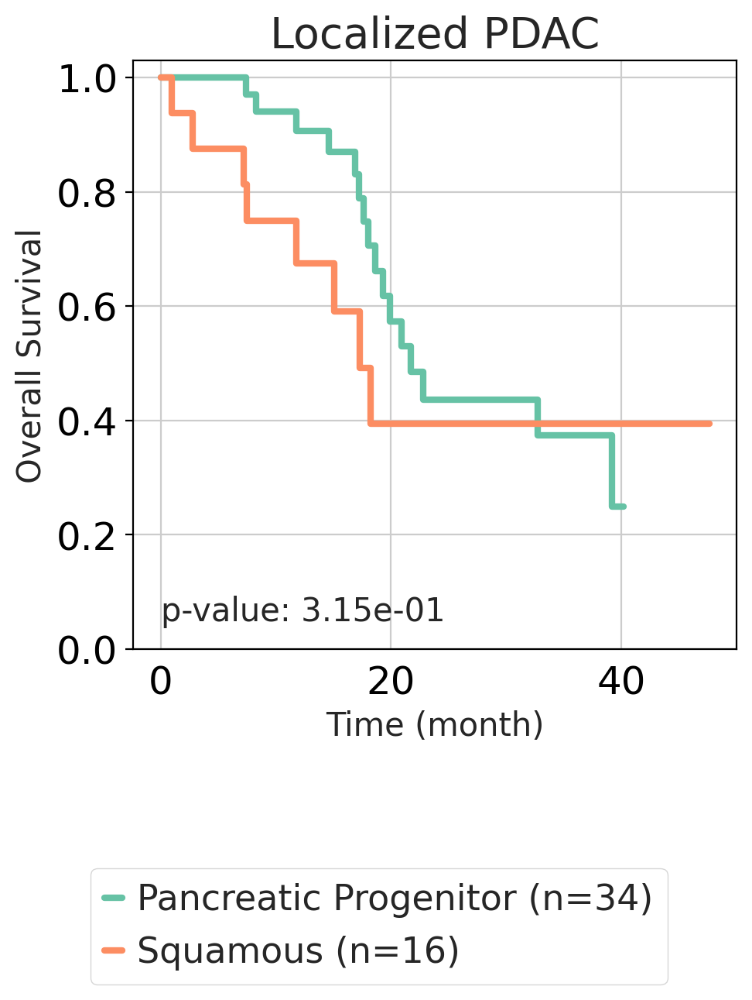

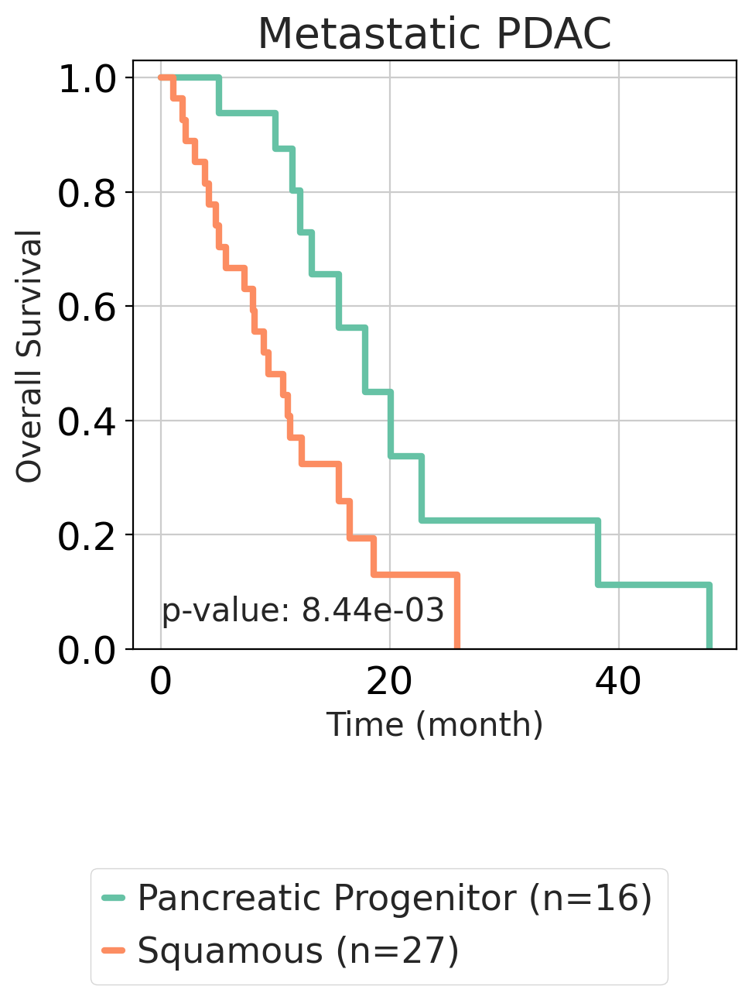

'8.44e-03'

In [646]:
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
order = ['Pancreatic Progenitor','Squamous']
km_plot2(df_info=SNU_annot, category='Bailey P/S', os='OS_F', event='OS_event', title='All PDAC', order=order)
km_plot2(df_info=SNU_annot_L, category='Bailey P/S', os='OS_F', event='OS_event', title='Localized PDAC', order=order)
km_plot2(df_info=SNU_annot_M, category='Bailey P/S', os='OS_F', event='OS_event', title='Metastatic PDAC', order=order)


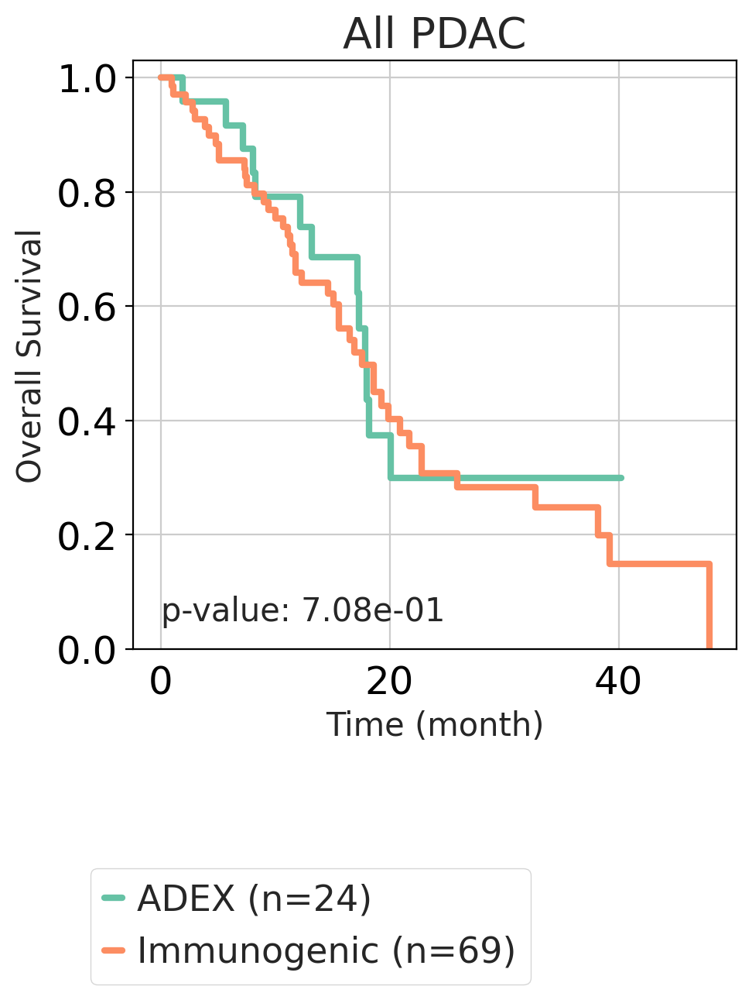

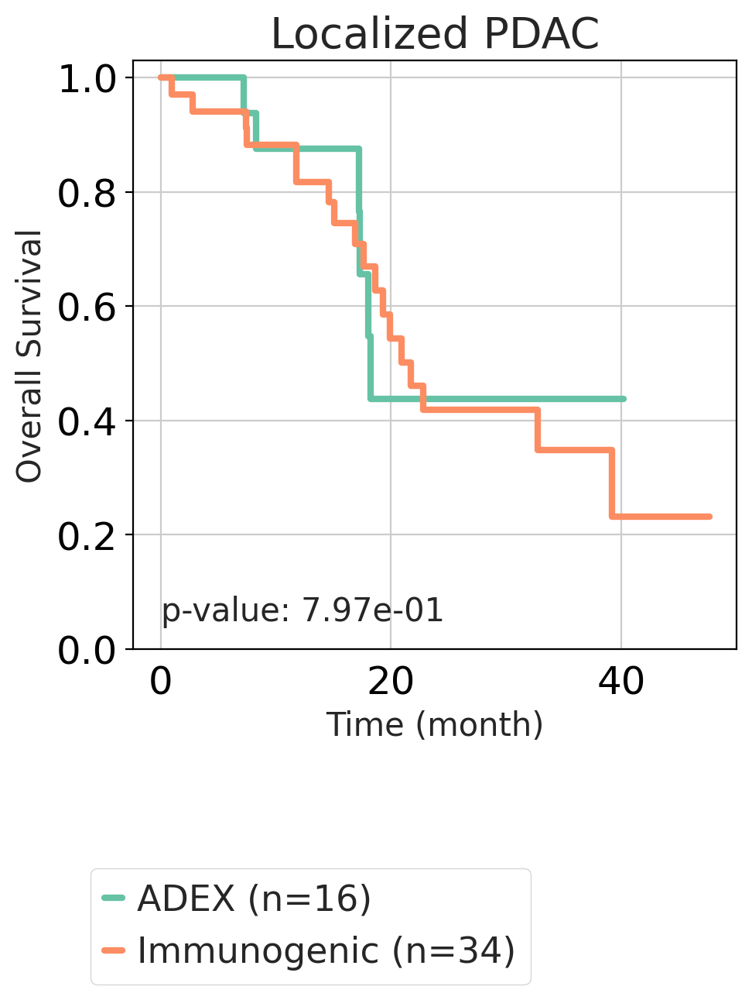

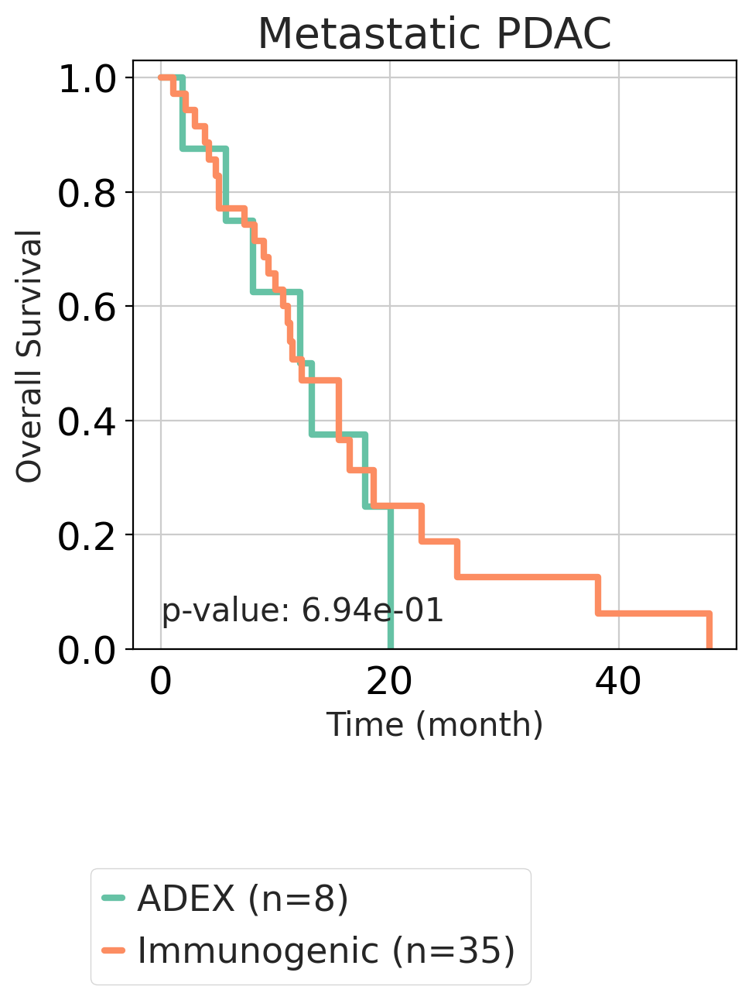

'6.94e-01'

In [647]:
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
order = ['ADEX','Immunogenic']
km_plot2(df_info=SNU_annot, category='Bailey A/I', os='OS_F', event='OS_event', title='All PDAC', order=order)
km_plot2(df_info=SNU_annot_L, category='Bailey A/I', os='OS_F', event='OS_event', title='Localized PDAC', order=order)
km_plot2(df_info=SNU_annot_M, category='Bailey A/I', os='OS_F', event='OS_event', title='Metastatic PDAC', order=order)


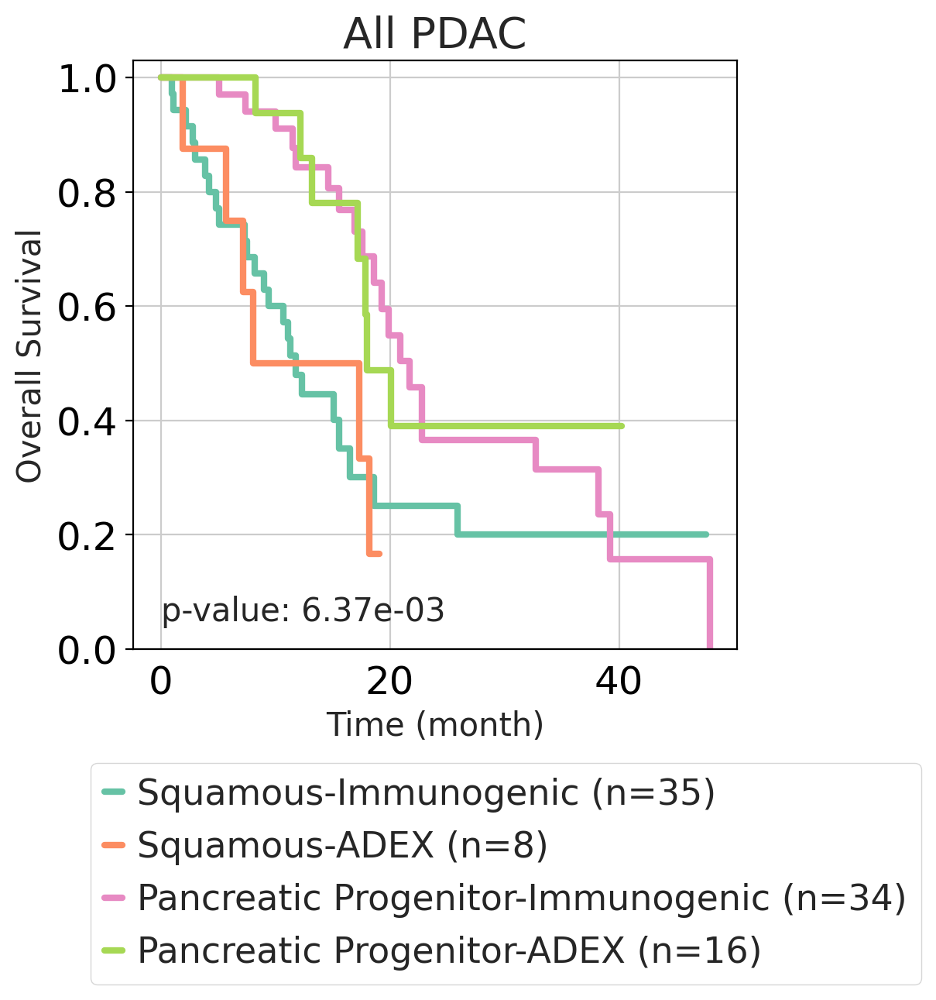

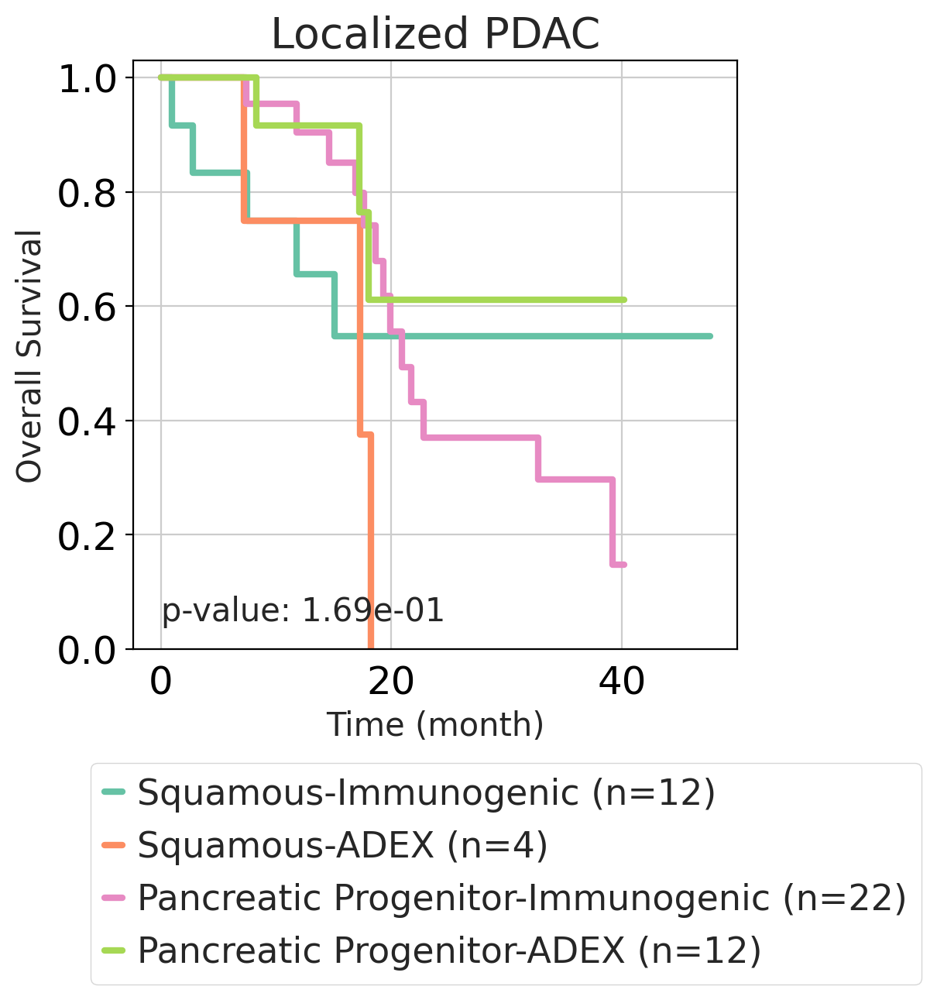

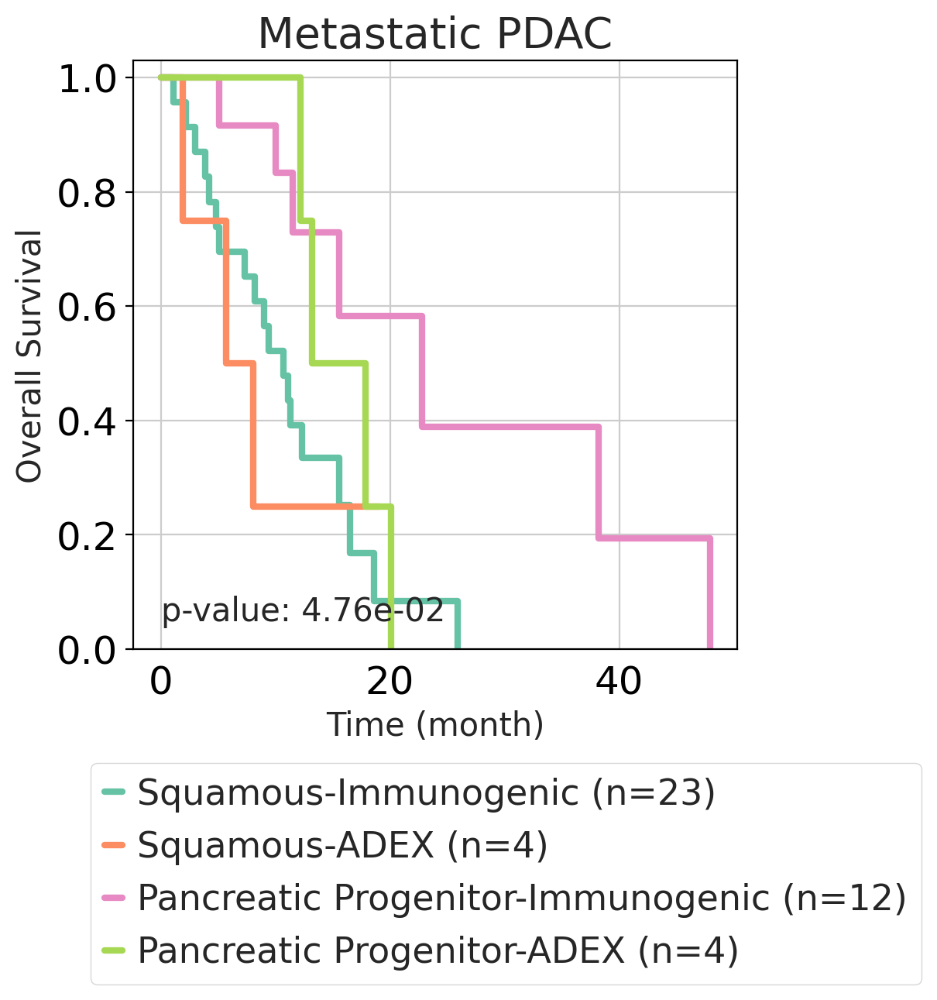

'4.76e-02'

In [648]:
SNU_annot['Bailey_Mixed'] = SNU_annot['Bailey P/S'].astype(str) + '-' + SNU_annot['Bailey A/I'].astype(str)
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)
order = ['Squamous-Immunogenic','Squamous-ADEX','Pancreatic Progenitor-Immunogenic','Pancreatic Progenitor-ADEX']
km_plot2(df_info=SNU_annot, category='Bailey_Mixed', os='OS_F', event='OS_event', title='All PDAC', order=order, )
km_plot2(df_info=SNU_annot_L, category='Bailey_Mixed', os='OS_F', event='OS_event', title='Localized PDAC', order=order, )
km_plot2(df_info=SNU_annot_M, category='Bailey_Mixed', os='OS_F', event='OS_event', title='Metastatic PDAC', order=order)


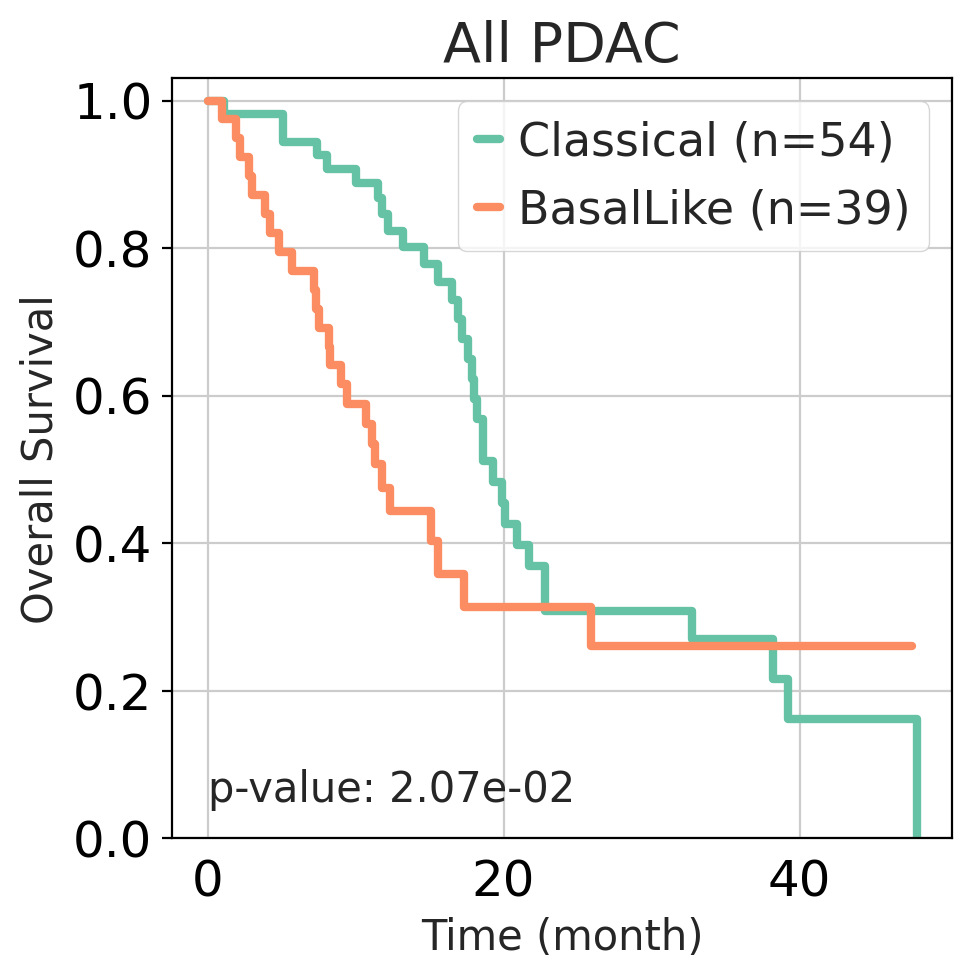

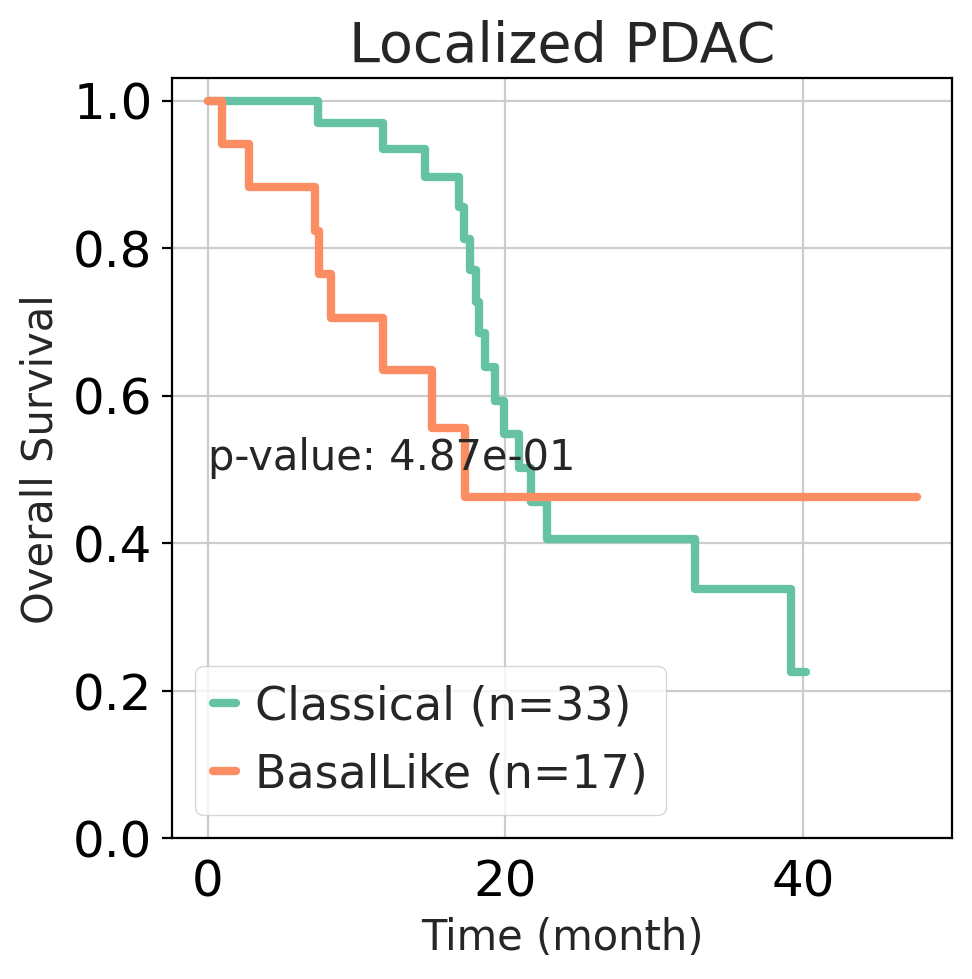

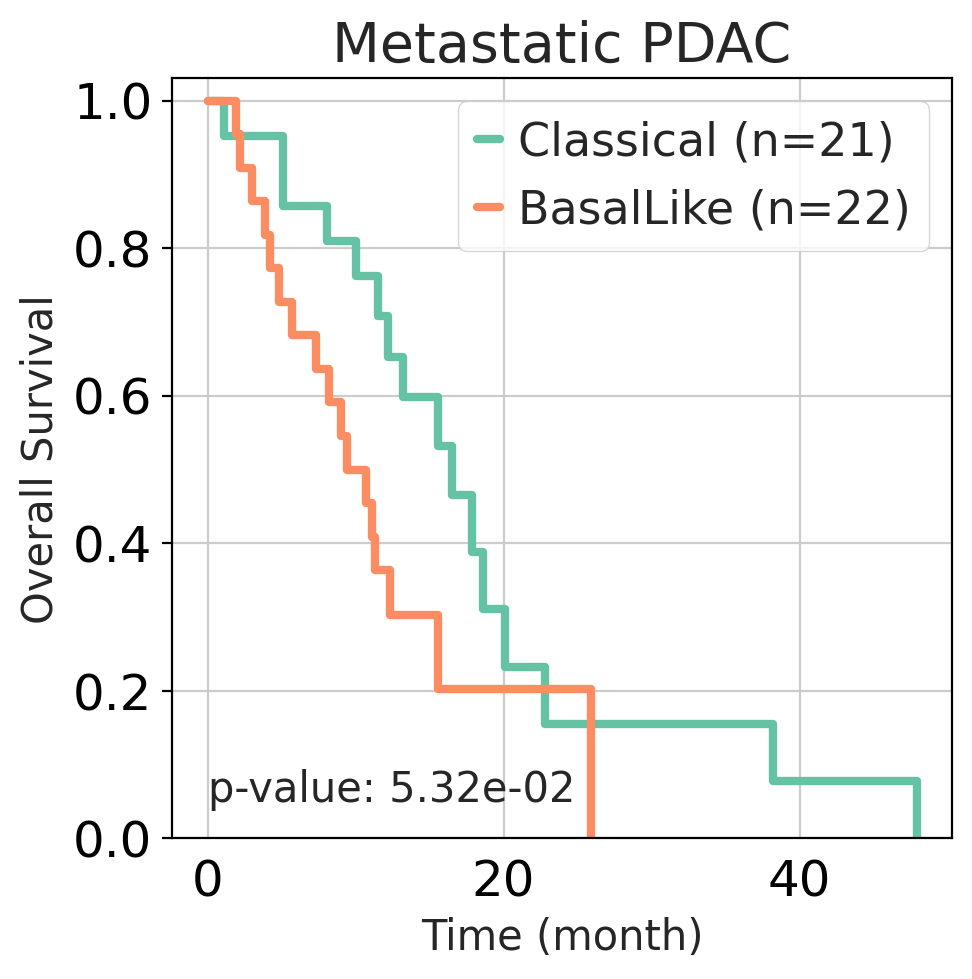

'5.32e-02'

In [649]:
sc.settings.set_figure_params(dpi=100, figsize=(5,5), fontsize=18)

order = ['Classical', 'BasalLike']
km_plot(df_info=SNU_annot, category='Moffitt Subtype', os='OS_F', event='OS_event', title='All PDAC', order=order)
km_plot(df_info=SNU_annot_L, category='Moffitt Subtype', os='OS_F', event='OS_event', title='Localized PDAC', order=order,Pos=[0,0.5])
km_plot(df_info=SNU_annot_M, category='Moffitt Subtype', os='OS_F', event='OS_event', title='Metastatic PDAC', order=order)

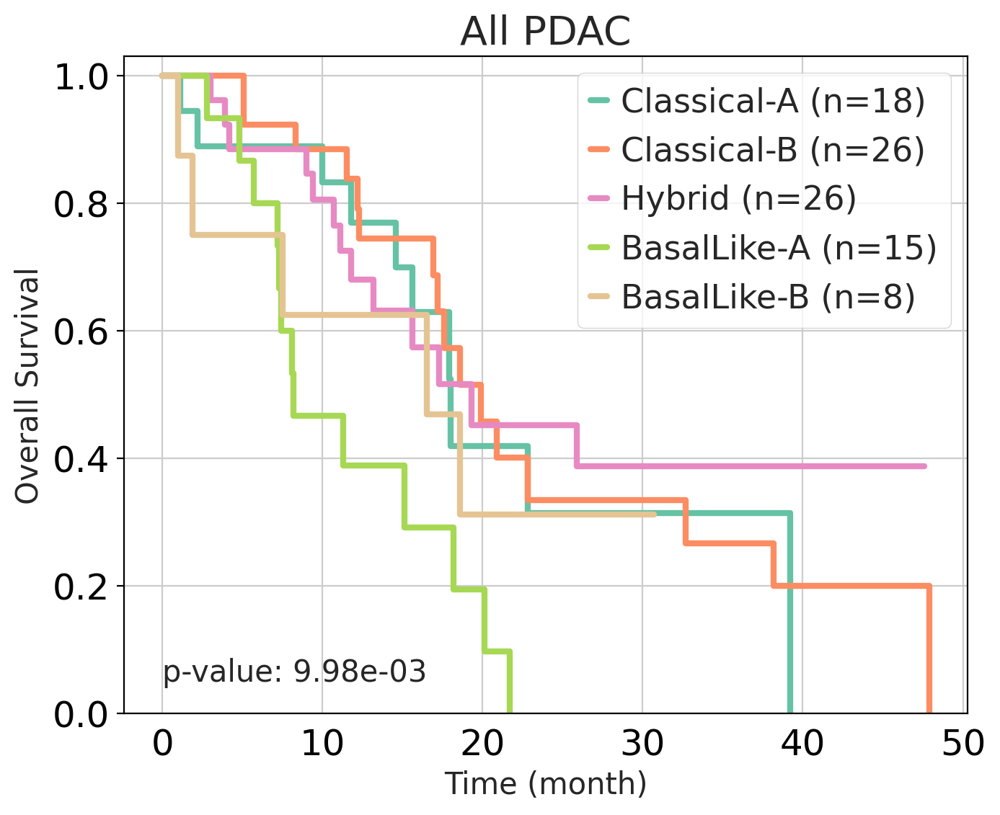

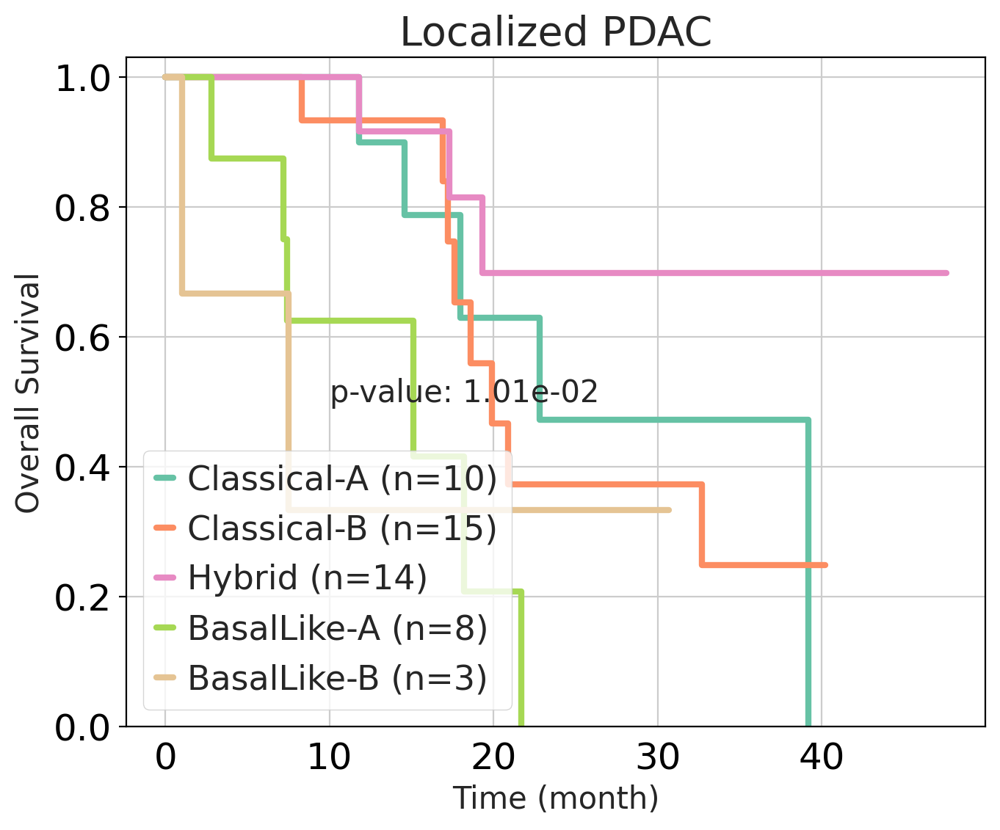

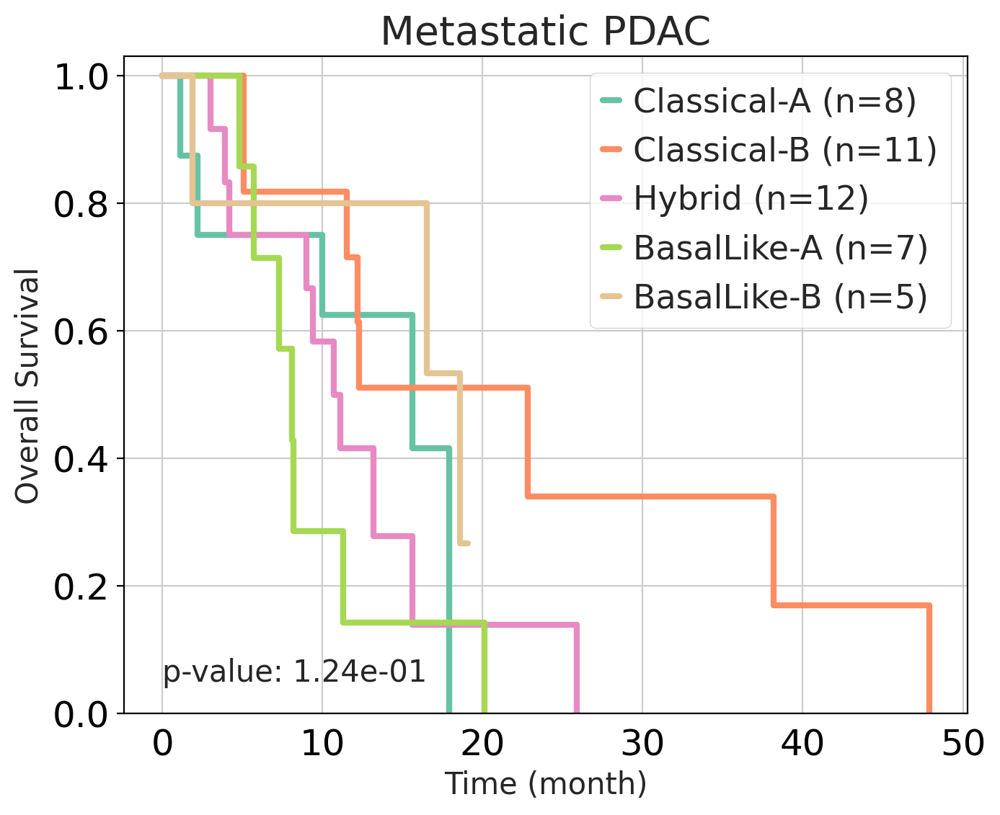

'1.24e-01'

In [650]:
sc.settings.set_figure_params(dpi=100, figsize=(7.5,6), fontsize=18)
order = ['Classical-A','Classical-B','Hybrid','BasalLike-A','BasalLike-B']
km_plot(df_info=SNU_annot, category='Chan-Seng-Yue Subtype', os='OS_F', event='OS_event', title='All PDAC', order=order)
km_plot(df_info=SNU_annot_L, category='Chan-Seng-Yue Subtype', os='OS_F', event='OS_event', title='Localized PDAC', order=order, Pos=[10,0.5])
km_plot(df_info=SNU_annot_M, category='Chan-Seng-Yue Subtype', os='OS_F', event='OS_event', title='Metastatic PDAC', order=order)

# Bailey Data Final subtype

In [669]:
len(features)

161

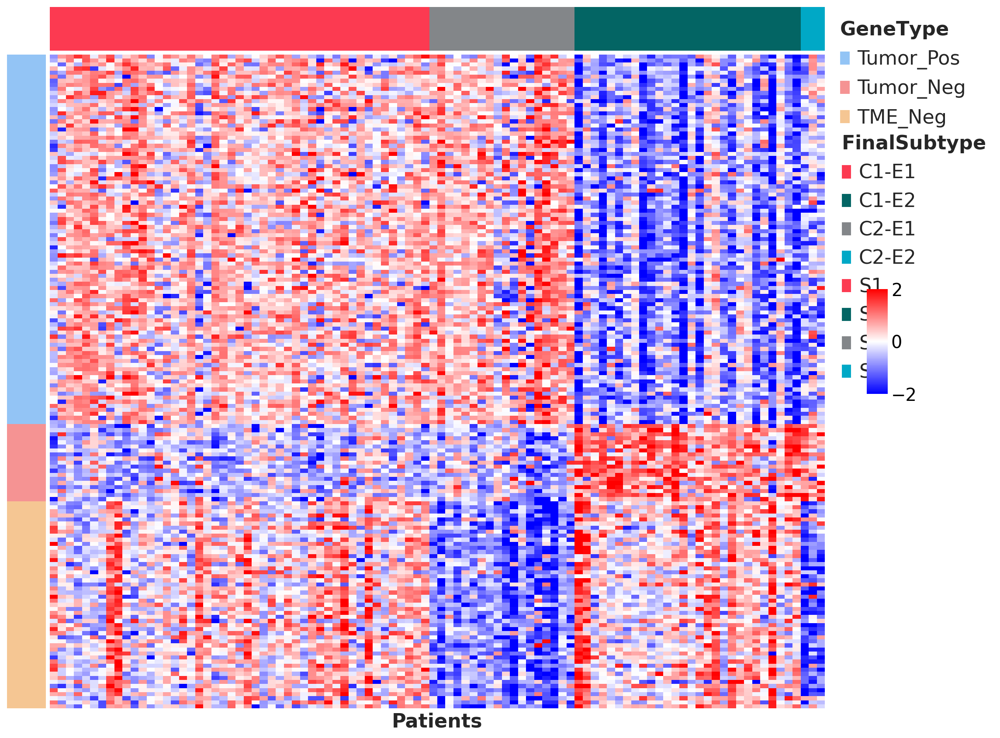

In [386]:
annot = Bailey_annot.sort_values(by='Final Subtype')



order = list(annot.index)
exp = Bailey_adata[:,features].to_df()
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T

final_int_map = dict(zip(annot['Final Subtype'].unique(),range(annot['Final Subtype'].nunique())))
genetype_int_map = dict(zip(table_genes['Type'].unique(),range(table_genes['Type'].nunique())))


final = annot['Final Subtype'].map(final_int_map).to_frame('Final Subtype').T.astype(float)
genetype = table_genes['Type'].map(genetype_int_map).to_frame('GeneType')




fig = plt.figure(figsize=(15, 15), dpi= 80)
widths = [1,20]
heights = [1,1,1,15]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.02, wspace=0.01, width_ratios=widths, height_ratios=heights)


ax = fig.add_subplot(gs[3, 0])
sns.heatmap(genetype, cmap=list(genetype_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=genetype_lut[name]) for name in genetype_lut]
ax_legend = ax.legend(handles, genetype_lut, bbox_to_anchor=(25.2, 1.08), frameon=False, 
                              fontsize=20, markerscale=4)
ax_legend.set_title('$\\bf{GeneType}$',prop={'size':20})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_yticks([])
ax.margins(0)


# ax0 = fig.add_subplot(gs[0, 1])
# sns.heatmap(tme, cmap=list(tme_lut.values()), cbar=False, ax=ax0)
# handles = [mpatches.Patch(facecolor=tme_lut[name]) for name in tme_lut]
# ax0_legend = ax0.legend(handles, tme_lut, bbox_to_anchor=(1.22, 1.5), frameon=False, 
#                               fontsize=20, markerscale=4)
# ax0_legend.set_title('$\\bf{TMESubtype}$',prop={'size':20})
# ax0_legend._legend_box.align = "left"
# ax0.set_xticks([])
# ax0.set_xlabel('')
# ax0.set_yticklabels('')
# ax0.margins(0)

# ax1 = fig.add_subplot(gs[1, 1])
# sns.heatmap(tumor, cmap=list(tumor_lut.values()), cbar=False, ax=ax1)
# handles = [mpatches.Patch(facecolor=tumor_lut[name]) for name in tumor_lut]
# ax1_legend = ax1.legend(handles, tumor_lut, bbox_to_anchor=(1.25, .8), frameon=False, 
#                               fontsize=20, markerscale=4)
# ax1_legend.set_title('$\\bf{TumorSubtype}$',prop={'size':20})
# ax1_legend._legend_box.align = "left"
# ax1.set_xticks([])
# ax1.set_xlabel('')
# ax1.set_yticklabels('')
# ax1.margins(0)

ax2 = fig.add_subplot(gs[2, 1])
sns.heatmap(final, cmap=list(final_lut.values()), cbar=False, ax=ax2)
handles = [mpatches.Patch(facecolor=final_lut[name]) for name in final_lut]
ax2_legend = ax2.legend(handles, final_lut, bbox_to_anchor=(1.23, -1.5), frameon=False, 
                              fontsize=20, markerscale=4)
ax2_legend.set_title('$\\bf{FinalSubtype}$',prop={'size':20})
ax2_legend._legend_box.align = "left"
ax2.set_xticks([])
ax2.set_xlabel('')
ax2.set_yticklabels('')
ax2.set_yticks([])
ax2.margins(0)


cbar_ax = fig.add_axes([1.0, 0.45, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)
ax3 = fig.add_subplot(gs[3, 1])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax3, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax3.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax3.set_xticks([])
ax3.set_xlabel('Patients', fontsize=20, fontdict=dict(weight='bold'))
#ax3.set_ylabel('Genes', fontsize=20, fontdict=dict(weight='bold'))
plt.show()


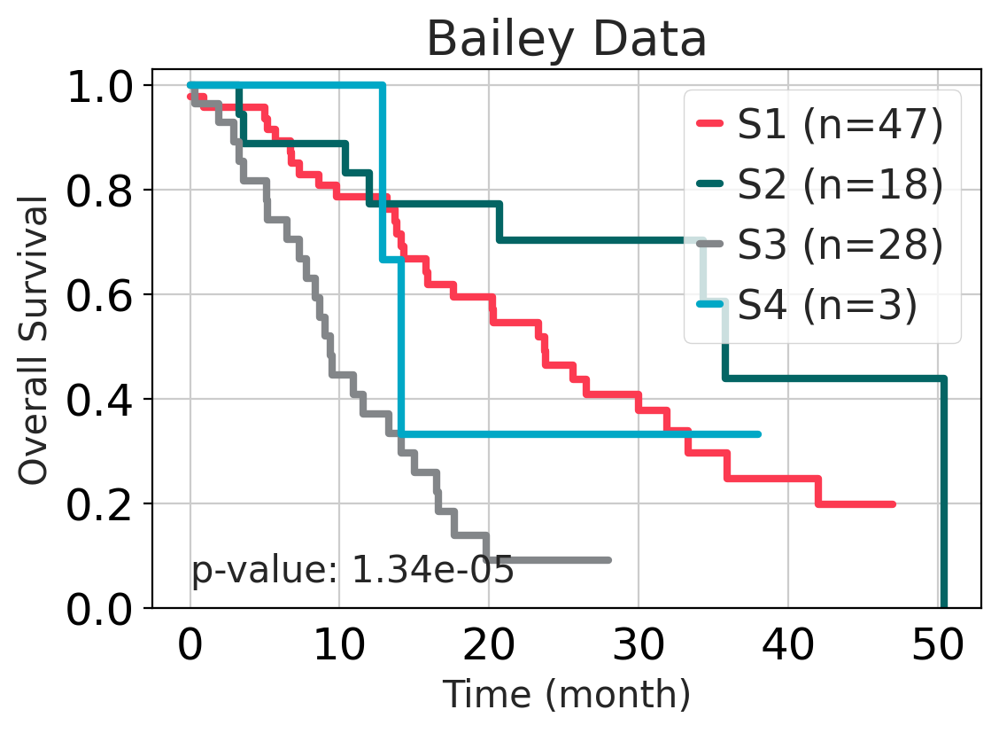

'1.34e-05'

In [398]:
sc.settings.set_figure_params(dpi=100, figsize=(6,4), fontsize=18)
color = ['#FC3A51', '#036564', '#838689', '#00A8C6']
order=['S1', 'S2', 'S3', 'S4']
Bailey_annot = Bailey_adata.obs.copy()
Bailey_annot['Final Subtype'] = Bailey_annot['Final Subtype'].map(repl_dict)

km_plot(df_info=Bailey_annot, category='Final Subtype', os='OS_F', event='OS_event', title='Bailey Data', order=order, color=color)

# TCGA Data Final Subtype

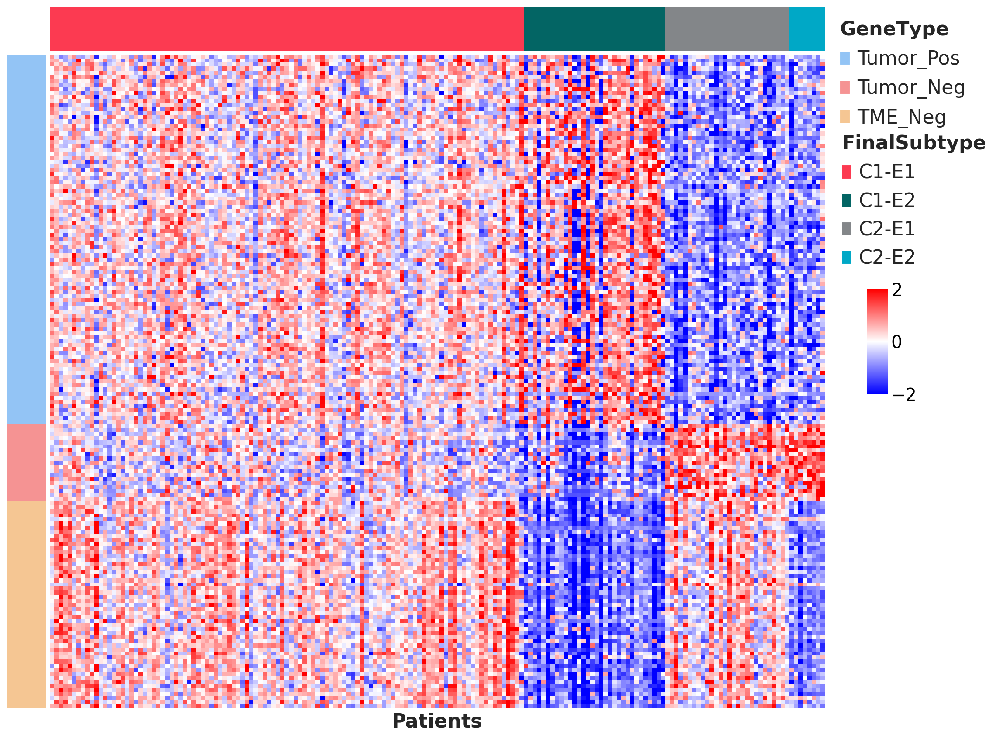

In [673]:
annot = TCGA_annot.sort_values(by='Final Subtype')
order = list(annot.index)
exp = TCGA_adata[:,features].to_df()
scaled_df = pd.DataFrame(scaler.fit_transform(exp), columns=exp.columns, index=exp.index).loc[order,:].T

final_int_map = dict(zip(annot['Final Subtype'].unique(),range(annot['Final Subtype'].nunique())))
genetype_int_map = dict(zip(table_genes['Type'].unique(),range(table_genes['Type'].nunique())))


final = annot['Final Subtype'].map(final_int_map).to_frame('Final Subtype').T.astype(float)
genetype = table_genes['Type'].map(genetype_int_map).to_frame('GeneType')


fig = plt.figure(figsize=(15, 15), dpi= 80)
widths = [1,20]
heights = [1,1,1,15]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.02, wspace=0.01, width_ratios=widths, height_ratios=heights)


ax = fig.add_subplot(gs[3, 0])
sns.heatmap(genetype, cmap=list(genetype_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=genetype_lut[name]) for name in genetype_lut]
ax_legend = ax.legend(handles, genetype_lut, bbox_to_anchor=(25.2, 1.08), frameon=False, 
                              fontsize=20, markerscale=4)
ax_legend.set_title('$\\bf{GeneType}$',prop={'size':20})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_yticks([])
ax.margins(0)

ax2 = fig.add_subplot(gs[2, 1])
sns.heatmap(final, cmap=list(final_lut.values()), cbar=False, ax=ax2)
handles = [mpatches.Patch(facecolor=final_lut[name]) for name in final_lut]
ax2_legend = ax2.legend(handles, final_lut, bbox_to_anchor=(1.23, -1.5), frameon=False, 
                              fontsize=20, markerscale=4)
ax2_legend.set_title('$\\bf{FinalSubtype}$',prop={'size':20})
ax2_legend._legend_box.align = "left"
ax2.set_xticks([])
ax2.set_xlabel('')
ax2.set_yticklabels('')
ax2.set_yticks([])
ax2.margins(0)


cbar_ax = fig.add_axes([1.0, 0.45, 0.02, 0.1], frameon=False, xticklabels=[], yticklabels=[])
cbar_ax.tick_params(axis=u'both', which=u'both',length=0)
ax3 = fig.add_subplot(gs[3, 1])
sns.heatmap(scaled_df, cmap='bwr', vmin=-2, vmax=2, ax=ax3, cbar_kws = dict(use_gridspec=True), cbar_ax=cbar_ax)
ax3.set_yticks([])
# cbar_legend = cbar_ax.legend(bbox_to_anchor=(4, 0), frameon=False, fontsize=18)
# cbar_legend.set_title('$\\bf{Gene  Expression}$',prop={'size':18})
ax3.set_xticks([])
ax3.set_xlabel('Patients', fontsize=20, fontdict=dict(weight='bold'))
ax3.set_ylabel('')
plt.show()


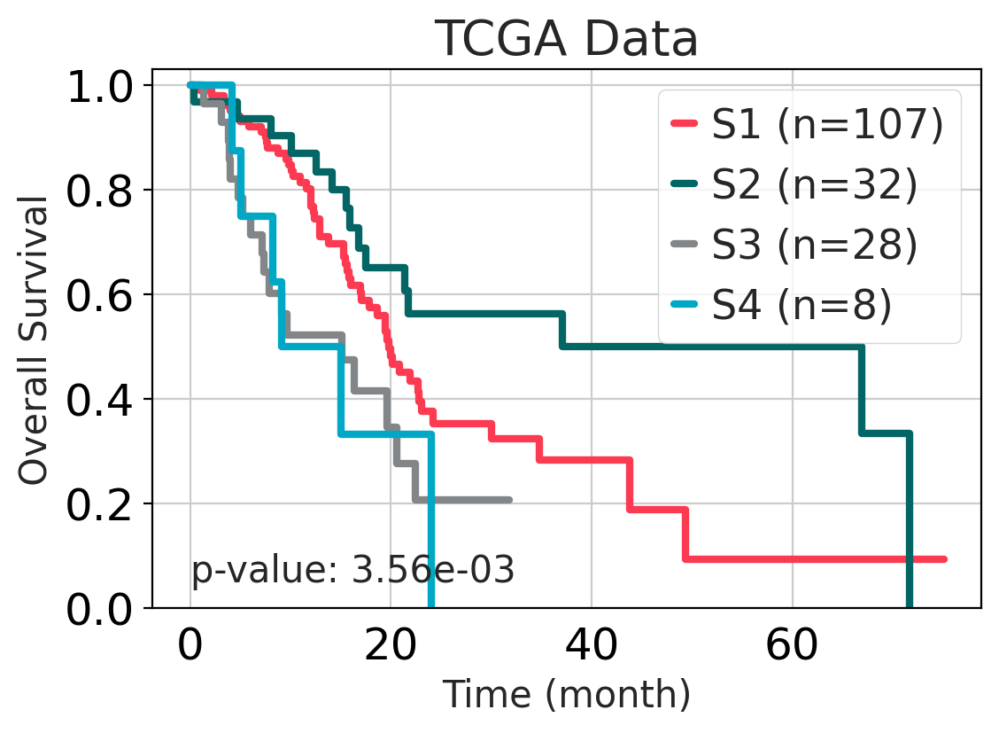

'3.56e-03'

In [399]:
sc.settings.set_figure_params(dpi=100, figsize=(6,4), fontsize=18)
color = ['#FC3A51', '#036564', '#838689', '#00A8C6']
order=['S1', 'S2', 'S3', 'S4']
TCGA_annot = TCGA_adata.obs.copy()
TCGA_annot['Final Subtype'] = TCGA_annot['Final Subtype'].map(repl_dict)
km_plot(df_info=TCGA_annot, category='Final Subtype', os='OS_F', event='OS_event', title='TCGA Data', order=order, color=color)

In [684]:
TCGA_annot.iloc[:5,100:120]

,TME Subtype,Final Subtype,Dataset,OS_event,OS_F
SAMPLE_ID,,,,,
TCGA-IB-AAUU-01,E1,C1-E1,TCGA,0,8.05
TCGA-H8-A6C1-01,E1,C1-E1,TCGA,0,22.04
TCGA-FB-AAPZ-01,E1,C1-E1,TCGA,0,23.52
TCGA-HZ-A9TJ-01,E2,C1-E2,TCGA,0,19.81
TCGA-HZ-A4BK-01,E1,C1-E1,TCGA,0,21.58


# Relationship between PDAC subtype and FOLFIRINOX response

In [656]:
annotation

,N0,PID,dateA,Snubh_BB,pathology_number,tumorcellularity(pathology),DNA_RNA,methylSeq,metagenomic,liquid_number,...,Tumor Subtype,TME Subtype,Moffitt Subtype,Bailey Subtype,Chan-Seng-Yue Subtype,Bailey P/S,Bailey A/I,Final Subtype,Dataset,Bailey_Mixed
Snubh_TB,,,,,,,,,,,,,,,,,,,,,
21-T00054_FT-01,NaN,13691820,2021-01-20,21-B00269_EB-04,S 210003105,45,DNA+RNA,NaN,NaN,R214,...,C1,E1,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,C1-E1,SNUBH,Pancreatic Progenitor-Immunogenic
21-T00875_FT-01,NaN,34956214,2021-11-01,NaN,S 210049507,60,RNA,NaN,NaN,NaN,...,C1,E1,Classical,Immunogenic,BasalLike-A,Squamous,Immunogenic,C1-E1,SNUBH,Squamous-Immunogenic
21-T01039_FT-01,NaN,35206741,2021-12-24,NaN,S 210058867,50,RNA,NaN,NaN,NaN,...,C1,E1,Classical,Pancreatic Progenitor,Classical-A,Pancreatic Progenitor,Immunogenic,C1-E1,SNUBH,Pancreatic Progenitor-Immunogenic
21-T00511_FT-01,NaN,17227694,2021-06-30,NaN,S 210029133,20,RNA,NaN,NaN,NaN,...,C1,E1,Classical,Pancreatic Progenitor,Classical-A,Pancreatic Progenitor,Immunogenic,C1-E1,SNUBH,Pancreatic Progenitor-Immunogenic
19-T00776_FO-01,sb2375,32183755,2019-12-30,19-B03158_EB-03,S 190062582,30,DNA+RNA,NaN,NaN,R124,...,C1,E1,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,C1-E1,SNUBH,Pancreatic Progenitor-Immunogenic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18-02904_FO-01,sb1904,30311136,2018-12-19,18-02904_EB-02,S 180058106,35,DNA+RNA,NaN,NaN,NaN,...,C2,E2,BasalLike,Squamous,Hybrid,Squamous,Immunogenic,C2-E2,SNUBH,Squamous-Immunogenic
20-T00360_FO-01,sb2088,22888938,2020-06-03,20-B01405_EB-03,S 200022294,55,DNA+RNA,NaN,NaN,NaN,...,C2,E2,BasalLike,Pancreatic Progenitor,Hybrid,Squamous,Immunogenic,C2-E2,SNUBH,Squamous-Immunogenic
19-T00668_FO-01,sb2353,31995784,2019-11-13,19-B02684_EB-03,S 190054508,35,DNA+RNA,NaN,NaN,R115,...,C2,E2,BasalLike,Squamous,BasalLike-A,Squamous,Immunogenic,C2-E2,SNUBH,Squamous-Immunogenic


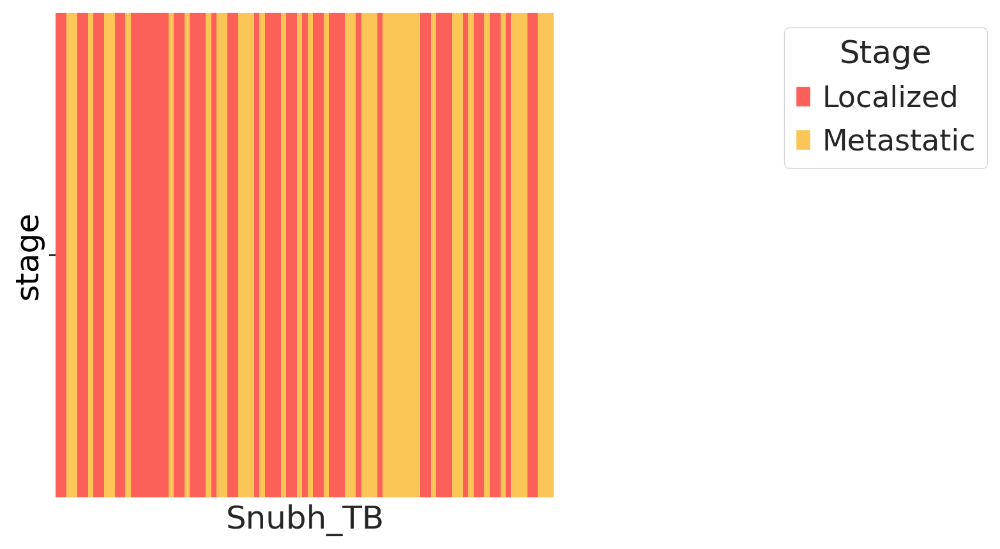

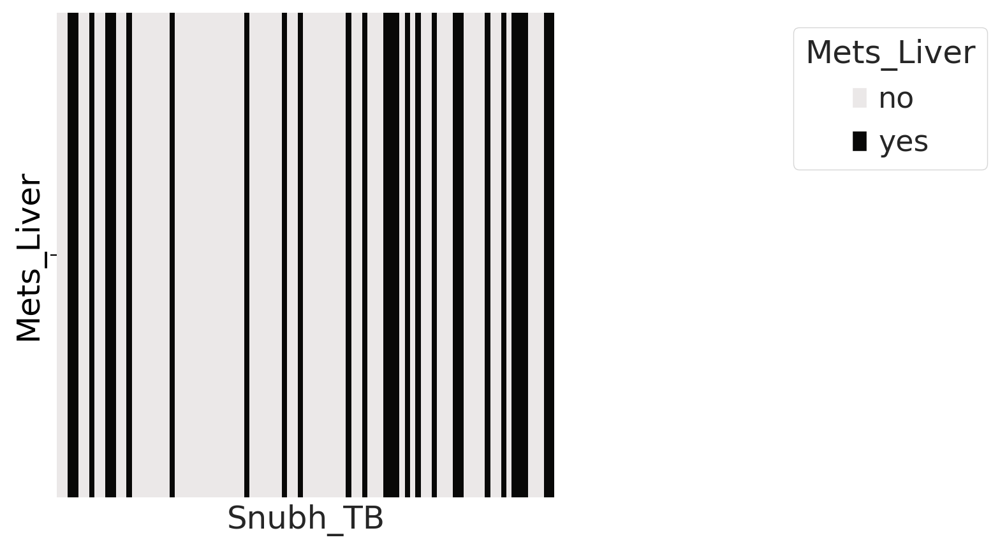

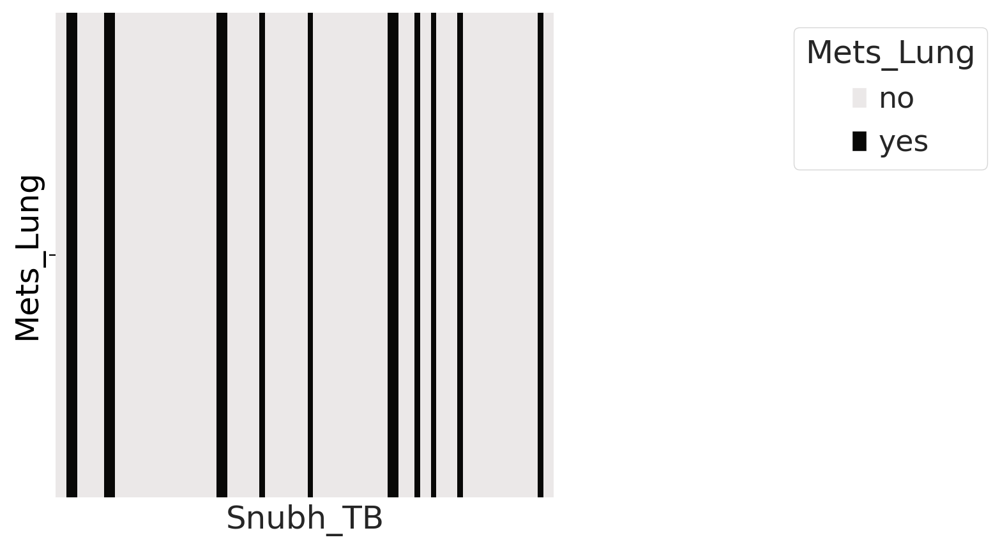

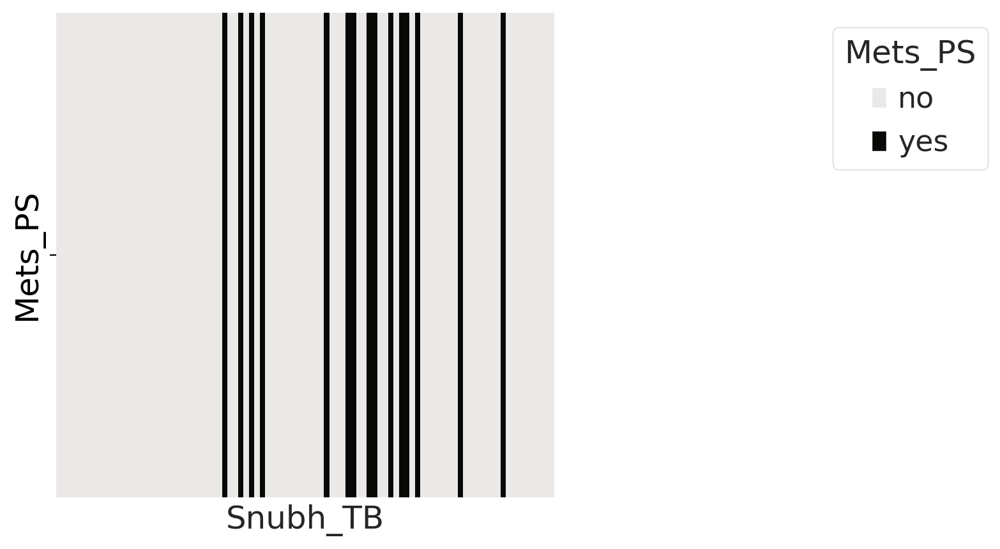

In [657]:
order = list(annotation.index)
with_stage = annotation.copy()
with_stage = with_stage.loc[order,:]
with_stage.loc[:,['Mets_liver_C','Mets_lung_C','Mets_PS_C']] = with_stage.loc[:,['Mets_liver_C','Mets_lung_C','Mets_PS_C']].astype(str)
with_stage = with_stage.replace('nan','no')

stage_map = dict(zip(with_stage['stage_C'].unique(),range(with_stage['stage_C'].nunique())))
stage_color = ['#fc6058','#fcc558']
stage_lut = dict(zip(with_stage['stage_C'].unique(), stage_color))
stage = with_stage['stage_C'].map(stage_map).astype(int).to_frame('stage').T
ax=sns.heatmap(stage, cmap=stage_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=stage_lut[name]) for name in stage_lut]
ax.legend(handles4, stage_lut, title='Stage',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

liver_map = dict(zip(with_stage['Mets_liver_C'].unique(),range(with_stage['Mets_liver_C'].nunique())))
liver_color = ['#ebe8e8','#080807']
liver_lut = dict(zip(with_stage['Mets_liver_C'].unique(), liver_color))
liver_lut
liver = with_stage['Mets_liver_C'].map(liver_map).astype(int).to_frame('Mets_Liver').T
ax=sns.heatmap(liver, cmap=liver_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=liver_lut[name]) for name in liver_lut]
ax.legend(handles4, liver_lut, title='Mets_Liver',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

lung_map = dict(zip(with_stage['Mets_lung_C'].unique(),range(with_stage['Mets_lung_C'].nunique())))
lung_color = ['#ebe8e8','#080807']
lung_lut = dict(zip(with_stage['Mets_lung_C'].unique(), lung_color))

lung = with_stage['Mets_lung_C'].map(lung_map).astype(int).to_frame('Mets_Lung').T
ax=sns.heatmap(lung, cmap=lung_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=lung_lut[name]) for name in lung_lut]
ax.legend(handles4, lung_lut, title='Mets_Lung',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

ps_map = dict(zip(with_stage['Mets_PS_C'].unique(),range(with_stage['Mets_PS_C'].nunique())))
ps_color = ['#ebe8e8','#080807']
ps_lut = dict(zip(with_stage['Mets_PS_C'].unique(), ps_color))

ps = with_stage['Mets_PS_C'].map(ps_map).astype(int).to_frame('Mets_PS').T
ax=sns.heatmap(ps, cmap=ps_color, cbar=False)
handles4 = [mpatches.Patch(facecolor=ps_lut[name]) for name in ps_lut]
ax.legend(handles4, ps_lut, title='Mets_PS',
           bbox_to_anchor=(1.9, 1))
ax.set_xticks([])
plt.show()

In [658]:
FFX.iloc[0,:].value_counts()

3.0    47
1.0    21
2.0    18
0.0     7
Name: FFX, dtype: int64

In [317]:
FFX_lut

{'PR': '#2e1dcc', 'PD': '#b52b0b', 'NA': '#ebe8e8', 'SD': '#52dec9'}

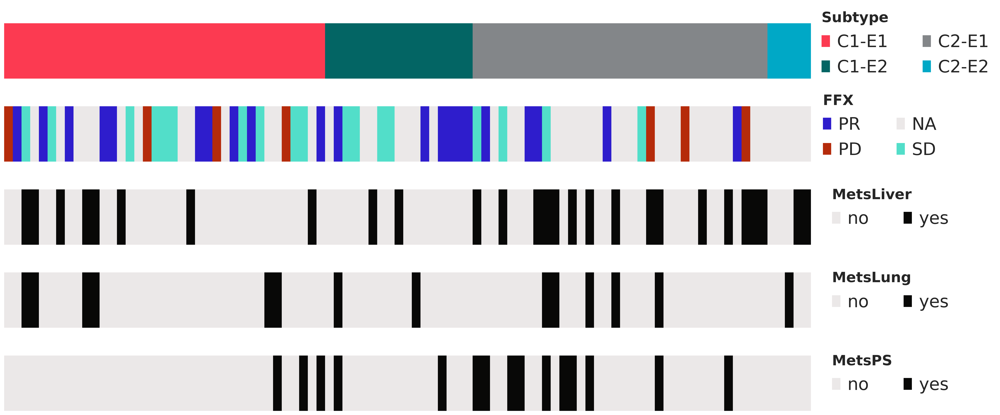

In [660]:
fig = plt.figure(figsize=(25, 15), dpi= 150)
widths = [1]
heights = [1,1,1,1,1,1]
gs = GridSpec(nrows=len(heights), ncols=len(widths), hspace=0.5, wspace=0.01, width_ratios=widths, height_ratios=heights)


ax = fig.add_subplot(gs[1, 0])
cmap = [FFX_lut[key] for key in list(FFX_map.keys())]
sns.heatmap(FFX, cmap=cmap, cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=FFX_lut[name]) for name in FFX_lut.keys()]
ax_legend = ax.legend(handles, FFX_lut, 
                      bbox_to_anchor=(1.175, 1.5), frameon=False, 
                              fontsize=30, markerscale=2, ncol=2, labelspacing=0.5, )
ax_legend.set_title('$\\bf{FFX}$',prop={'size':25})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels('')
ax.set_yticks([])
#ax.set_ylabel('FFX',fontdict={'fontsize':25,'weight':'bold'})
ax.margins(0)

final_int_map = dict(zip(annotation['Final Subtype'].unique(),range(annotation['Final Subtype'].nunique())))
final = annotation['Final Subtype'].map(final_int_map).to_frame('Final Subtype').T.astype(float)
ax = fig.add_subplot(gs[0, 0])
sns.heatmap(final, cmap=list(final_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=final_lut[name]) for name in final_lut]
ax_legend = ax.legend(handles, final_lut, bbox_to_anchor=(1.24, 1.5),
                              fontsize=30, markerscale=2, frameon=False, ncol=2)
ax_legend.set_title('$\\bf{Subtype}$',prop={'size':25})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels([])
ax.set_ylabel('')
ax.set_yticks([])
ax.margins(0)

# ax = fig.add_subplot(gs[2, 0])
# sns.heatmap(stage, cmap=list(stage_lut.values()), cbar=False, ax=ax)
# handles = [mpatches.Patch(facecolor=stage_lut[name]) for name in stage_lut]
# ax_legend = ax.legend(handles, stage_lut, bbox_to_anchor=(1.17, 1.5),
#                               fontsize=30, markerscale=2, frameon=False, ncol=1)
# ax_legend.set_title('$\\bf{Stage}$',prop={'size':25})
# ax_legend._legend_box.align = "left"
# ax.set_xticks([])
# ax.set_xlabel('')
# ax.set_yticklabels([])
# ax.margins(0)

ax = fig.add_subplot(gs[2, 0])
sns.heatmap(liver, cmap=list(liver_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=liver_lut[name]) for name in liver_lut]
ax_legend = ax.legend(handles, liver_lut, bbox_to_anchor=(1.19, 1.3),
                              fontsize=30, markerscale=2, frameon=False, ncol=2)
ax_legend.set_title('$\\bf{MetsLiver}$',prop={'size':25})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels([])
ax.set_ylabel('')
ax.set_yticks([])
ax.margins(0)

ax = fig.add_subplot(gs[3, 0])
sns.heatmap(lung, cmap=list(lung_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=lung_lut[name]) for name in lung_lut]
ax_legend = ax.legend(handles, lung_lut, bbox_to_anchor=(1.19, 1.3),
                              fontsize=30, markerscale=2, frameon=False, ncol=2)
ax_legend.set_title('$\\bf{MetsLung}$',prop={'size':25})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels([])
ax.set_ylabel('')
ax.set_yticks([])
ax.margins(0)

ax = fig.add_subplot(gs[4, 0])
sns.heatmap(ps, cmap=list(ps_lut.values()), cbar=False, ax=ax)
handles = [mpatches.Patch(facecolor=ps_lut[name]) for name in ps_lut]
ax_legend = ax.legend(handles, ps_lut, bbox_to_anchor=(1.19, 1.3),
                              fontsize=30, markerscale=2, frameon=False, ncol=2)
ax_legend.set_title('$\\bf{MetsPS}$',prop={'size':25})
ax_legend._legend_box.align = "left"
ax.set_xticks([])
ax.set_xlabel('')
ax.set_yticklabels([])
ax.set_ylabel('')
ax.set_yticks([])
ax.margins(0)

plt.show()

In [318]:
GNP_dict = dict()
GNP_dict['1.0'] = 'PR'
GNP_dict['2.0'] = 'PD'
GNP_dict['3.0'] = 'SD'
GNP_dict['4.0'] = np.nan
GNP_dict['5.0'] = 'SD'
GNP_dict['6.0'] = 'SD'
annotation['CTx_response_GNP_1L'] = annotation['CTx_response_GNP_1L'].astype(str).map(GNP_dict)

In [326]:
annotation['Final Subtype'] = annotation['Final Subtype'].map(repl_dict)
annotation


,N0,PID,dateA,Snubh_BB,pathology_number,tumorcellularity(pathology),DNA_RNA,methylSeq,metagenomic,liquid_number,...,Tumor Subtype,TME Subtype,Moffitt Subtype,Bailey Subtype,Chan-Seng-Yue Subtype,Bailey P/S,Bailey A/I,Final Subtype,Dataset,Bailey_Mixed
Snubh_TB,,,,,,,,,,,,,,,,,,,,,
21-T00054_FT-01,NaN,13691820,2021-01-20,21-B00269_EB-04,S 210003105,45,DNA+RNA,NaN,NaN,R214,...,C1,E1,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,S1,SNUBH,Pancreatic Progenitor-Immunogenic
21-T00875_FT-01,NaN,34956214,2021-11-01,NaN,S 210049507,60,RNA,NaN,NaN,NaN,...,C1,E1,Classical,Immunogenic,BasalLike-A,Squamous,Immunogenic,S1,SNUBH,Squamous-Immunogenic
21-T01039_FT-01,NaN,35206741,2021-12-24,NaN,S 210058867,50,RNA,NaN,NaN,NaN,...,C1,E1,Classical,Pancreatic Progenitor,Classical-A,Pancreatic Progenitor,Immunogenic,S1,SNUBH,Pancreatic Progenitor-Immunogenic
21-T00511_FT-01,NaN,17227694,2021-06-30,NaN,S 210029133,20,RNA,NaN,NaN,NaN,...,C1,E1,Classical,Pancreatic Progenitor,Classical-A,Pancreatic Progenitor,Immunogenic,S1,SNUBH,Pancreatic Progenitor-Immunogenic
19-T00776_FO-01,sb2375,32183755,2019-12-30,19-B03158_EB-03,S 190062582,30,DNA+RNA,NaN,NaN,R124,...,C1,E1,Classical,Pancreatic Progenitor,Classical-B,Pancreatic Progenitor,Immunogenic,S1,SNUBH,Pancreatic Progenitor-Immunogenic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18-02904_FO-01,sb1904,30311136,2018-12-19,18-02904_EB-02,S 180058106,35,DNA+RNA,NaN,NaN,NaN,...,C2,E2,BasalLike,Squamous,Hybrid,Squamous,Immunogenic,S4,SNUBH,Squamous-Immunogenic
20-T00360_FO-01,sb2088,22888938,2020-06-03,20-B01405_EB-03,S 200022294,55,DNA+RNA,NaN,NaN,NaN,...,C2,E2,BasalLike,Pancreatic Progenitor,Hybrid,Squamous,Immunogenic,S4,SNUBH,Squamous-Immunogenic
19-T00668_FO-01,sb2353,31995784,2019-11-13,19-B02684_EB-03,S 190054508,35,DNA+RNA,NaN,NaN,R115,...,C2,E2,BasalLike,Squamous,BasalLike-A,Squamous,Immunogenic,S4,SNUBH,Squamous-Immunogenic


C1    54
C2    39
Name: Tumor Subtype, dtype: int64

Tumor Subtype  CTx_response_FFX
C1             PR                  16
               SD                  14
               PD                   4
C2             PR                   5
               SD                   4
               PD                   3
Name: CTx_response_FFX, dtype: int64


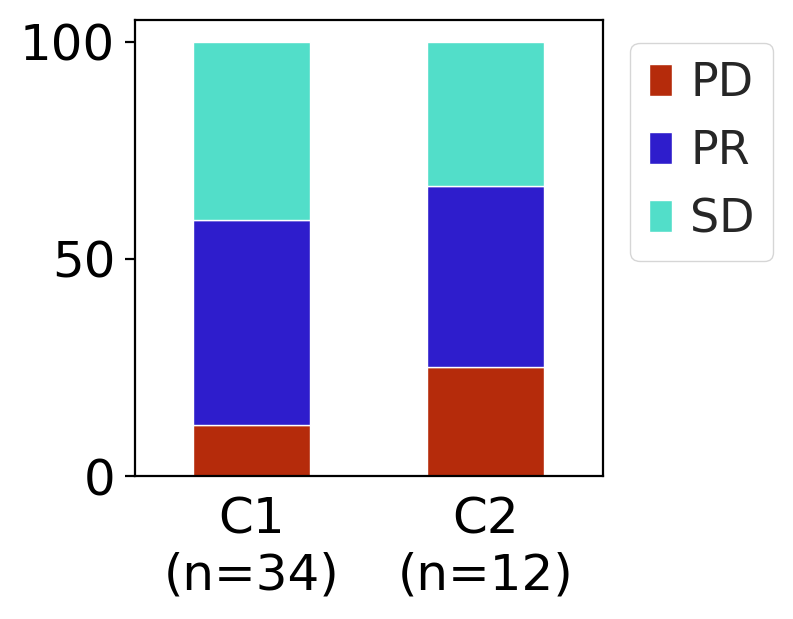

In [403]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_FFX'].value_counts())


g = annotation.groupby(target)['CTx_response_FFX'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_FFX')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_FFX'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

C1    54
C2    39
Name: Tumor Subtype, dtype: int64

Tumor Subtype  CTx_response_GNP_1L
C1             PR                     4
               SD                     2
C2             PR                     4
               PD                     2
               SD                     1
Name: CTx_response_GNP_1L, dtype: int64


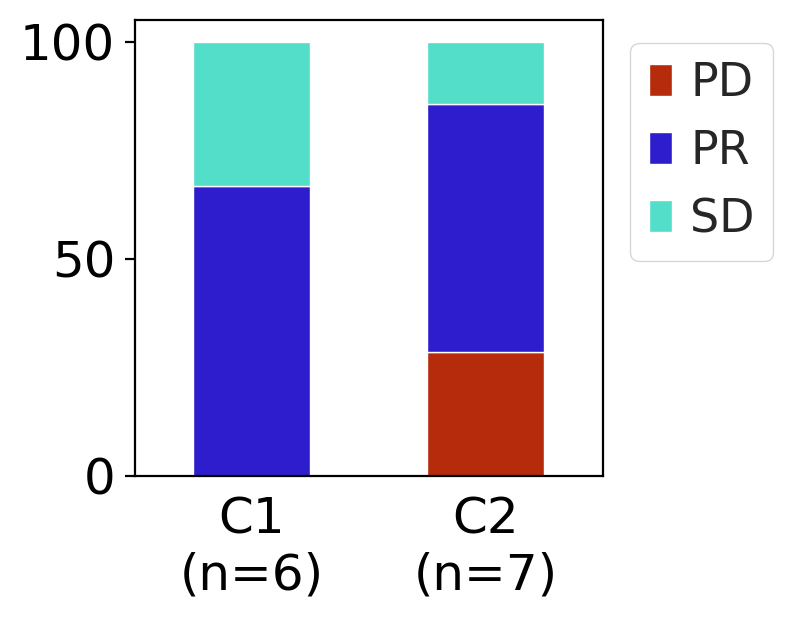

In [404]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_GNP_1L'].value_counts())
g = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_GNP_1L')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

E1    71
E2    22
Name: TME Subtype, dtype: int64

TME Subtype  CTx_response_FFX
E1           PR                  15
             SD                  14
             PD                   7
E2           PR                   6
             SD                   4
             PD                   0
Name: CTx_response_FFX, dtype: int64


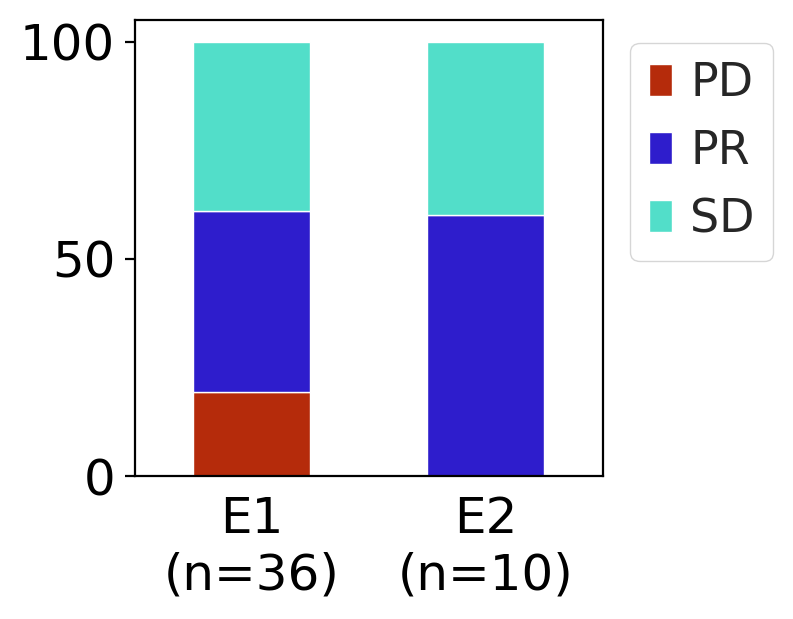

In [405]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_FFX'].value_counts())
g = annotation.groupby(target)['CTx_response_FFX'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_FFX')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_FFX'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

E1    71
E2    22
Name: TME Subtype, dtype: int64

TME Subtype  CTx_response_GNP_1L
E1           PR                     5
             PD                     2
             SD                     2
E2           PR                     3
             SD                     1
Name: CTx_response_GNP_1L, dtype: int64


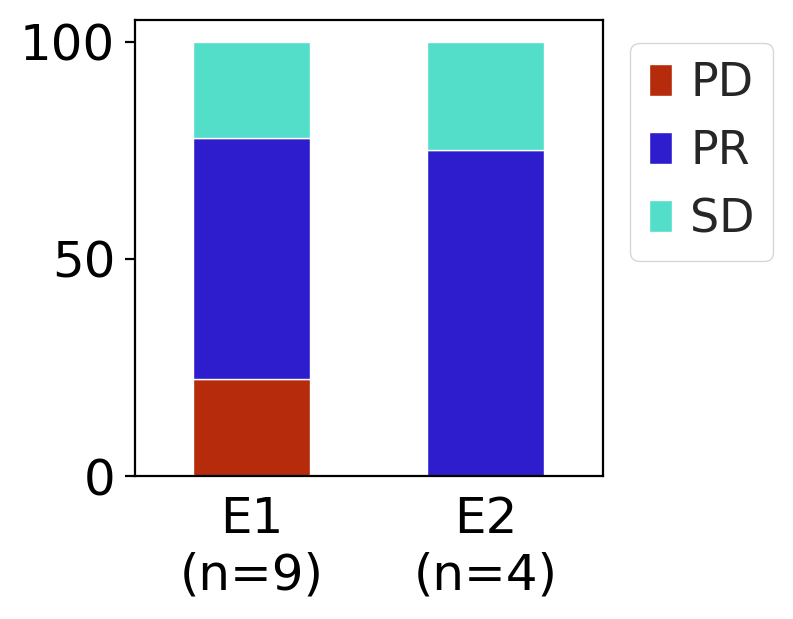

In [406]:
sc.settings.set_figure_params(dpi=100, figsize=(3,3), fontsize=18)
target = 'Tumor Subtype'
target = 'TME Subtype'
# target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_GNP_1L'].value_counts())
g = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_GNP_1L')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

S1    37
S3    34
S2    17
S4     5
Name: Final Subtype, dtype: int64

Final Subtype  CTx_response_FFX
S1             PR                  10
               SD                  10
               PD                   4
S2             PR                   6
               SD                   4
               PD                   0
S3             PR                   5
               SD                   4
               PD                   3
S4             PD                   0
               PR                   0
               SD                   0
Name: CTx_response_FFX, dtype: int64


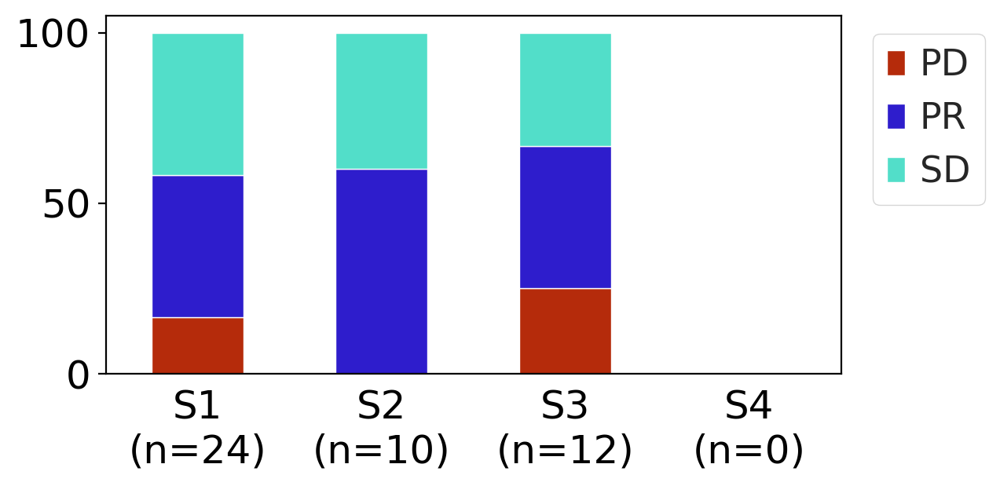

In [407]:
sc.settings.set_figure_params(dpi=100, figsize=(6,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_FFX'].value_counts())
g = annotation.groupby(target)['CTx_response_FFX'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_FFX')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_FFX'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.22,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

S1    37
S3    34
S2    17
S4     5
Name: Final Subtype, dtype: int64

Final Subtype  CTx_response_GNP_1L
S1             PR                     2
               SD                     1
S2             PR                     2
               SD                     1
S3             PR                     3
               PD                     2
               SD                     1
S4             PR                     1
Name: CTx_response_GNP_1L, dtype: int64


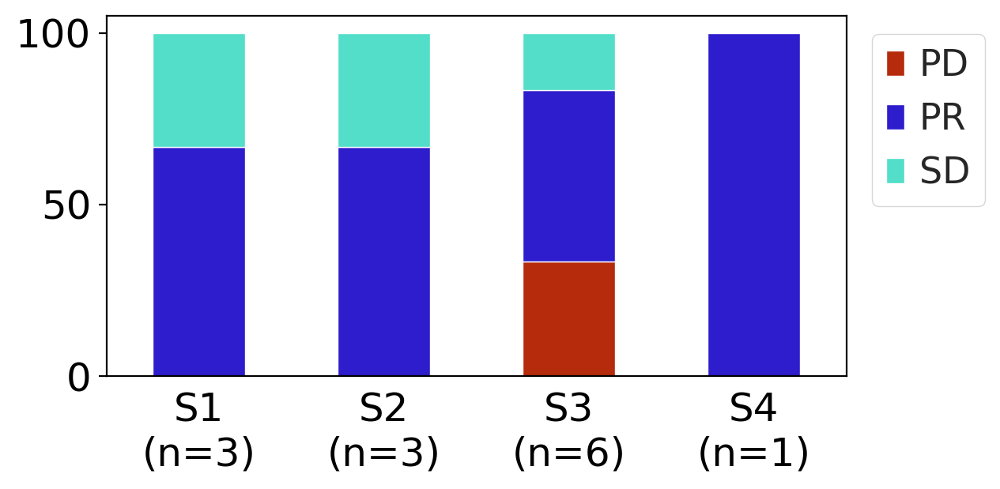

In [409]:
sc.settings.set_figure_params(dpi=100, figsize=(6,3), fontsize=18)
target = 'Tumor Subtype'
# target = 'TME Subtype'
target = 'Final Subtype'
print(annotation[target].value_counts())
print()
print( annotation.groupby(target)['CTx_response_GNP_1L'].value_counts())
g = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts()
g = g.reset_index(name='Count', level=1)
g = g.reset_index()
g = pd.pivot_table(g, values='Count',index=target, columns='CTx_response_GNP_1L')
g_pct = g.div(g.sum(axis=1), axis=0)*100
g_pct.columns = g_pct.columns.astype(str)

cnt_df = annotation.groupby(target)['CTx_response_GNP_1L'].value_counts().groupby(target).sum().to_frame(name='count')
g_pct = pd.concat([g_pct,cnt_df],axis=1)
g_pct[target] = ['{}\n(n={})'.format(i,g_pct.loc[i,'count']) for i in  g_pct.index]
g_pct.drop('count',axis=1,inplace=True)

ax = g_pct.plot(x=target, kind='bar', stacked=True, color=[FFX_lut.get(x) for x in g_pct.columns[:-1]])
ax.legend(bbox_to_anchor=(1.01,1))
plt.grid(False)
# plt.title('GSE154778 celltype proportion')
plt.xticks(rotation=0)
plt.xlabel('')
plt.show()

In [1]:
# sc.settings.set_figure_params(dpi=100, figsize=(5,7), fontsize=20)

# m = ~with_stage['CTx_response_FFX'].isna()
# with_stage_sel = with_stage[m]
# with_stage_sel


# sns.countplot(x='Tumor Subtype', hue='CTx_response_FFX', data=with_stage_sel, palette=FFX_lut)
# ct_table_ind=pd.crosstab(with_stage_sel['Tumor Subtype'],with_stage_sel['CTx_response_FFX'])    
# chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
# p_val="{:.2e}".format(p)
# print(ct_table_ind)
# print(p)
# plt.text(-0.4, 12, 'p-value: {}'.format(p_val), fontsize=20)
# #plt.title('{}/{}'.format('Tumor Subtype','FFX Response'))
# plt.title('')
# plt.xlabel('Tumor Subtype')
# plt.grid(False)
# plt.ylim((0,30))
# plt.show()

# sns.countplot(x='TME Subtype', hue='CTx_response_FFX', data=with_stage_sel, palette=FFX_lut)
# ct_table_ind=pd.crosstab(with_stage_sel['TME Subtype'],with_stage_sel['CTx_response_FFX'])    
# chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
# p_val="{:.2e}".format(p)
# print(ct_table_ind)
# print(p)
# plt.text(-0.4, 15, 'p-value: {}'.format(p_val), fontsize=20)
# #plt.title('{}/{}'.format('TME Subtype','FFX Response'))
# plt.title('')
# plt.xlabel('TME Subtype')
# plt.grid(False)
# plt.ylim((0,30))
# plt.show()


# sc.settings.set_figure_params(dpi=100, figsize=(8,7), fontsize=20)

# sns.countplot(x='Final Subtype', hue='CTx_response_FFX', data=with_stage_sel, palette=FFX_lut)  
# ct_table_ind=pd.crosstab(with_stage_sel['Final Subtype'],with_stage_sel['CTx_response_FFX'])
# chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
# p_val="{:.2e}".format(p)
# print(ct_table_ind)
# print(p)
# # plt.text(-0.3, 0.5, 'p-value: {}'.format(p_val), fontsize=20)
# i=1
# p1 = ['C1-E1','C1-E2']
# p2 = ['C2-E1','C1-E2']
# p3 = ['C2-E2','C1-E2']
# pair_ = [p1,p2,p3]
# for pair in pair_:
#     ct_table_ind_tmp = ct_table_ind.loc[pair,:]
#     chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind_tmp)
#     p_val="{:.2e}".format(p)
#     plt.text(-0.4, 9+i*1.2, '{} | {} p-value: {}'.format(pair[0],pair[1],p_val), fontsize=20)
#     i+=1
#     print(pair)
#     print(p)


# #plt.title('{}/{}'.format('Final Subtype','FFX Response'))
# plt.title('')
# plt.xlabel('Final Subtype')
# plt.grid(False)
# plt.ylim((0,18))
# plt.show()


# # plt.show()

In [2]:
# replace_ = dict()
# replace_['Liver-no\nLung-no\nPS-no']='Localized'
# replace_['Liver-yes\nLung-no\nPS-no']='Liver'
# replace_['Liver-no\nLung-no\nPS-yes']='PS'
# replace_['Liver-yes\nLung-yes\nPS-no']='Liver/Lung'
# replace_['Liver-no\nLung-yes\nPS-yes']='Lung/PS'
# replace_['Liver-no\nLung-yes\nPS-no']='Lung'

# init_notebook_mode(connected=True)
# with_stage_sel['Mets_Pattern'] = 'Liver-'+with_stage_sel['Mets_liver_C']+'\n'+'Lung-'+with_stage_sel['Mets_lung_C']+'\n'+'PS-'+with_stage_sel['Mets_PS_C']
# with_stage_sel = with_stage_sel.replace(replace_)
# category = ['Final Subtype','CTx_response_FFX','Mets_Pattern']
# to_sankey = with_stage_sel.groupby(category).size().reset_index(name='counts')
# to_sankey
# m = to_sankey['counts'] != 0
# to_sankey = to_sankey[m]
# to_sankey

# # fig = genSankey(to_sankey,cat_cols=category,value_cols='counts',title='Sankey Diagram')
# # iplot(fig, validate=False)

In [62]:
to_sankey

,Tumor Subtype,TME Subtype,counts
0,C1,E1,37
1,C1,E2,17
2,C2,E1,34
3,C2,E2,5


In [ ]:
replace_ = dict()
replace_['Liver-no\nLung-no\nPS-no']='Localized'
replace_['Liver-yes\nLung-no\nPS-no']='Liver'
replace_['Liver-no\nLung-no\nPS-yes']='PS'
replace_['Liver-yes\nLung-yes\nPS-no']='Liver/Lung'
replace_['Liver-no\nLung-yes\nPS-yes']='Lung/PS'
replace_['Liver-no\nLung-yes\nPS-no']='Lung'
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
with_stage_sel['Mets_Pattern'] = 'Liver-'+with_stage_sel['Mets_liver_C']+'\n'+'Lung-'+with_stage_sel['Mets_lung_C']+'\n'+'PS-'+with_stage_sel['Mets_PS_C']
with_stage_sel = with_stage_sel.replace(replace_)
category = ['Final Subtype','CTx_response_FFX','Mets_Pattern']
to_sankey = with_stage_sel.groupby(category).size().reset_index(name='counts')
to_sankey
m = to_sankey['counts'] != 0
to_sankey = to_sankey[m]
to_sankey

# fig = genSankey(to_sankey,cat_cols=category,value_cols='counts',title='Sankey Diagram')
# iplot(fig, validate=False)

In [ ]:
sankey_col = dict()
sankey_col['C1-E1']='#3290a8'
sankey_col['C1-E2']='#32a852'
sankey_col['C2-E1']='#a8328e'
sankey_col['C2-E2']='#e04f6e'
sankey_col['responder']='#2e1dcc'
sankey_col['non-responder']='#b52b0b'

sankey_col['Localized']='#ebe8e8'
sankey_col['Liver']='#080807'
sankey_col['PS']='#080807'
sankey_col['Liver/Lung']='#080807'
sankey_col['Lung/PS']='#080807'
sankey_col['Lung']='#080807'
sankey_col

fig = genSankey(to_sankey,cat_cols=category,value_cols='counts',title='Sankey Diagram',custom_color=sankey_col)
iplot(fig, validate=False)

In [ ]:
with_stage_sel
m = with_stage_sel['CTx_response_FFX'] == 'responder'
resp = with_stage_sel[m]


non_resp = with_stage_sel[~m]


resp = resp['Mets_Pattern'].value_counts().to_frame('Mets_Pattern')
non_resp = non_resp['Mets_Pattern'].value_counts().to_frame('Mets_Pattern')

resp_pct =  resp/resp['Mets_Pattern'].sum() *100
colors = ['#9e0142', '#f98e52', '#ffffbe', '#86cfa5', '#5e4fa2']
ratio = resp_pct.values.reshape(-1)
labels = list(resp.index)
patches, texts, autotexts = plt.pie(ratio, labels=labels, autopct='%.2f%%', startangle=180, counterclock=False, 
                                    colors=colors, labeldistance=None, rotatelabels=True)
plt.legend(bbox_to_anchor=(0.91, 0.8),ncol=1)
plt.show()

non_resp_pct =  non_resp/non_resp['Mets_Pattern'].sum() *100
colors = ['#9e0142','#f98e52','#d86ded','#5e4fa2','#ffffbe']
ratio = non_resp.values.reshape(-1)
labels = list(non_resp.index)
patches, texts, autotexts = plt.pie(ratio, labels=labels, autopct='%.2f%%', startangle=180, counterclock=False, 
                                    colors=colors, labeldistance=None, rotatelabels=True,)
plt.legend(bbox_to_anchor=(0.91, 0.8), ncol=1)
plt.show()